# Loss function

### Description
This file is for the implementation of the knowledge into the loss function. We therefor use a loss function consisting of two tasks. First we use state-of-the-art ML loss function (ADAM) for the prediction of the output. Secondly, we use a new designed loss function using ReLU to limit the boundaries of the differences. The same is proposed by [1].

[1]: Incorporating Prior Domain Knowledge into Deep Neural Networks, Muralidhar et al, 2018 - https://par.nsf.gov/servlets/purl/10086794



## Prelimaries

### Import Libraries

In [1]:
# homemade files
import Global_Functions as gf
import Neuronal_Networks as nn
# Processing libraries
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import os
# ML libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential
from keras.callbacks import EarlyStopping

import time
timestr = time.strftime("%Y-%m-%d_%H-%M/")

In [2]:
np.random.seed(123)

In [3]:
NEUR = 128
EPOCH = 30
LAG = 200
BATCH_SIZE = 1
DIFFERENCE = 'loss_function'
TOTAL_ITERATIONS = EPOCH * BATCH_SIZE

LENGTH = 100
TRAIN_SPLIT = 0.5 # neither of TRAIN_SPLIT or VAL_SPLIT can be 0, or the network structure needs to be adapted
VAL_SPLIT = 0.2

### Load Data

In [4]:
OPEN_FOLDER = '../Data/Preped_Data/'

In [5]:
ex_1 = gf.open_CSV_file('experiment_1_short.csv', OPEN_FOLDER)
ex_4 = gf.open_CSV_file('experiment_4_short.csv', OPEN_FOLDER)
ex_9 = gf.open_CSV_file('experiment_9_short.csv', OPEN_FOLDER)
ex_20 = gf.open_CSV_file('experiment_20_short.csv', OPEN_FOLDER)
ex_21 = gf.open_CSV_file('experiment_21_short.csv', OPEN_FOLDER)
ex_22 = gf.open_CSV_file('experiment_22_short.csv', OPEN_FOLDER)
ex_23 = gf.open_CSV_file('experiment_23_short.csv', OPEN_FOLDER)
ex_24 = gf.open_CSV_file('experiment_24_short.csv', OPEN_FOLDER)

In [6]:
experiments = [ex_1, ex_4, ex_9, ex_20, ex_21, ex_22, ex_23, ex_24]
names = ['1', '4', '9', '20', '21','22', '23', '24']

In [7]:
OPEN_SYNTHETIC = '../Data/Synthetic_Data/Without_Noise/Sample_Ratio_1/quadratic_40_0_linear_3'

In [8]:
experiments = gf.load_synthetic(OPEN_SYNTHETIC, length = 300)
names = [str(x+1) for x in range(len(experiments)-1)]
names.append("hand")
SCALER = gf.get_scaler(OPEN_SYNTHETIC)

### Specify Parameters and Folder for Images

In [9]:
#saving folder for images
image_path = "../Images/Loss_function/Scaled/" + timestr
image_folder = image_path

gf.check_folder(image_folder)

Creation of directory ../Images/Loss_function/Scaled/2021-07-10_22-57/ successful.


In [10]:
#saving folder for models
model_path = "../Models/Loss_function/Scaled/" + timestr
model_folder = model_path

gf.check_folder(model_folder)

Creation of directory ../Models/Loss_function/Scaled/2021-07-10_22-57/ successful.


In [11]:
train = "{} of {}".format(str(TRAIN_SPLIT), str(LENGTH))
val = "{} of {}".format(str(VAL_SPLIT), str(LENGTH))

ex_train = gf.use_multiple_experiments(experiments[:][:int(TRAIN_SPLIT*LENGTH)])
ex_val = gf.use_multiple_experiments(experiments[:][-int(VAL_SPLIT*LENGTH):])
#ex_test = #gf.use_multiple_experiments(experiments[:][int(TRAIN_SPLIT*LENGTH):int(VAL_SPLIT*LENGTH)])

In [12]:
def define_specs():
    specs = {
        'neurons': NEUR,
        'epochs': math.ceil(EPOCH),
        'lag': LAG,
        'difference': DIFFERENCE,
        'batch_size': BATCH_SIZE,
        'learning_rate': 0.001,
        'model': "Input, LSTM(Neur), LSTM(neur/2), Dense(Neur/2), Dense(Out)",
        'data': 'Synthetic - (40, 0, 3)',
        'data_points': '{} for training - {} for validation'.format(train, val),
        'sampling_rate': 1,
        'loss_function': 'Adagrad',
        'scaler': 'Standard'
    }

    specs_str = ""
    for cat, descr in specs.items():
        specs_str += f'{cat}: {descr} \n'

    gf.check_folder(IMAGE_folder)
    with open(IMAGE_folder + "00_specs.txt", "w") as text_file:
        text_file.write(specs_str)

## Training the model

In [13]:
def loss_func(prm_diff, prm_tgds, diff_value = 1):
    def loss_function_diff(y_true, y_predicted):
        y_true = tf.reshape(y_true,(BATCH_SIZE, 1, 2))
        y_shifted = tf.roll(y_predicted, shift=1, axis = 0)
        y_difference = y_predicted - y_shifted
        known_diff_trans = np.full(len(y_true), diff_value)
        known_tensor_trans = tf.convert_to_tensor(known_diff_trans, dtype = 'float32')
        known_diff_static = np.full(len(y_true), 0)
        known_tensor_static = tf.convert_to_tensor(known_diff_static, dtype = 'float32')
        
        criterion = tf.keras.losses.MeanSquaredError()

        loss1 = criterion(y_true[:,0][:,0], y_predicted[:,0][:,0])
        #diff_loss = criterion(y_true[:,0][:,0], y_predicted[:,1])
        tgds_loss_trans = criterion(abs(y_difference[:,0][:,1]), known_tensor_trans)
        tgds_loss_static = criterion(abs(y_difference[:,0][:,1]), known_tensor_static)
        tgds_loss = tf.math.minimum(tgds_loss_static, tgds_loss_trans)
        
        loss = loss1 + prm_tgds * tgds_loss
        return loss
    return loss_function_diff

In [14]:
# model, history, scaler_train, X_train, y_train, _, X_val, y_val = nn.train_model(ex_train, ex_val, save_folder = model_folder,
#                                                                                  difference_chosen = "predict", loss_function = loss_func(1, 0.1, 1),
#                                                                                  lag_chosen = LAG, nmb_epochs = EPOCH, neurons_chosen=NEUR)

## Hyperparameter optimization
Try to fit appropriate hyperparameters for the loss function

In [15]:
parameters_diff = [0]#0.01, 0.1, 1, 10, 100]
parameters_tgds = [1]

In [16]:
def train_loss_model(parameters_diff, parameters_tgds, image_folder):
    multi_index = pd.MultiIndex.from_product([parameters_diff, parameters_tgds], names = ['diff', 'tgds'])
    results = pd.DataFrame(index = multi_index, columns = ['rmse', 'r2', 'mae', 'maxae', 'rmse_scaled', 'r2_scaled', 'mae_scaled', 'maxae_scaled'])
    for p in parameters_diff:
        for p_t in parameters_tgds:
            start_train = time.time()
            rms, r2, mae, maxae = [], [], [], []
            rms_scaled, r2_scaled, mae_scaled, maxae_scaled = [], [], [], []
            IMAGE_FOLDER = image_folder + "Diff_weight_{}_TGDS_weight_{}/".format(p, format(p_t, "5.2e"))
            define_specs()
            model, history, scaler_train, X_train, y_train, _, X_val, y_val = nn.train_model(ex_train, ex_val,
                                                                                  save_folder = MODEL_folder + "Diff_weight_{}_TGDS_weight_{}/".format(p, format(p_t, "5.2e")),
                                                                                  batch_size = BATCH_SIZE,
                                                                                  difference_chosen = "predict", loss_function = loss_func(p, p_t, SCALER[1].transform(np.array([3]).reshape(-1,1))),
                                                                                  lag_chosen = LAG, nmb_epochs = EPOCH, neurons_chosen=NEUR)
            dur_train = time.time() - start_train
            gf.save_losses(history, IMAGE_folder)
            start_pred = time.time()
            for i in range(len(experiments)):
                scaler, X, y, preds_scaled, preds = nn.predictions(experiments[i], model, difference_chosen = "predict", lag_chosen = LAG, batch_size = BATCH_SIZE)
                preds[:1000] = 0
                gf.create_prediction_plot(experiments[i]['time'], experiments[i]['el_power'], preds, IMAGE_FOLDER,
                              title = 'Predictions using loss function ',
                             specs = 'on ex_{0} with model trained on {1}'.format(names[i], train))
#                 gf.create_prediction_plot(y, preds, IMAGE_FOLDER,
#                               title = 'Predictions of Differences using loss function ',
#                              specs = 'differences_on ex_{0} with model trained on {1}'.format(names[i], train))
                
                results_ex = gf.measure_difference(experiments[i]['el_power'], preds, should_print = False)
                results_scaled = gf.measure_difference(y, preds_scaled, should_print = False)
                rms.append(results_ex['RMSE'][0])
                r2.append(results_ex['R2'][0])
                mae.append(results_ex['MAE'][0])
                maxae.append(results_ex['MaxAE'][0])
                rms_scaled.append(results_scaled['RMSE'][0])
                r2_scaled.append(results_scaled['R2'][0])
                mae_scaled.append(results_scaled['MAE'][0])
                maxae_scaled.append(results_scaled['MaxAE'][0])
                
            dur_pred = time.time() - start_pred
            results.loc[(p, p_t), 'rmse'] = rms
            results.loc[(p, p_t), 'r2'] = r2
            results.loc[(p, p_t), 'mae'] = mae
            results.loc[(p, p_t), 'maxae'] = maxae
            results.loc[(p, p_t), 'rmse_scaled'] = rms_scaled
            results.loc[(p, p_t), 'r2_scaled'] = r2_scaled
            results.loc[(p, p_t), 'mae_scaled'] = mae_scaled
            results.loc[(p, p_t), 'maxae_scaled'] = maxae_scaled

            results.to_csv(IMAGE_folder + "99_results.csv", sep = "|", encoding = 'utf-8')
            print('Training time: ', dur_train)
            print('Prediction time: ', dur_pred)
    return results

Folder already exists.
Creation of directory ../Models/Loss_function/Scaled/2021-07-10_22-57/Diff_weight_0_TGDS_weight_1.00e+00/ successful.


C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs
C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Epoch 10 of 30 is done.
Epoch 20 of 30 is done.
Epoch 30 of 30 is done.
Folder already exists.


C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Creation of directory ../Images/Loss_function/Scaled/2021-07-10_22-57/Diff_weight_0_TGDS_weight_1.00e+00/ successful.


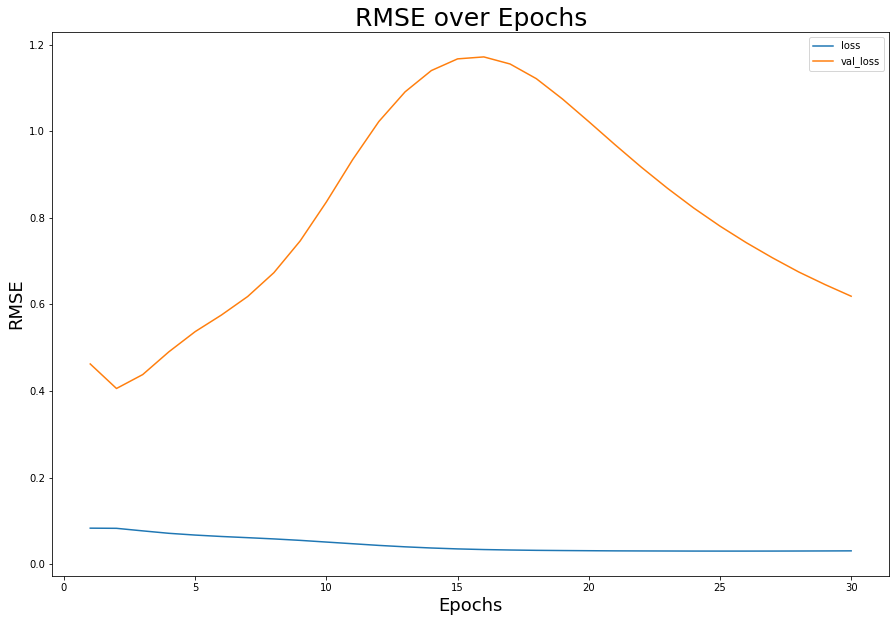

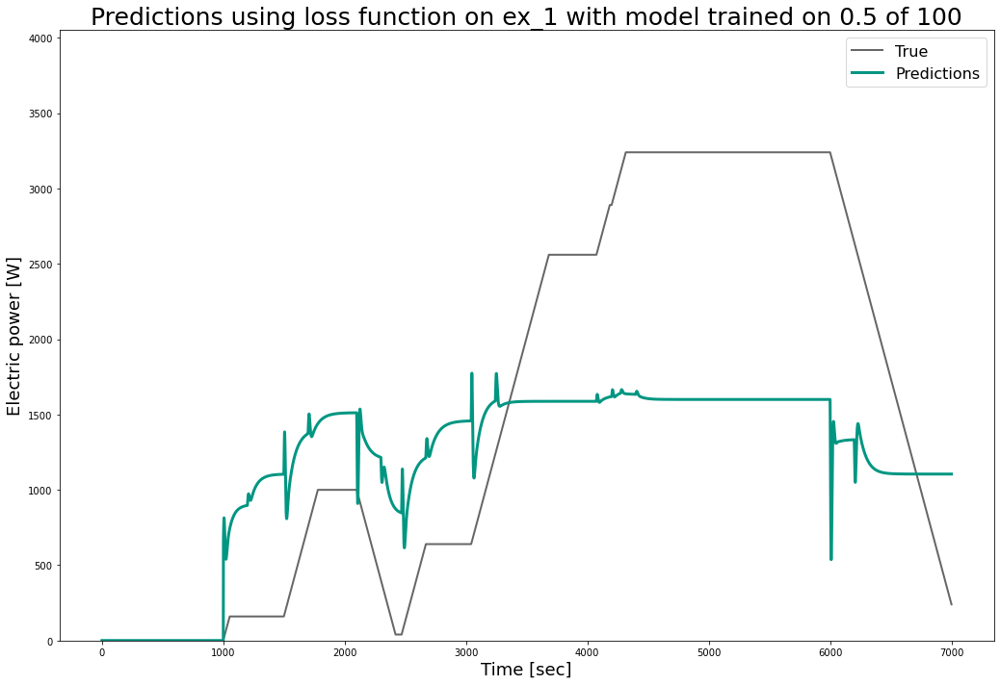

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


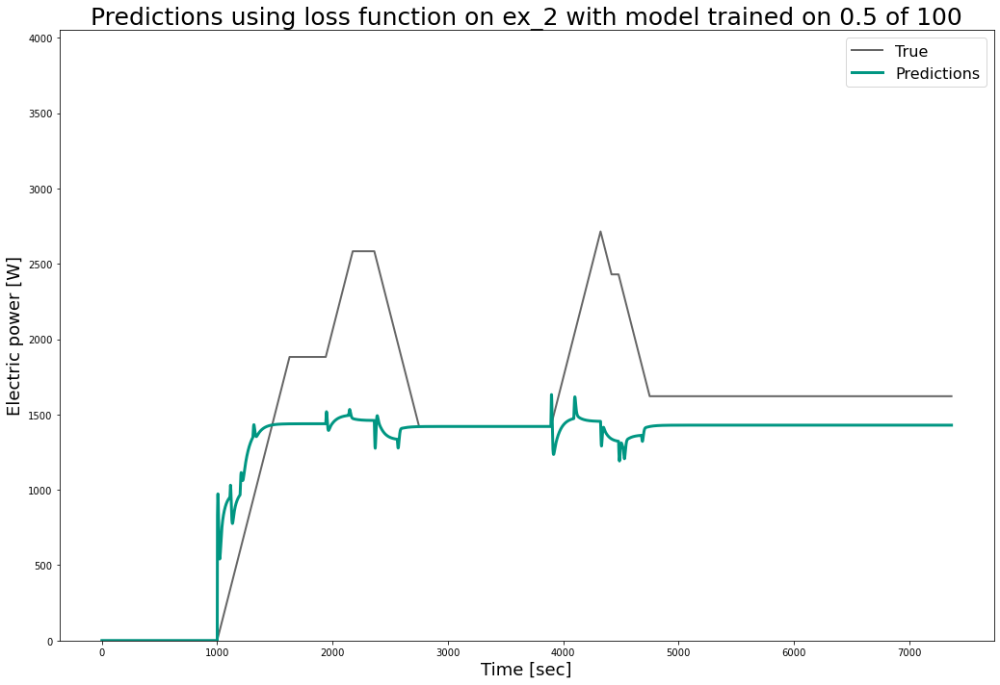

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


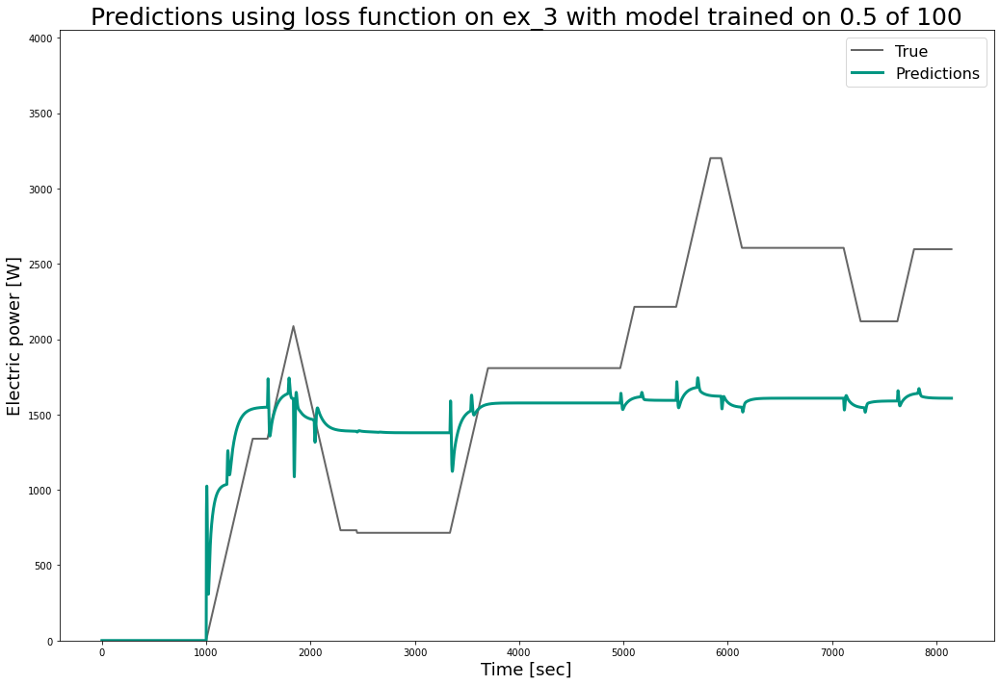

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


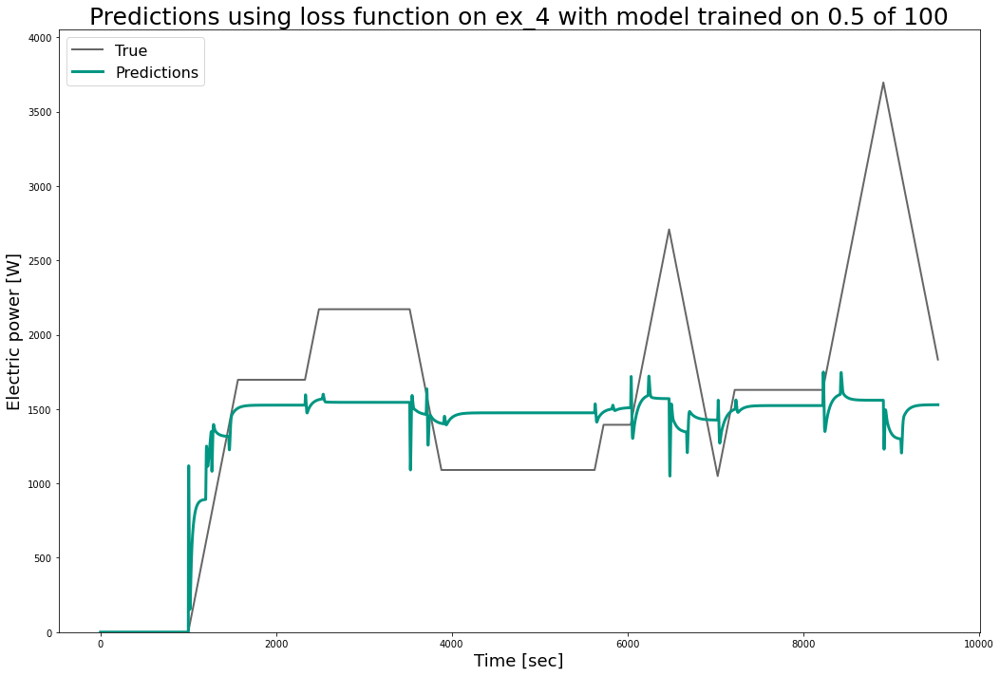

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


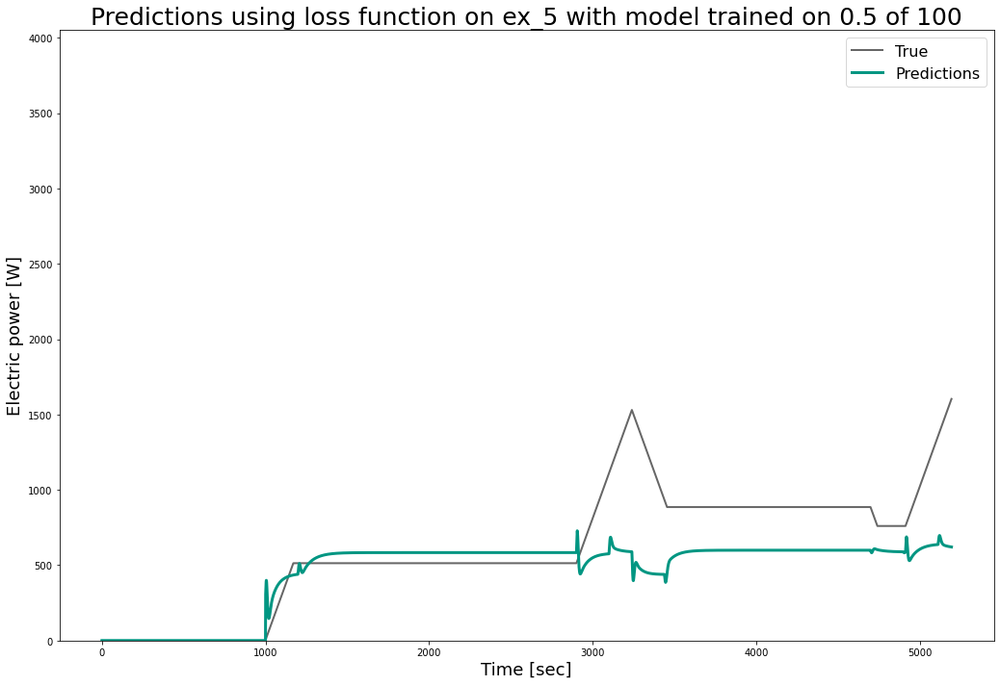

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


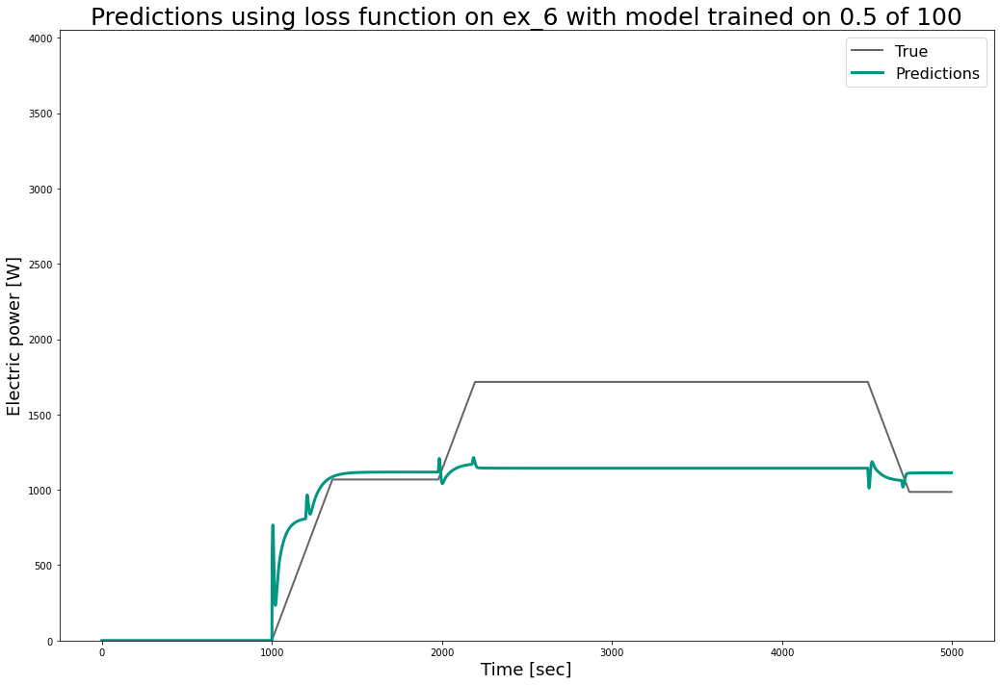

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


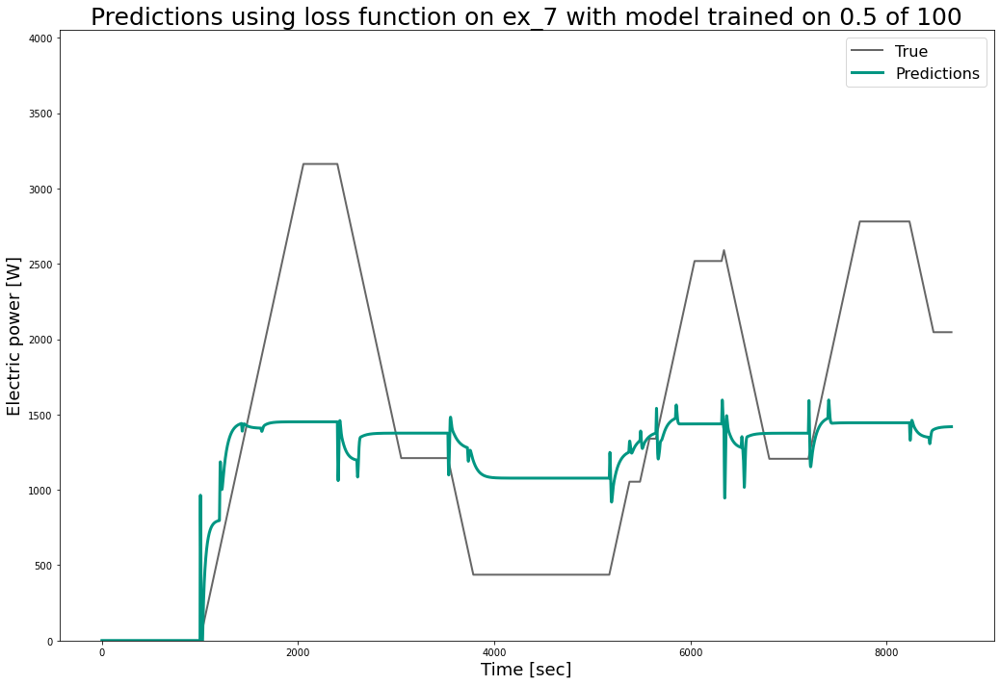

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


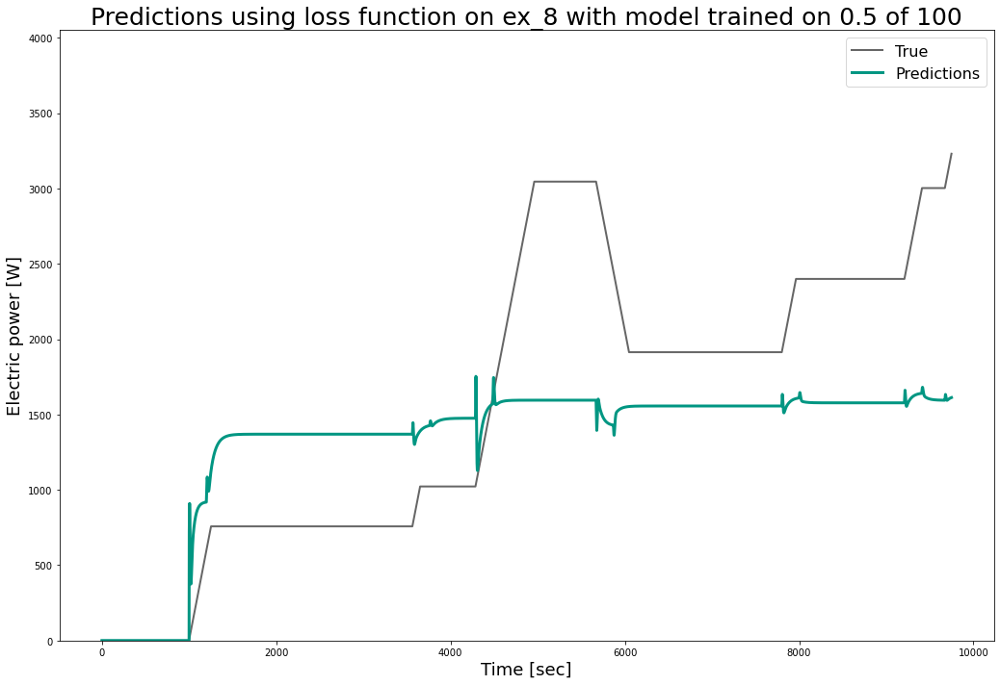

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


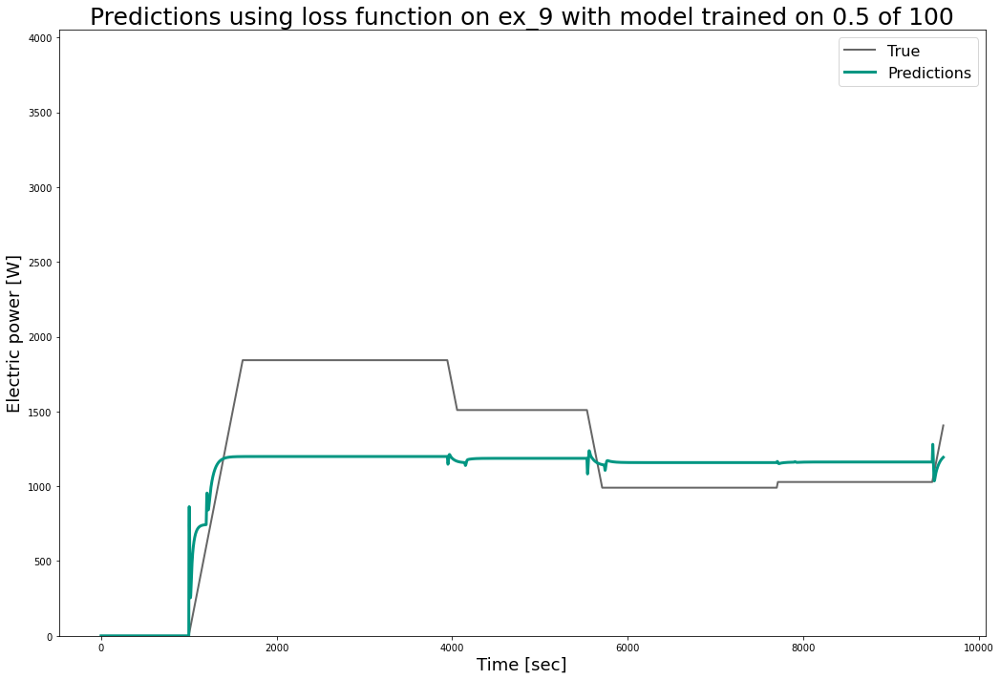

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


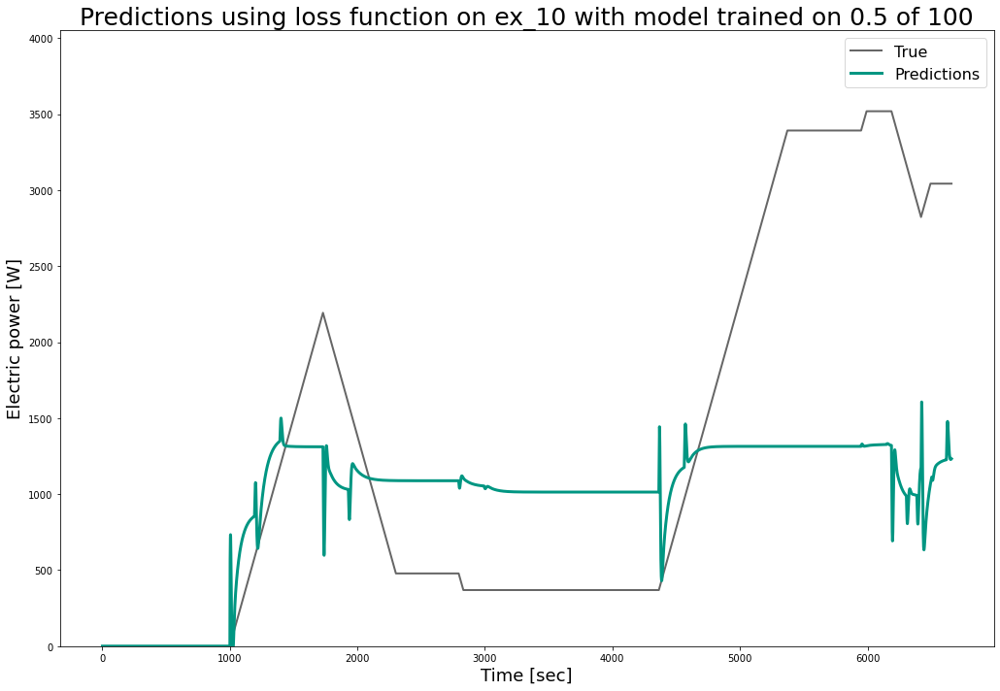

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


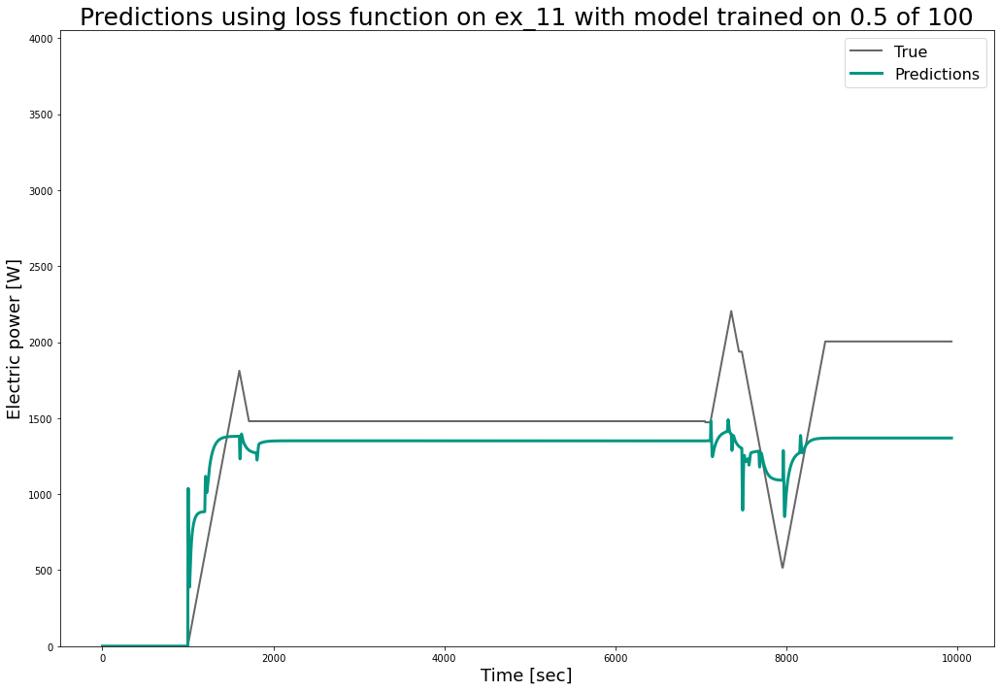

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


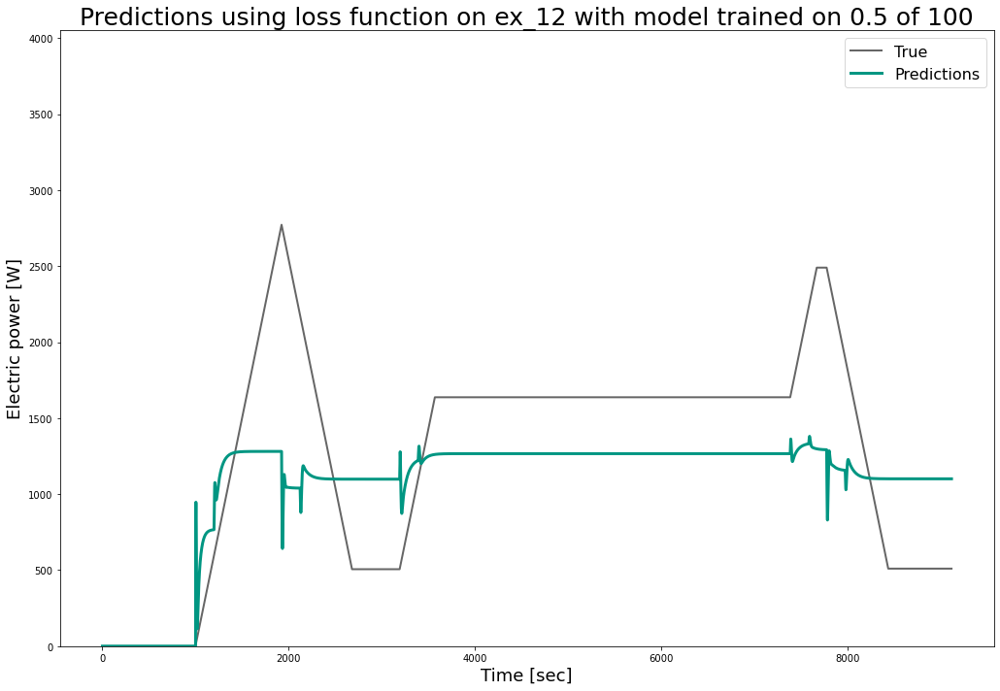

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


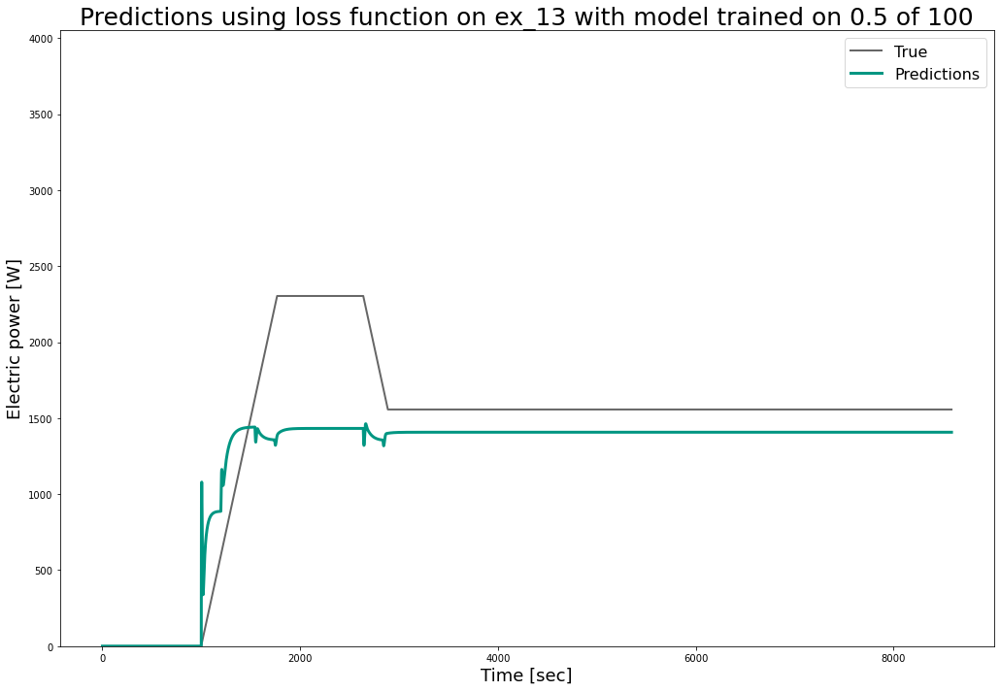

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


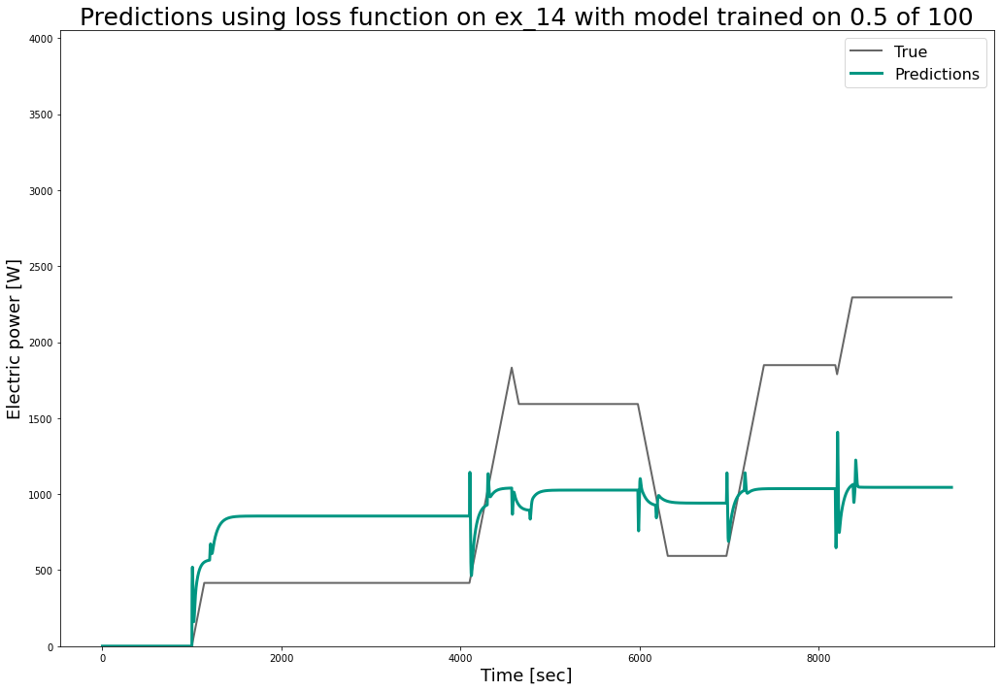

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


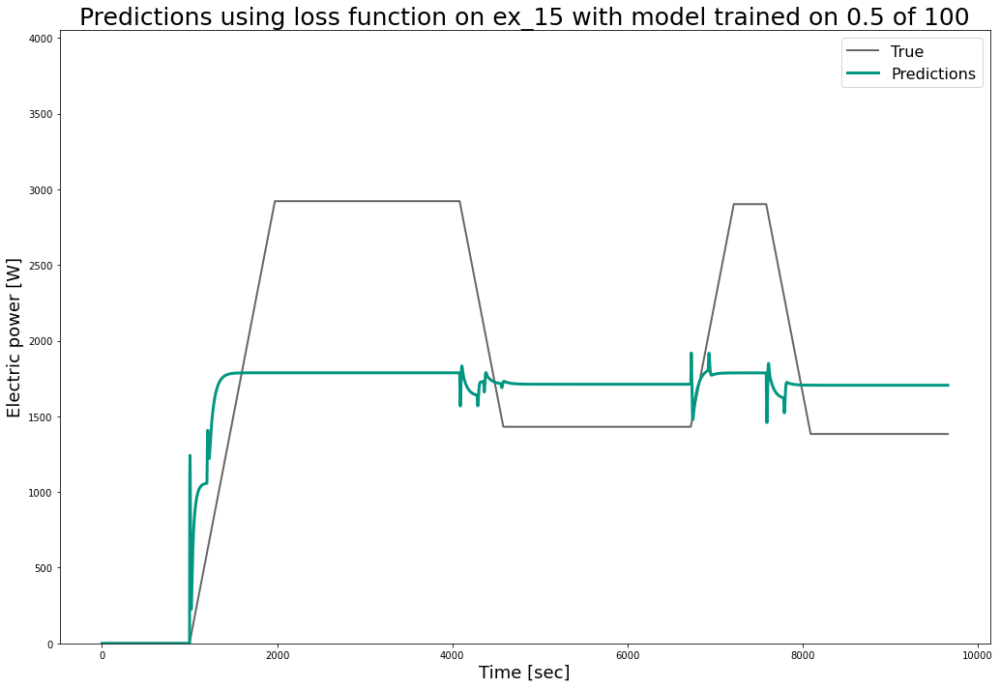

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


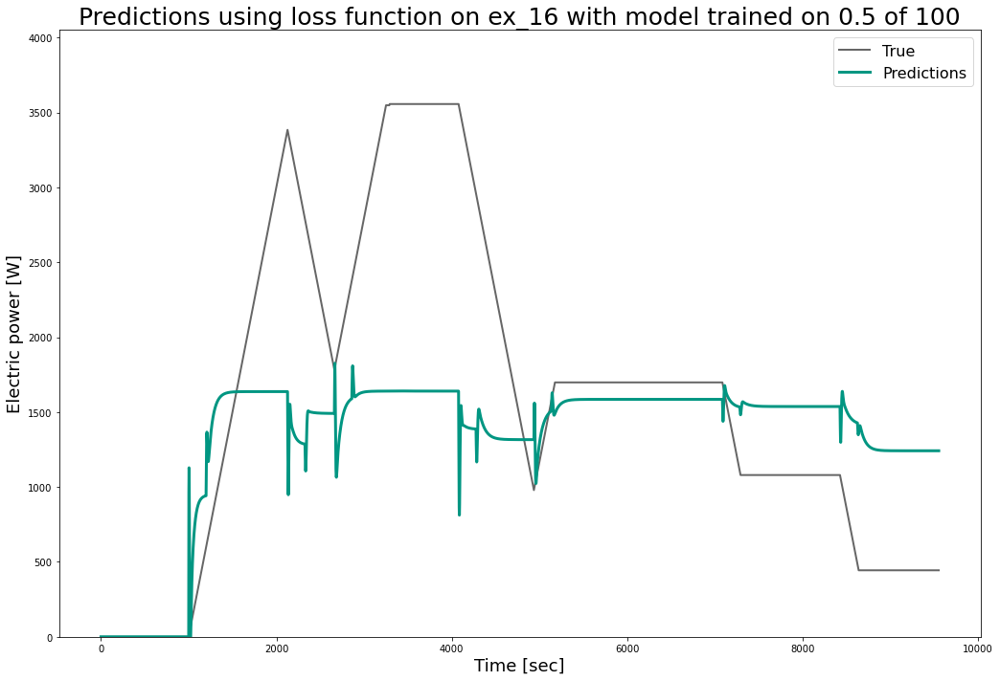

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


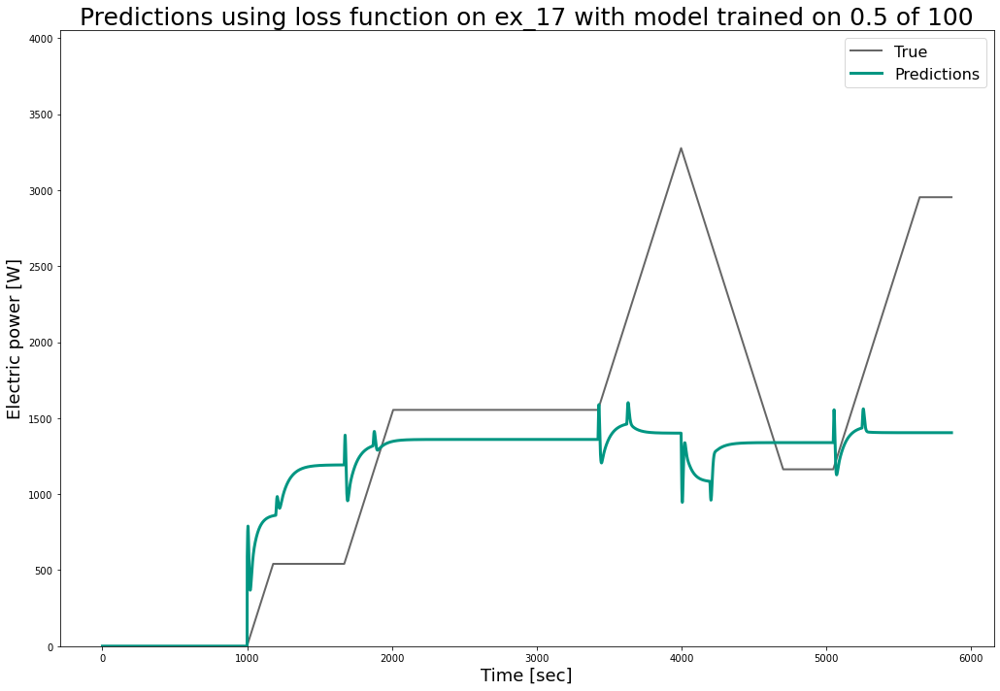

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


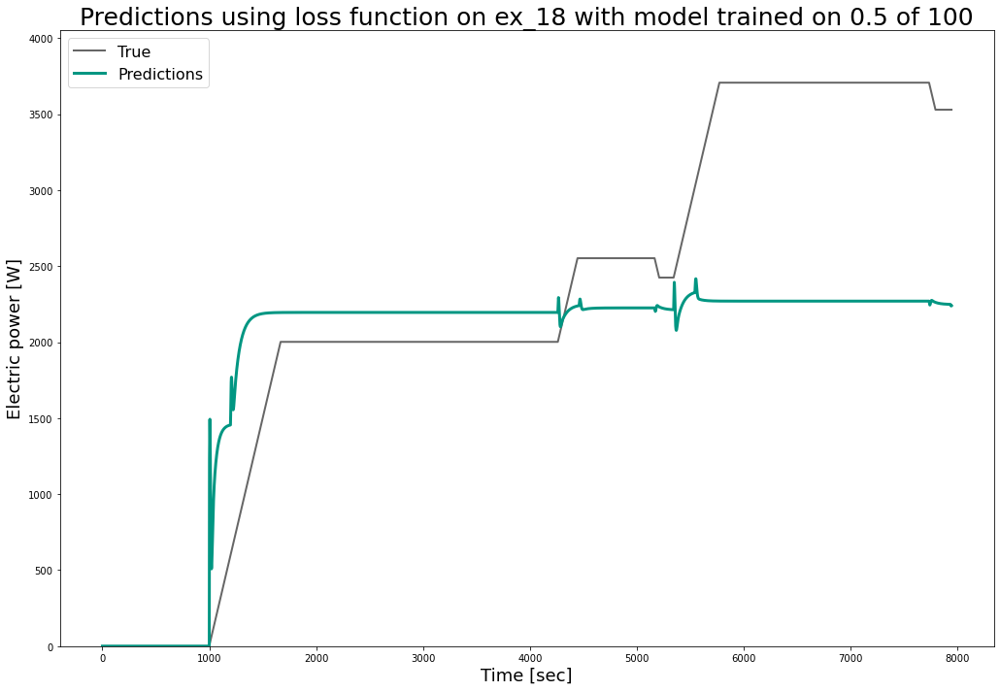

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


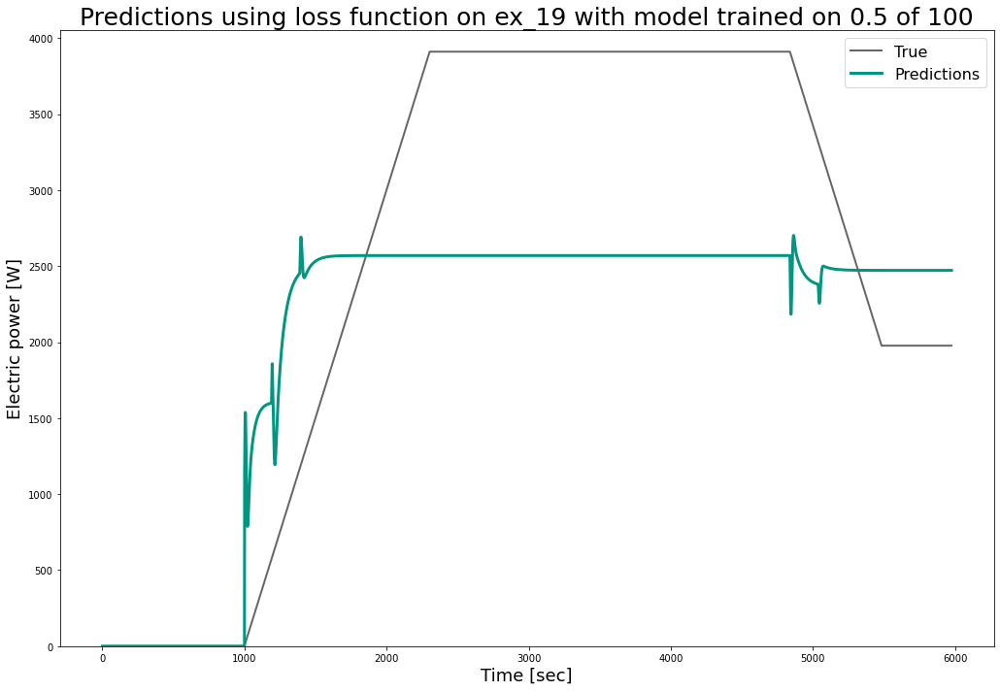

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


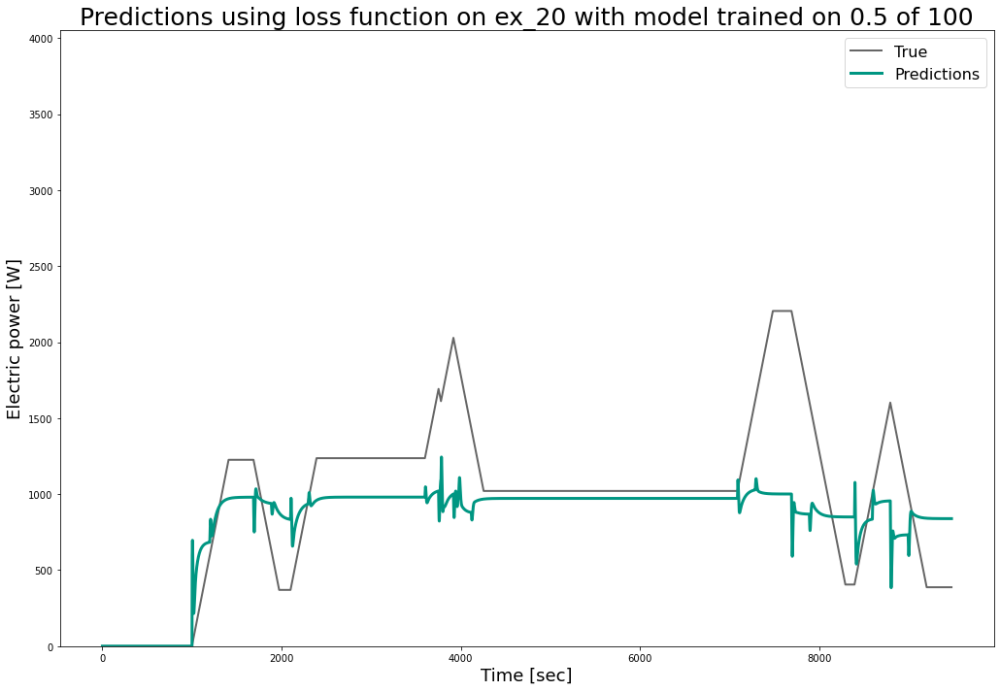

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


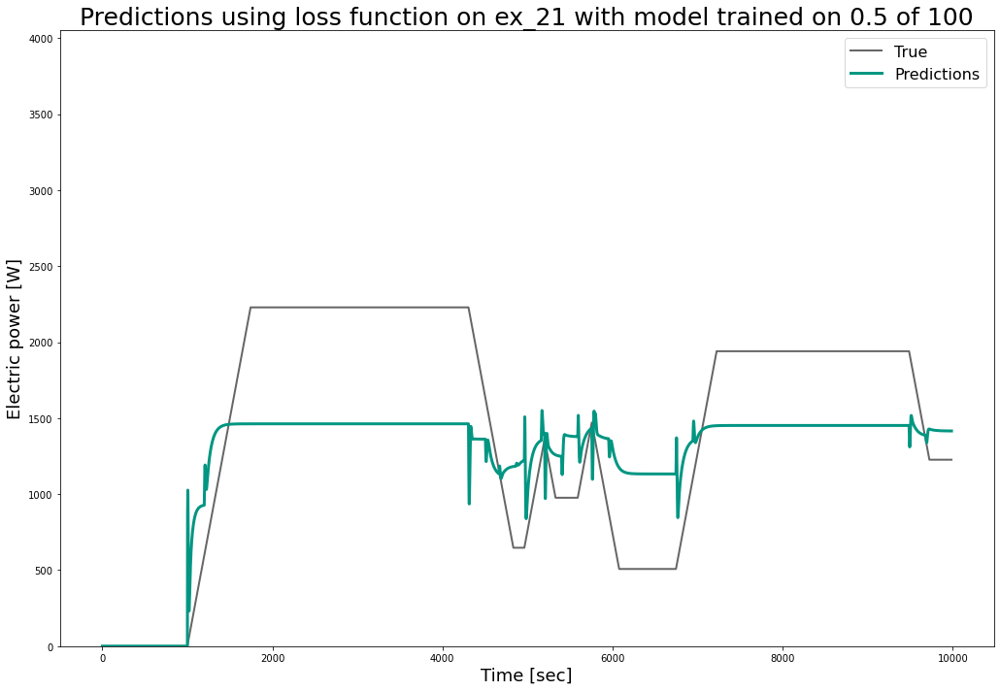

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


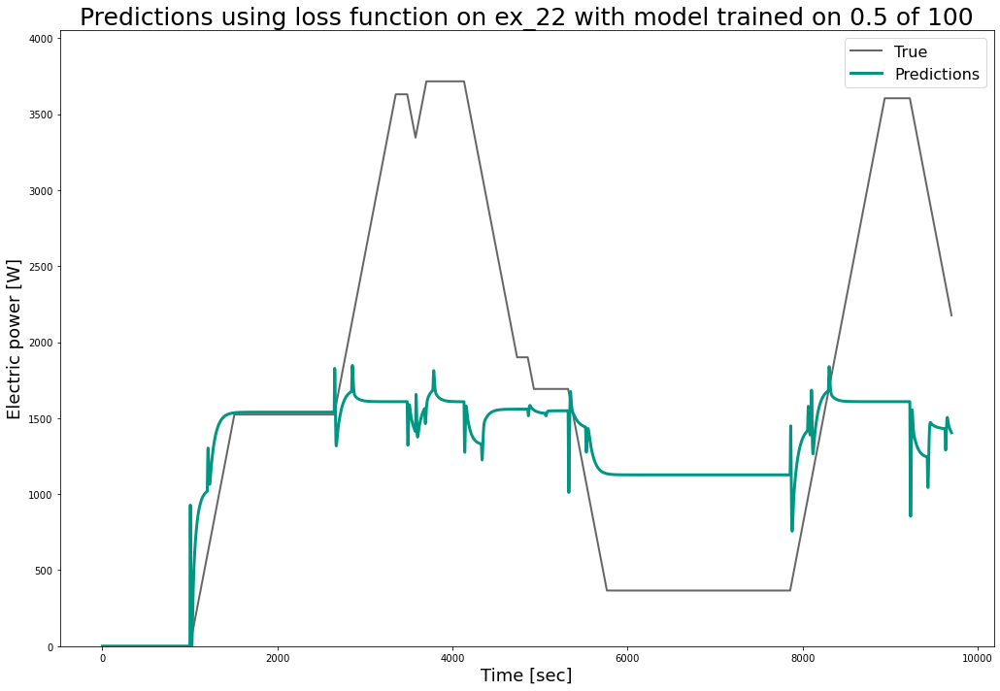

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


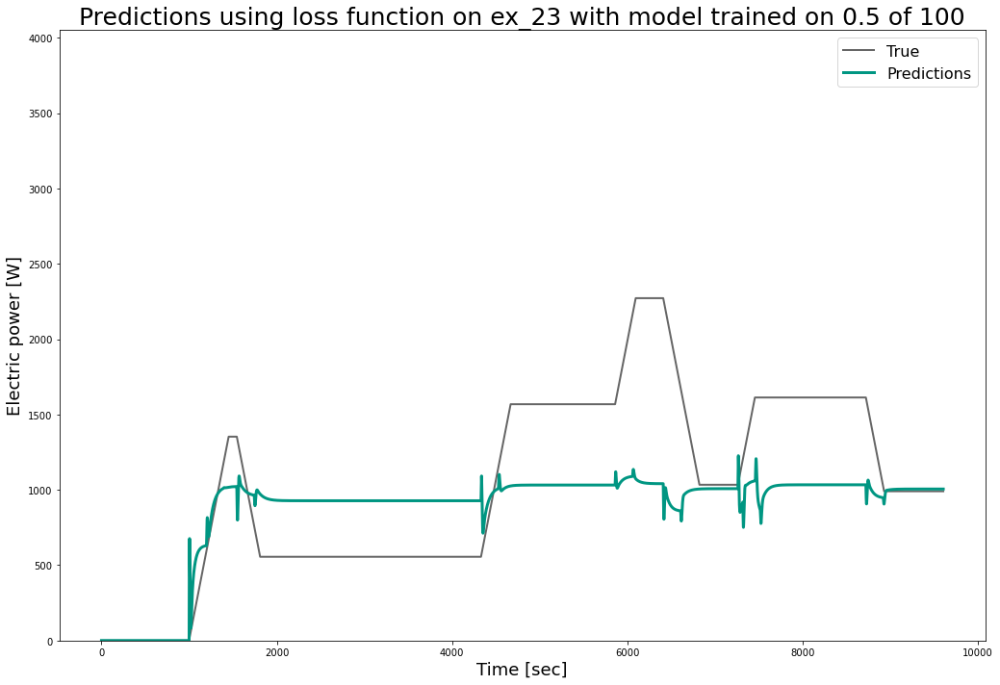

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


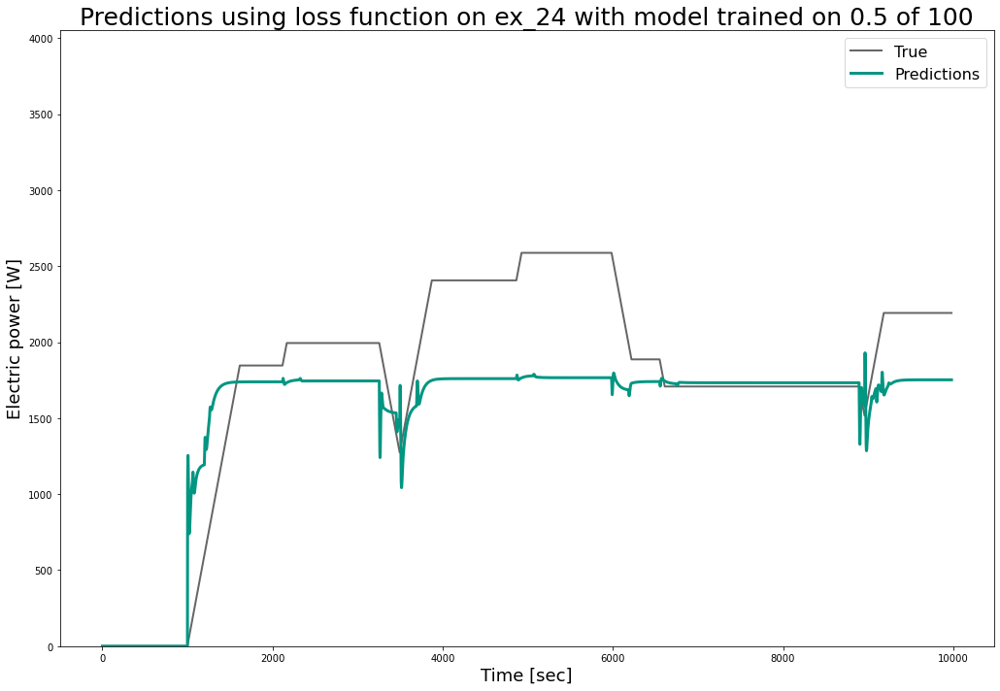

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


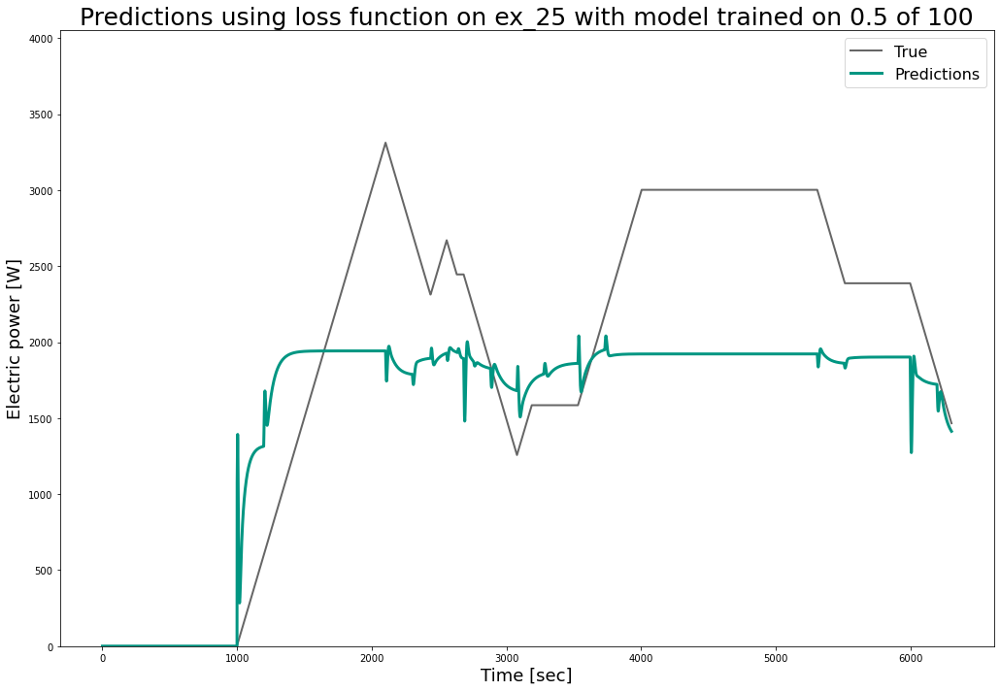

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


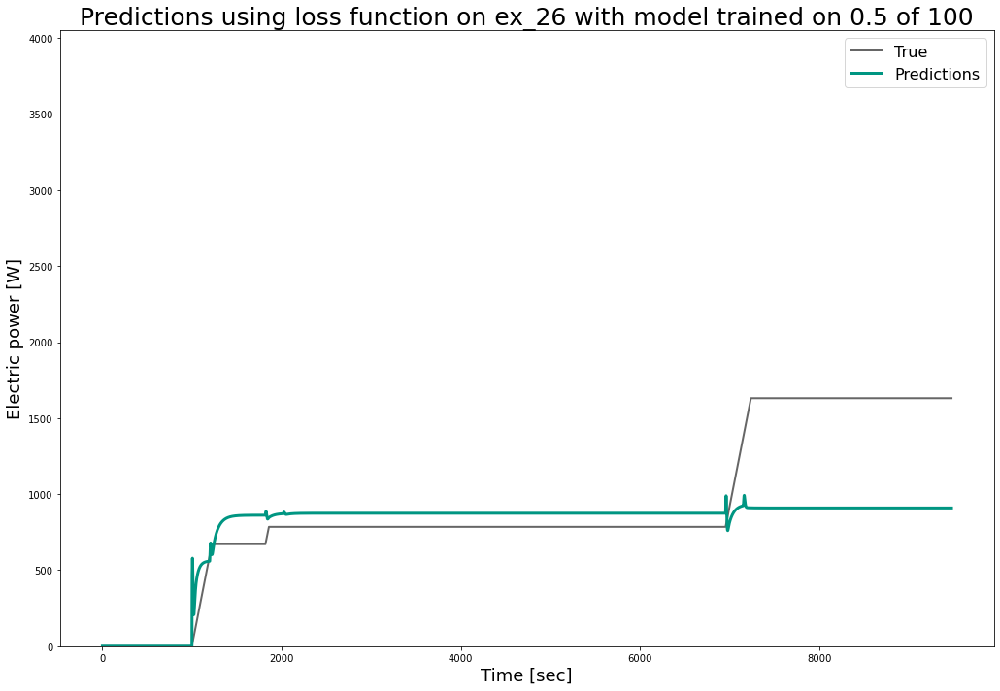

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


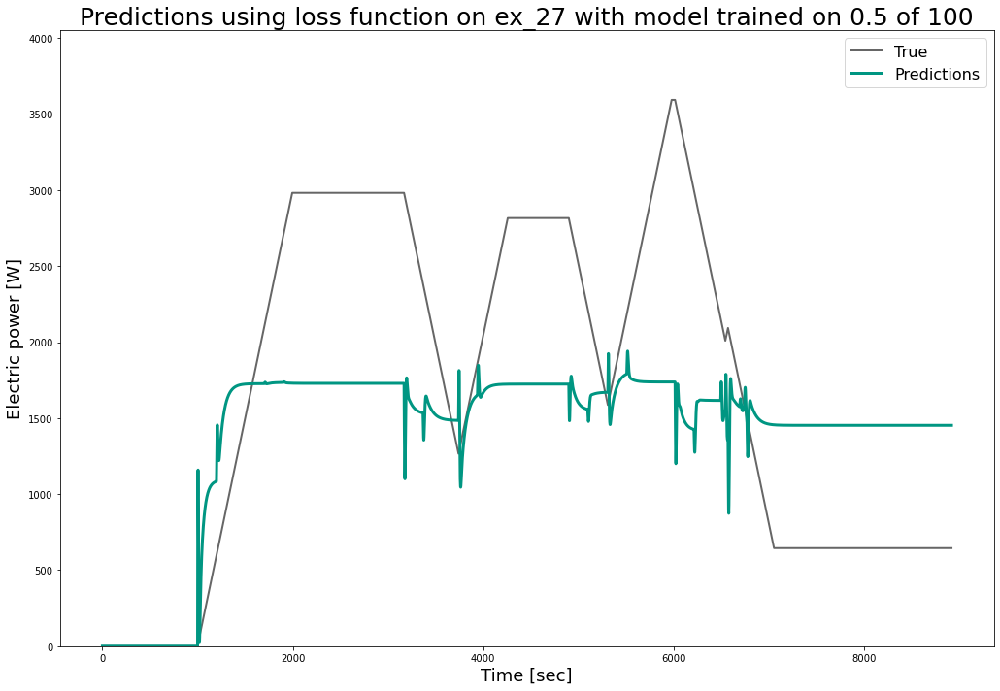

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


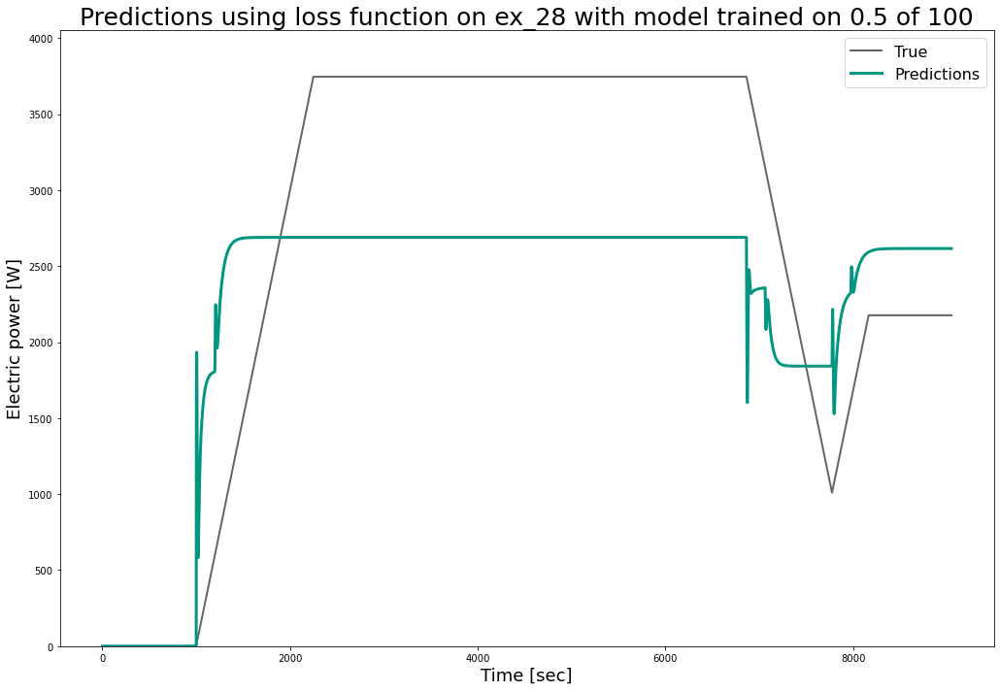

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


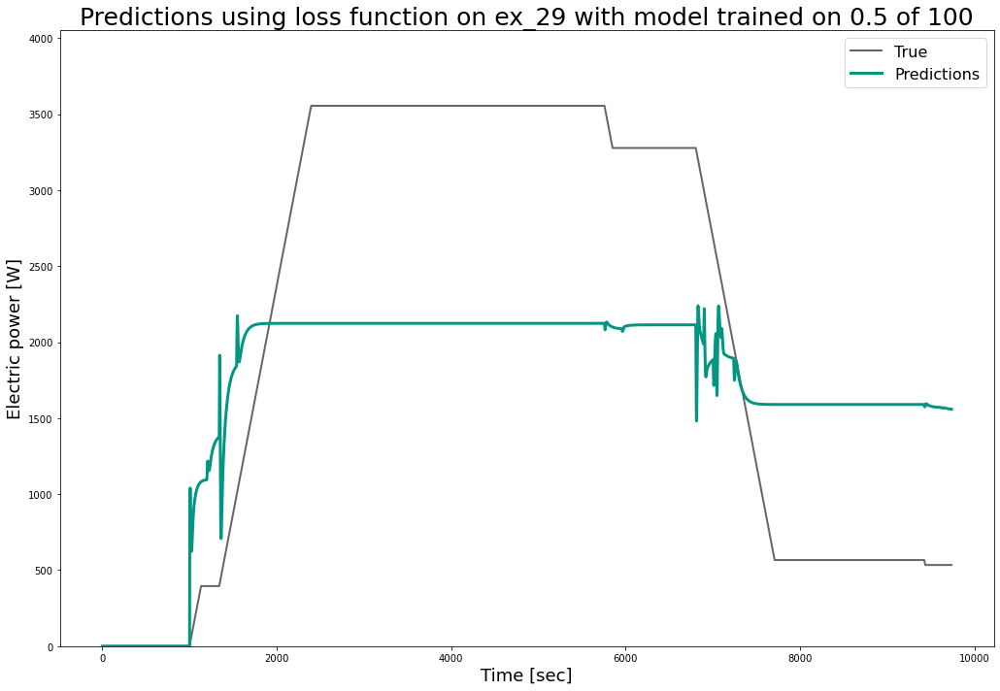

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


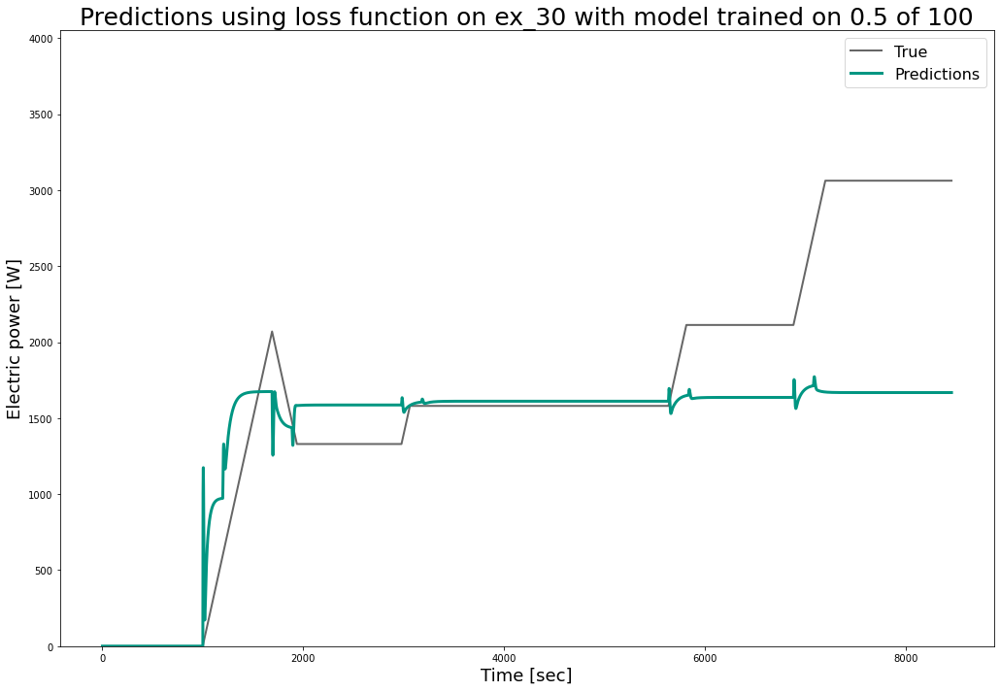

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


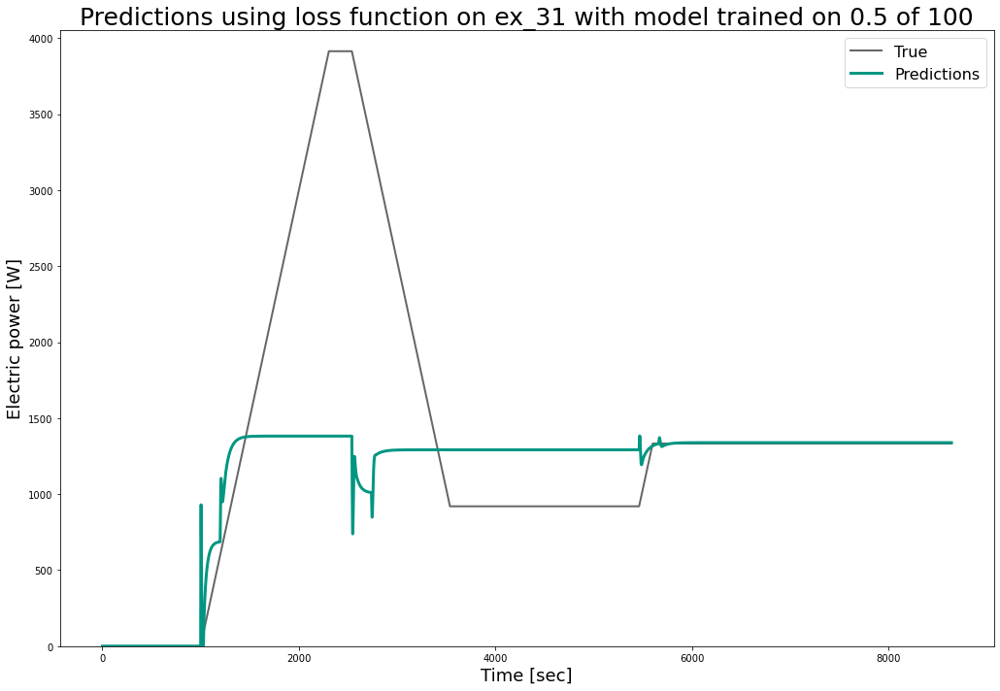

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


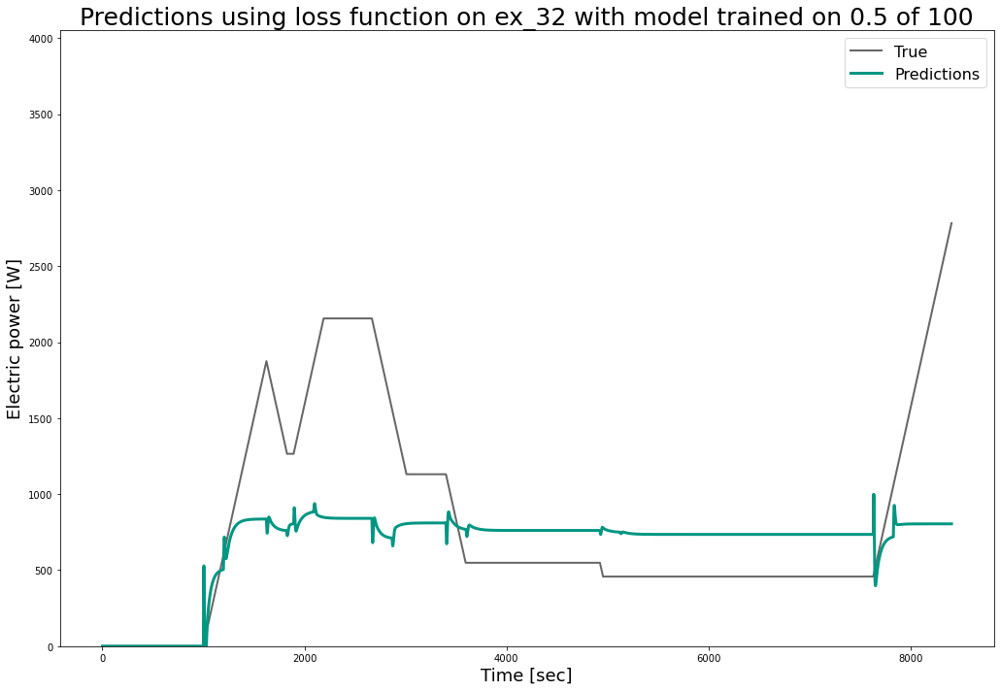

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


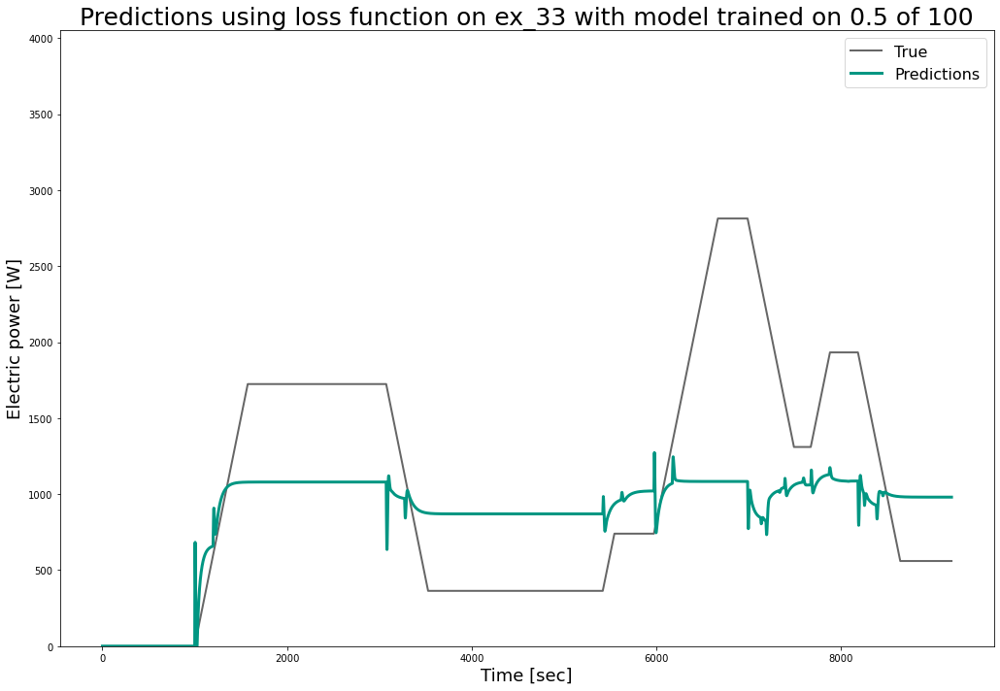

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


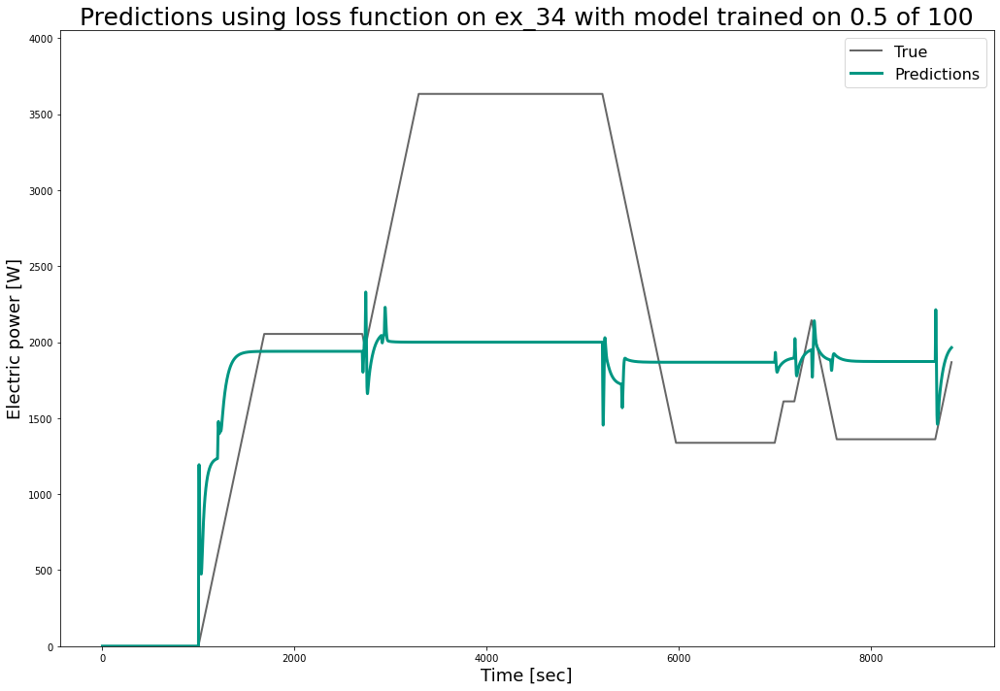

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


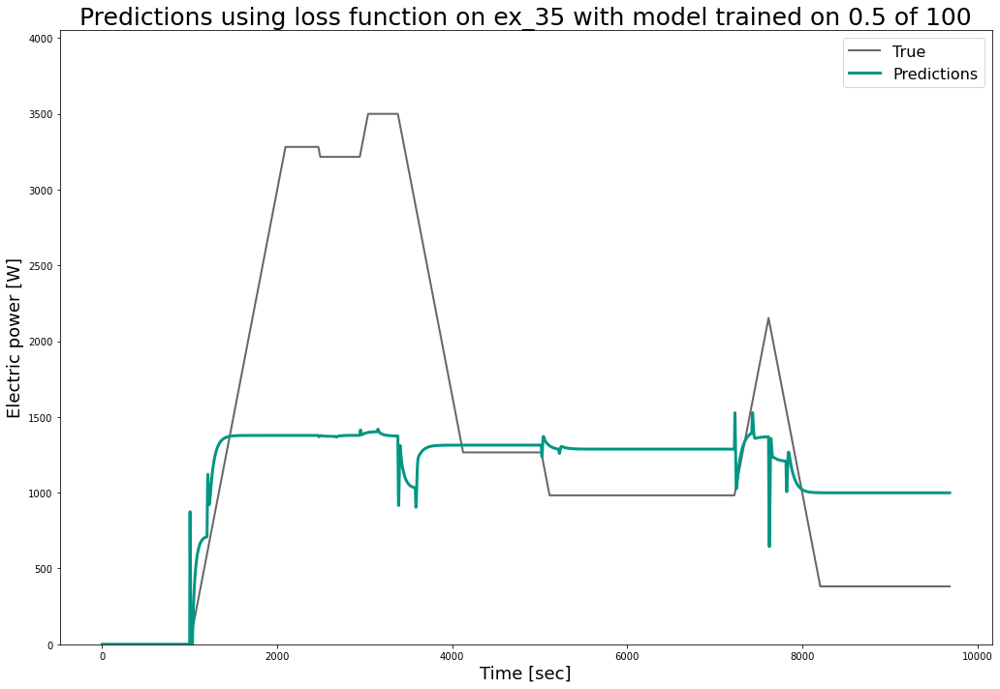

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


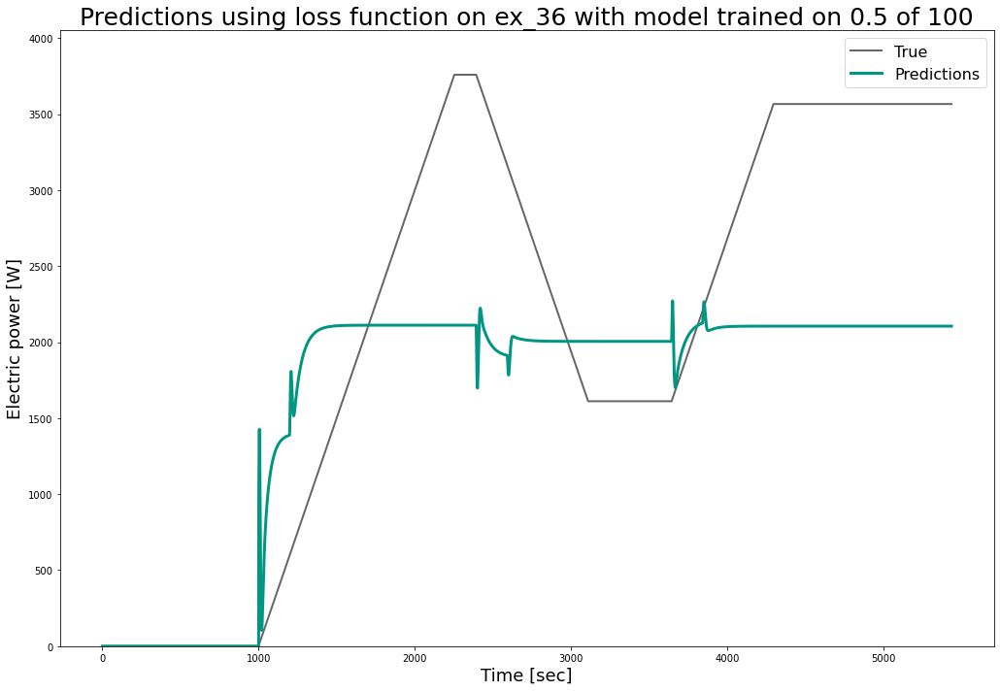

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


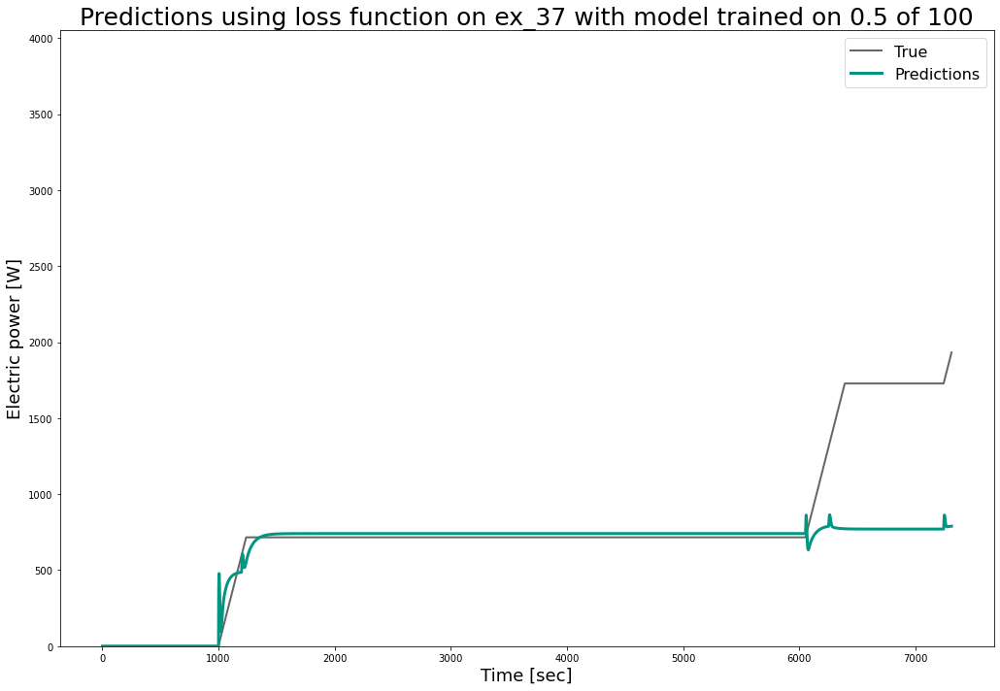

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


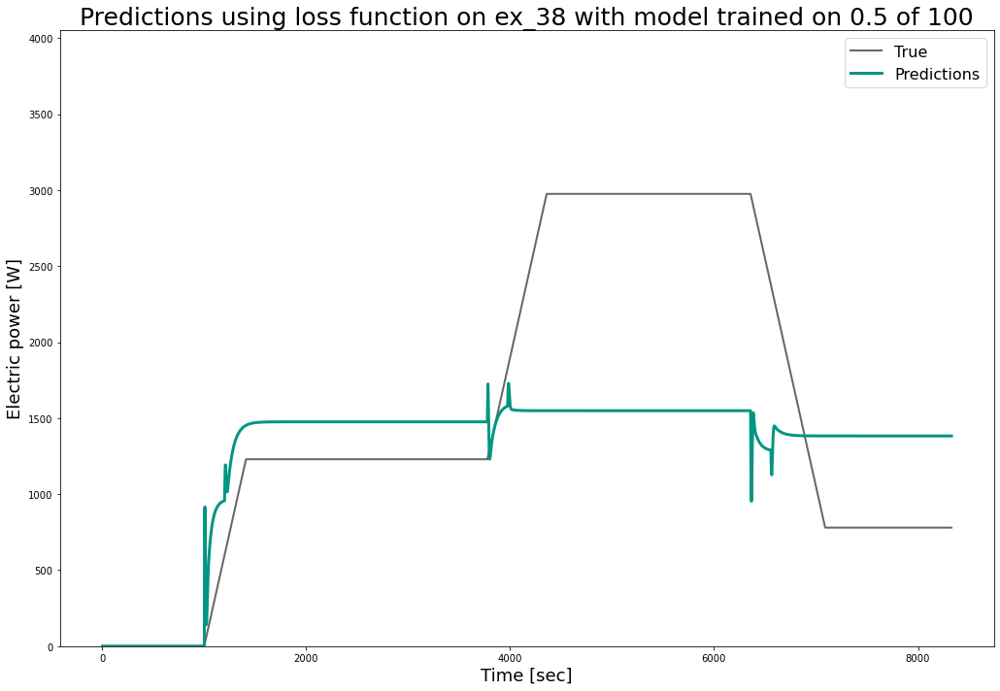

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


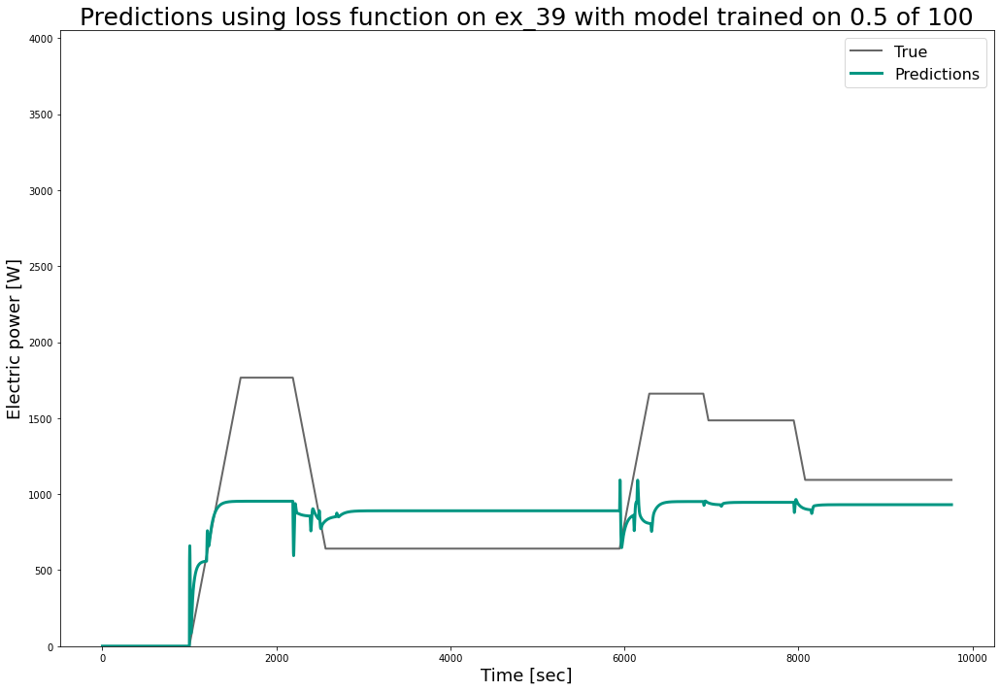

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


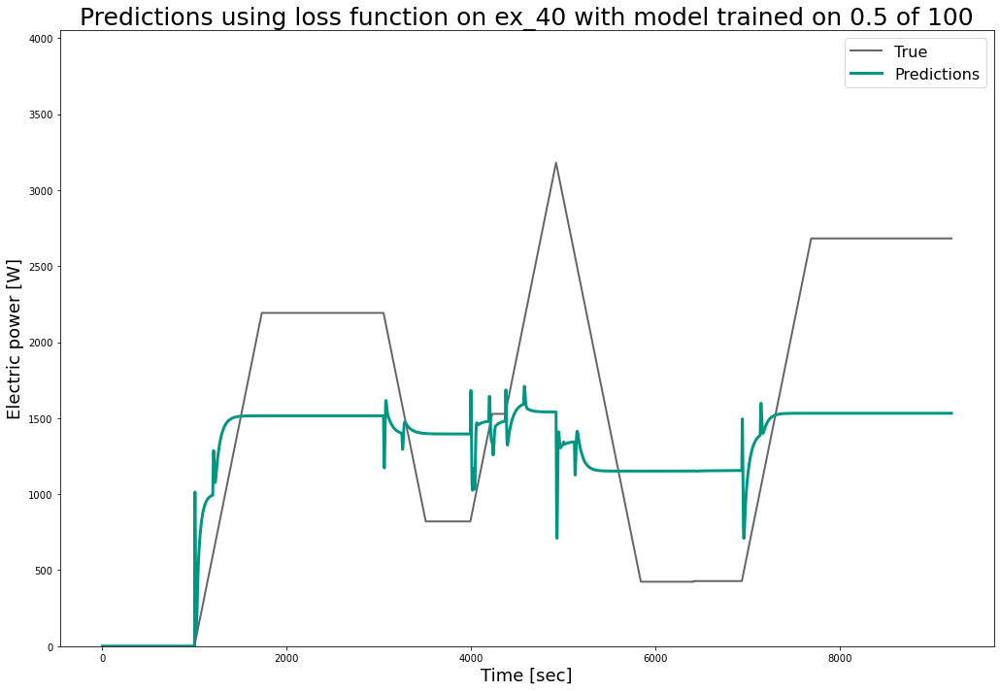

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


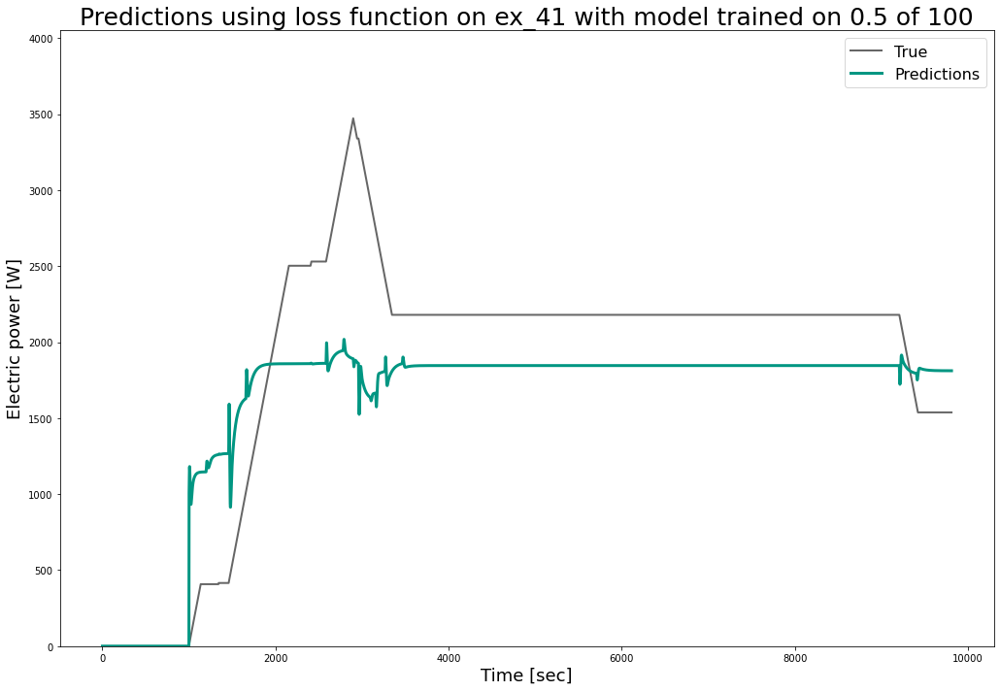

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


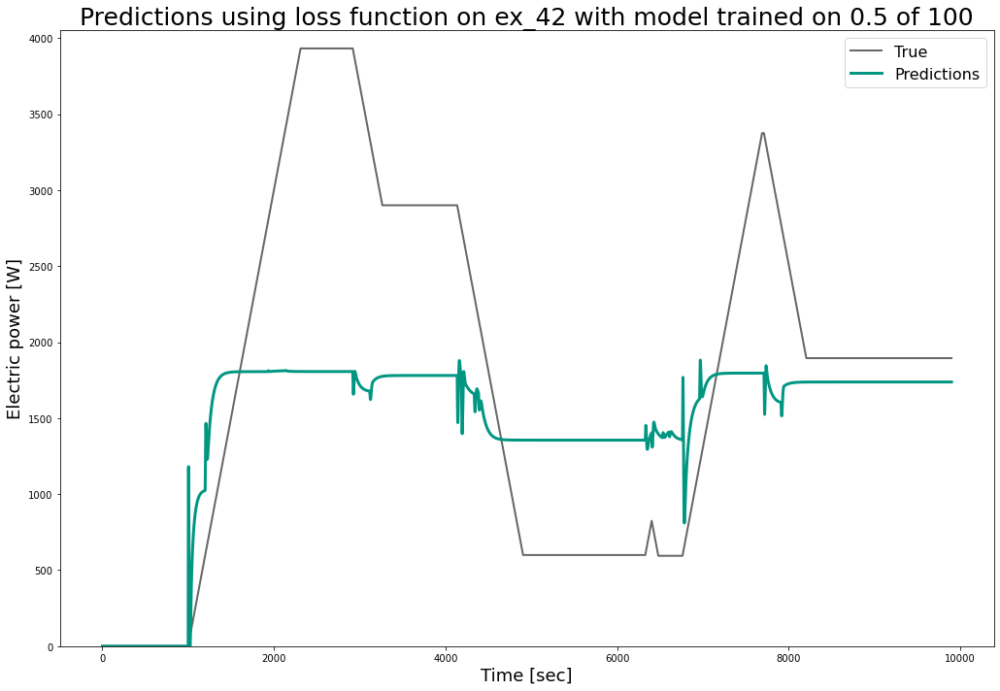

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


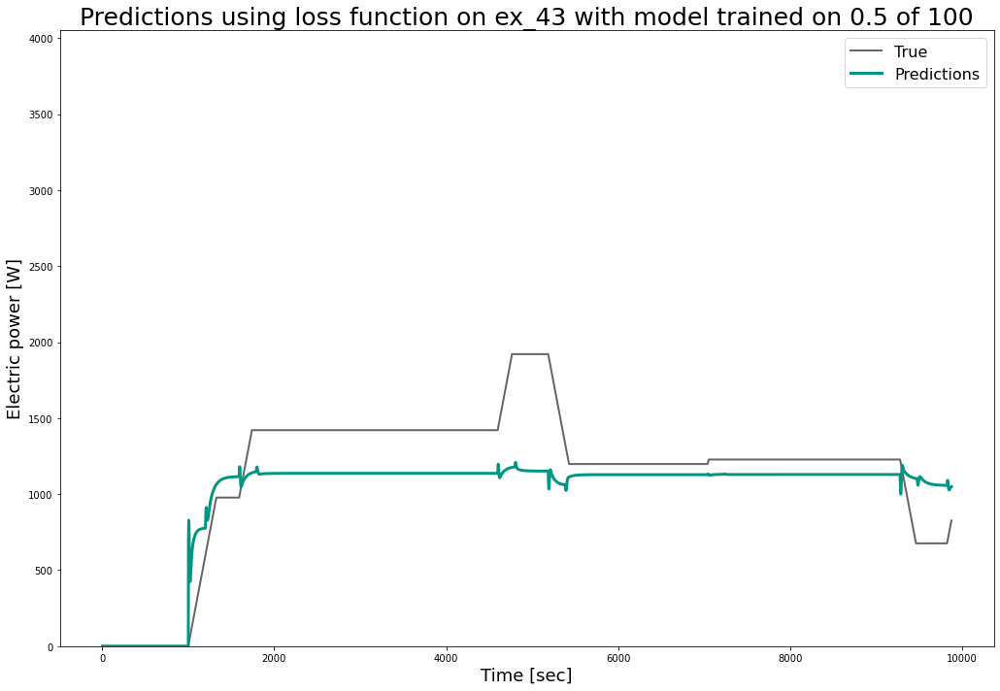

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


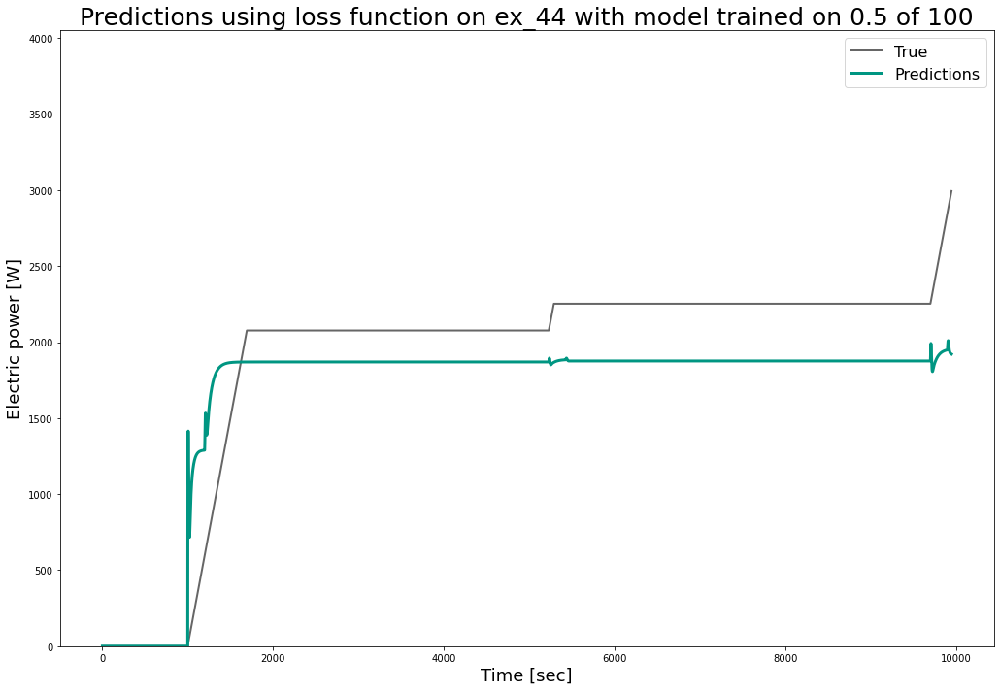

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


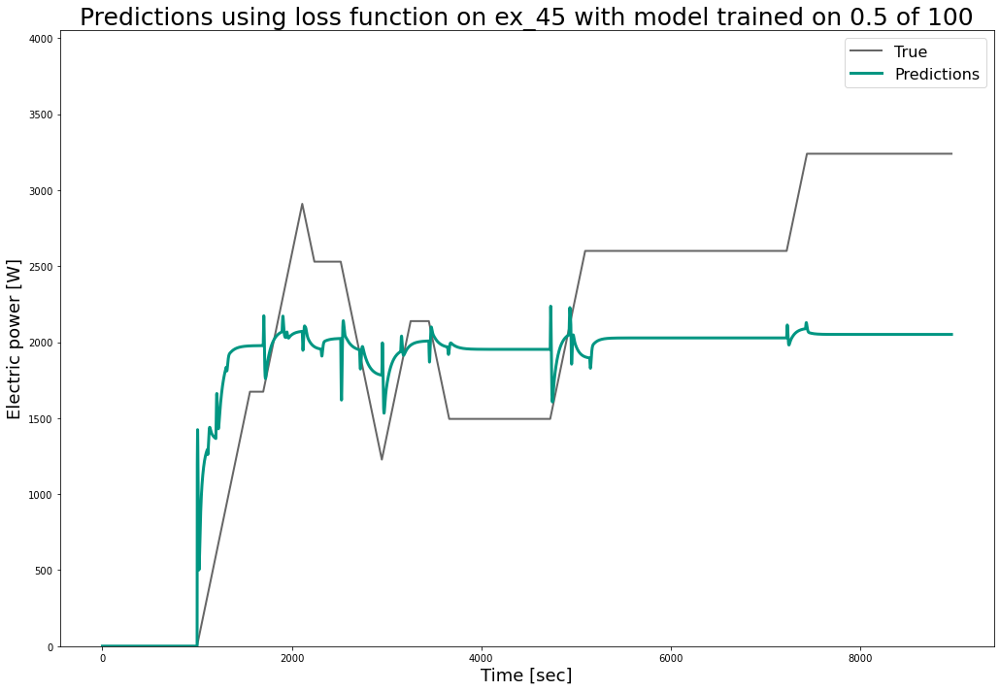

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


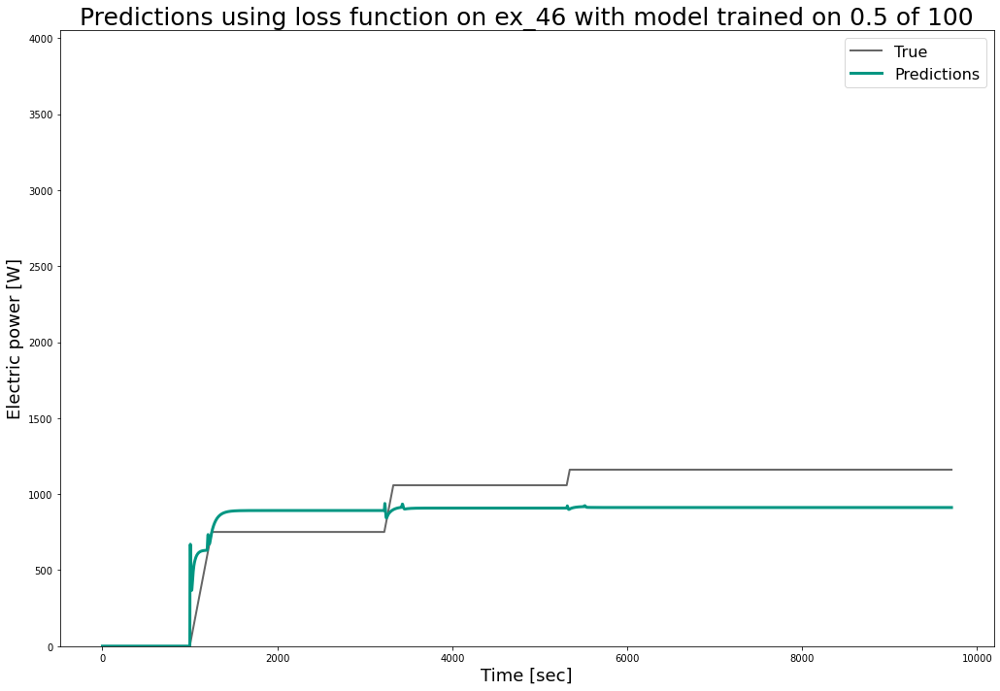

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


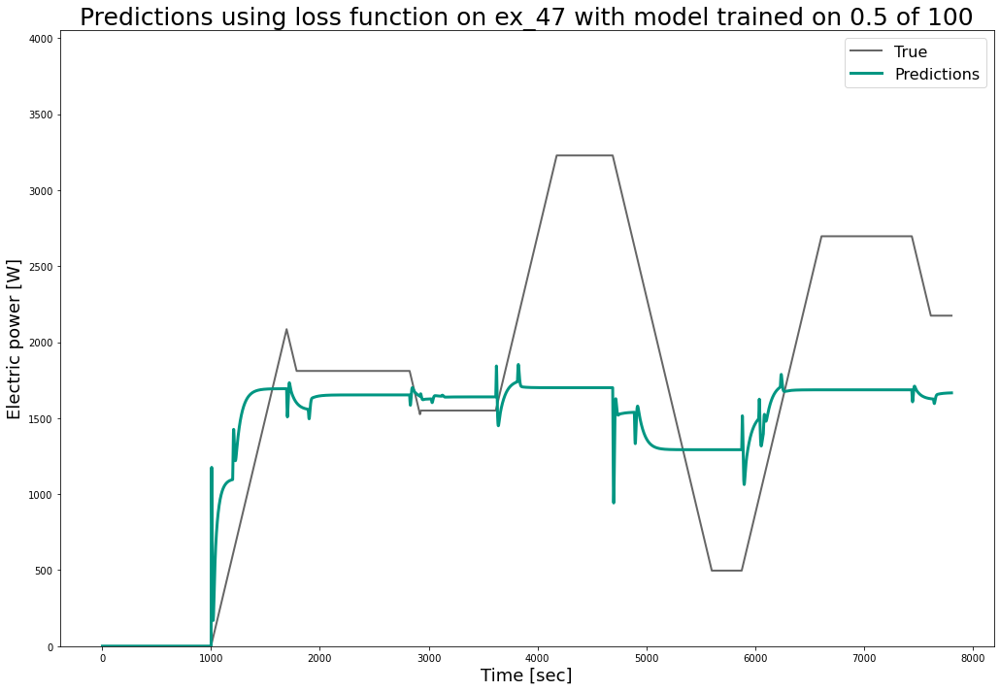

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


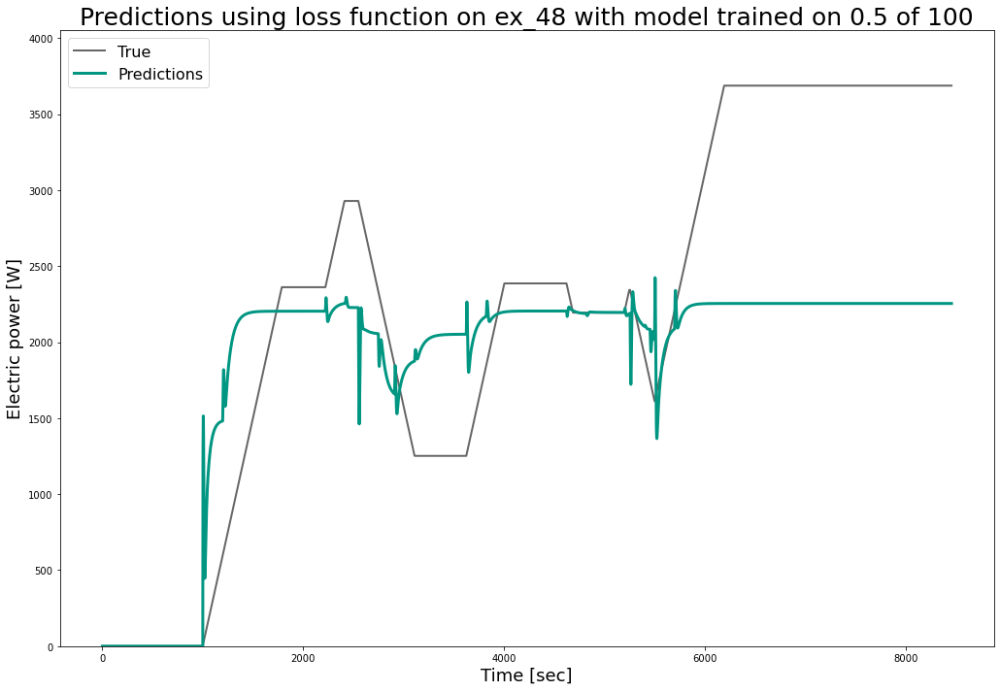

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


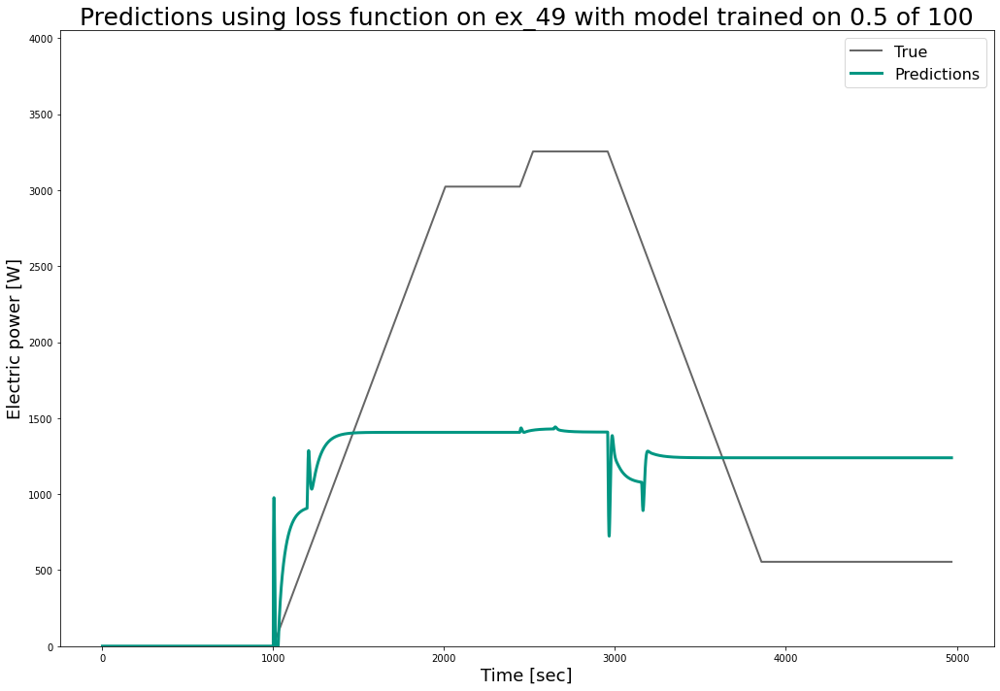

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


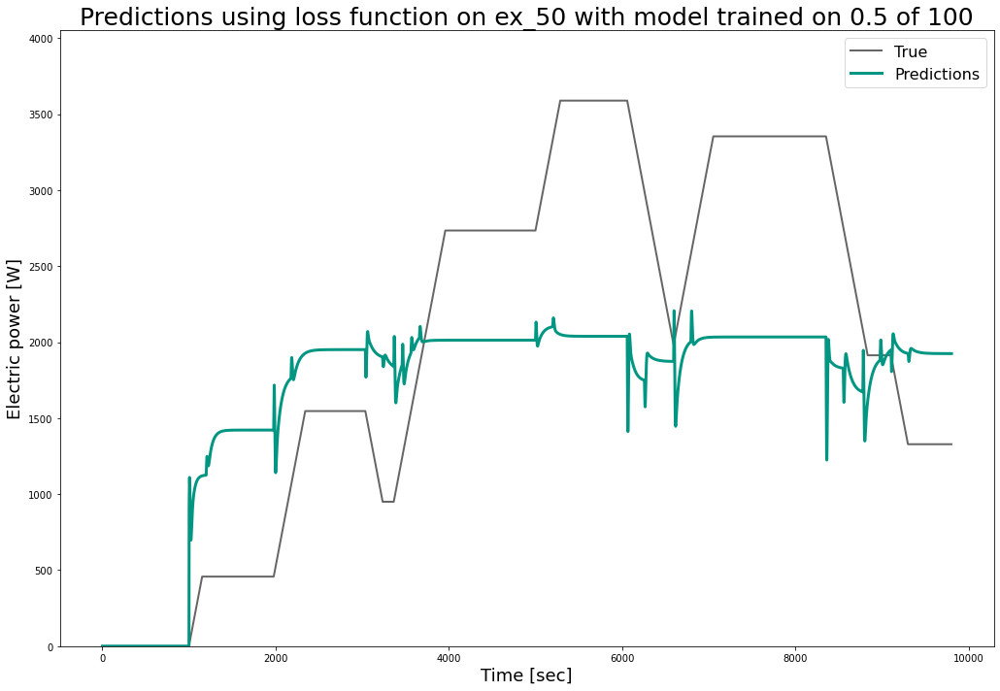

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


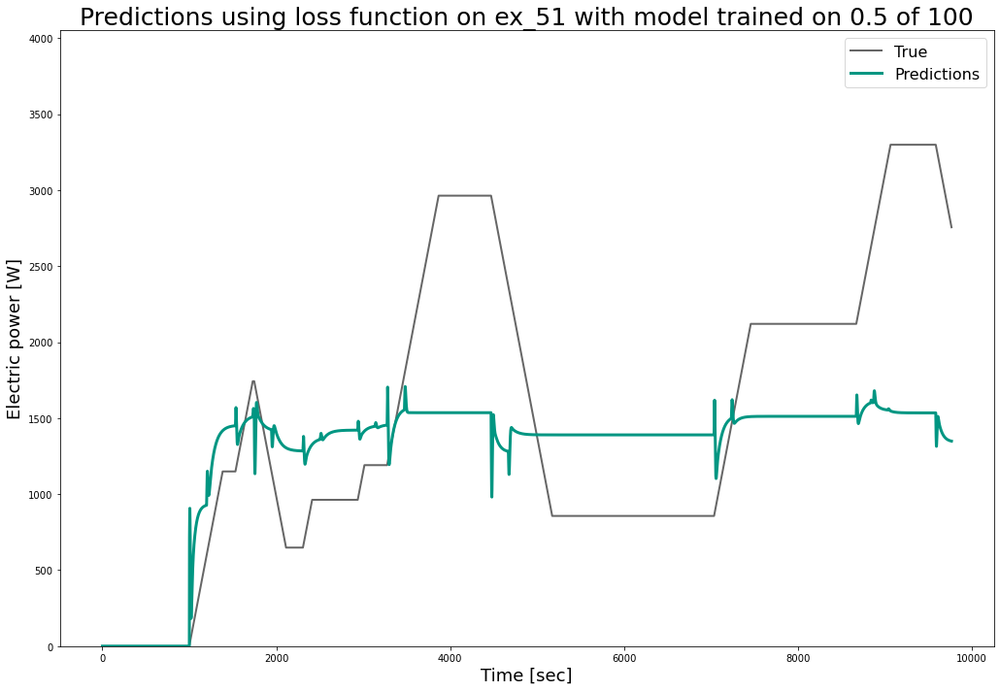

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


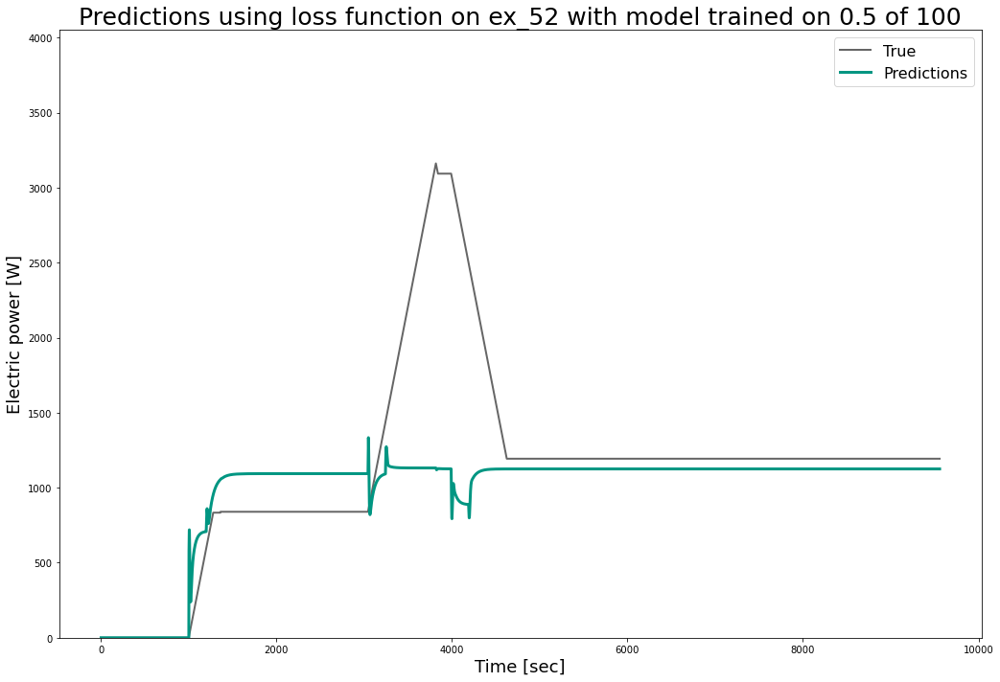

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


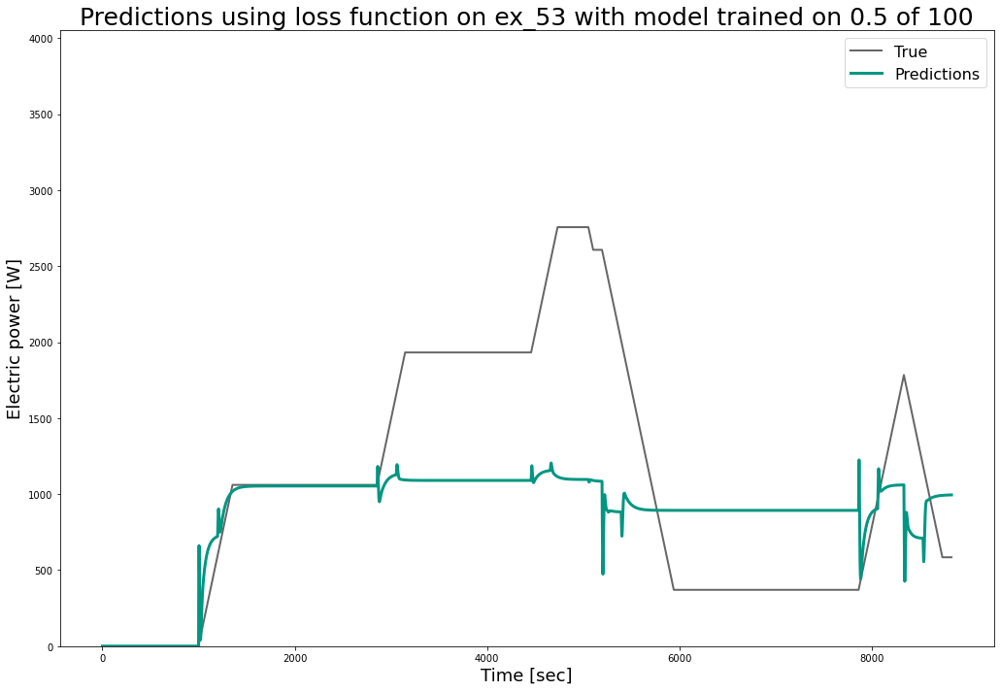

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


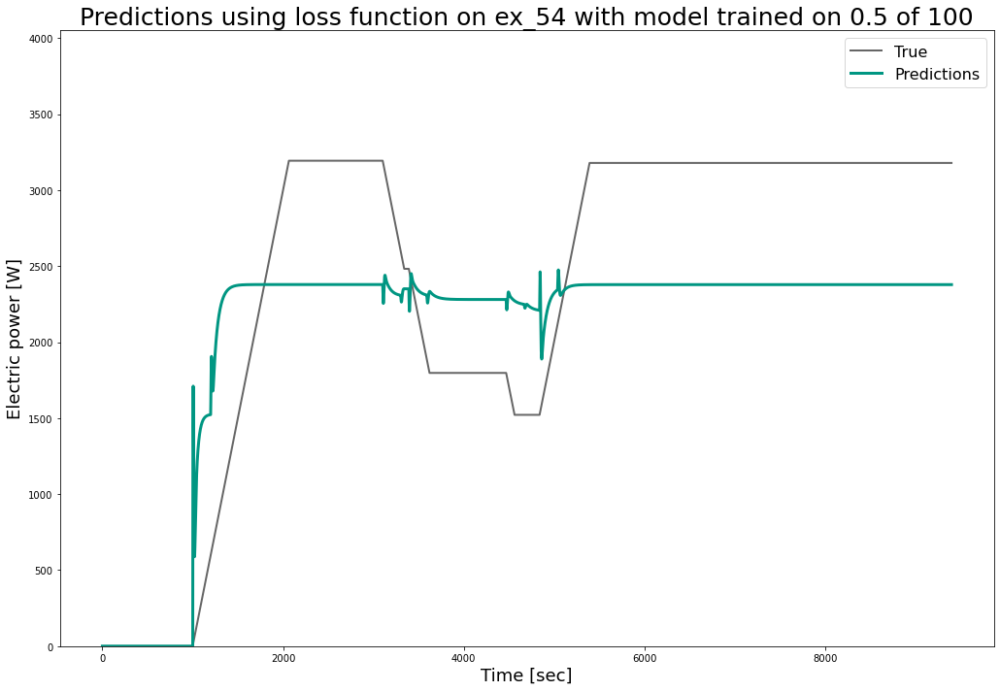

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


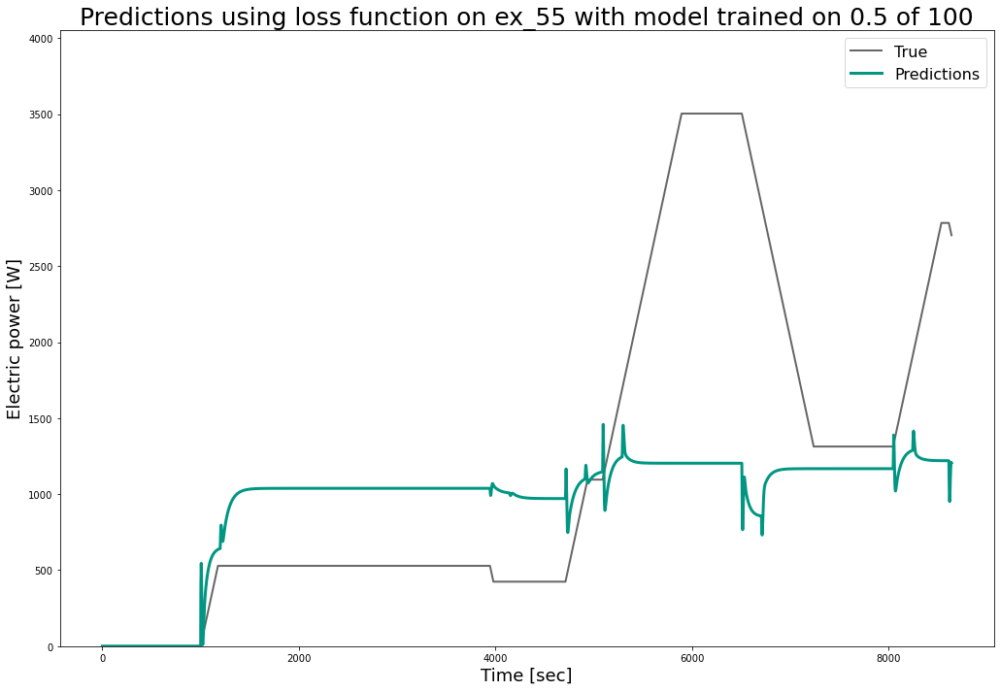

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


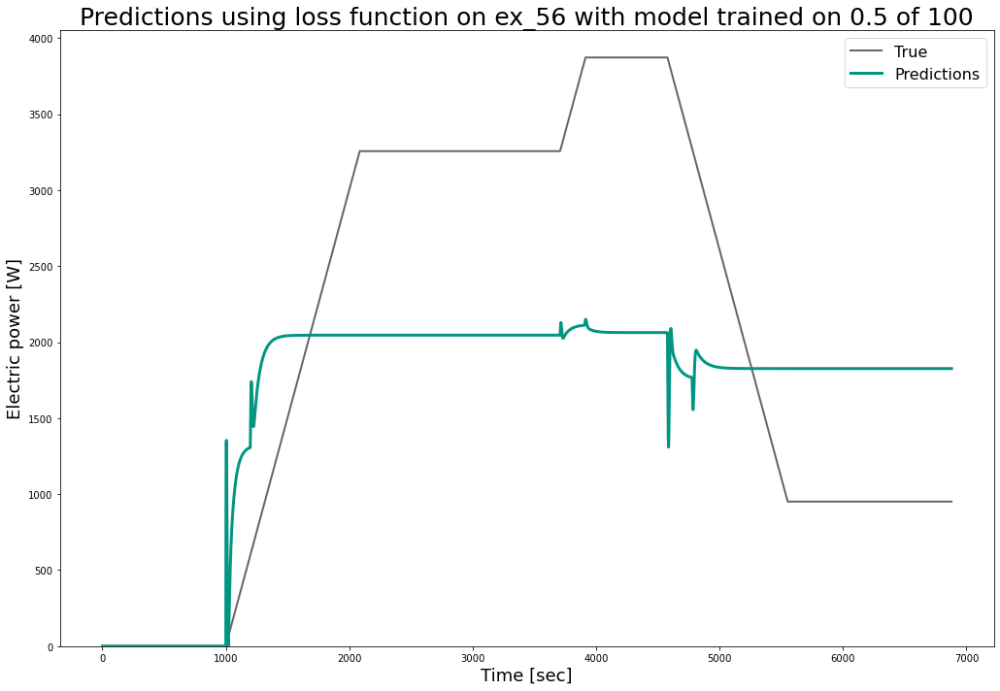

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


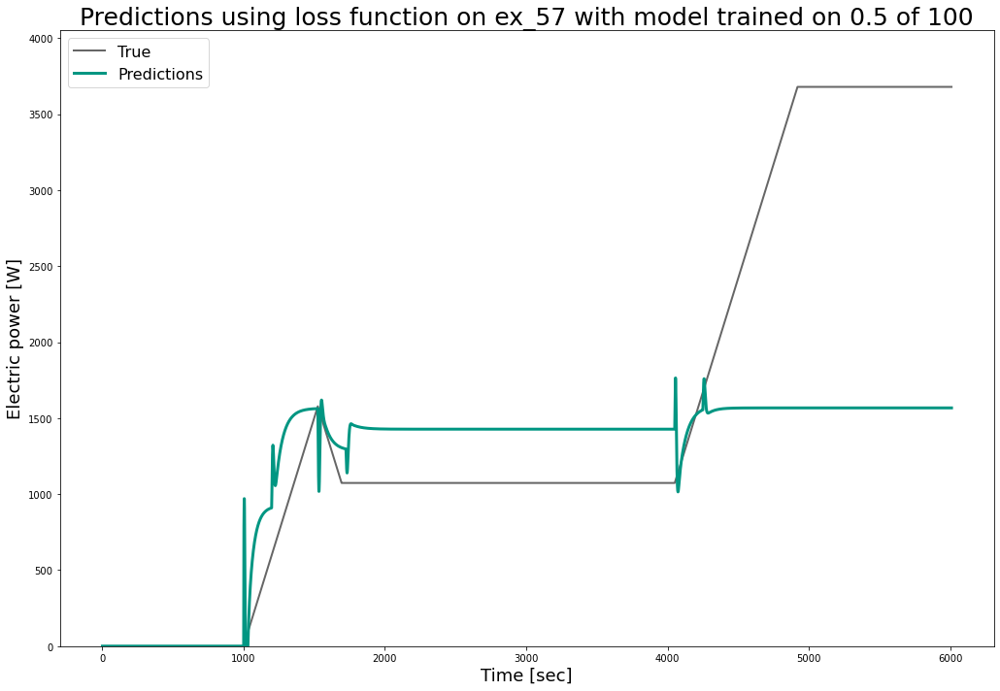

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


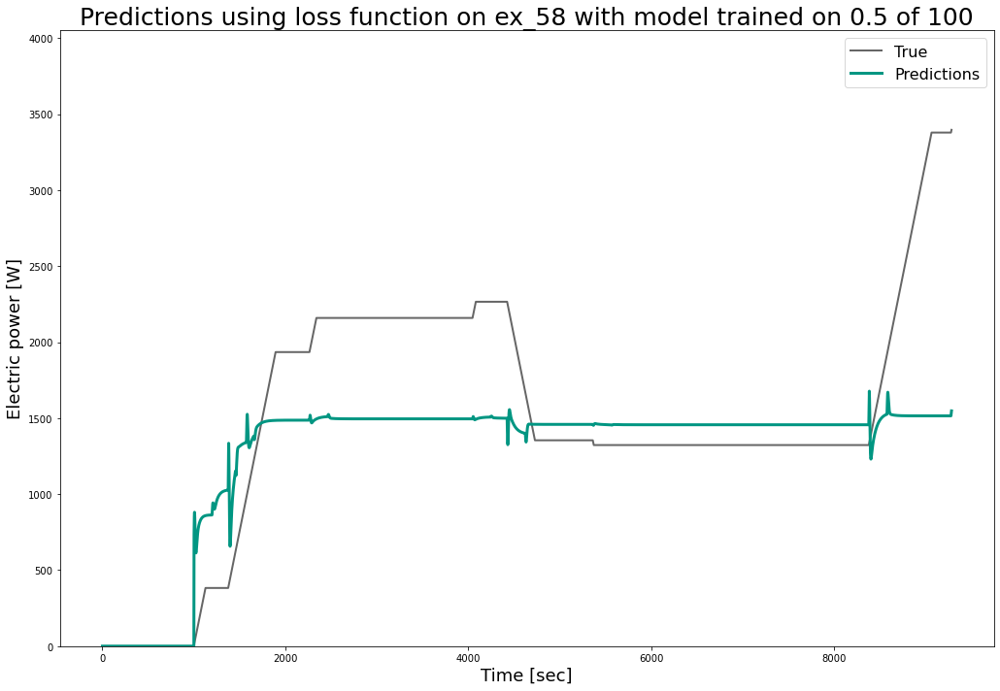

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


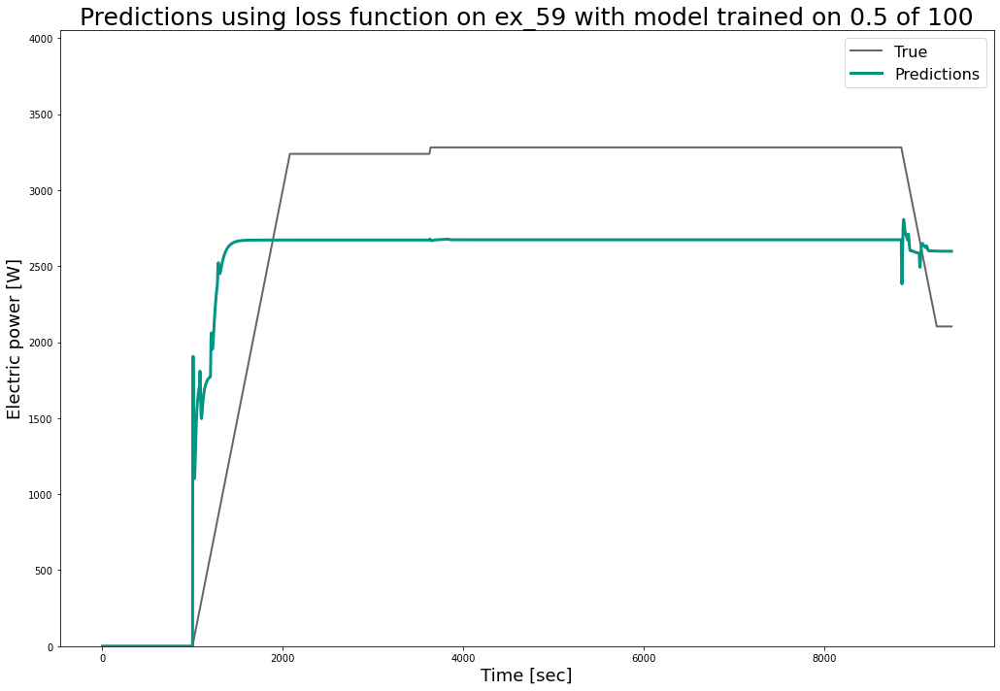

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


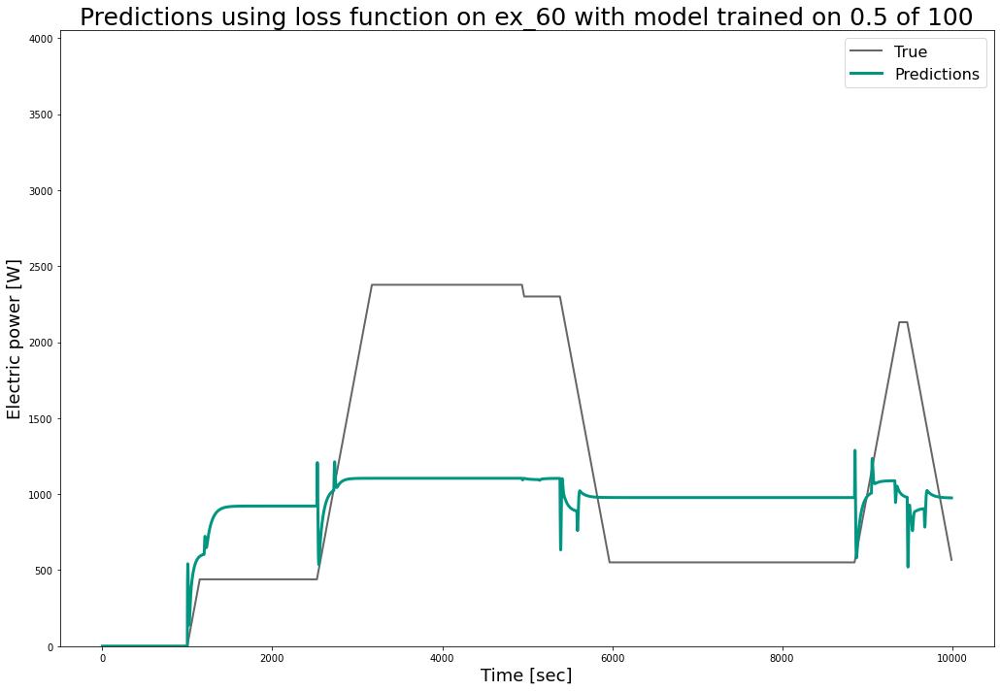

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


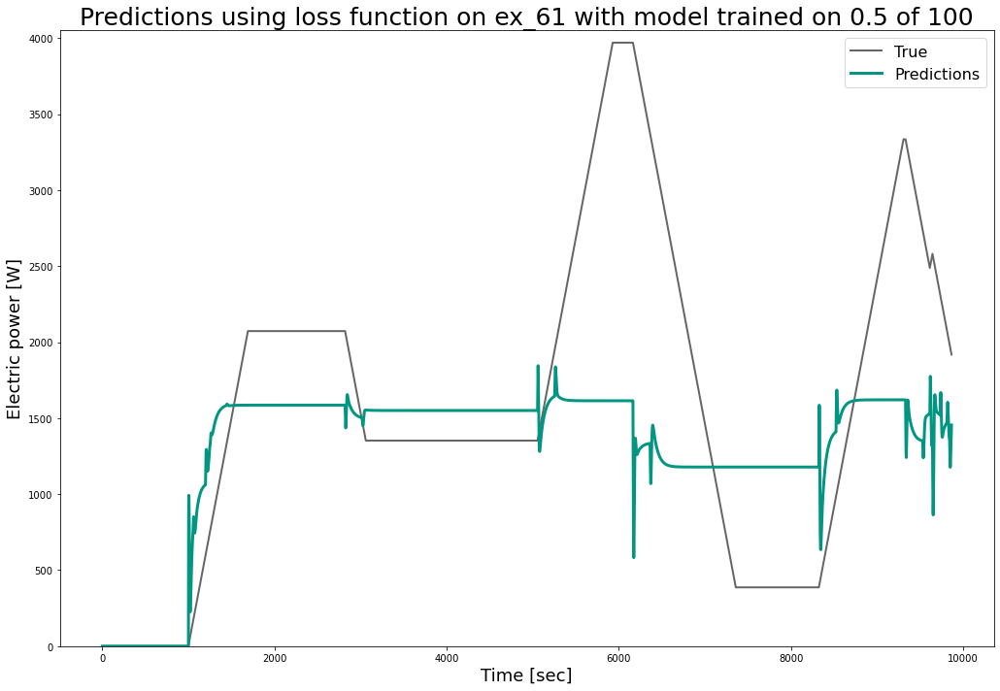

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


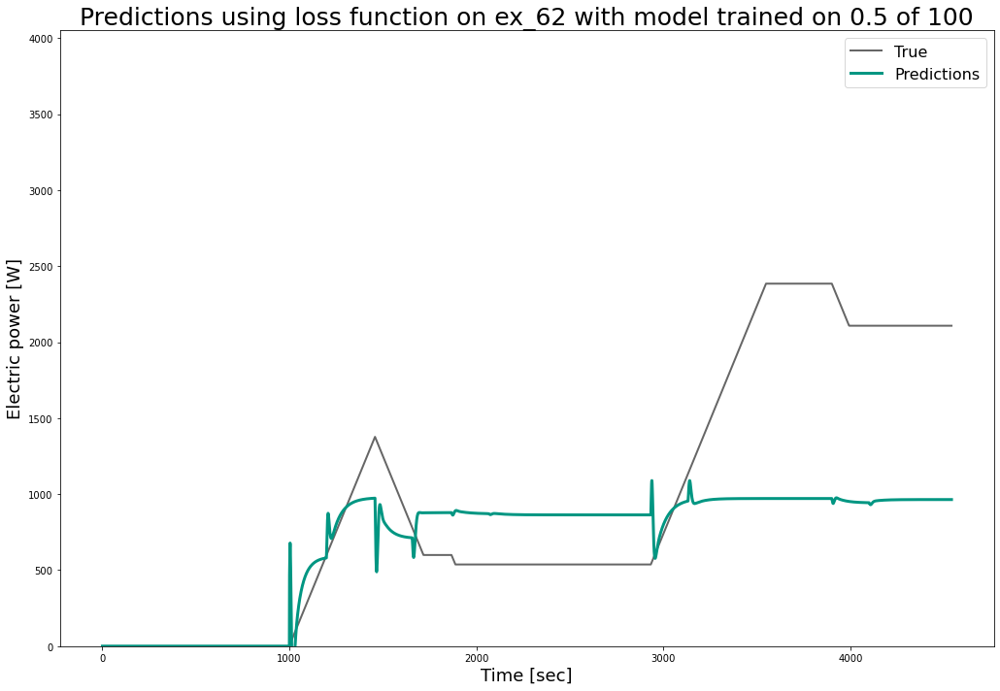

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


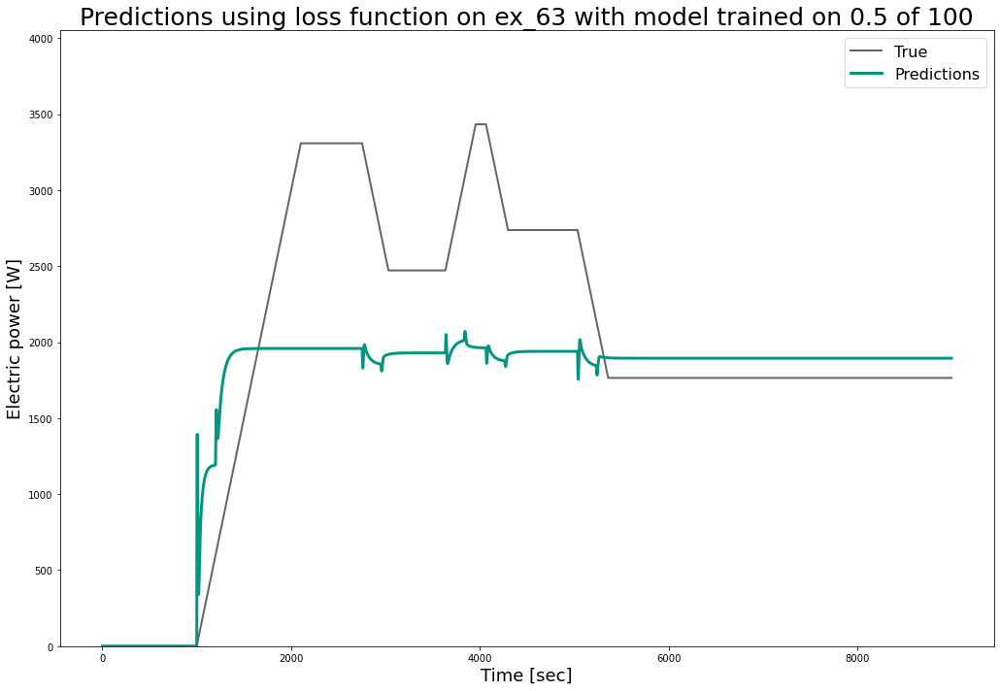

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


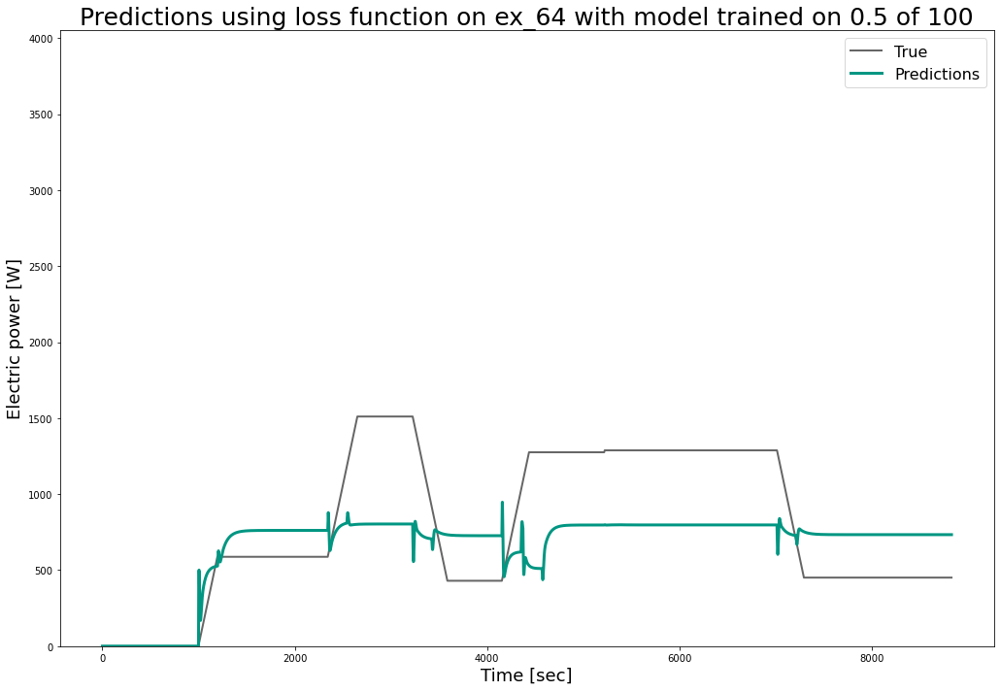

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


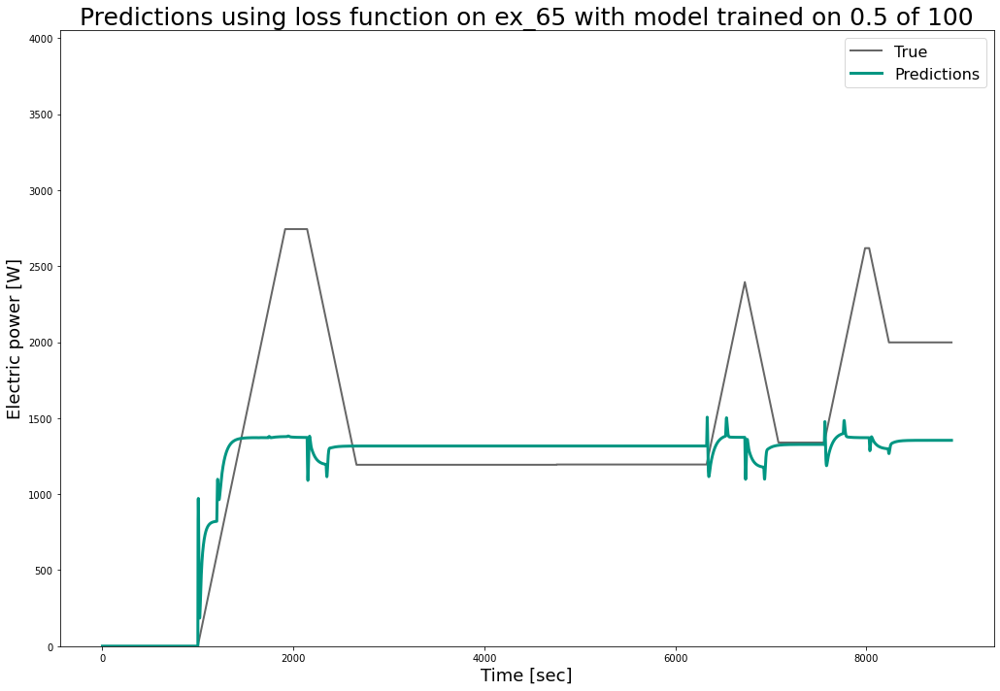

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


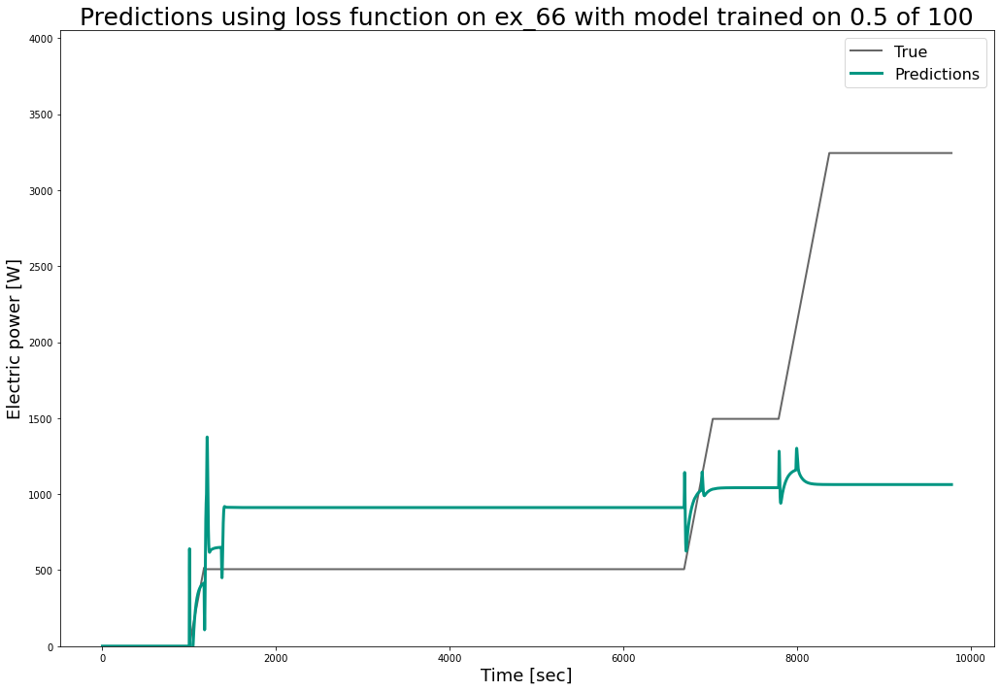

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


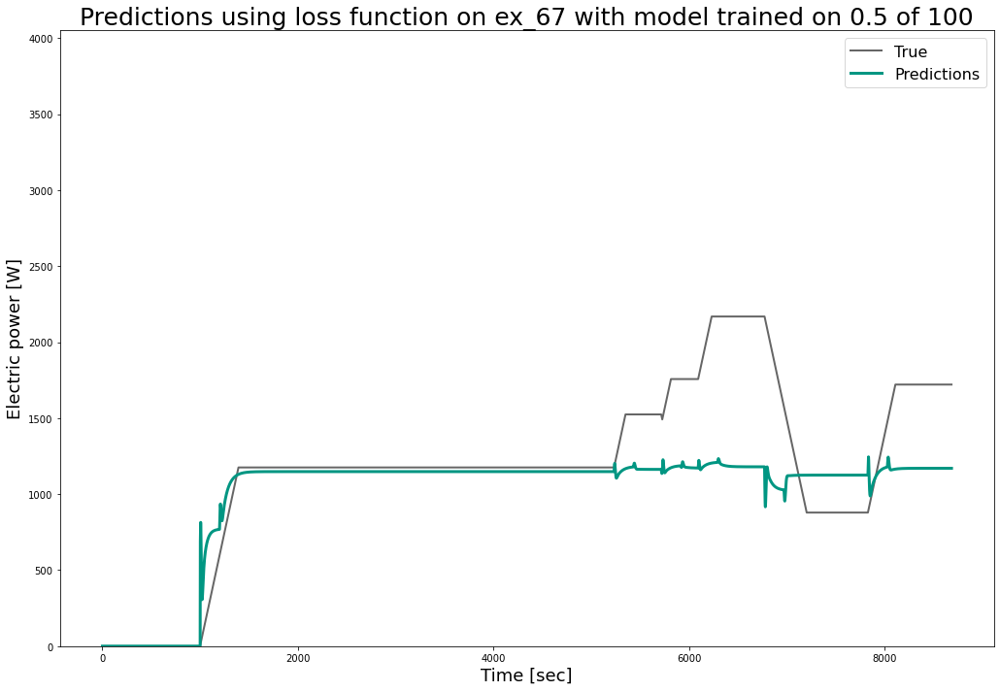

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


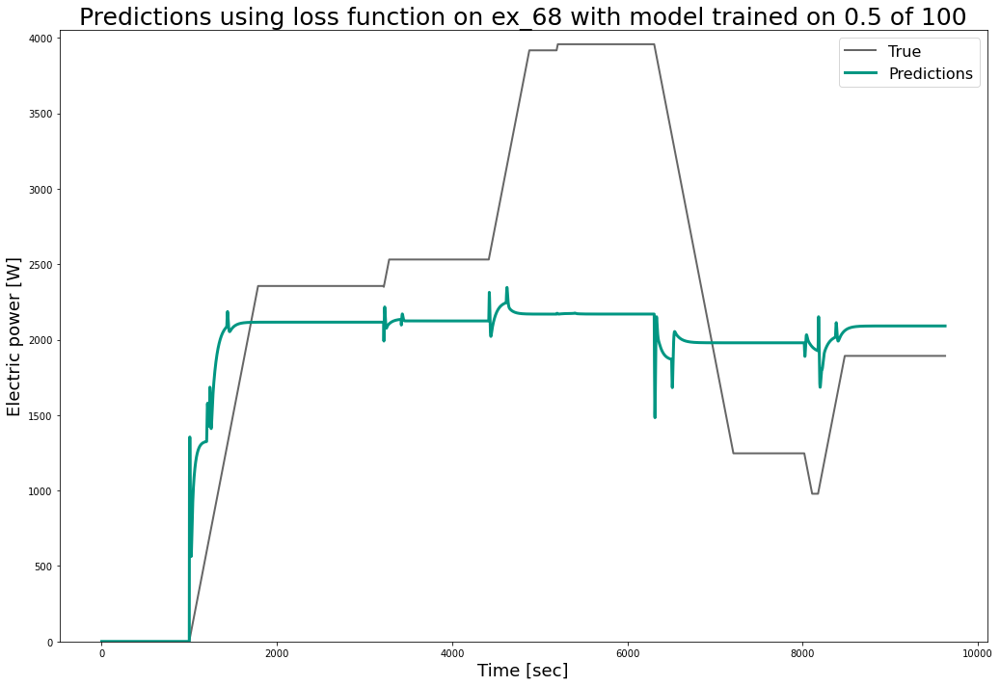

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


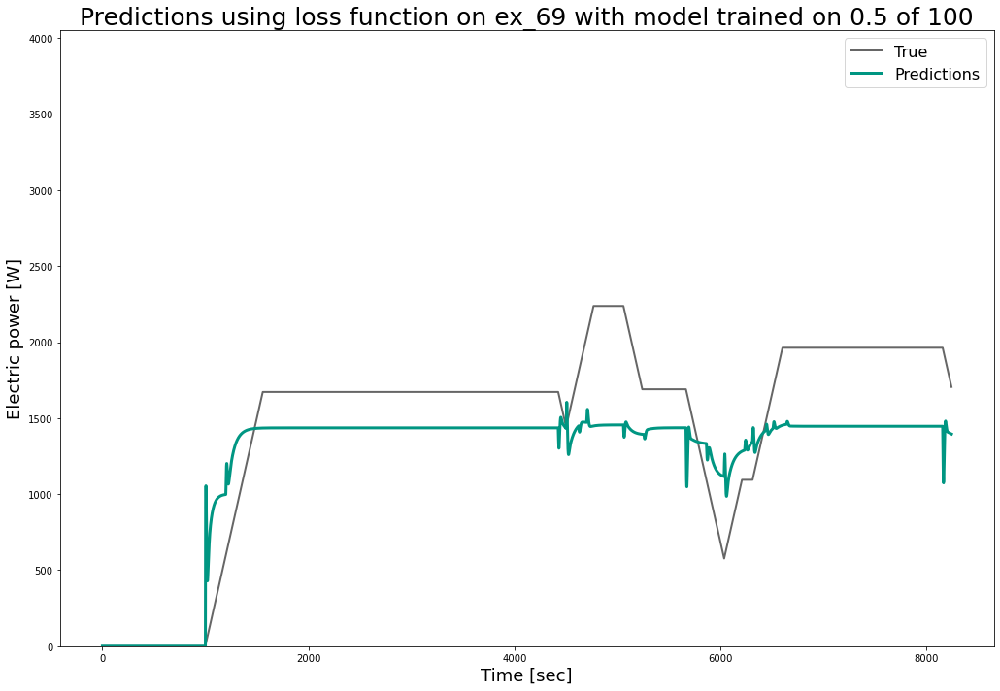

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


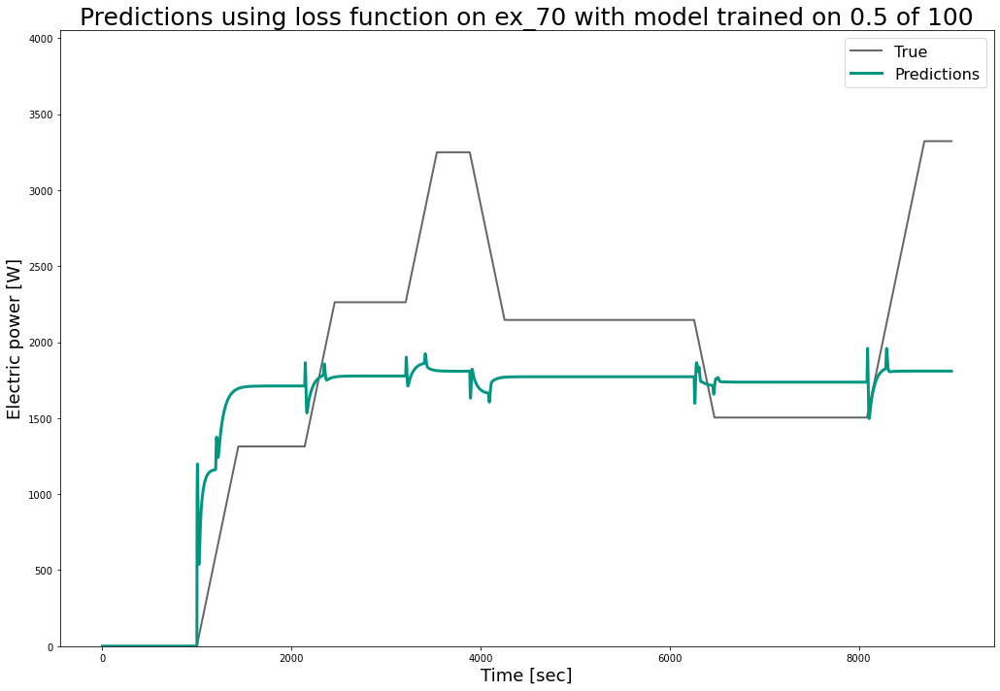

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


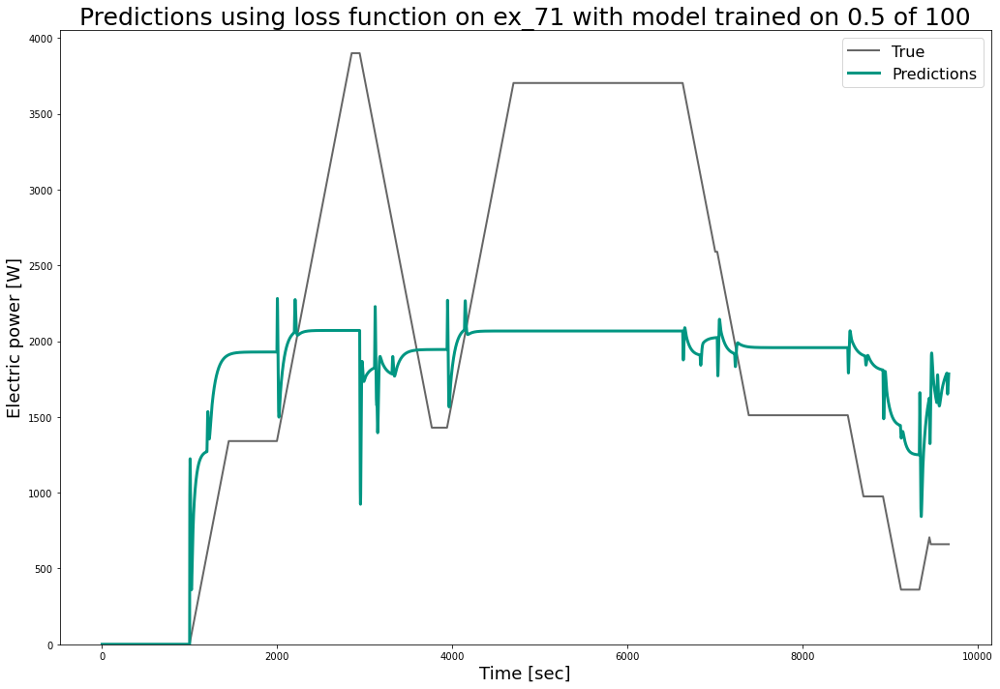

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


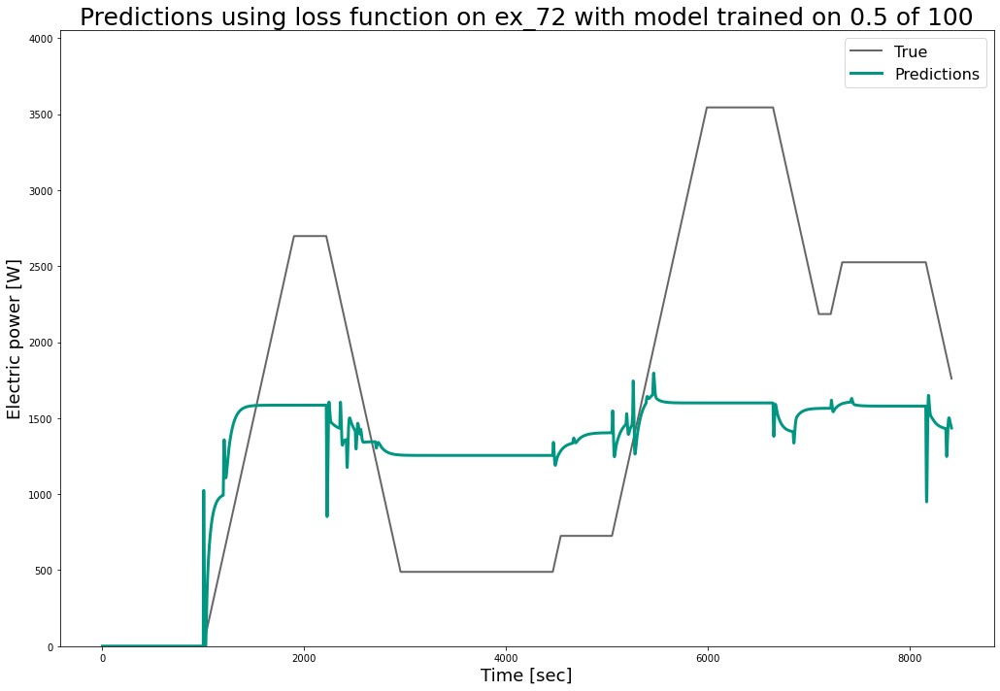

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


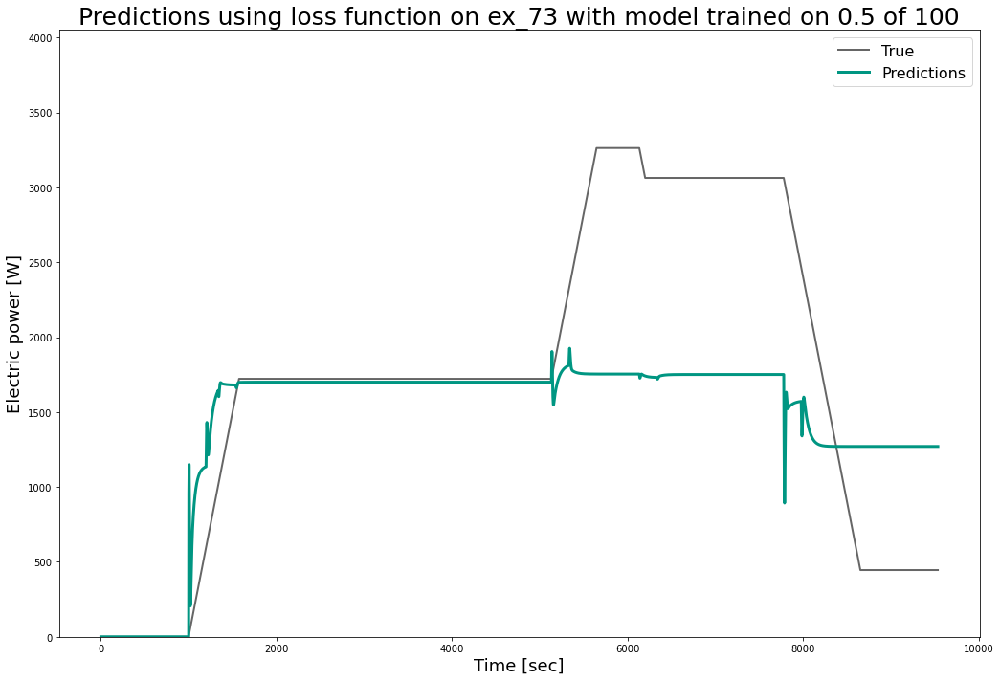

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


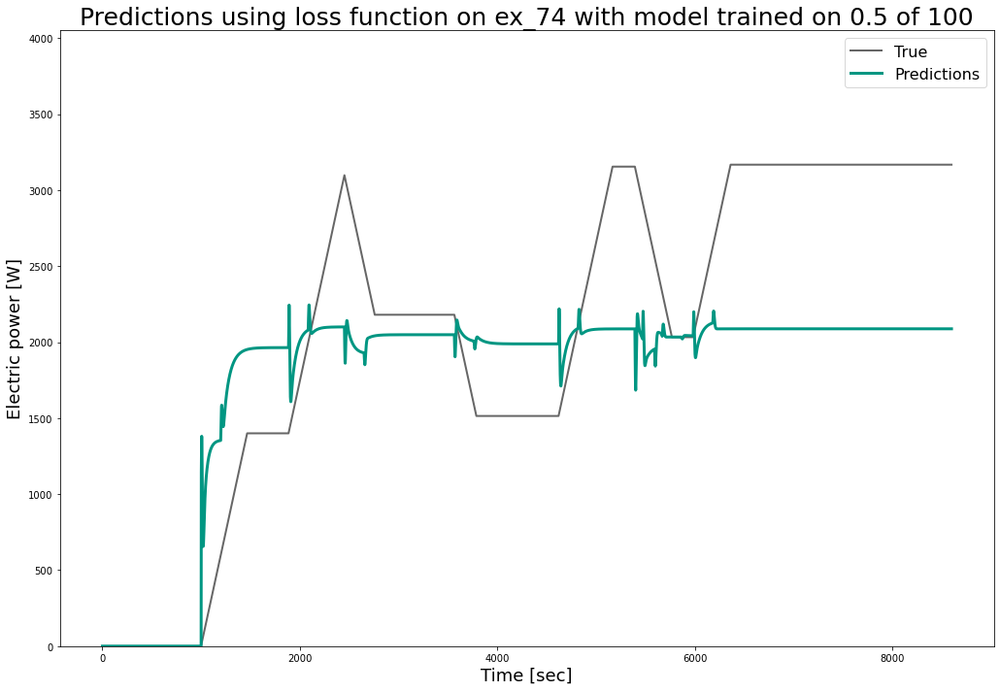

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


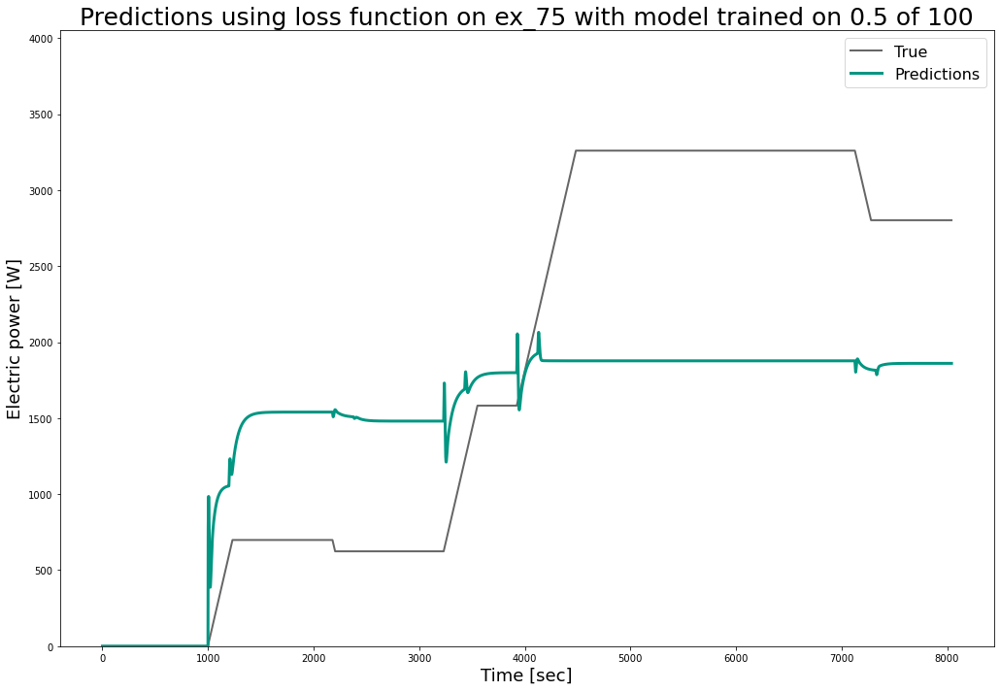

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


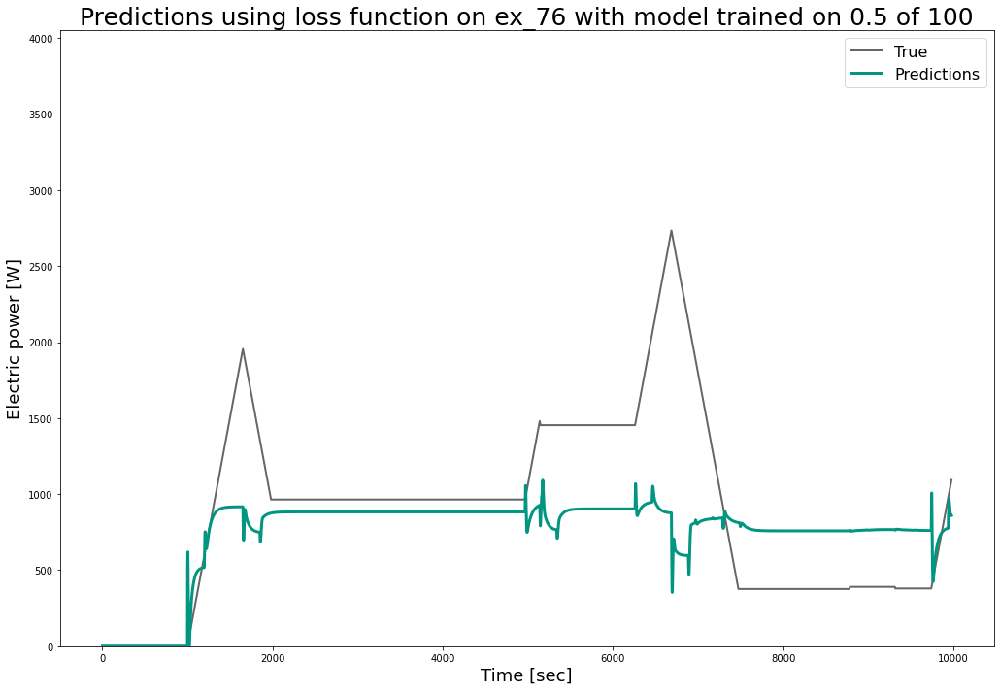

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


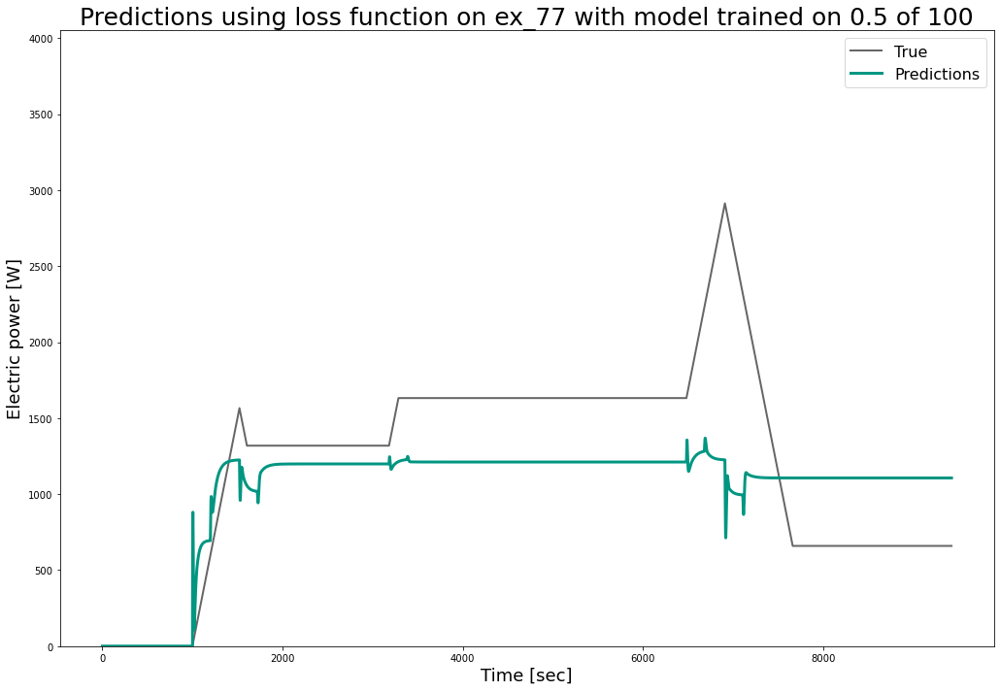

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


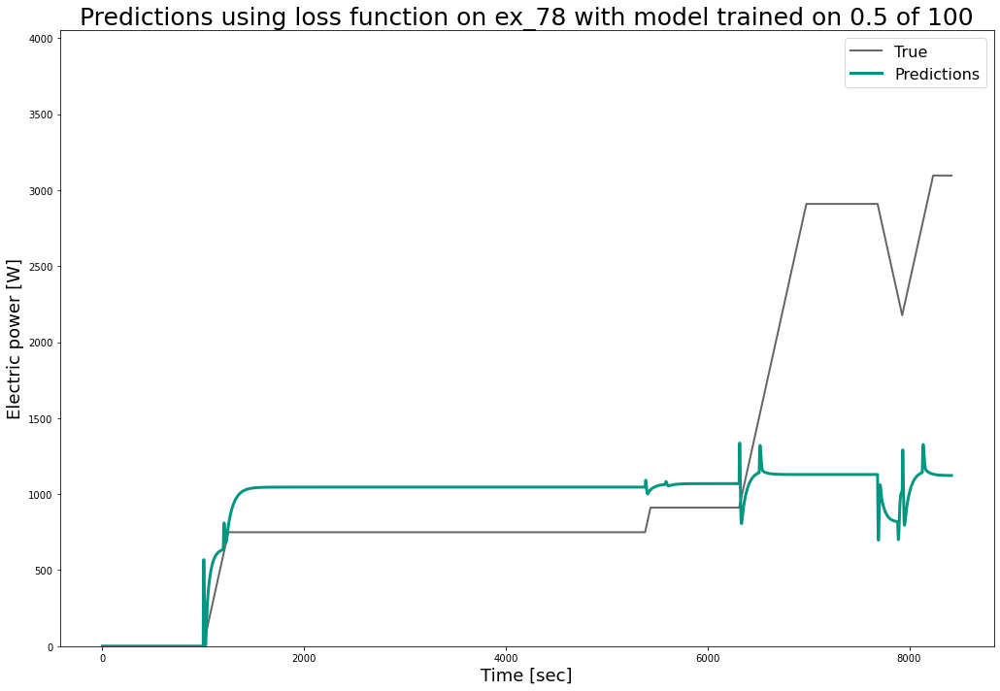

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


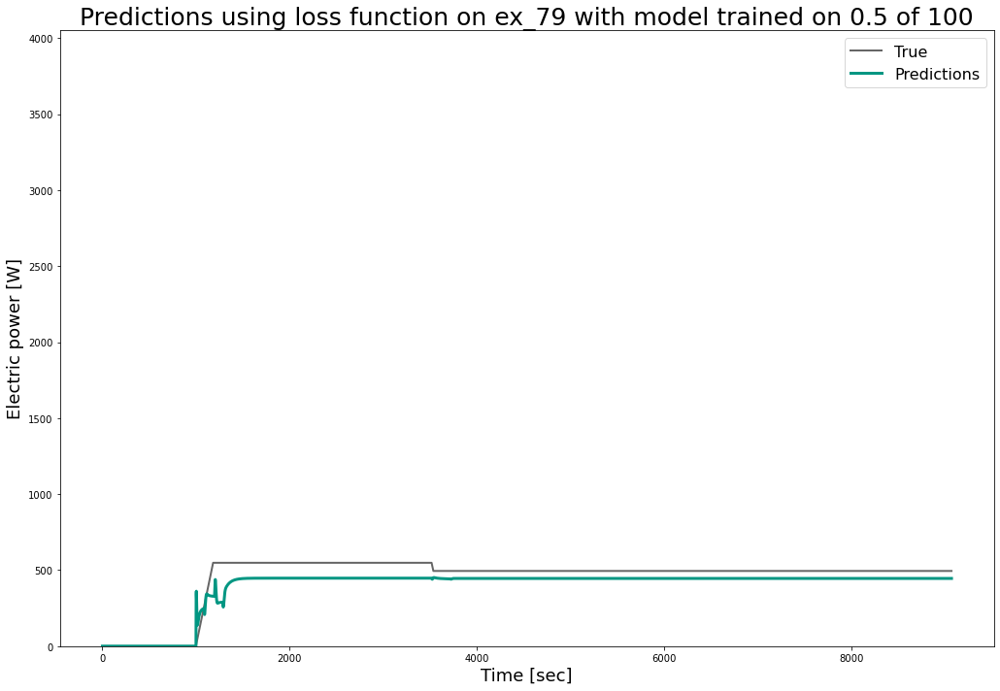

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


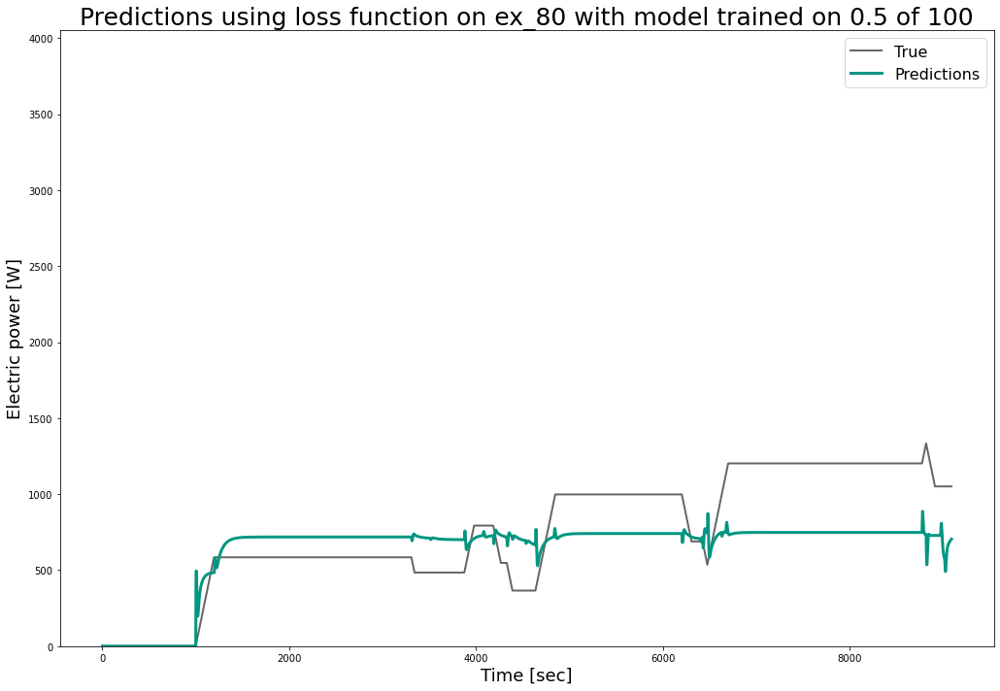

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


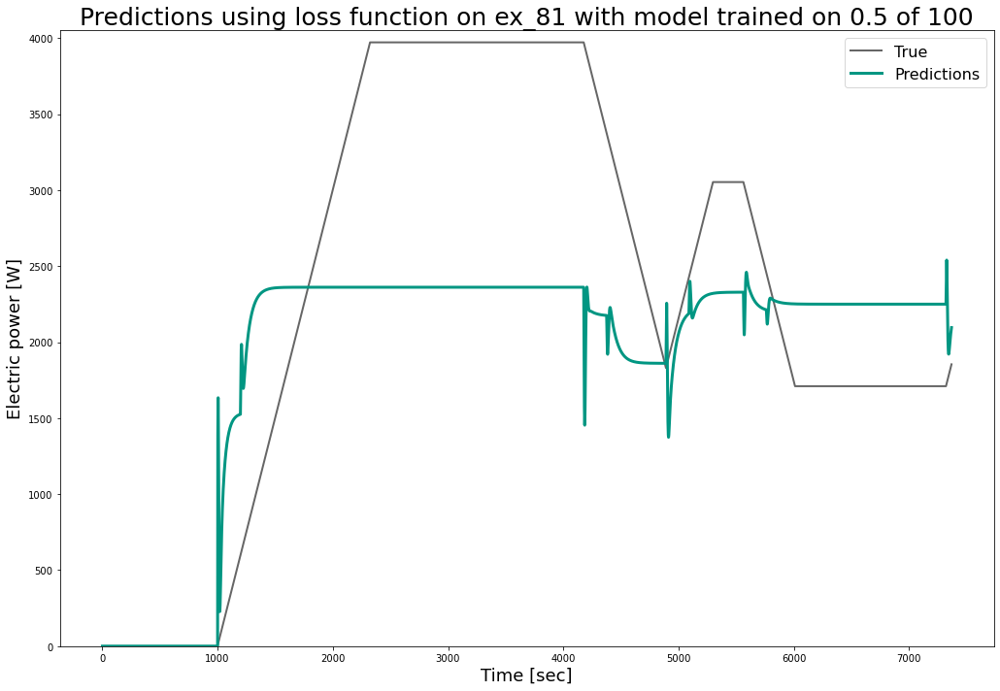

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


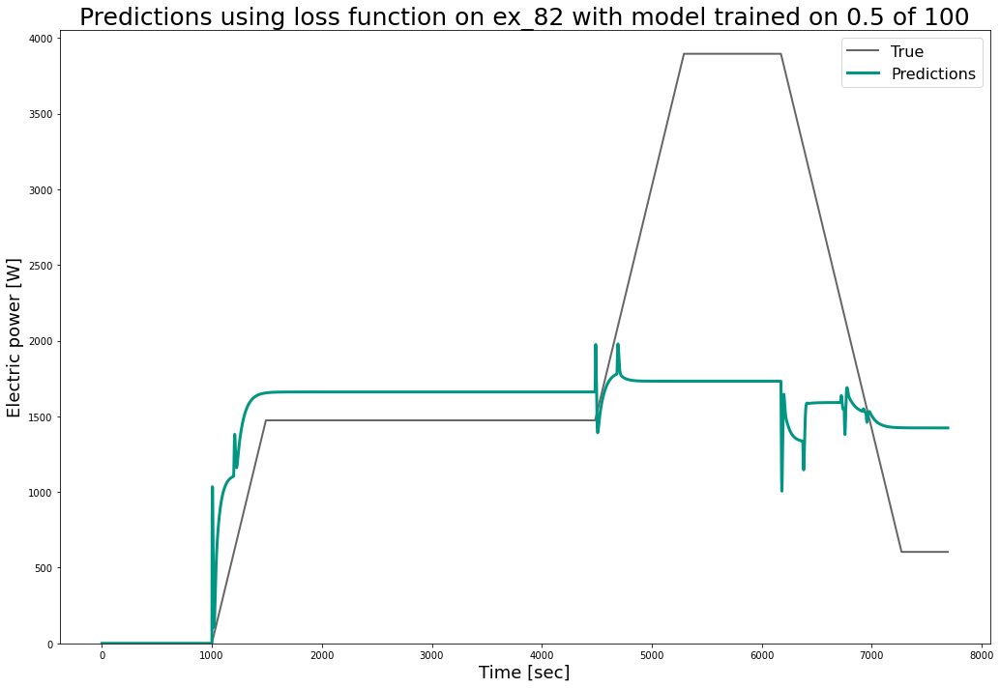

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


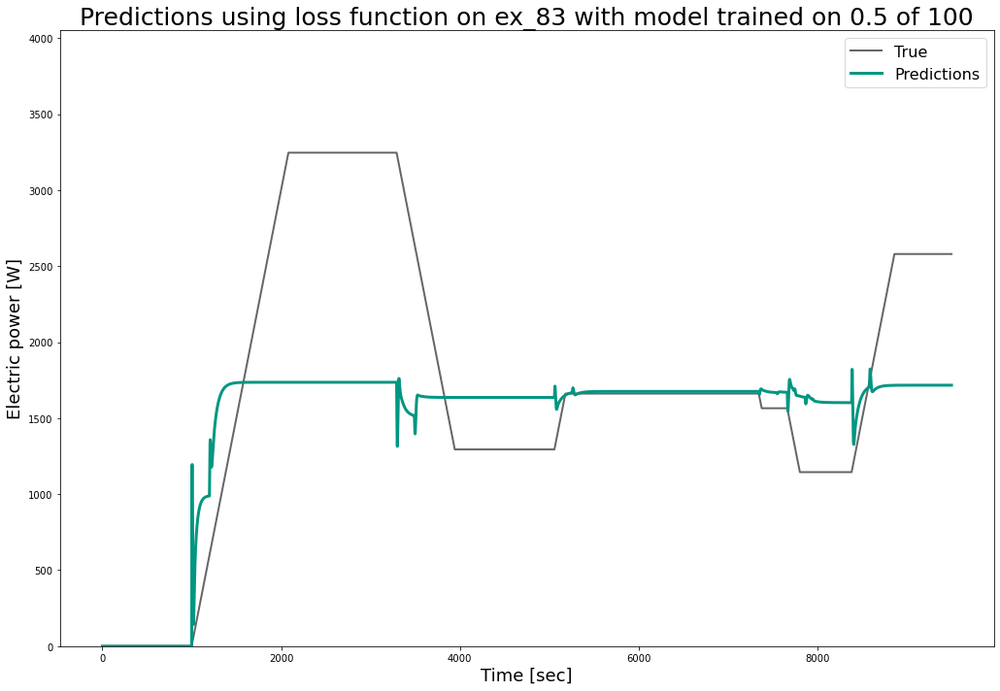

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


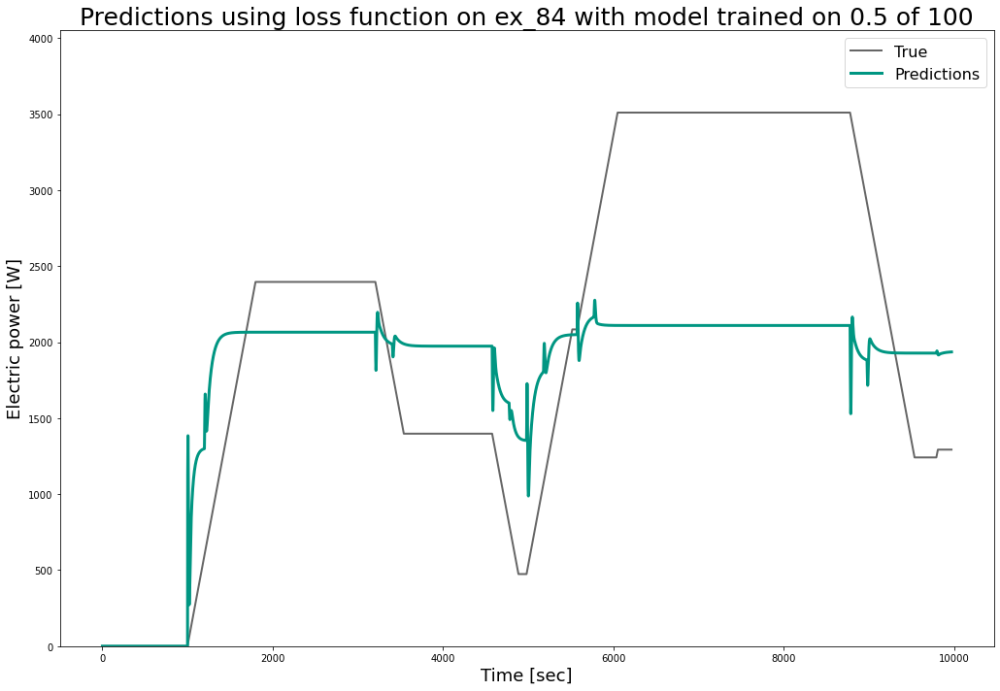

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


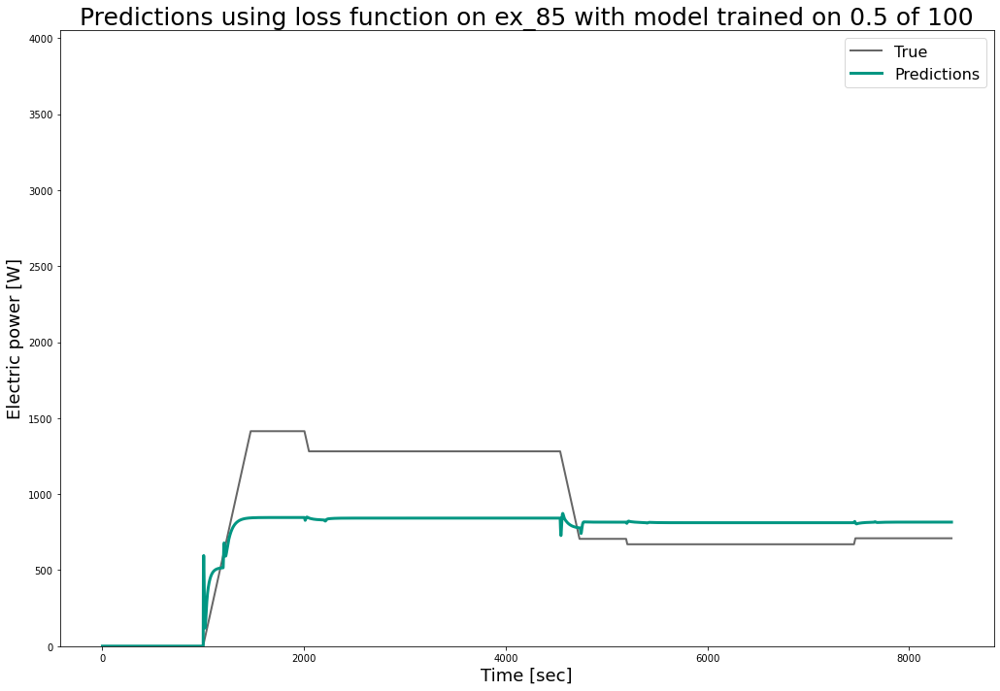

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


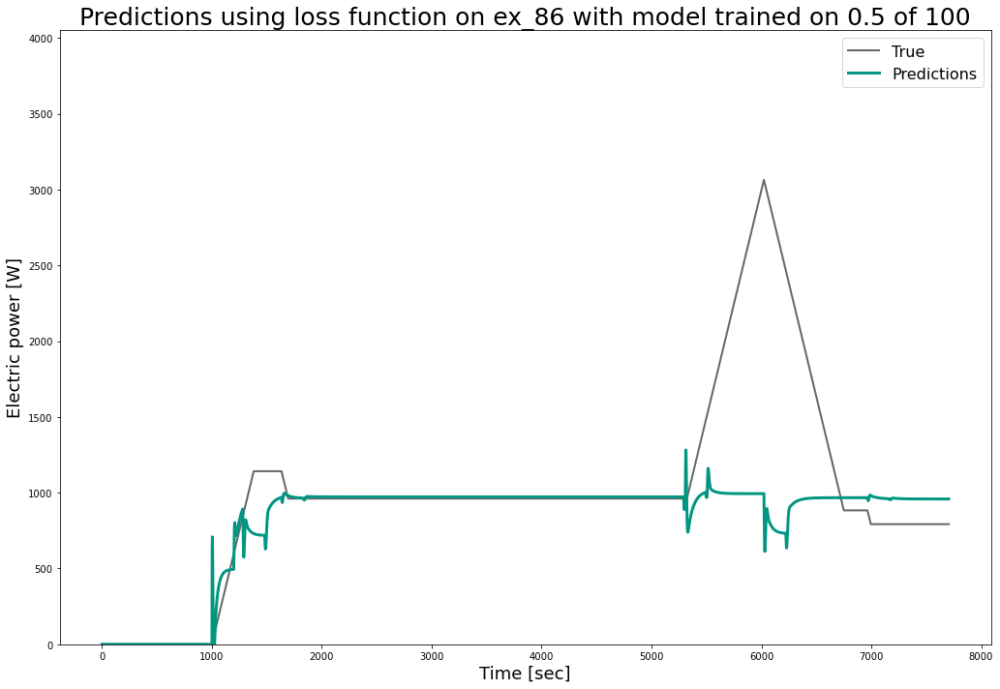

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


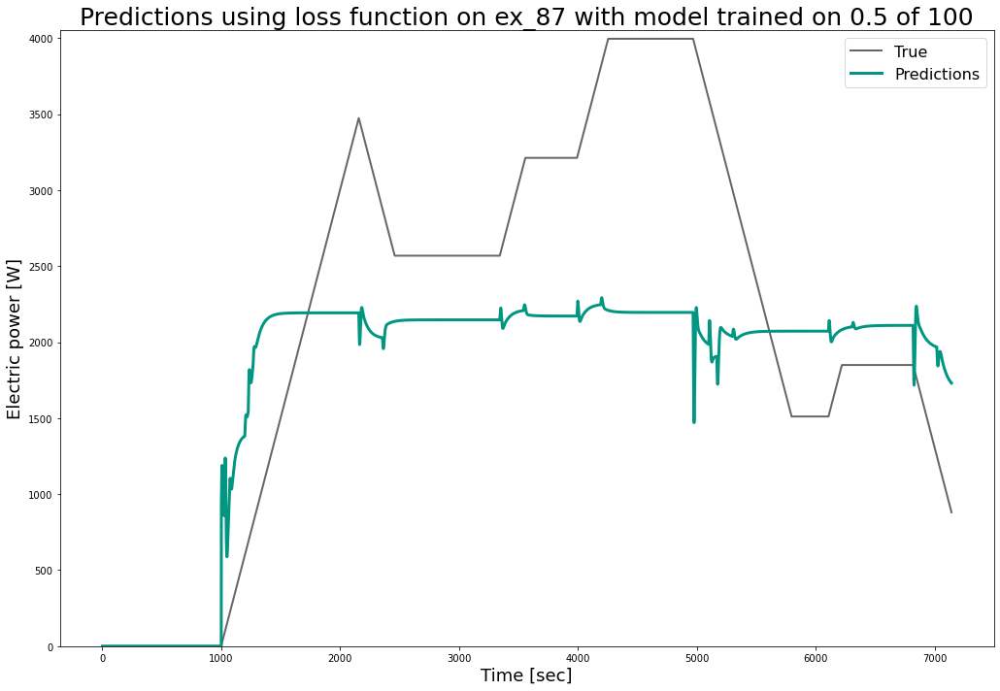

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


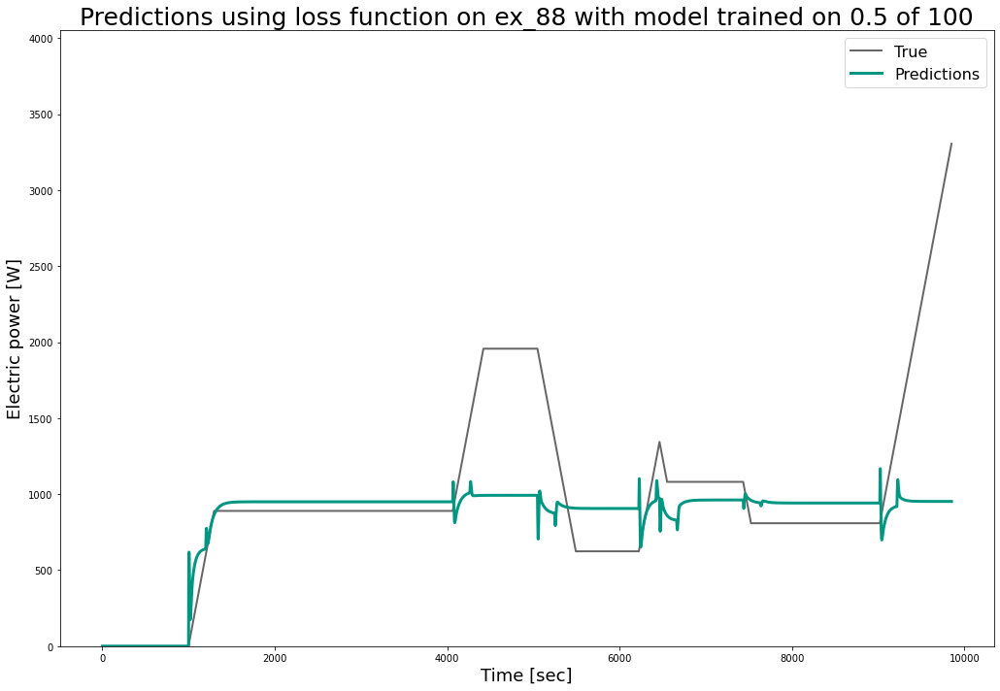

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


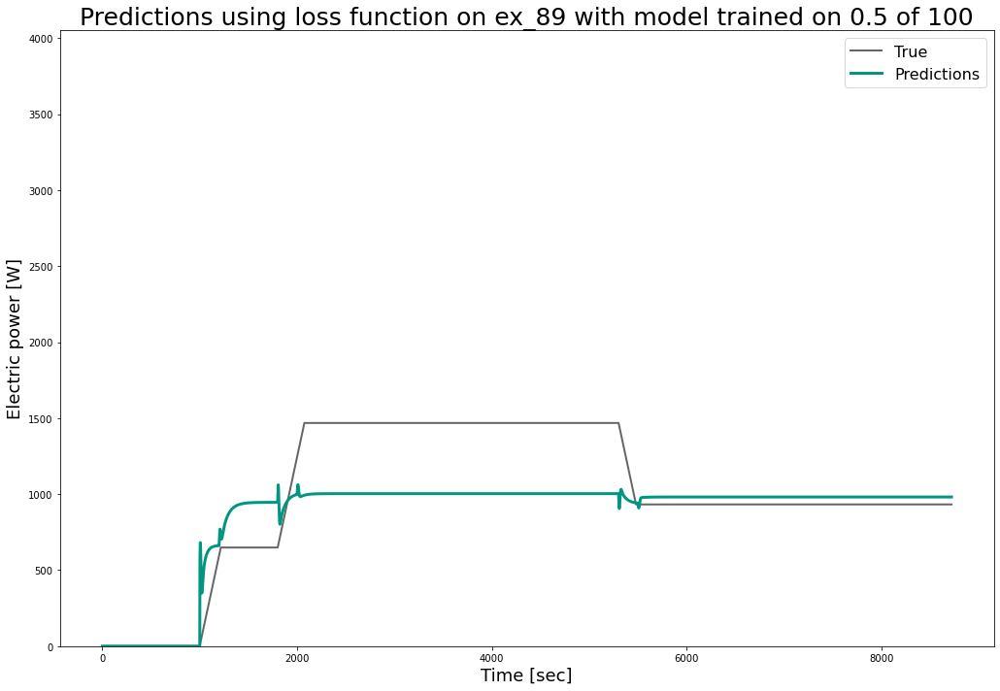

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


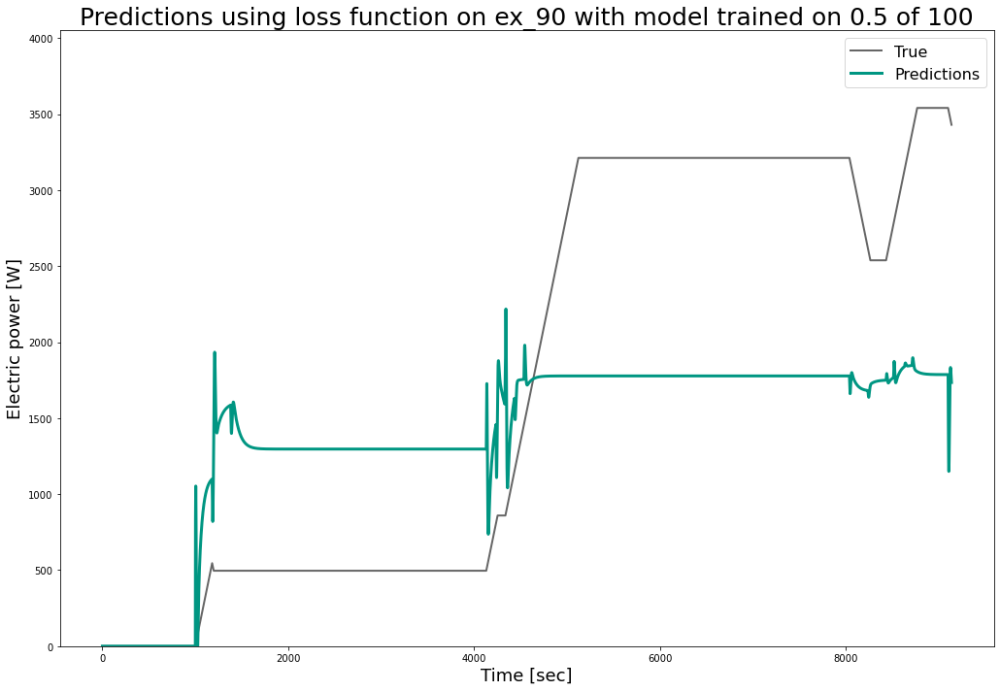

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


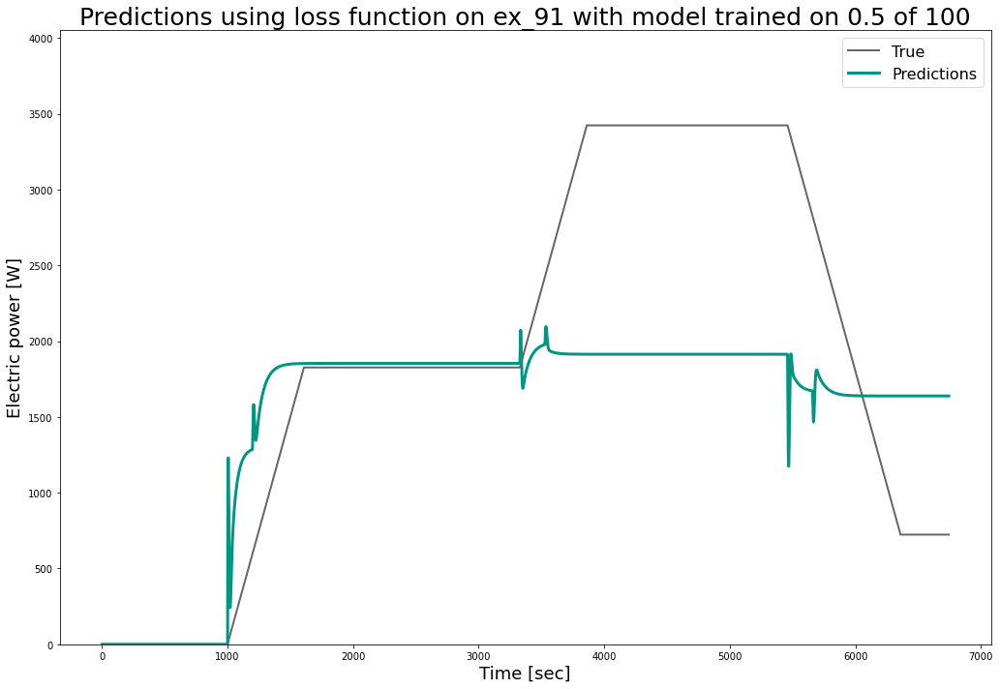

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


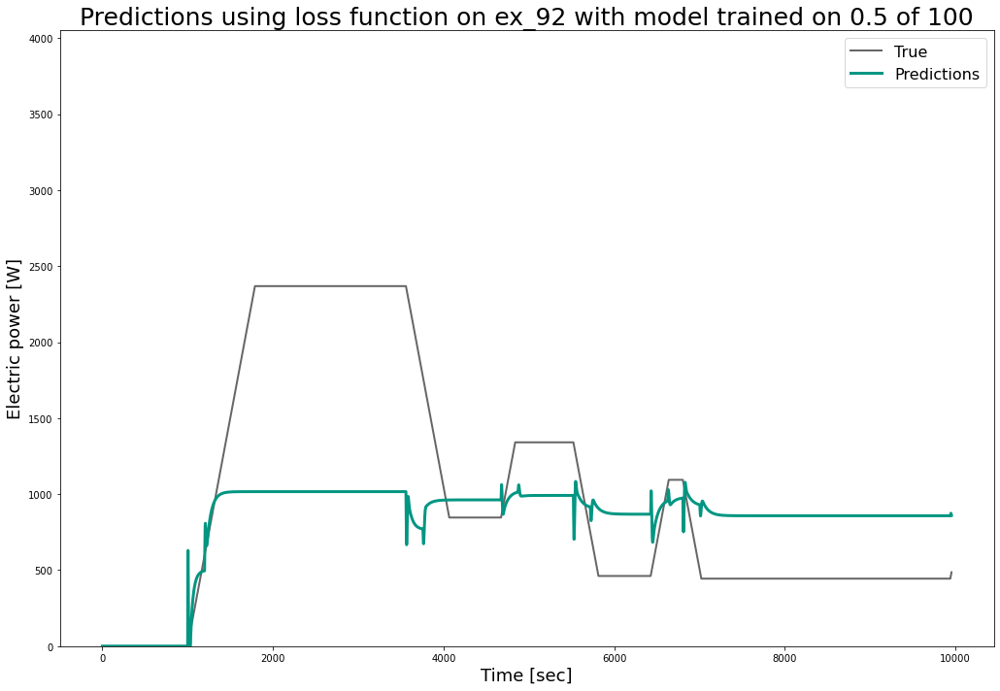

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


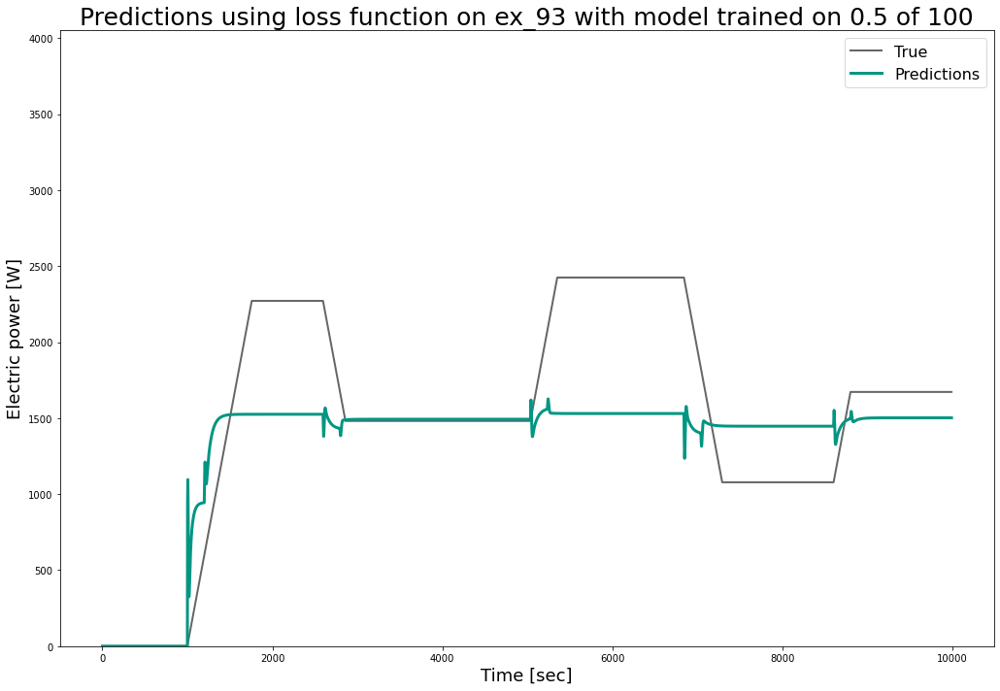

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


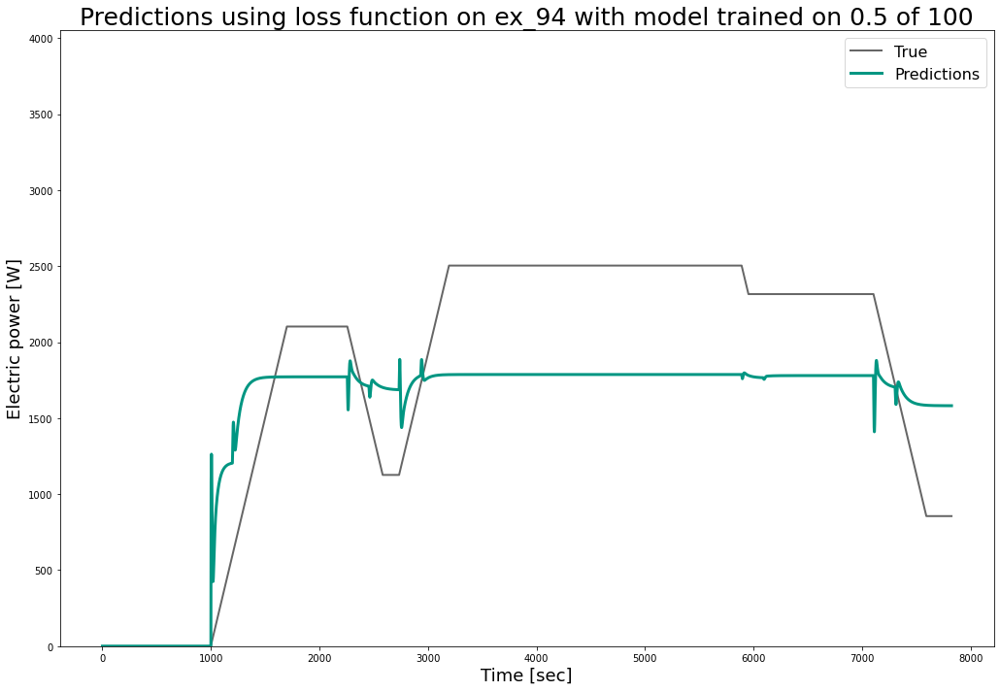

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


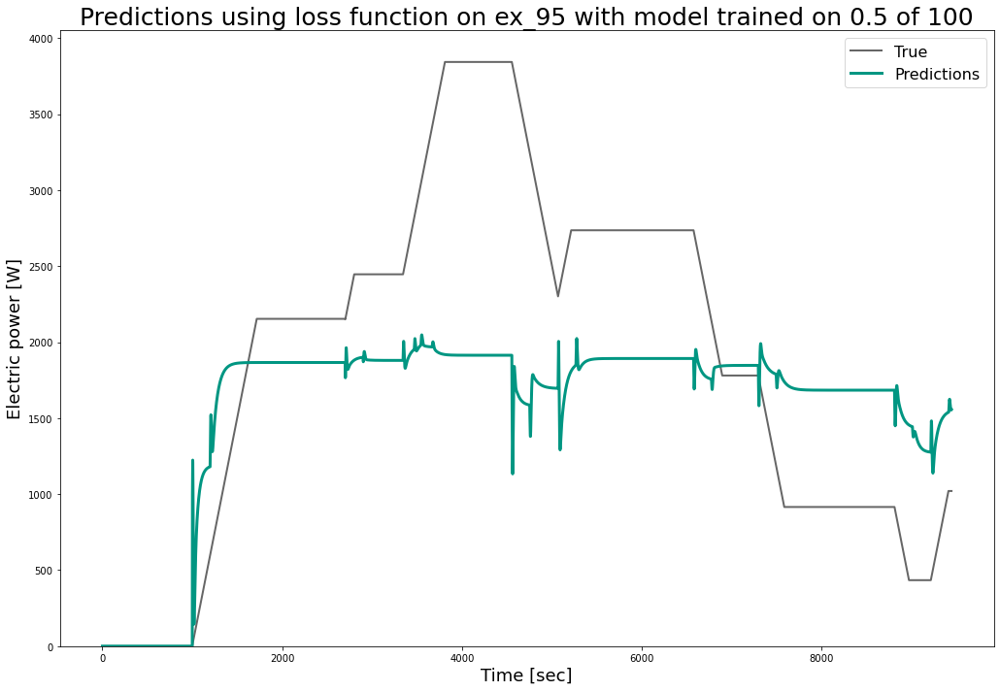

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


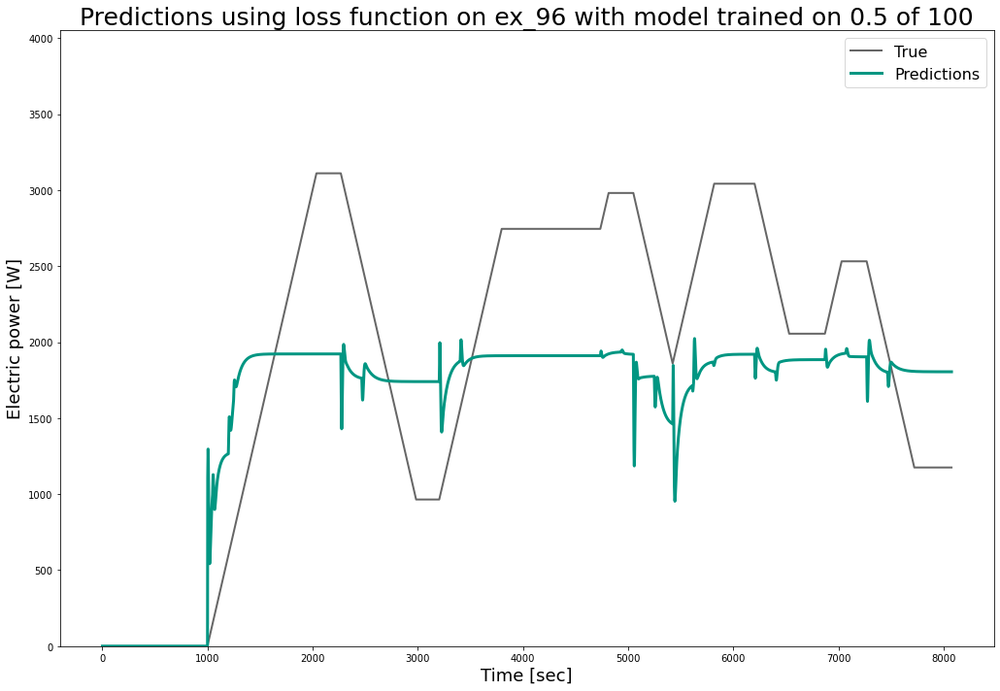

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


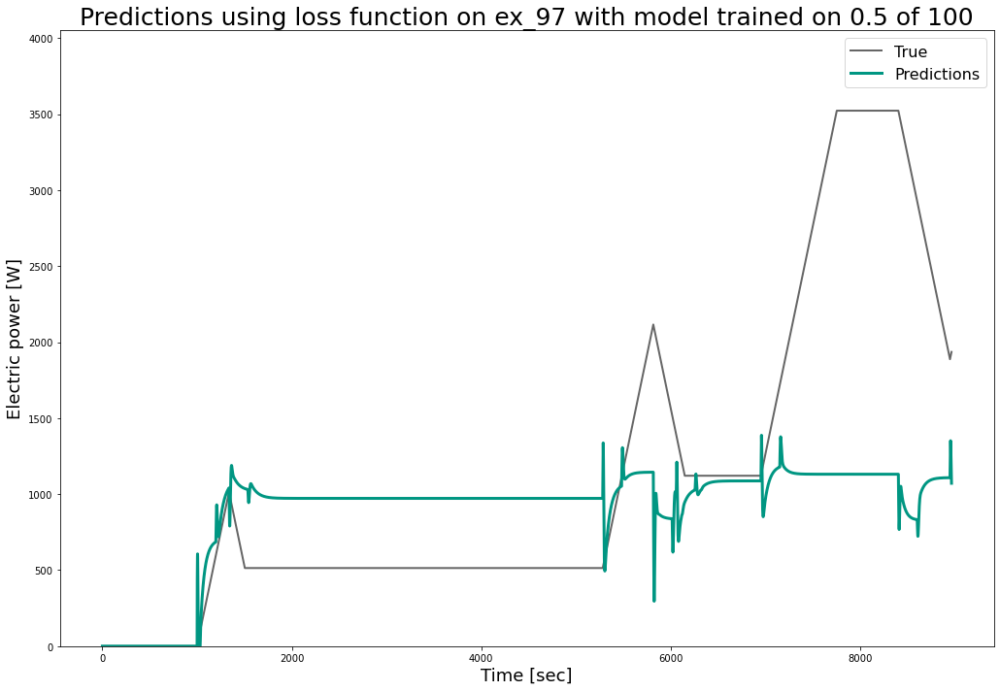

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


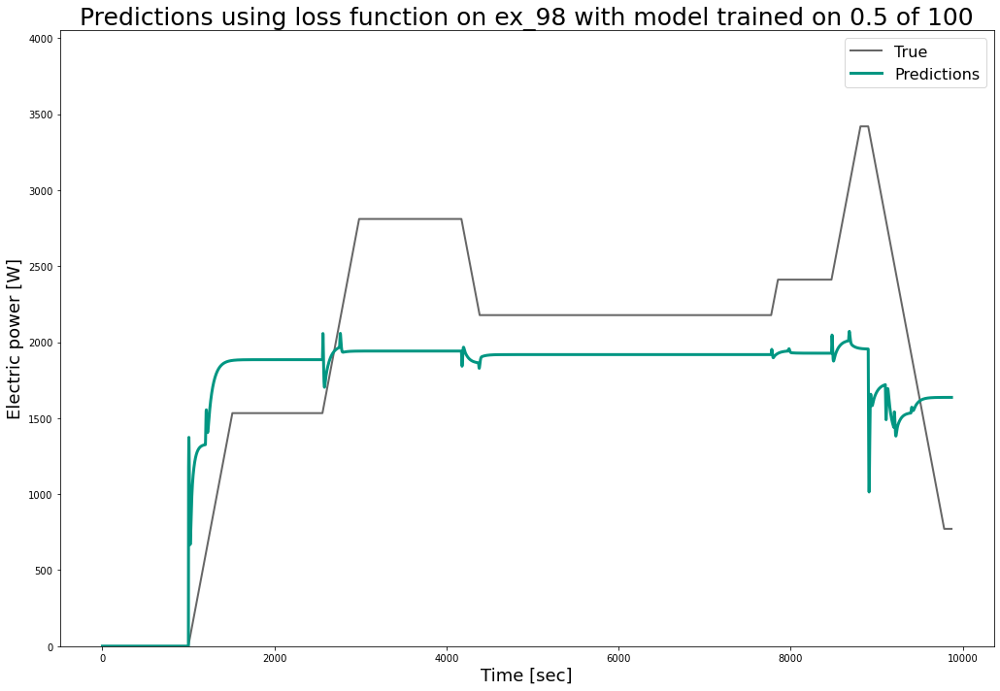

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


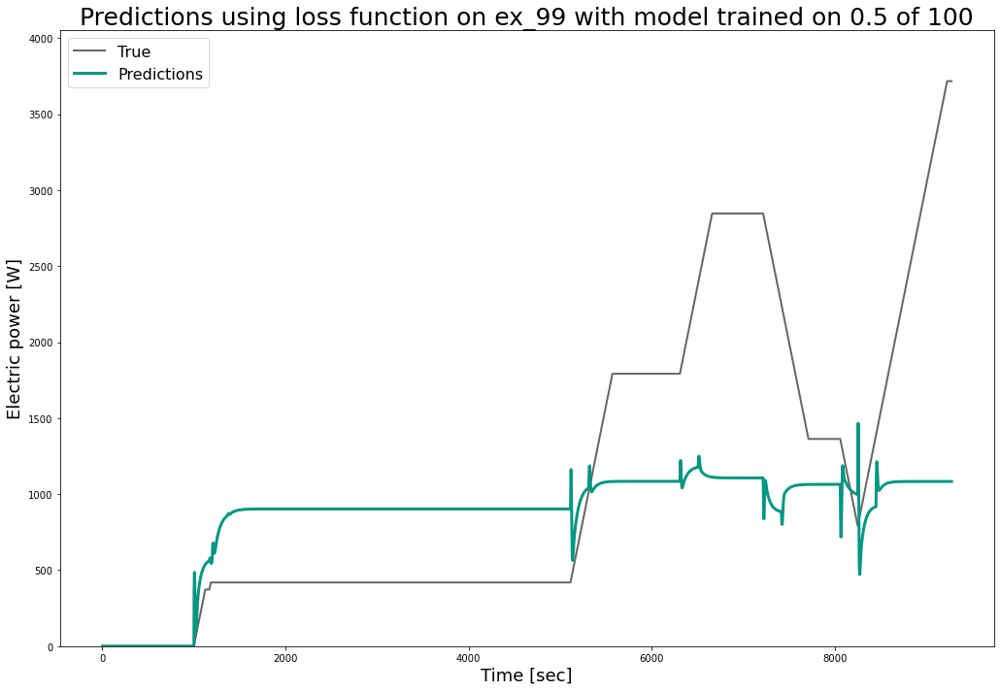

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


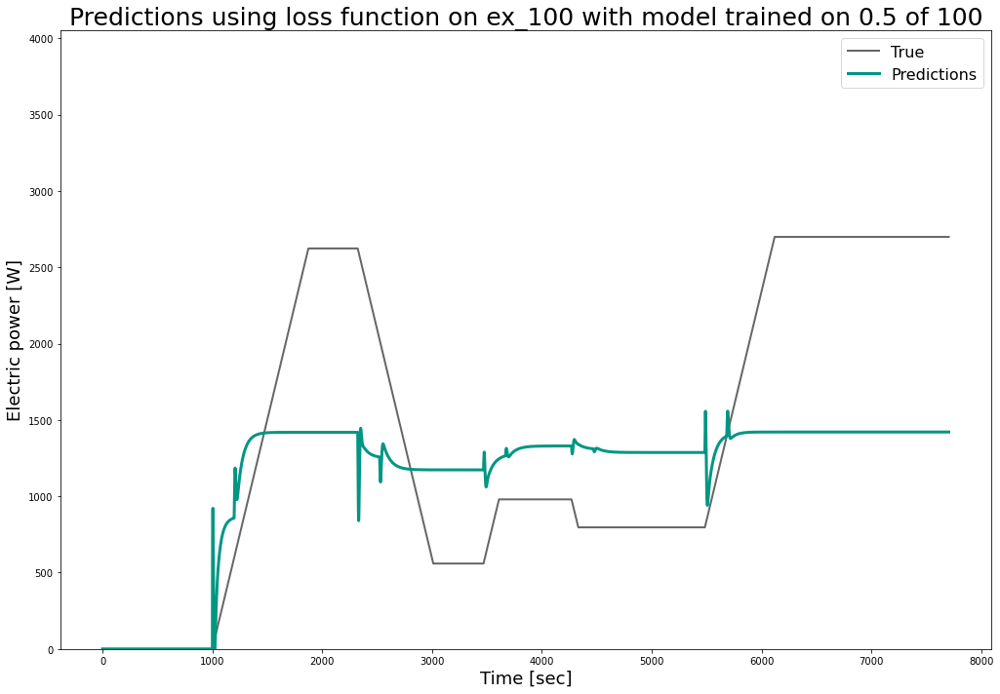

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


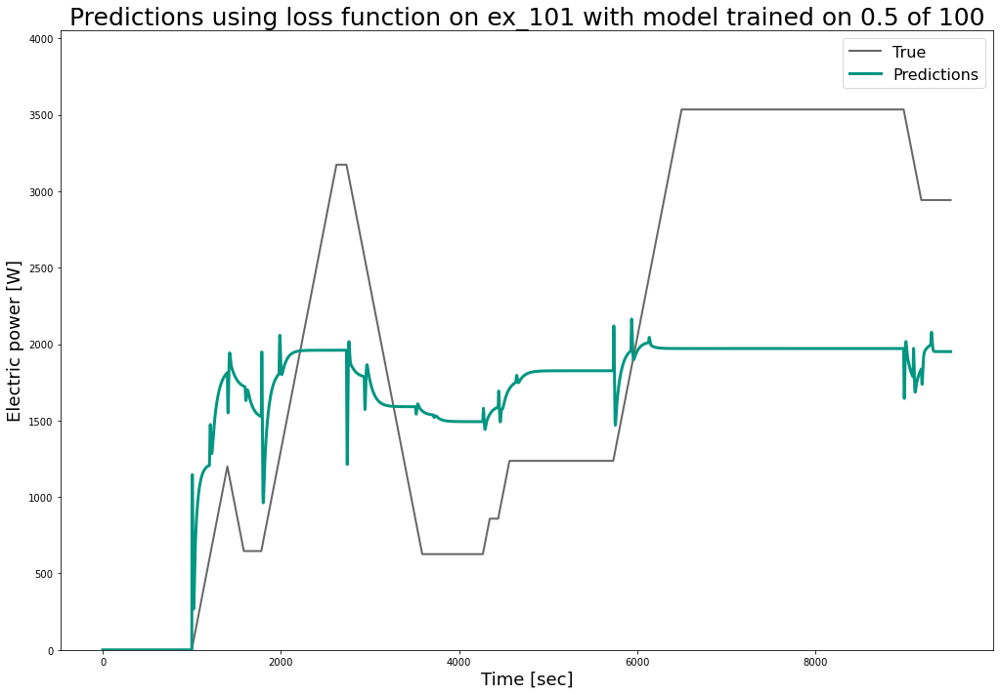

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


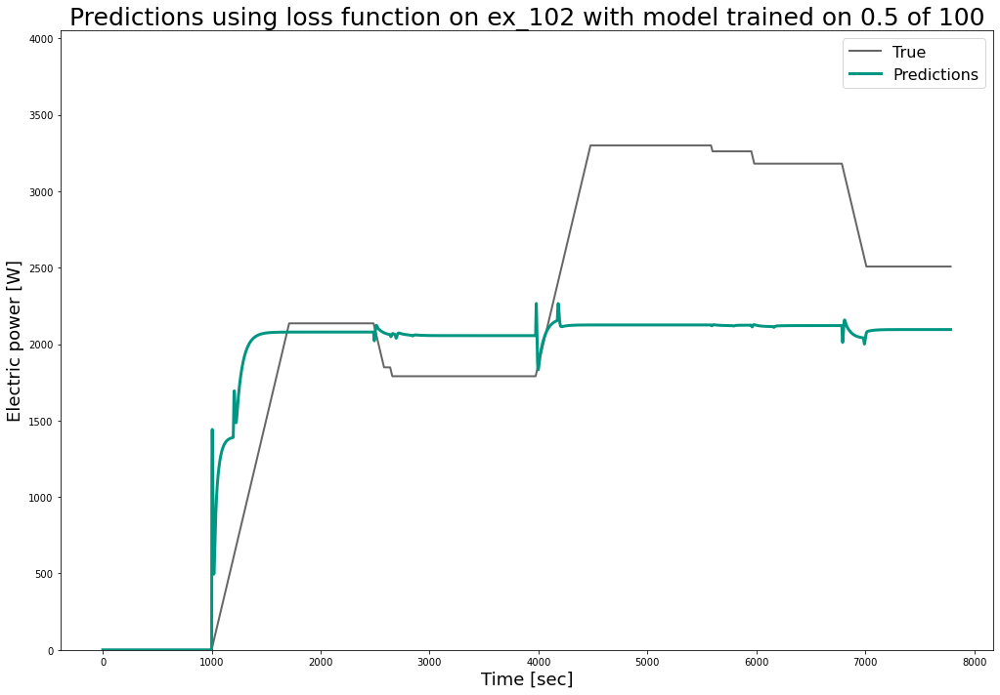

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


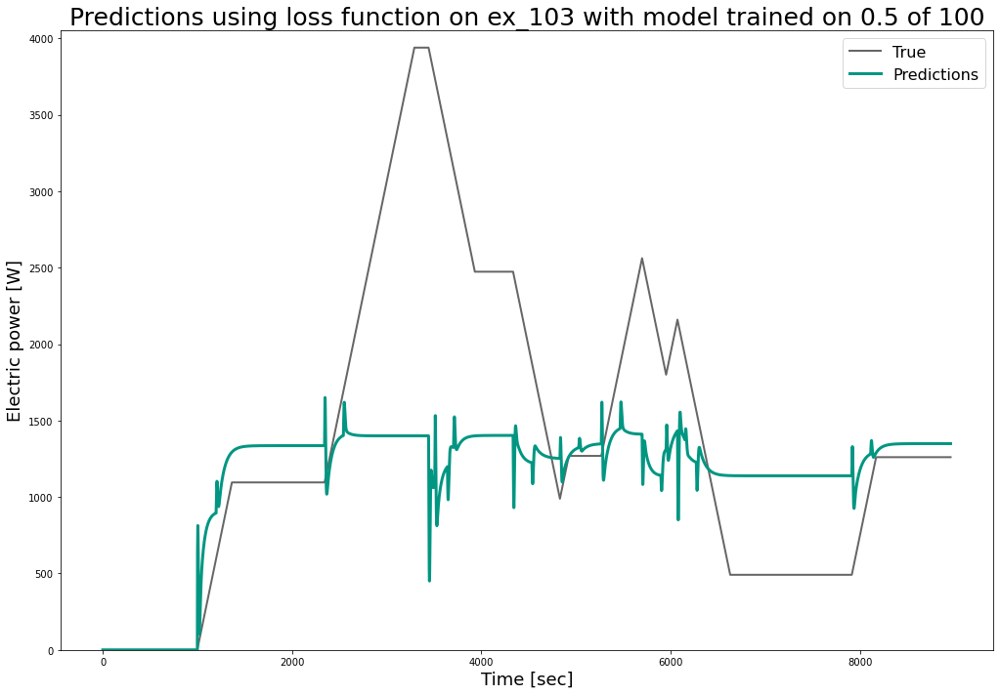

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


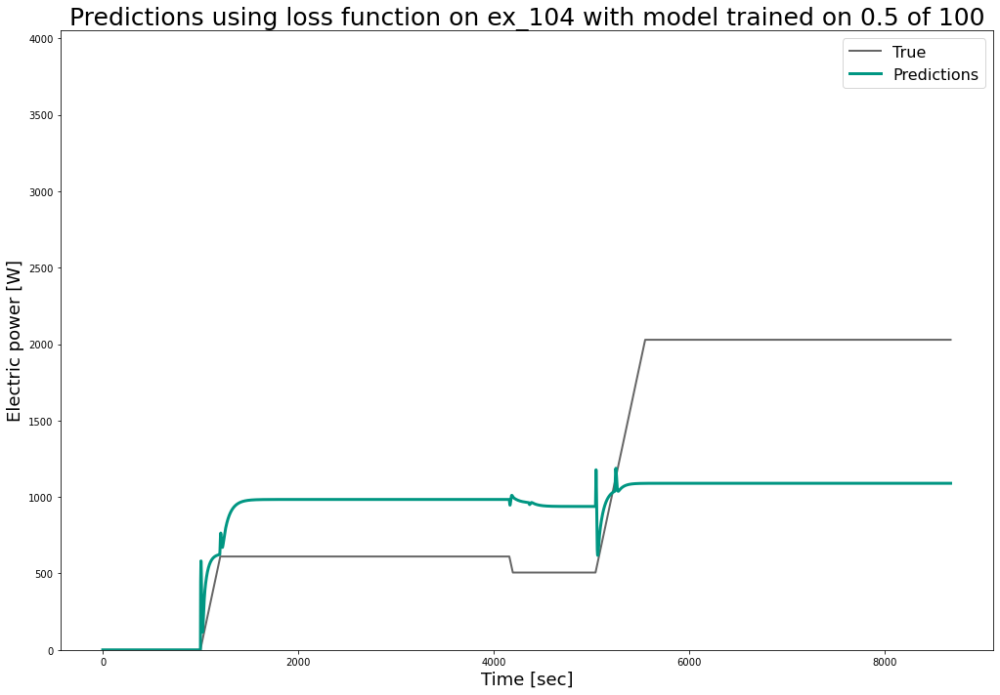

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


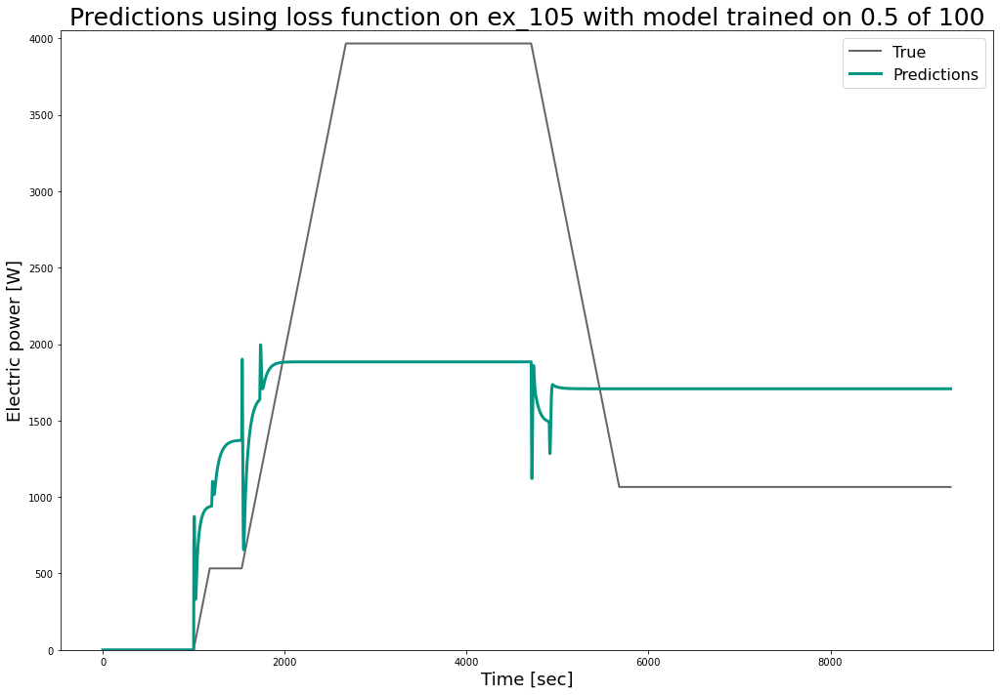

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


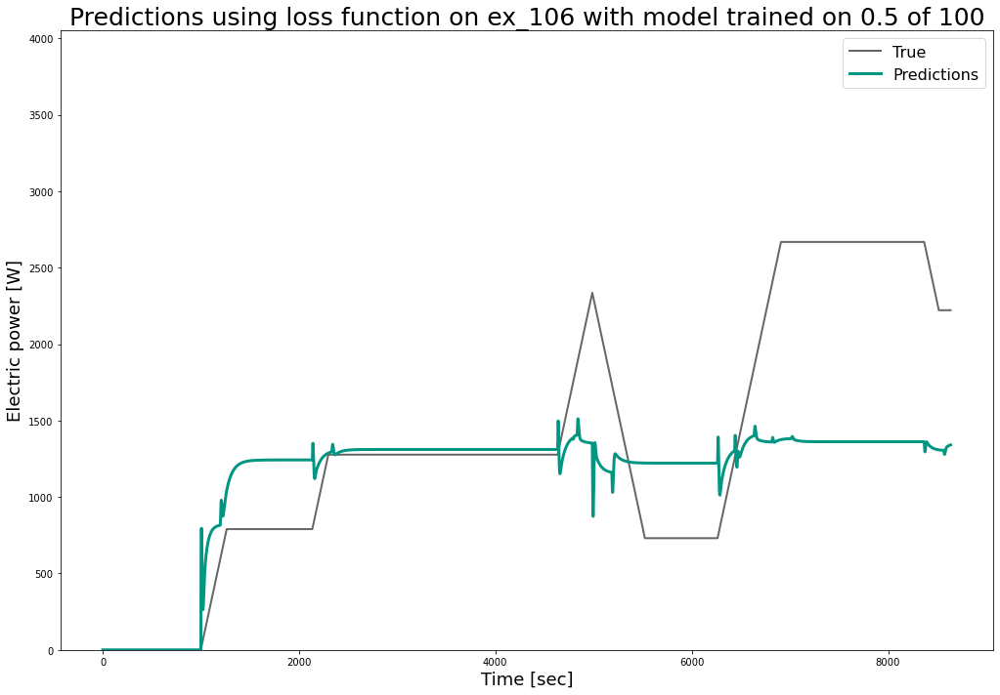

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


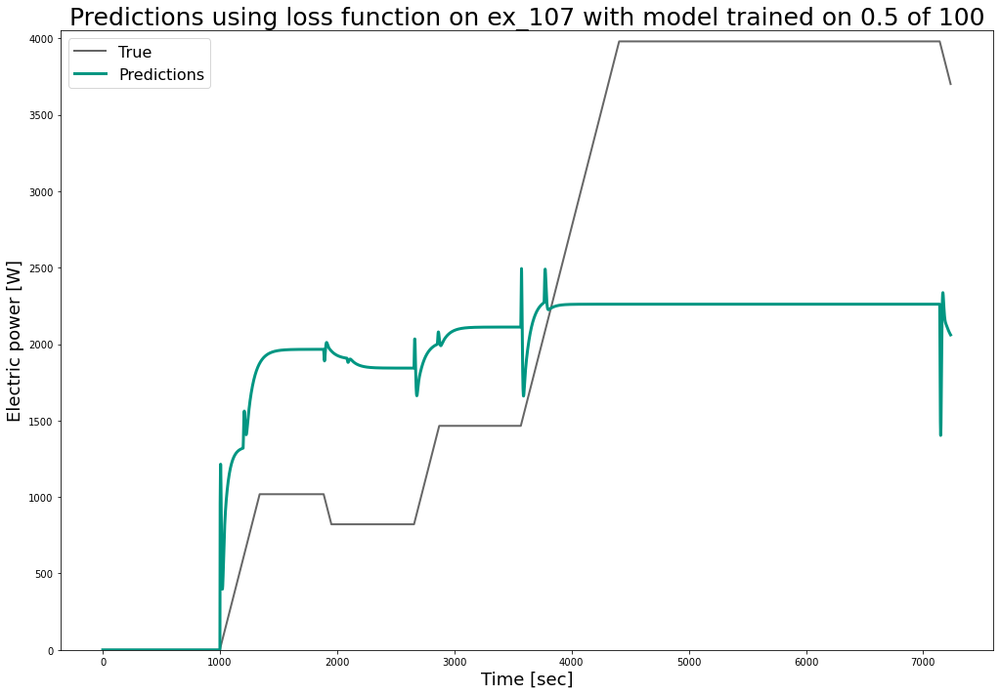

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


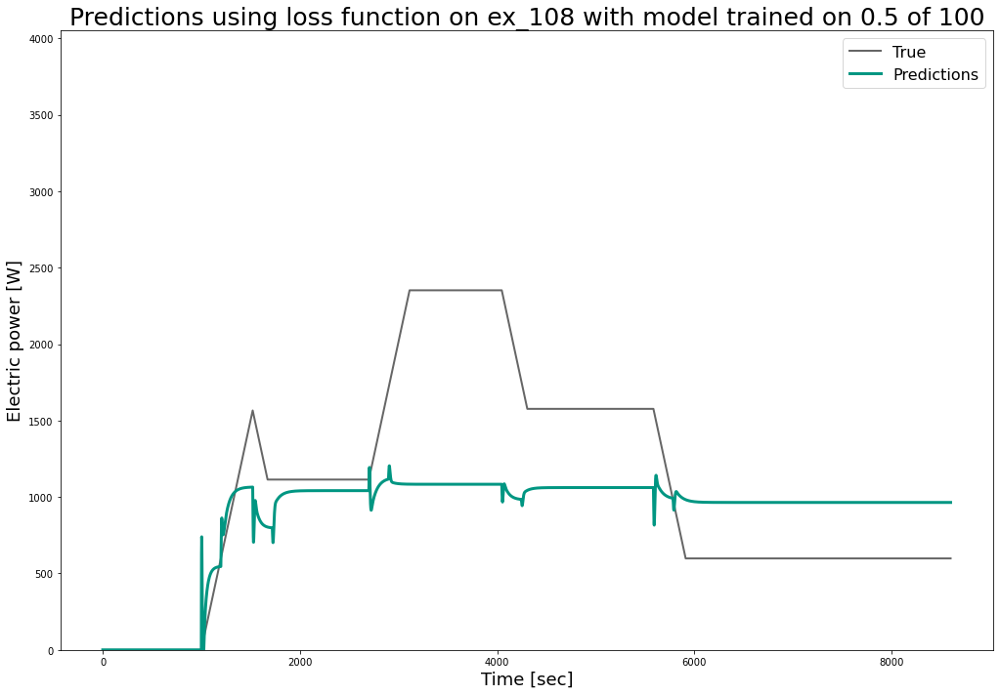

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


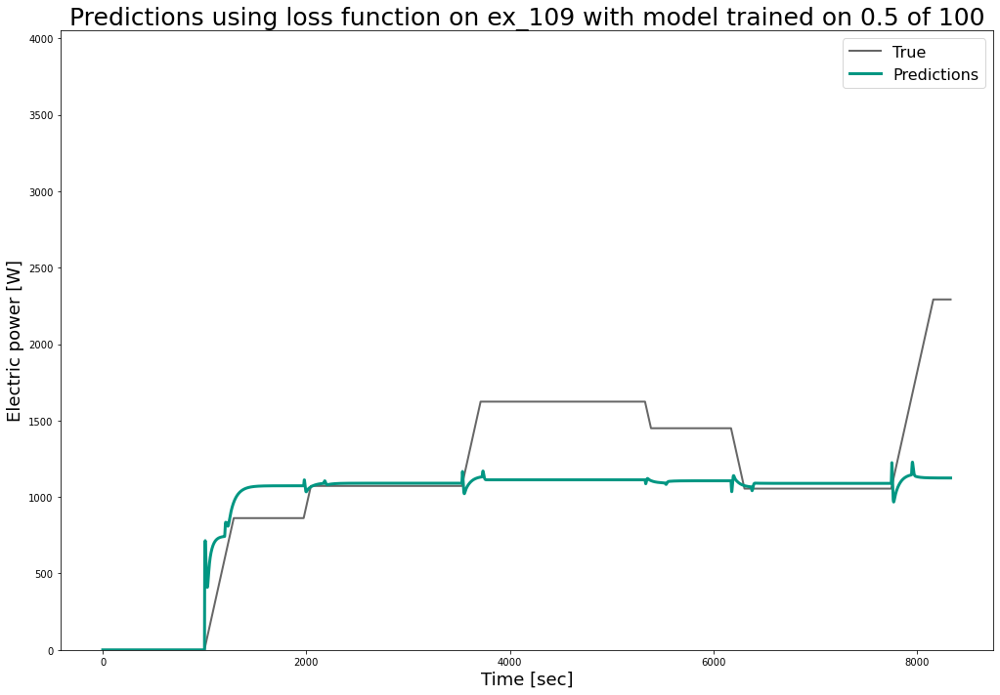

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


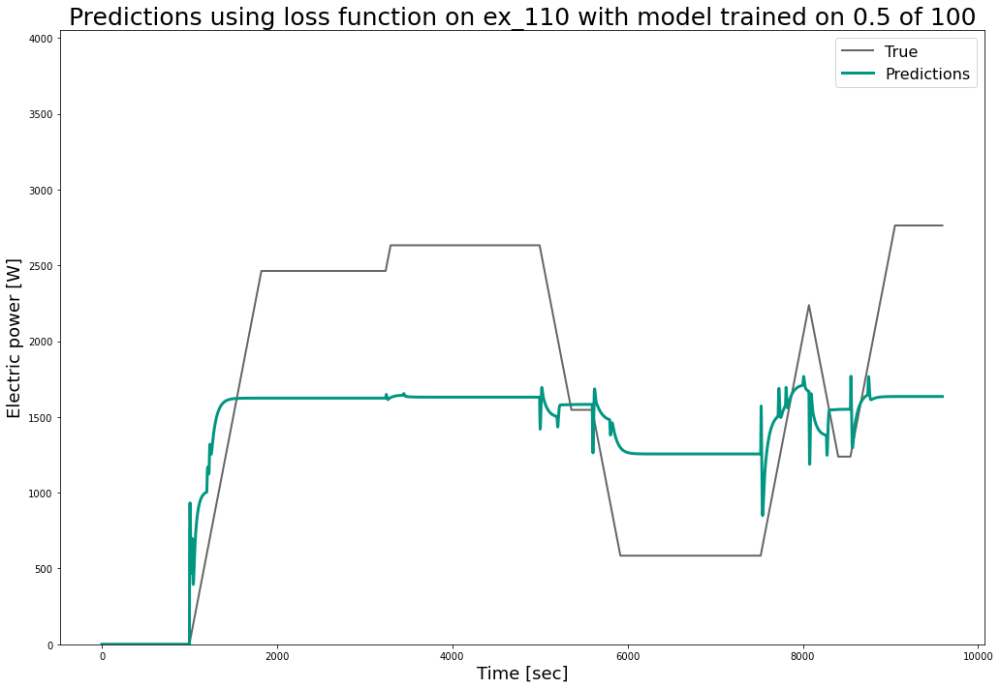

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


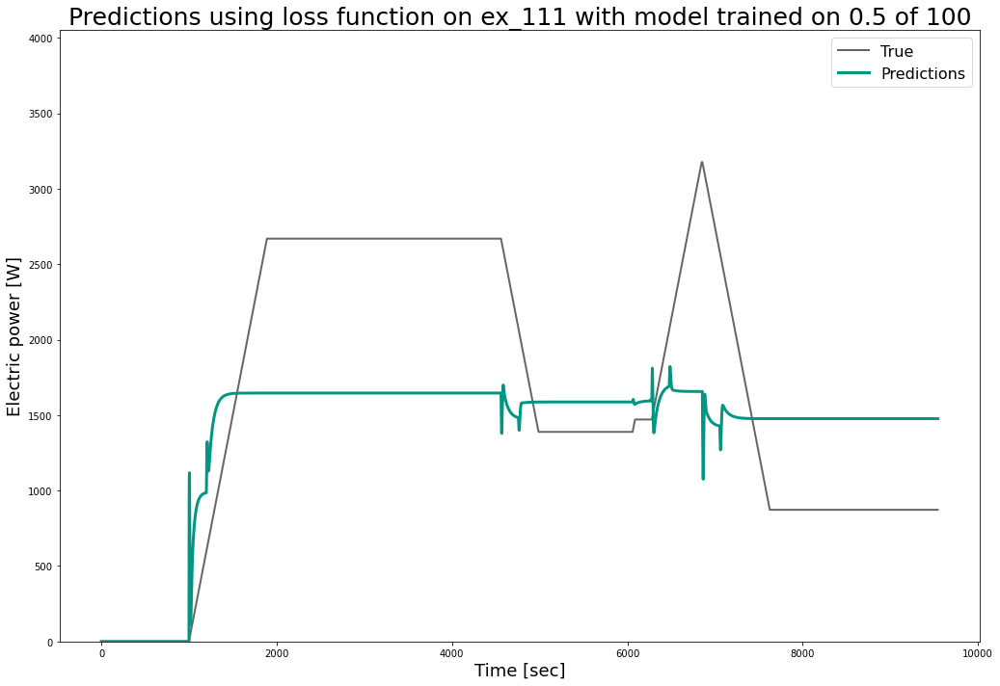

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


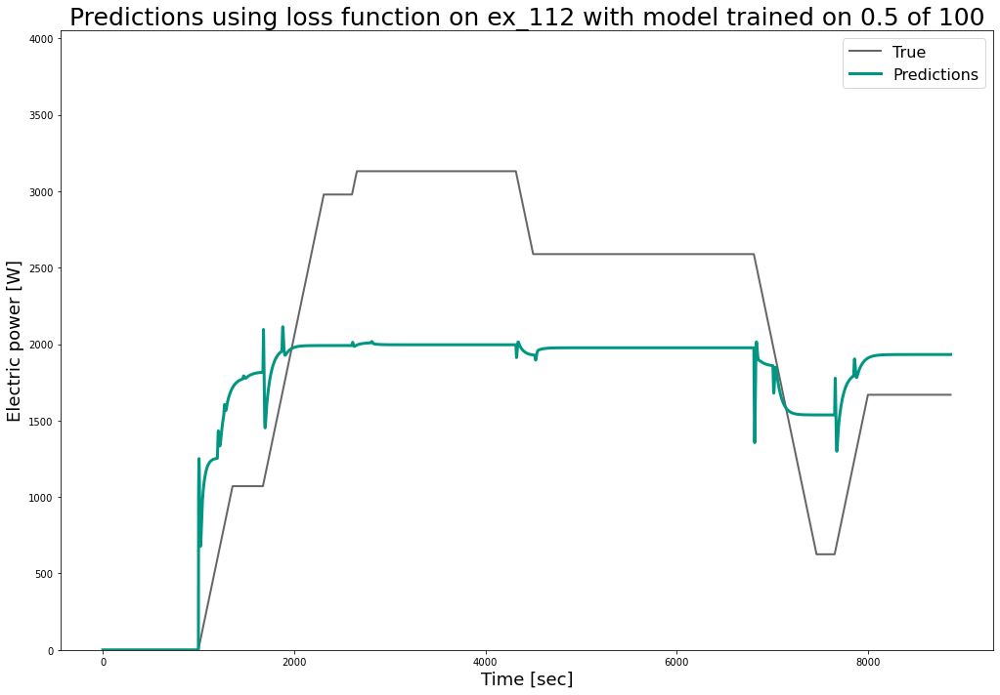

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


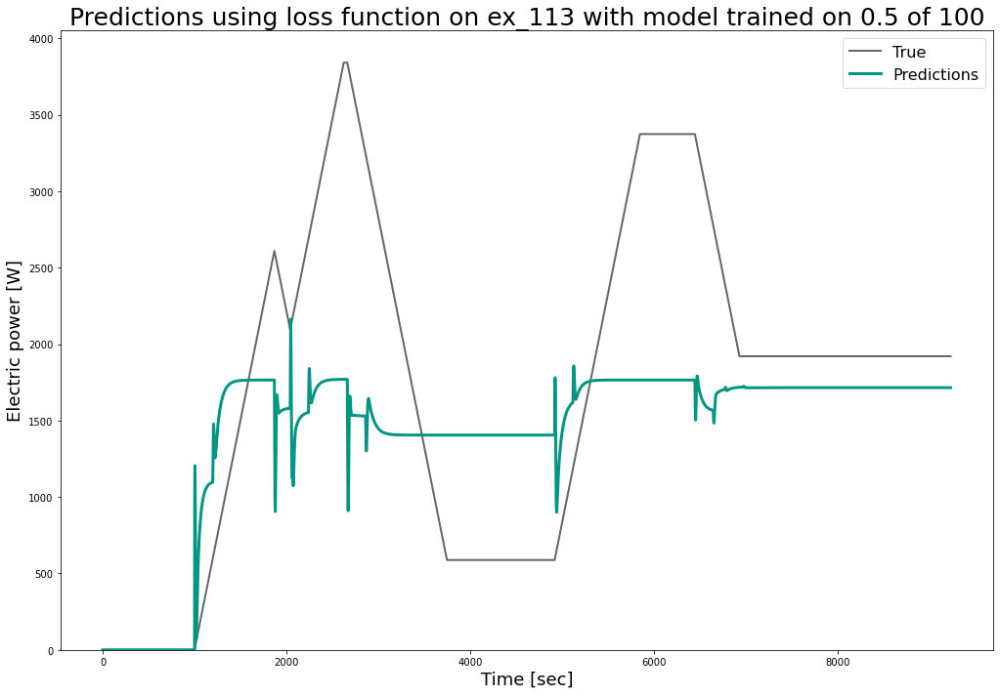

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


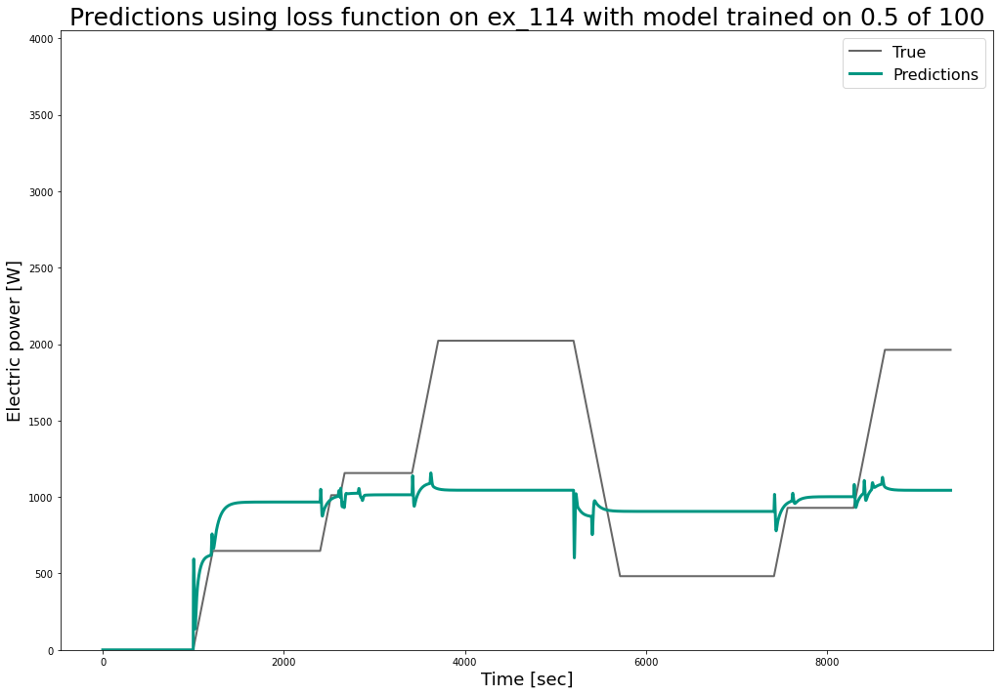

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


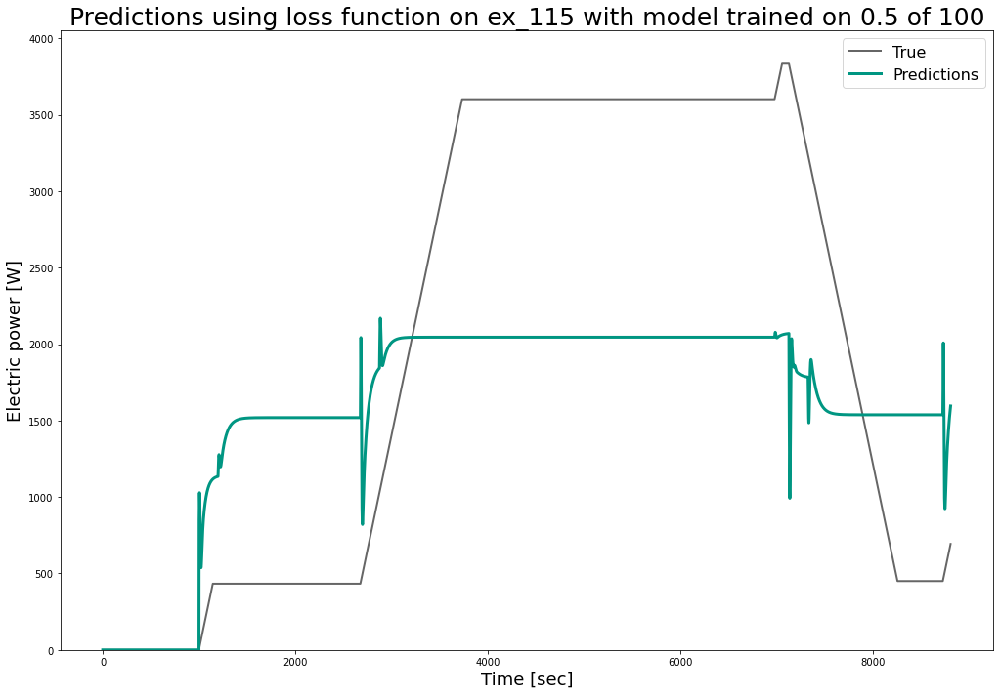

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


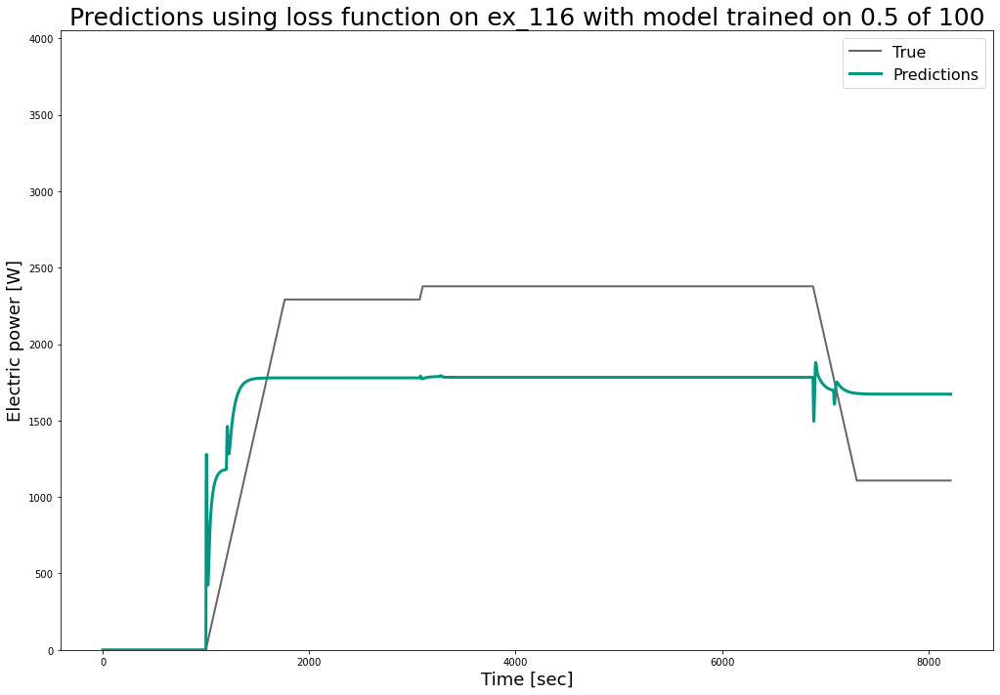

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


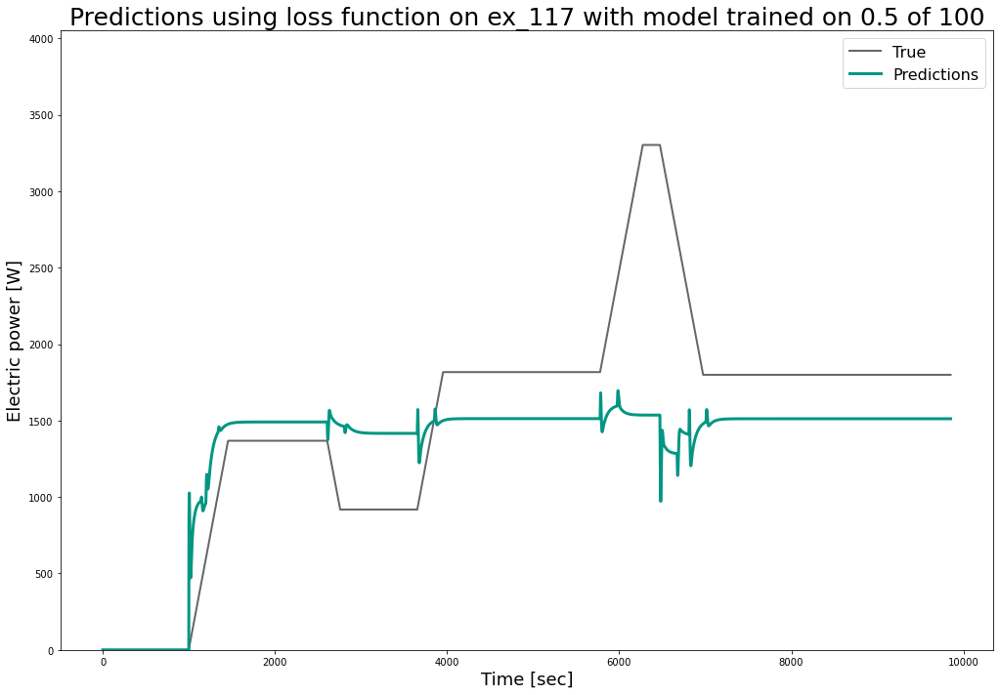

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


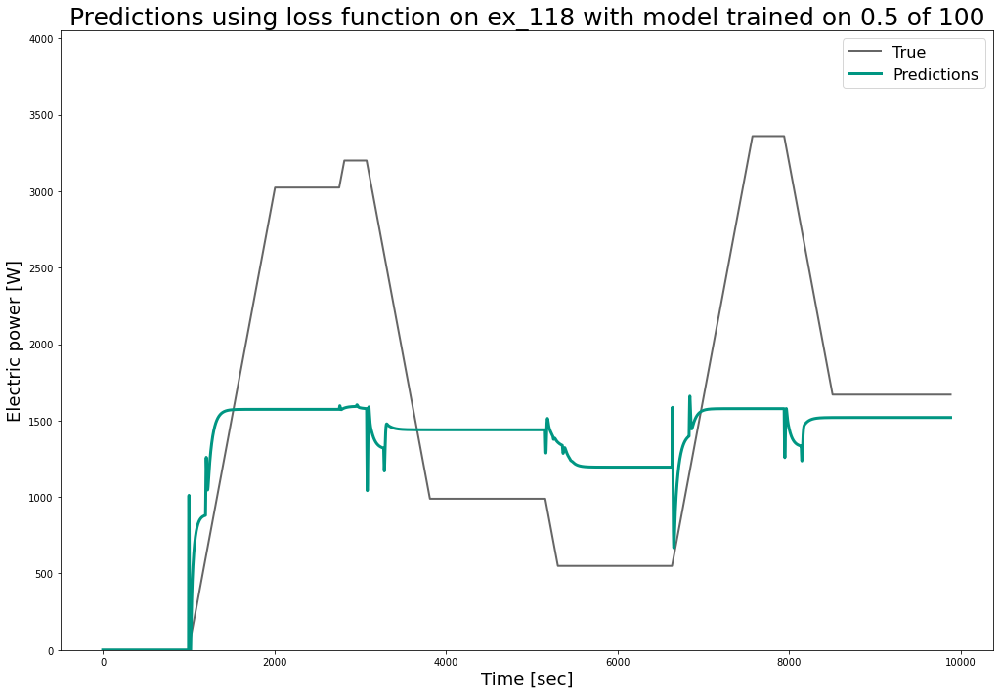

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


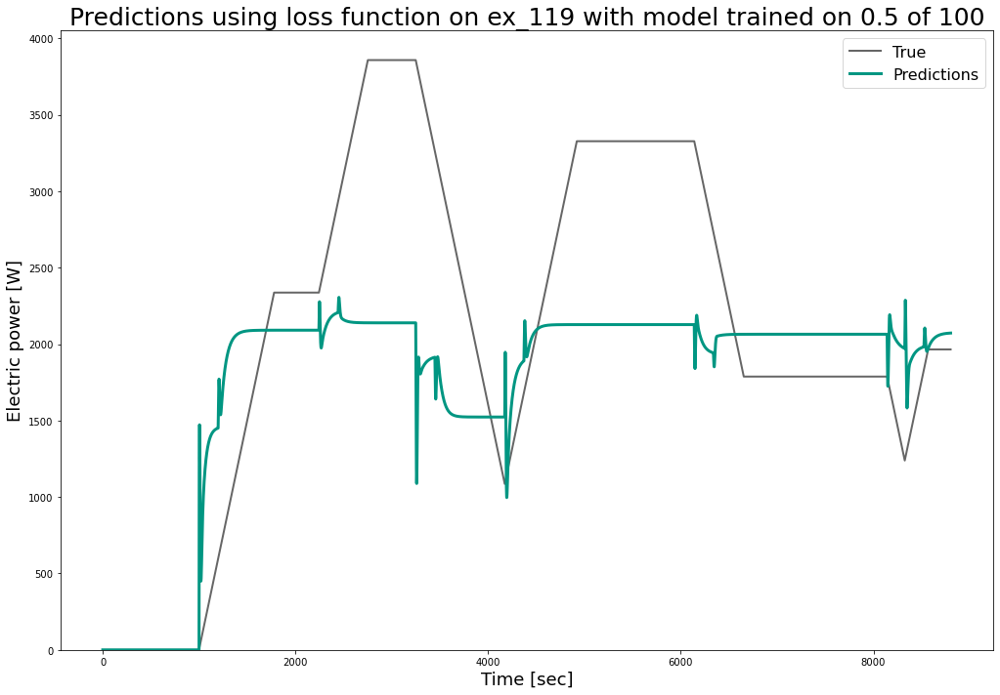

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


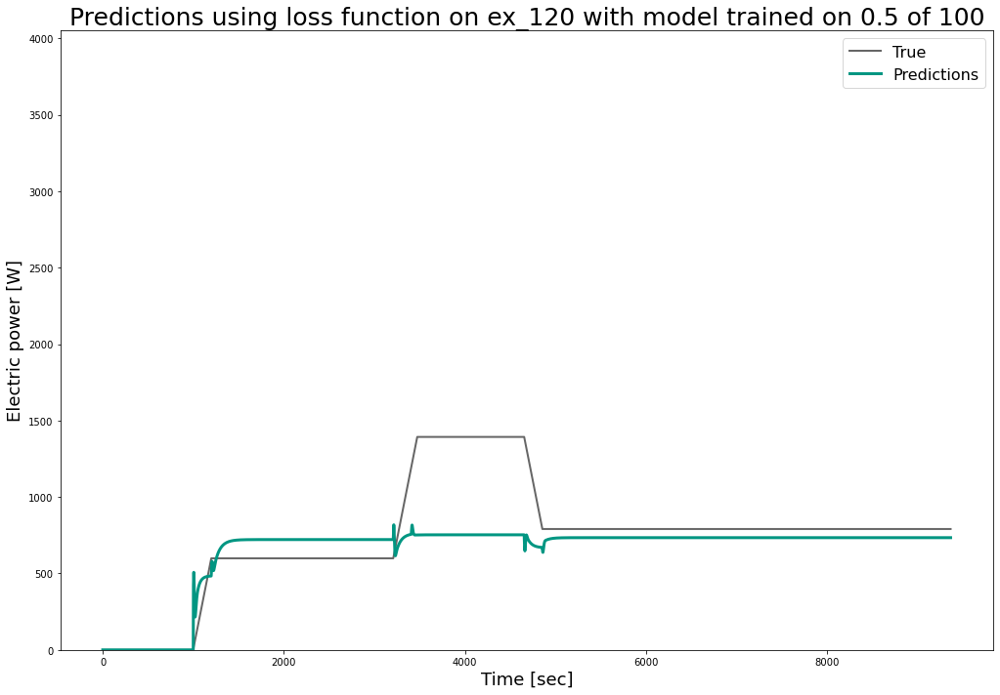

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


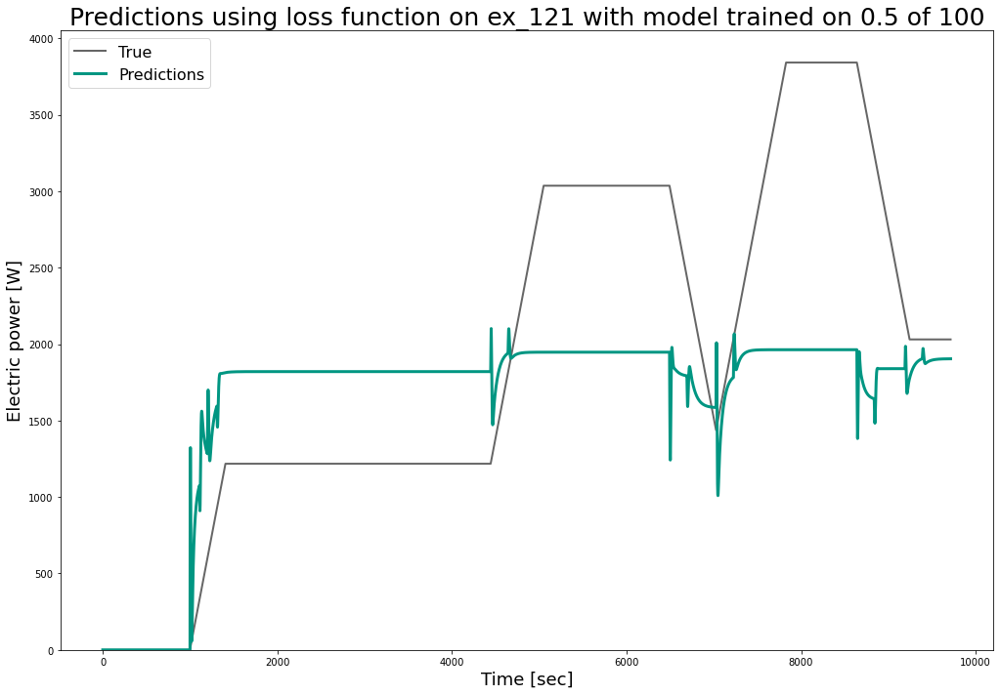

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


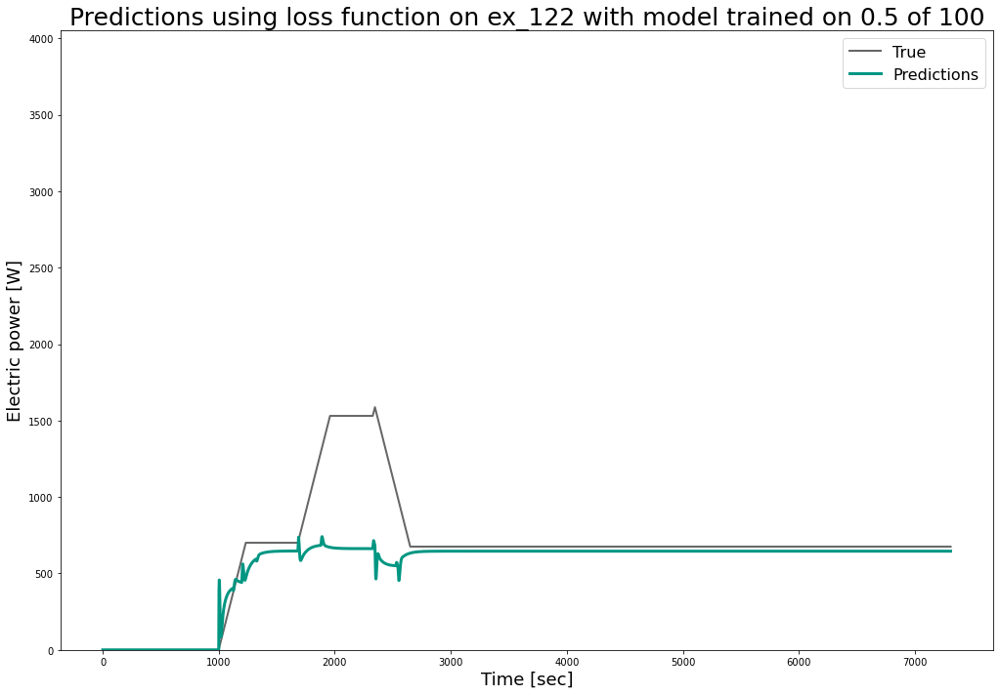

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


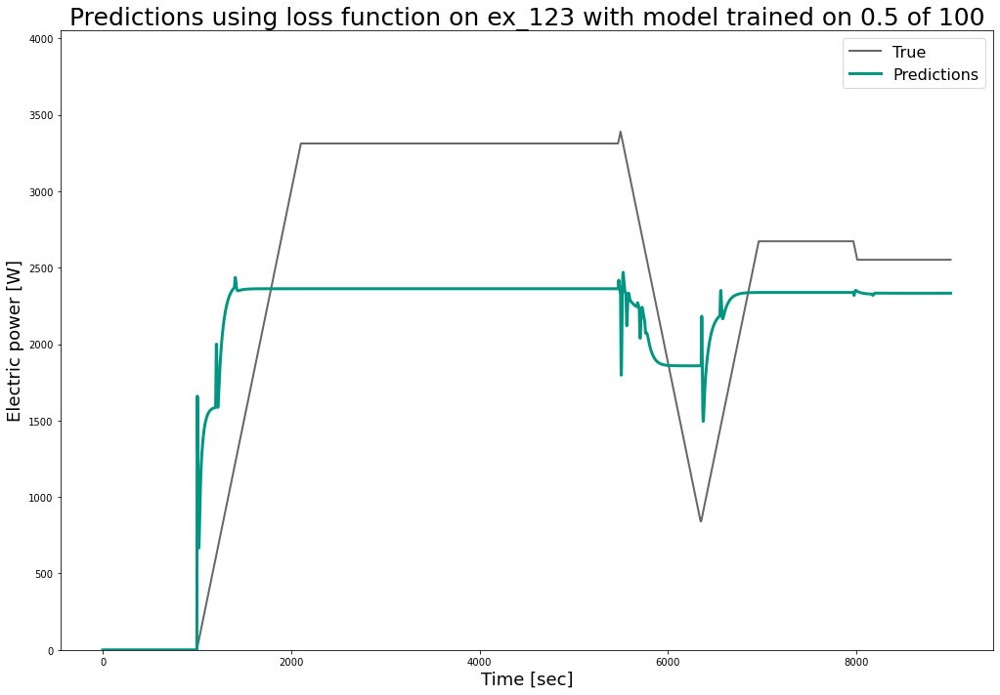

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


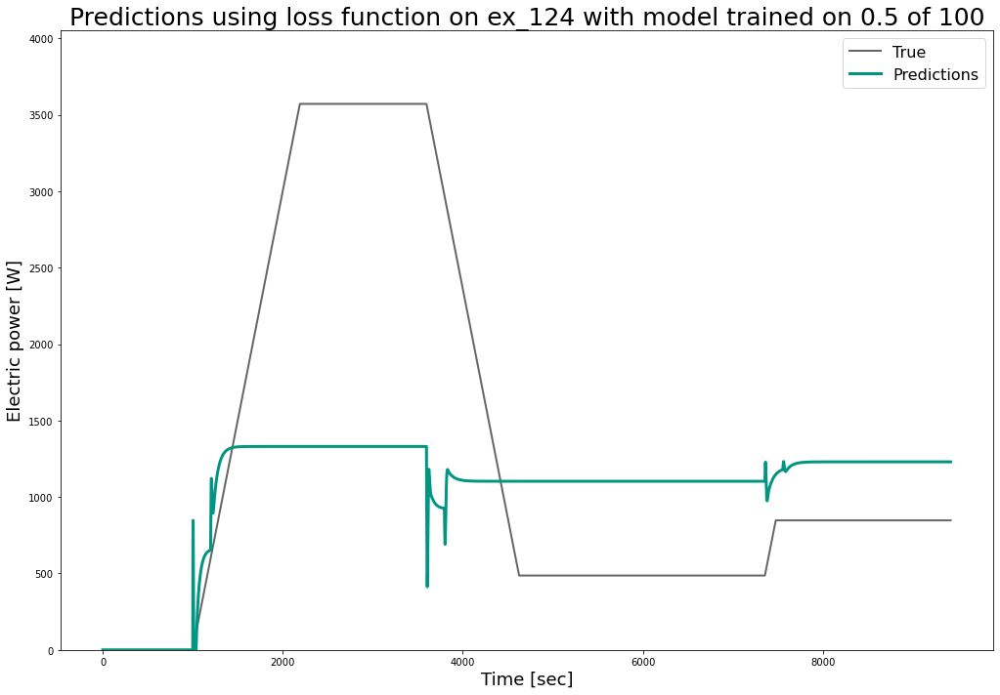

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


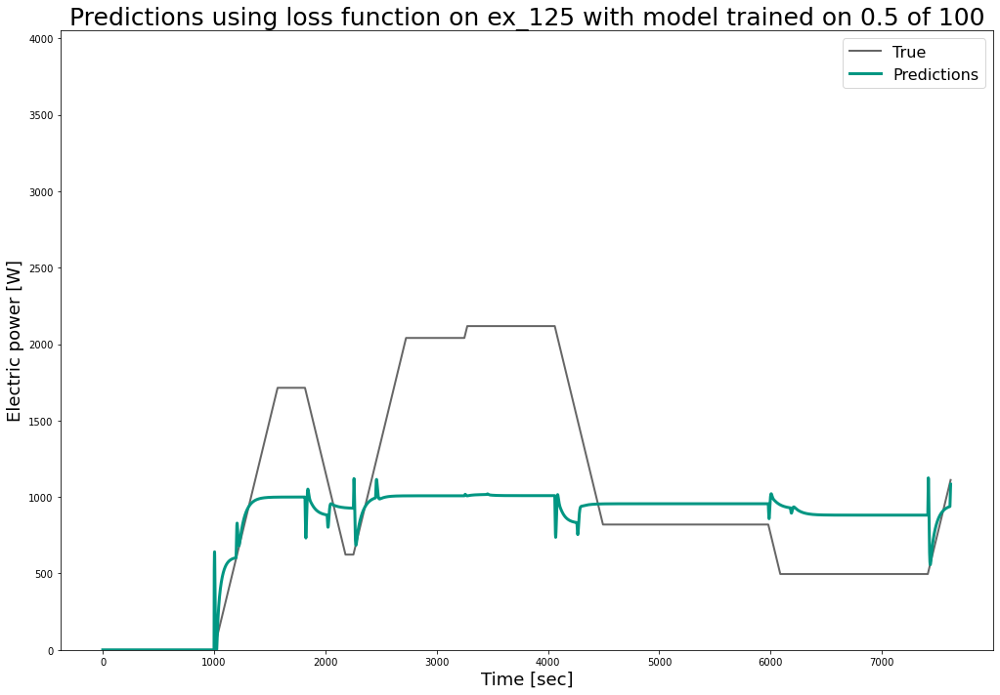

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


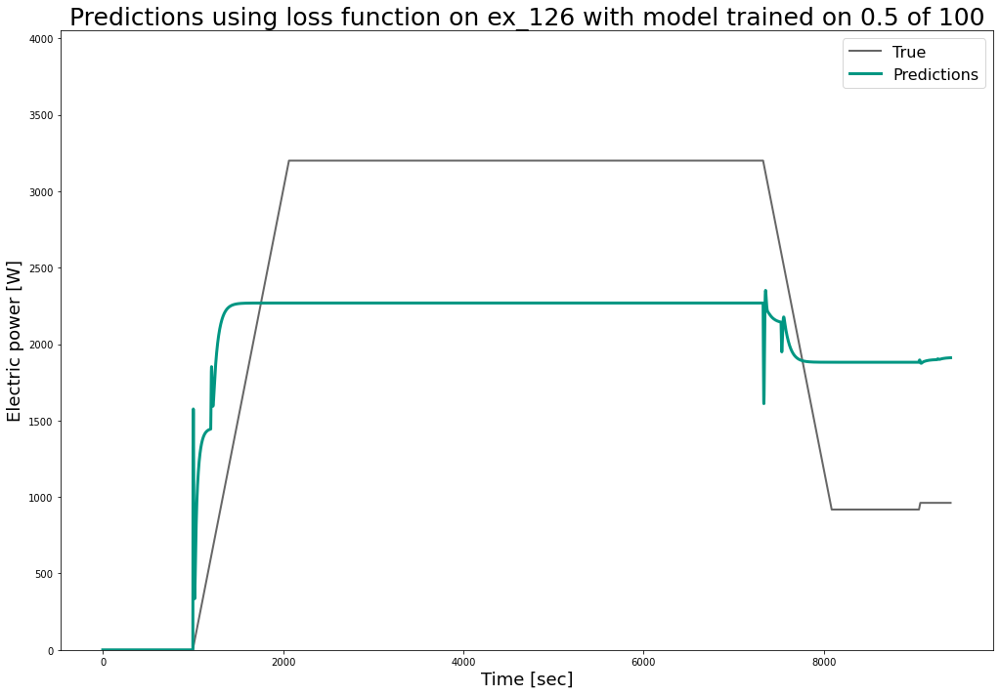

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


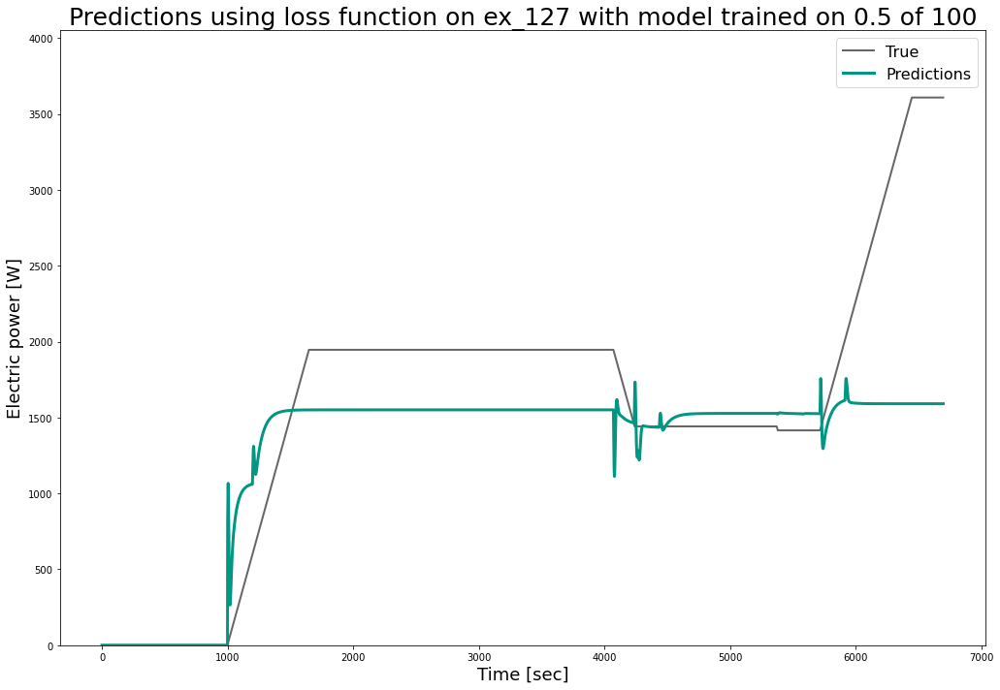

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


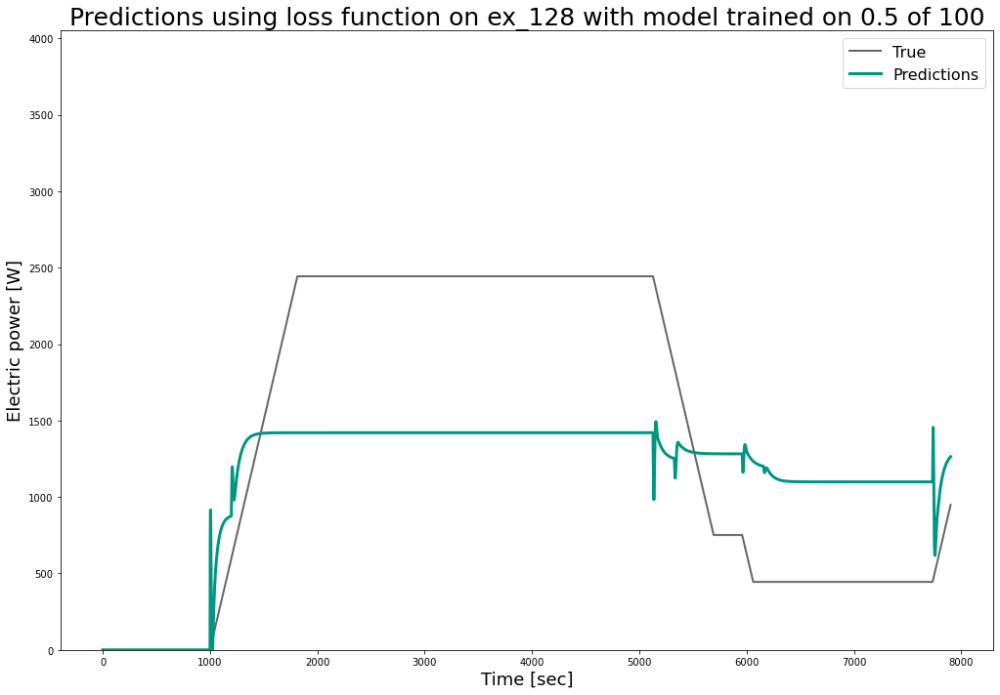

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


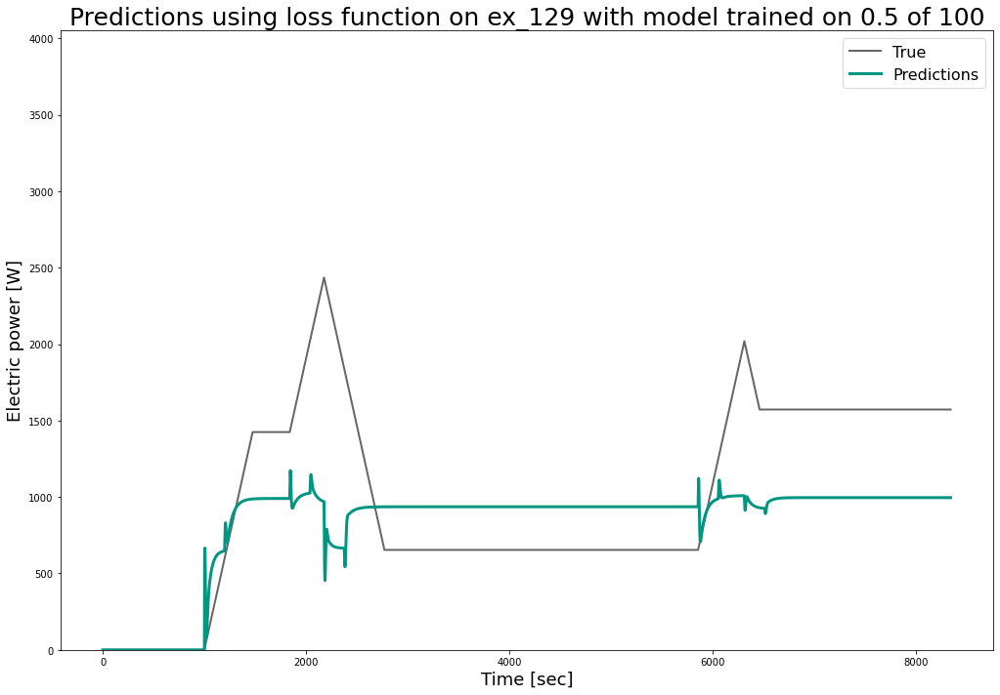

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


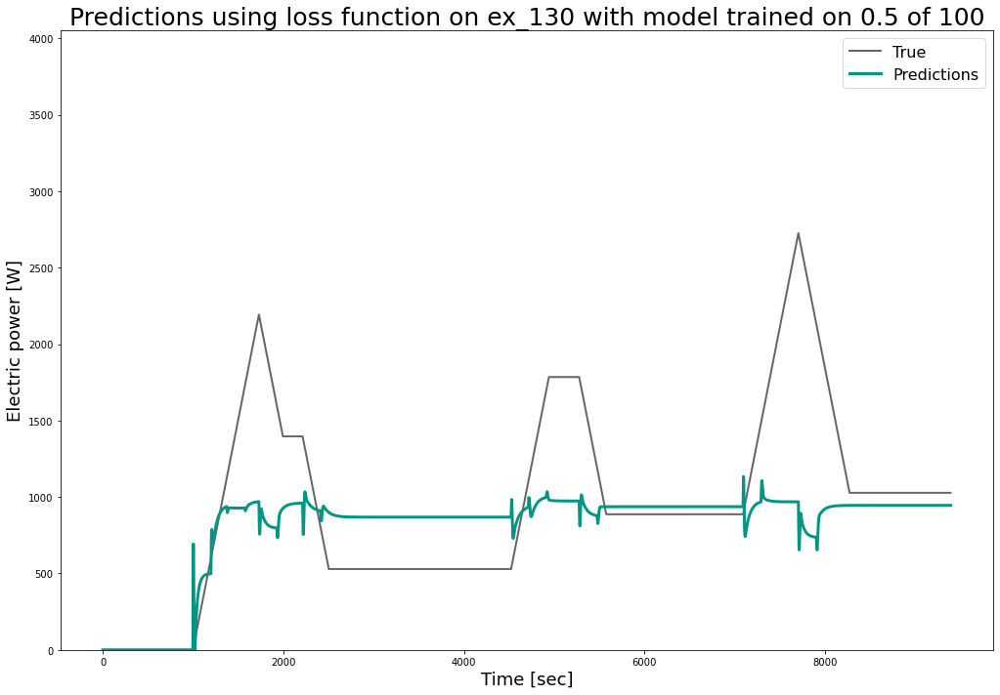

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


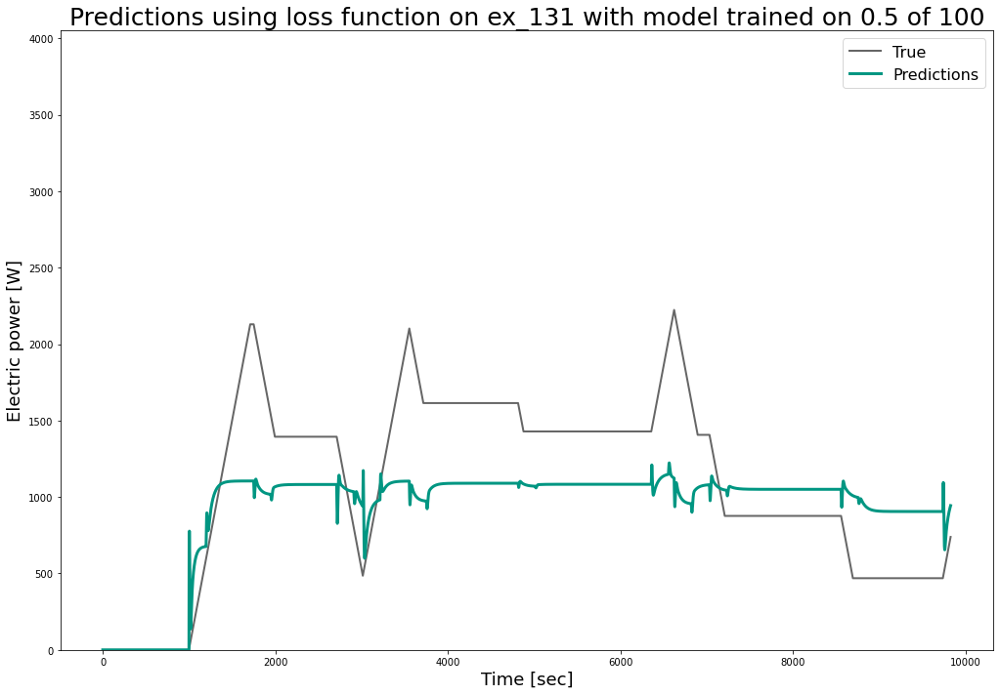

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


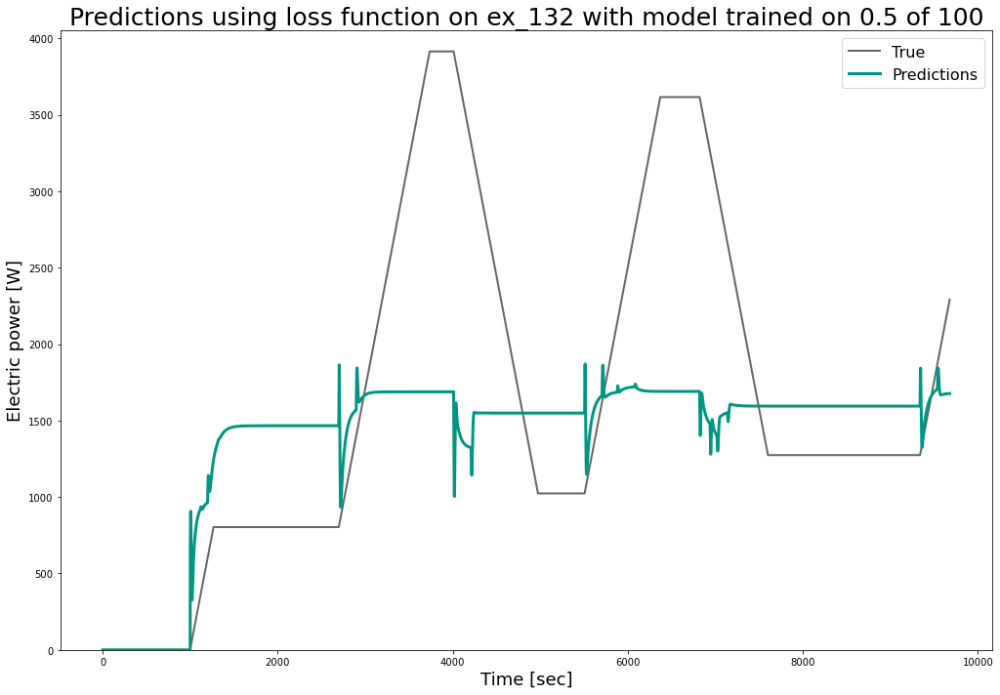

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


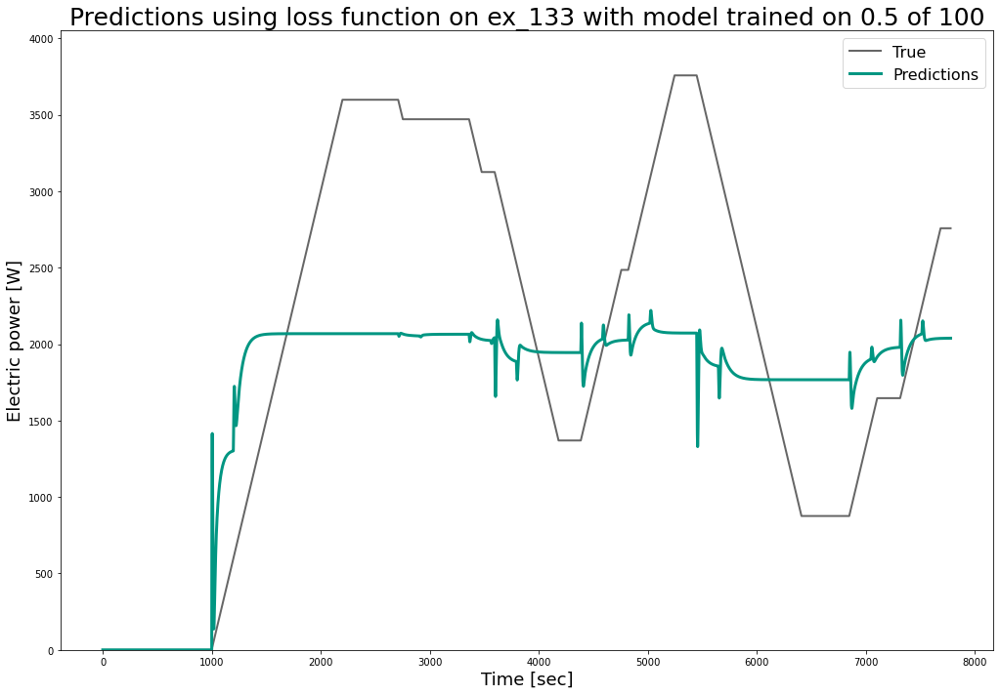

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


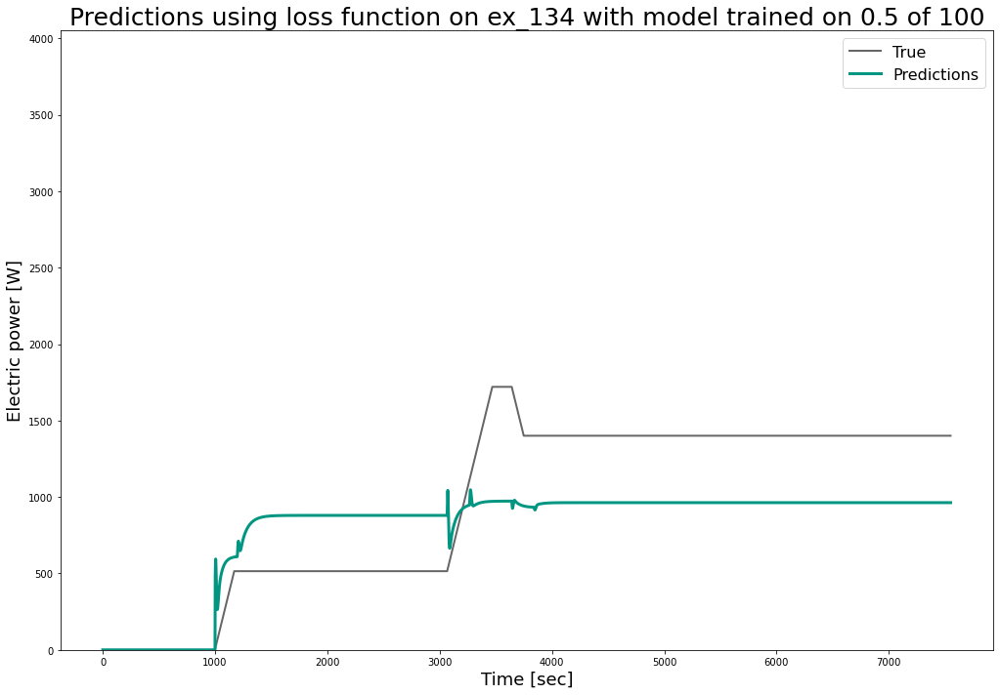

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


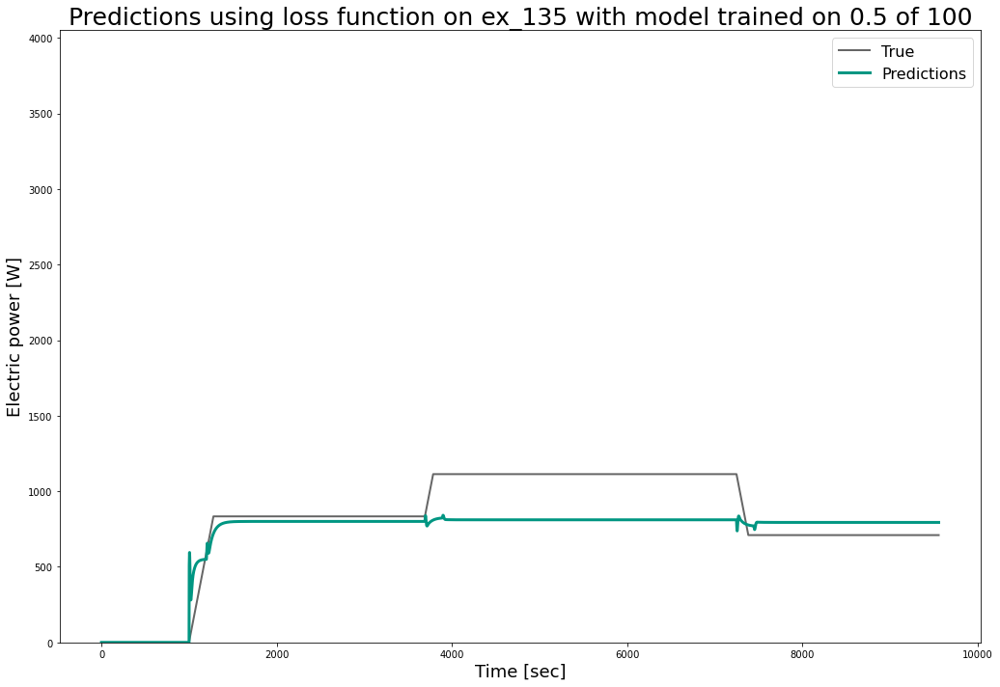

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


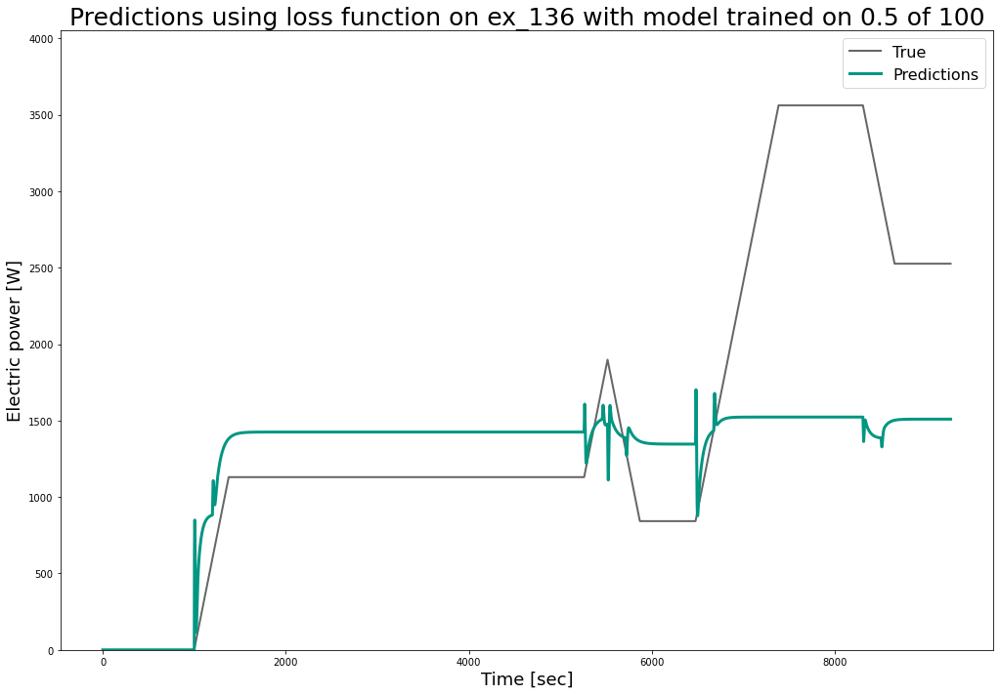

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


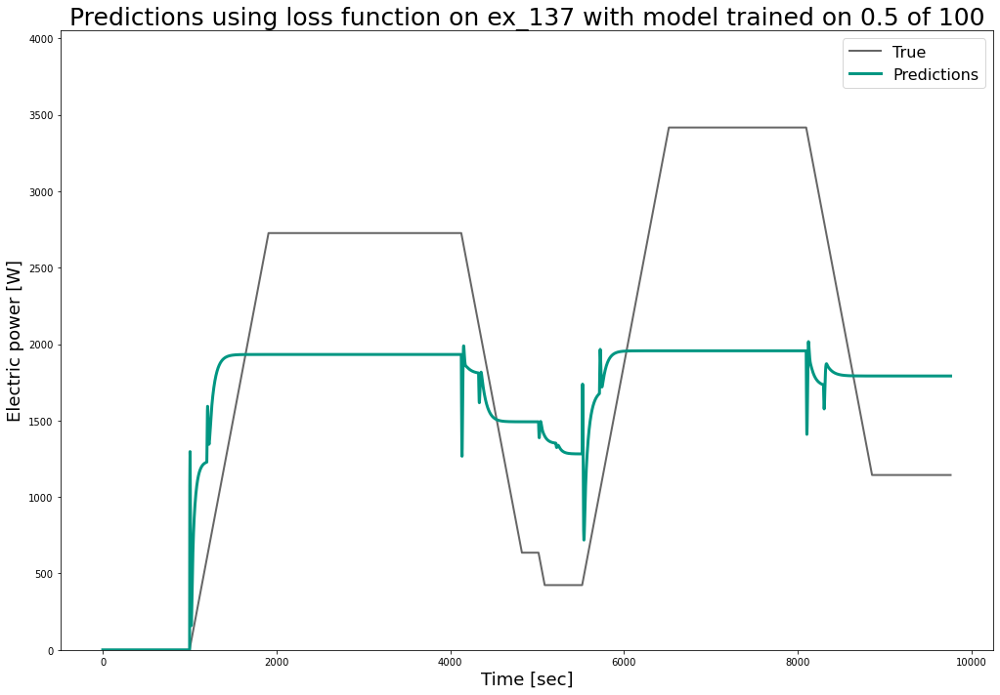

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


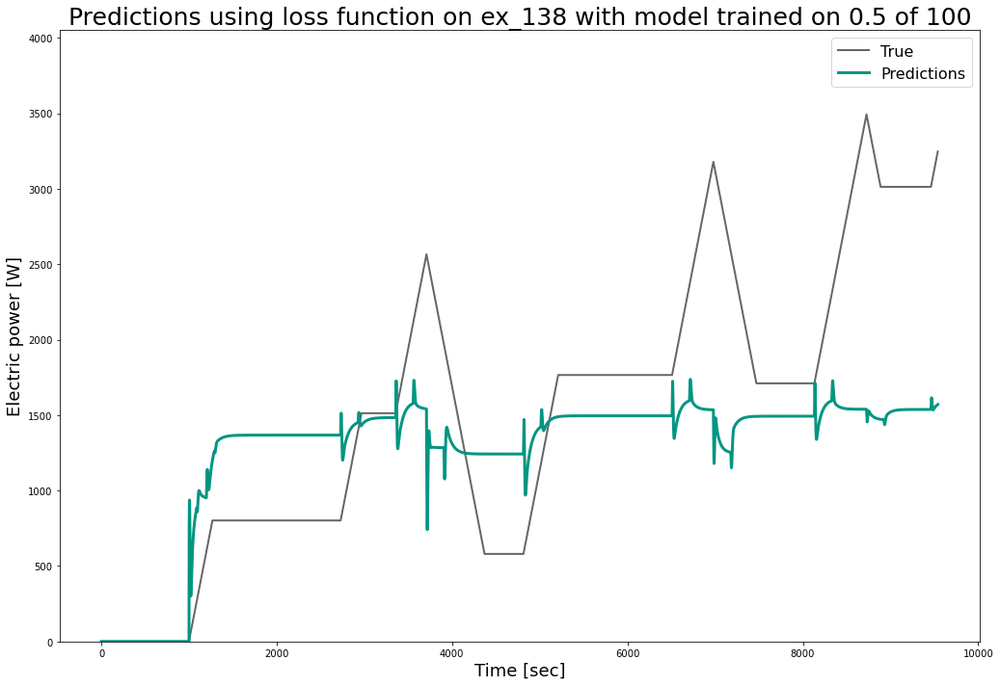

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


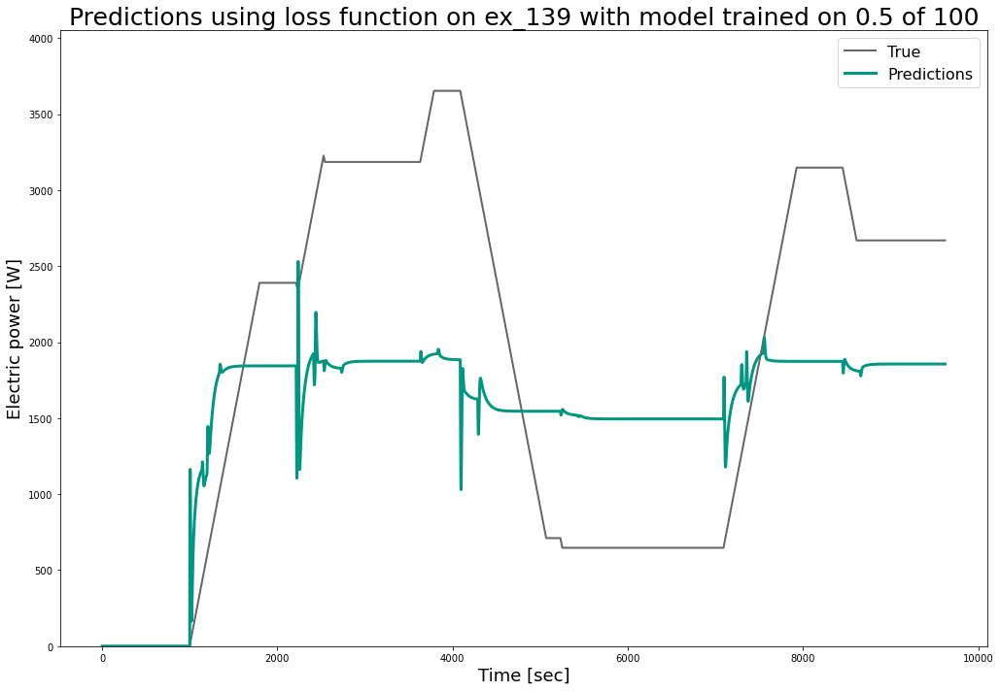

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


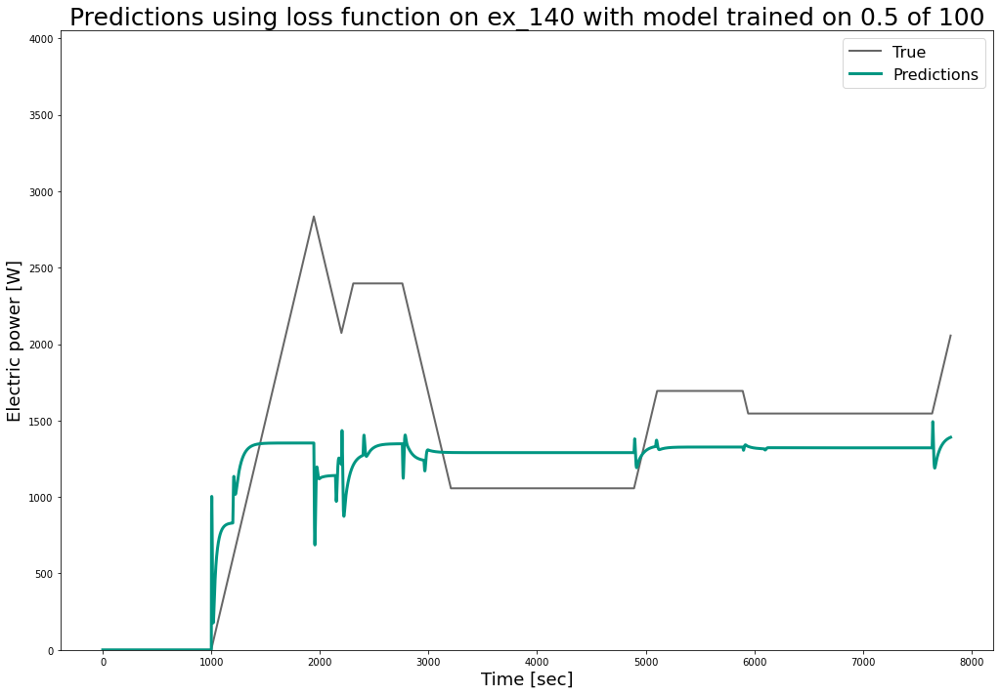

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


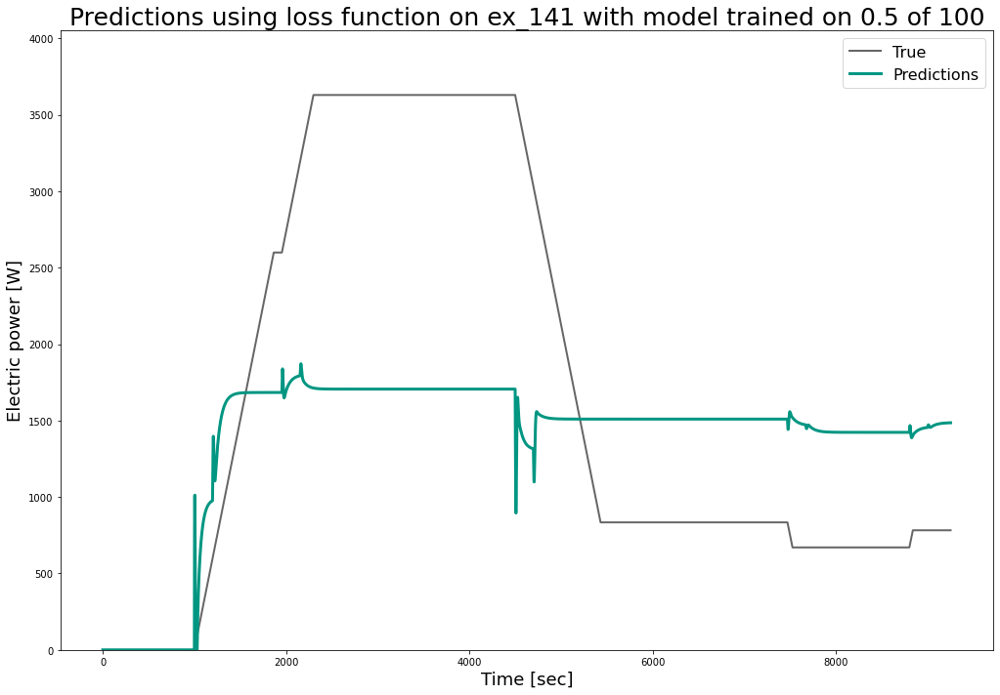

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


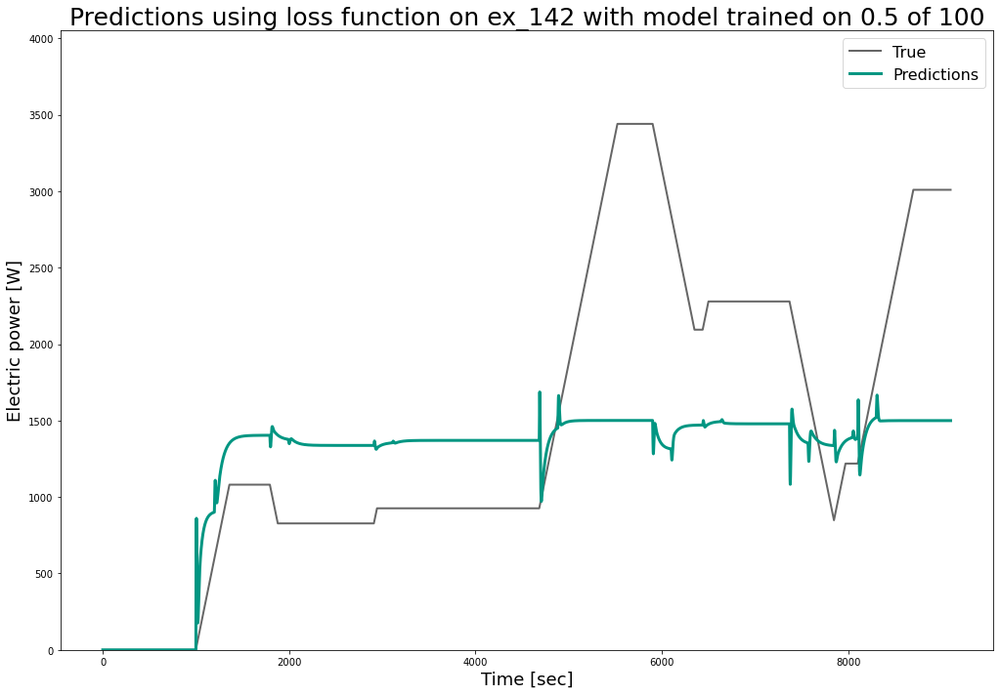

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


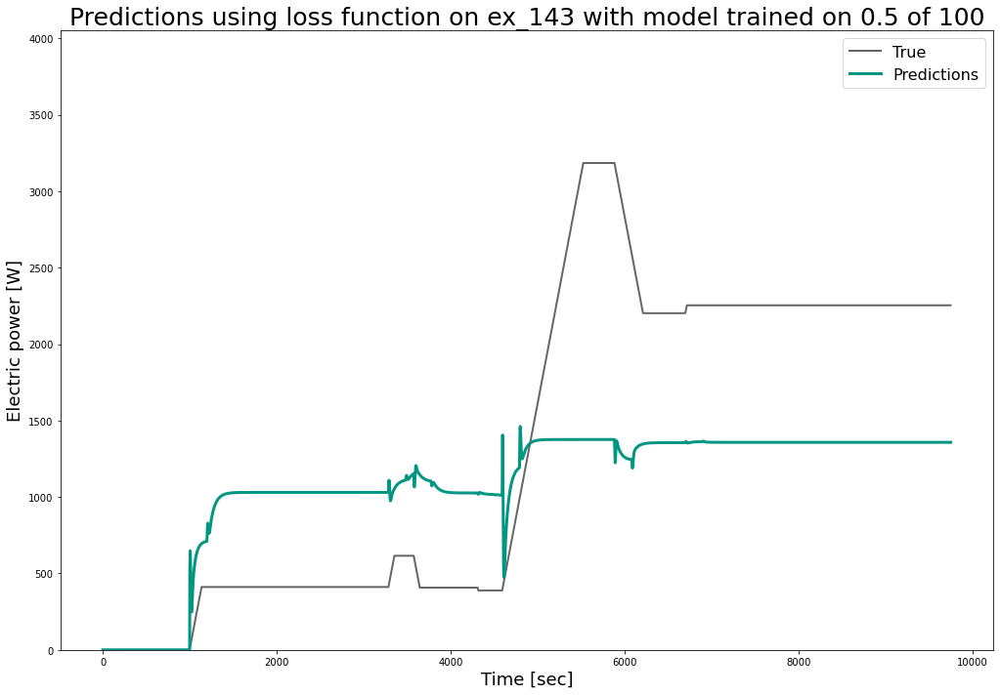

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


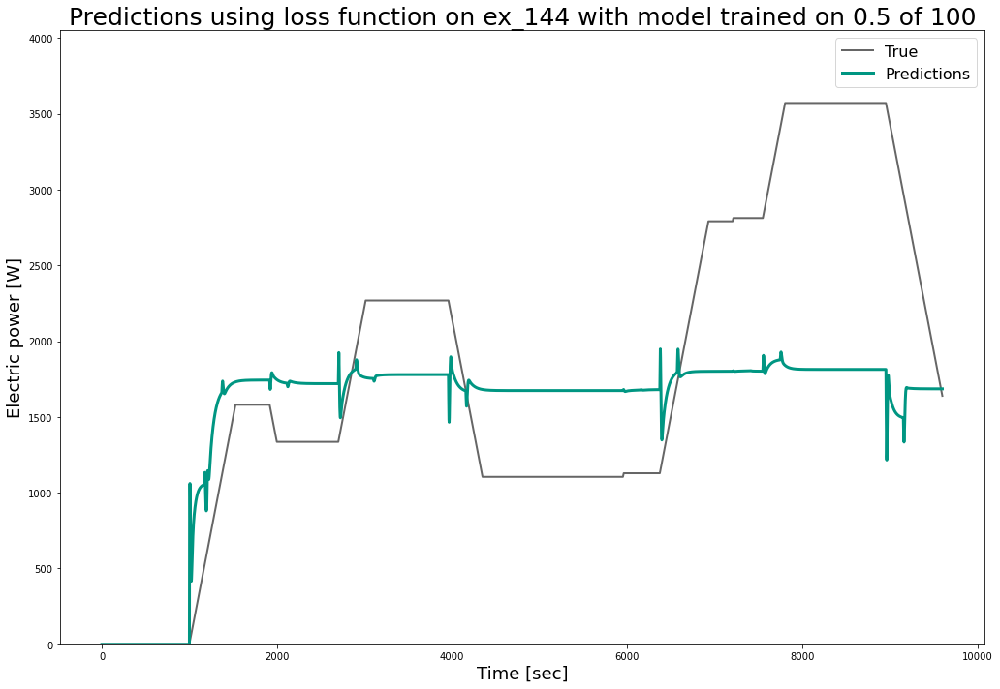

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


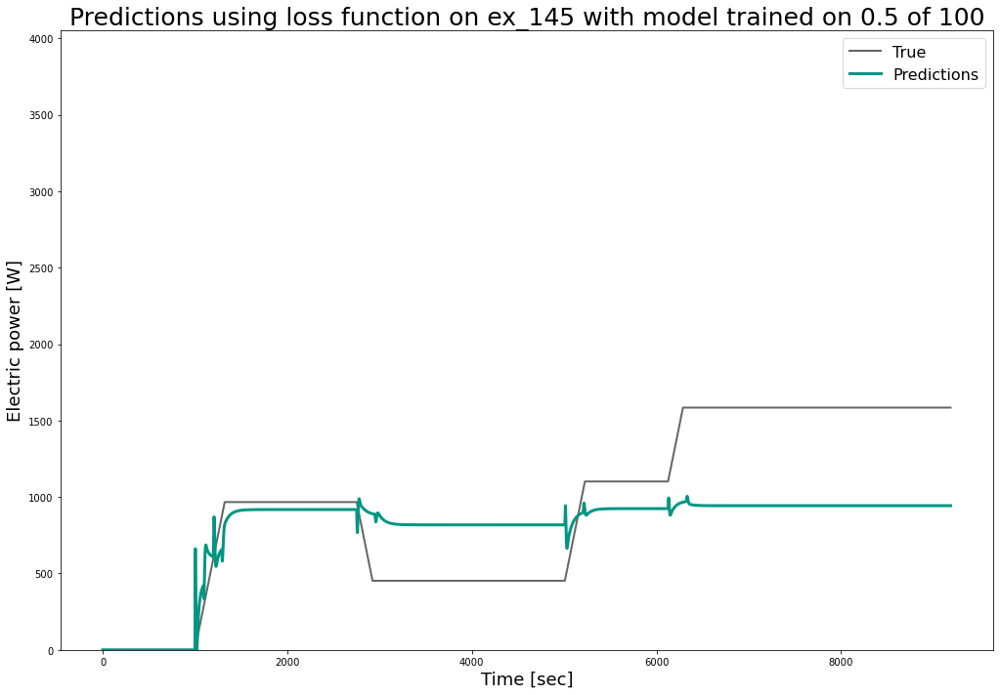

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


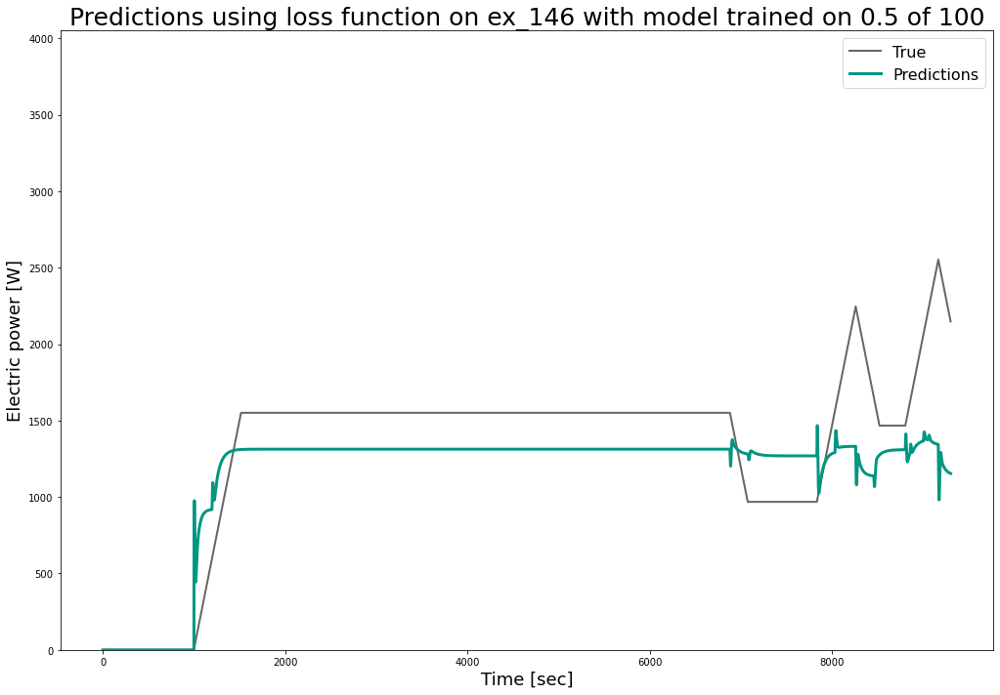

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


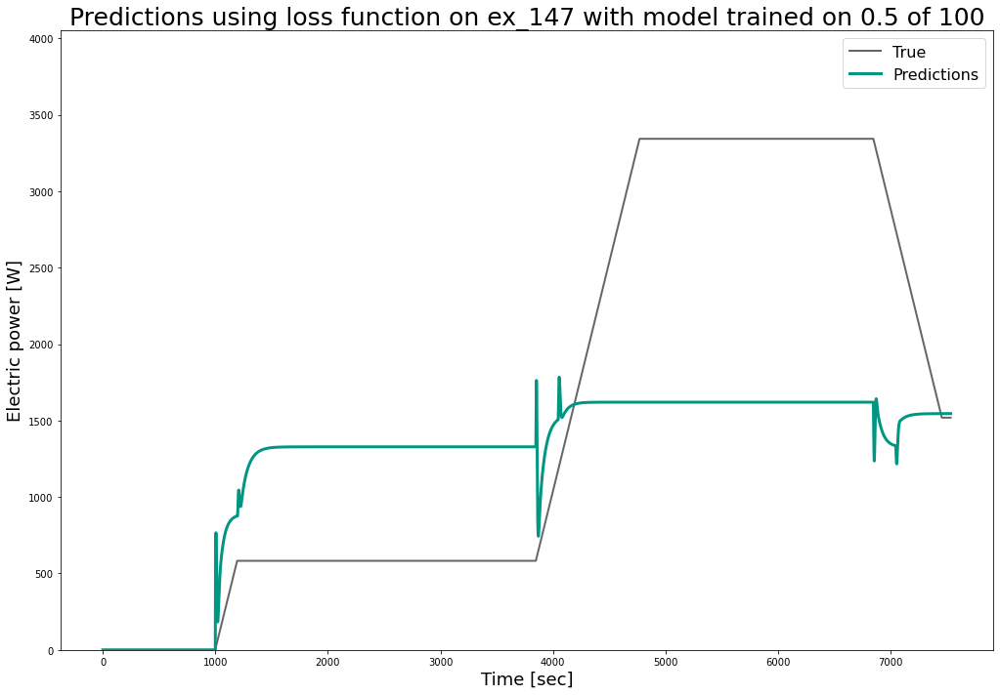

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


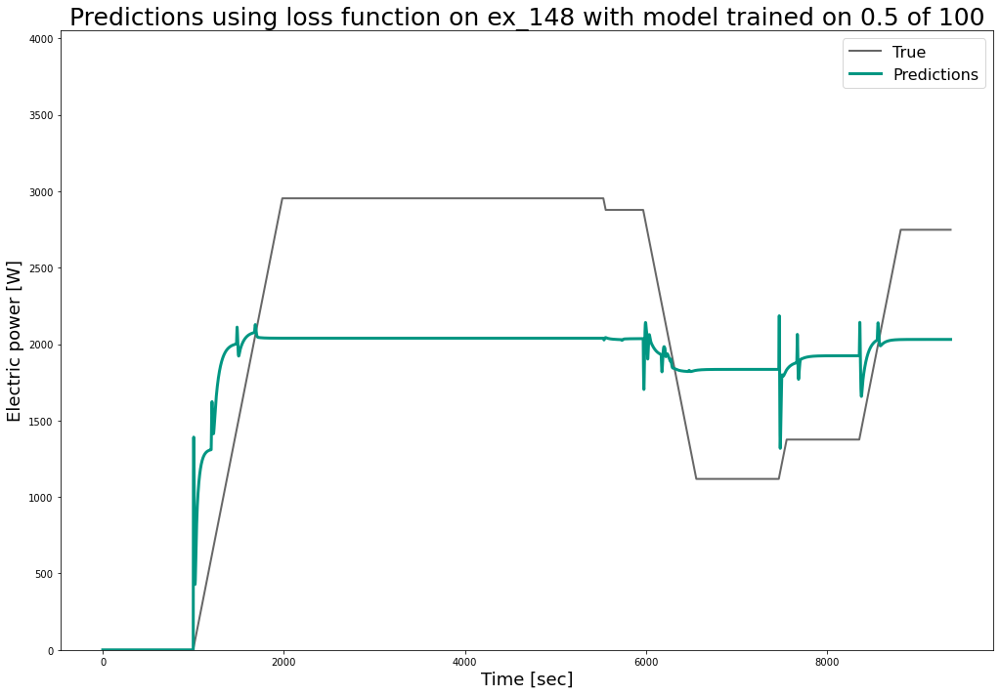

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


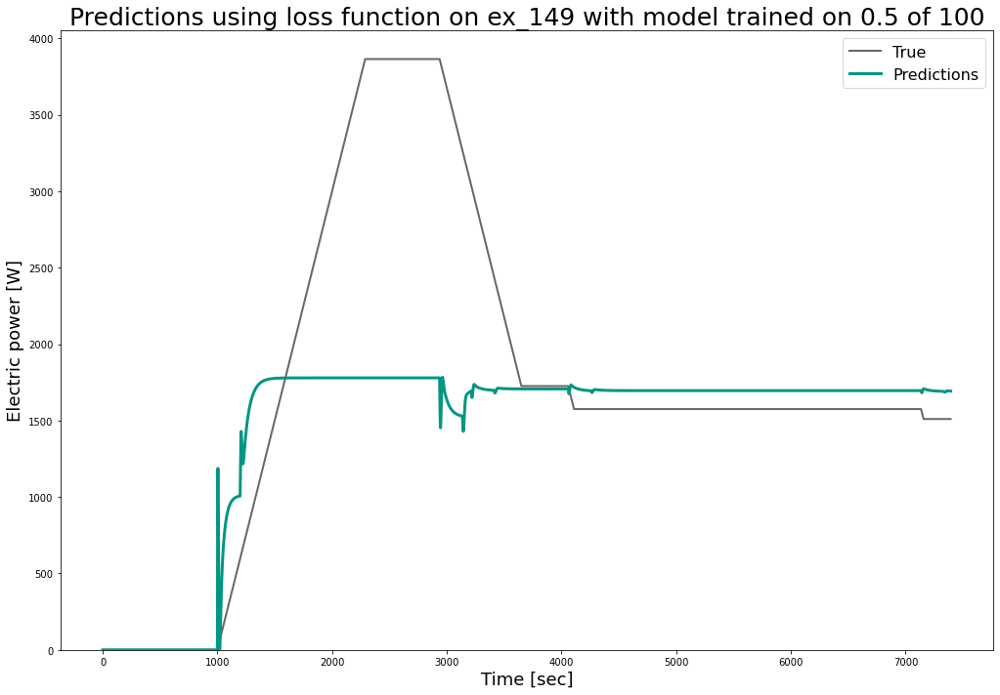

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


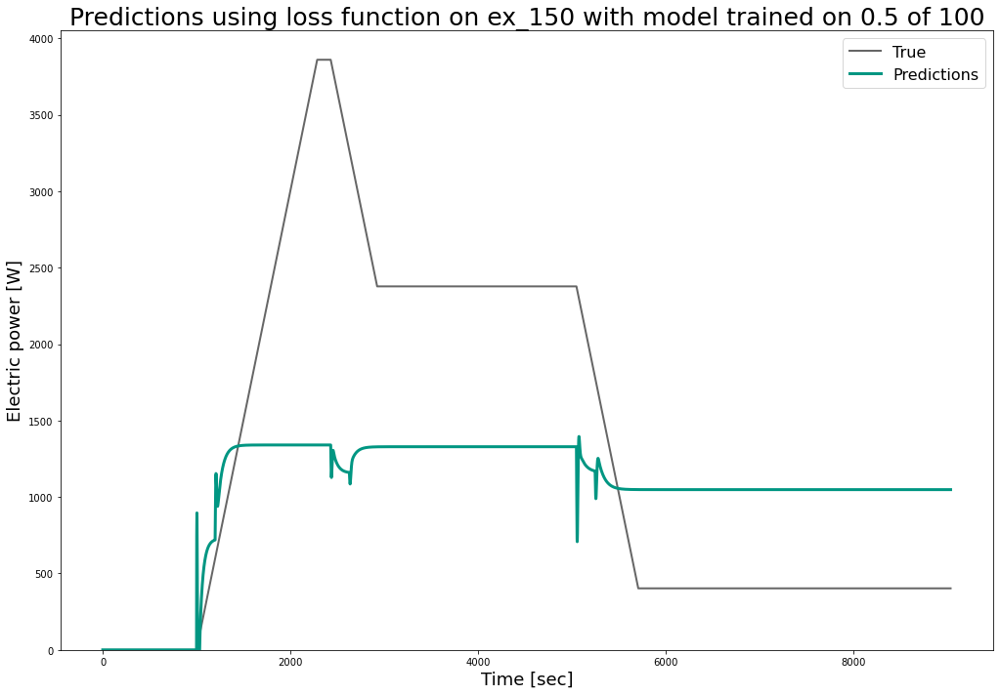

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


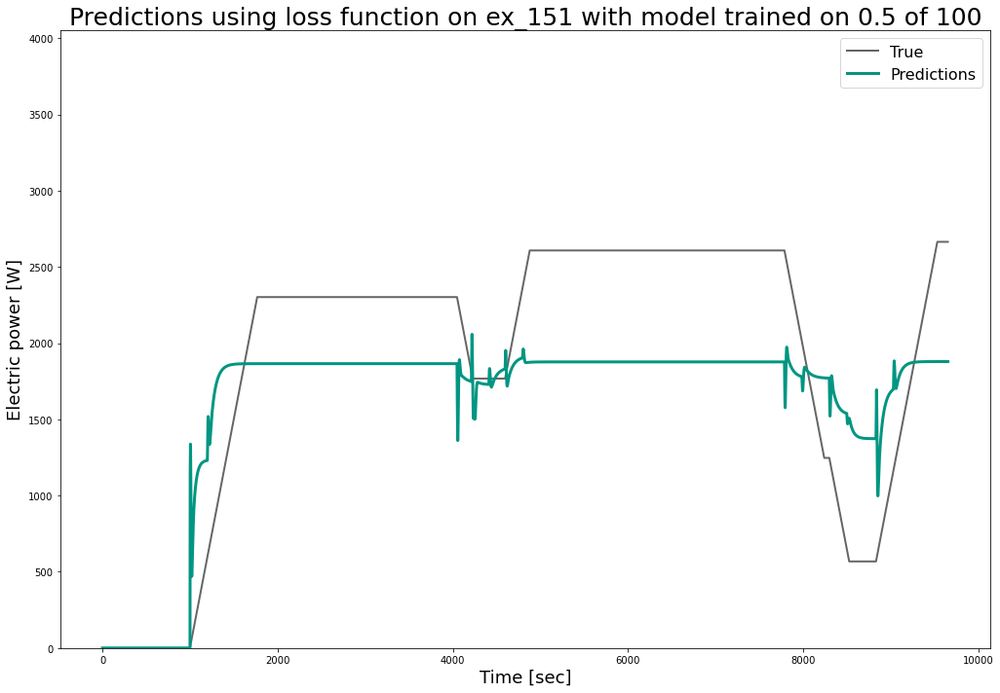

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


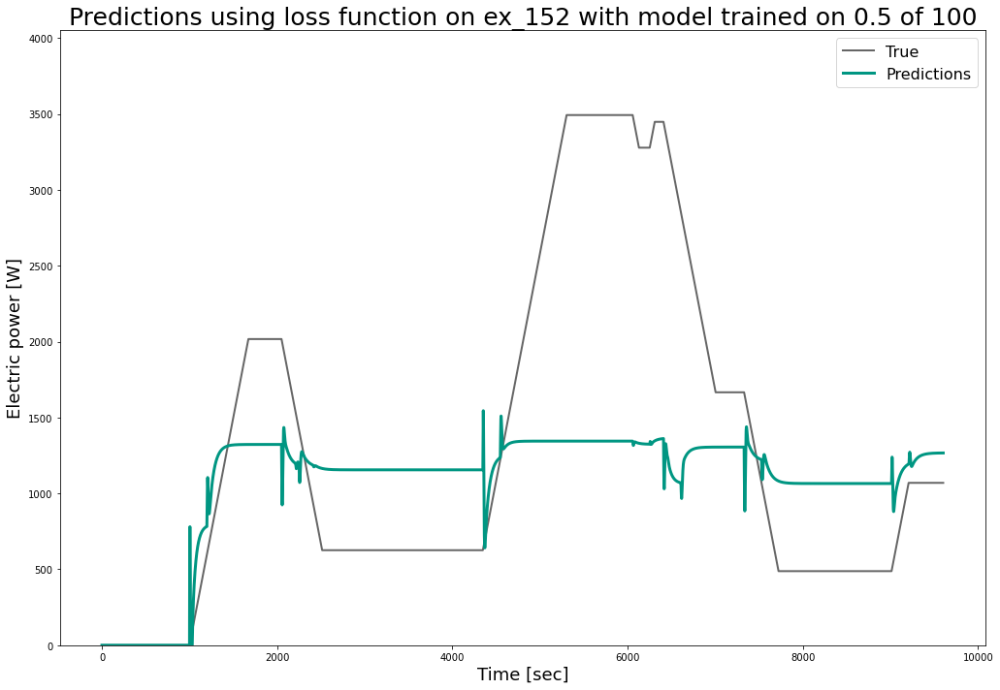

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


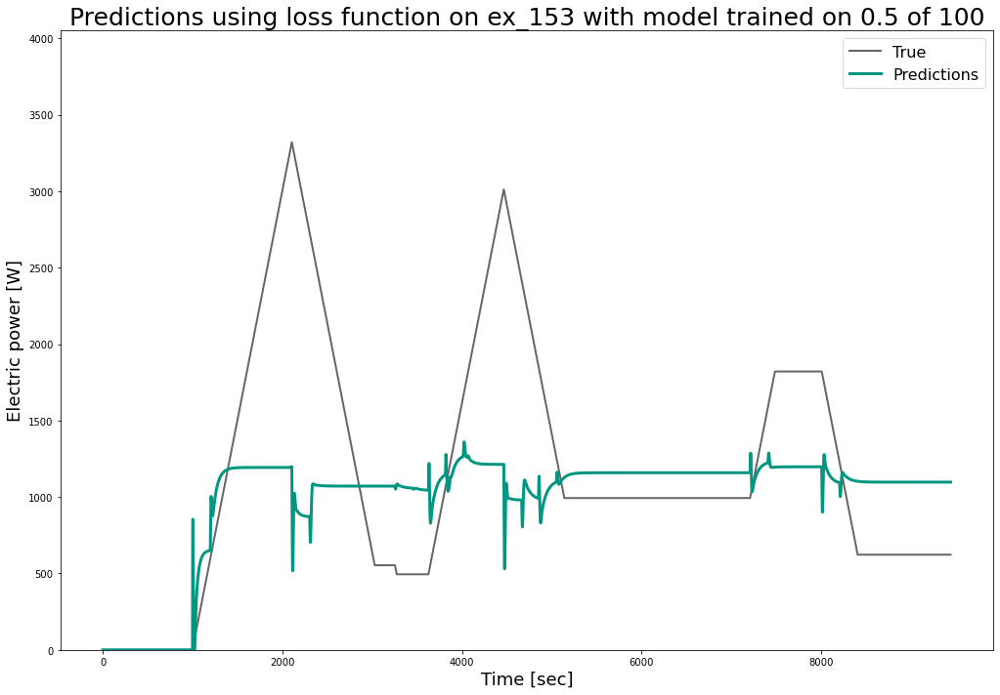

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


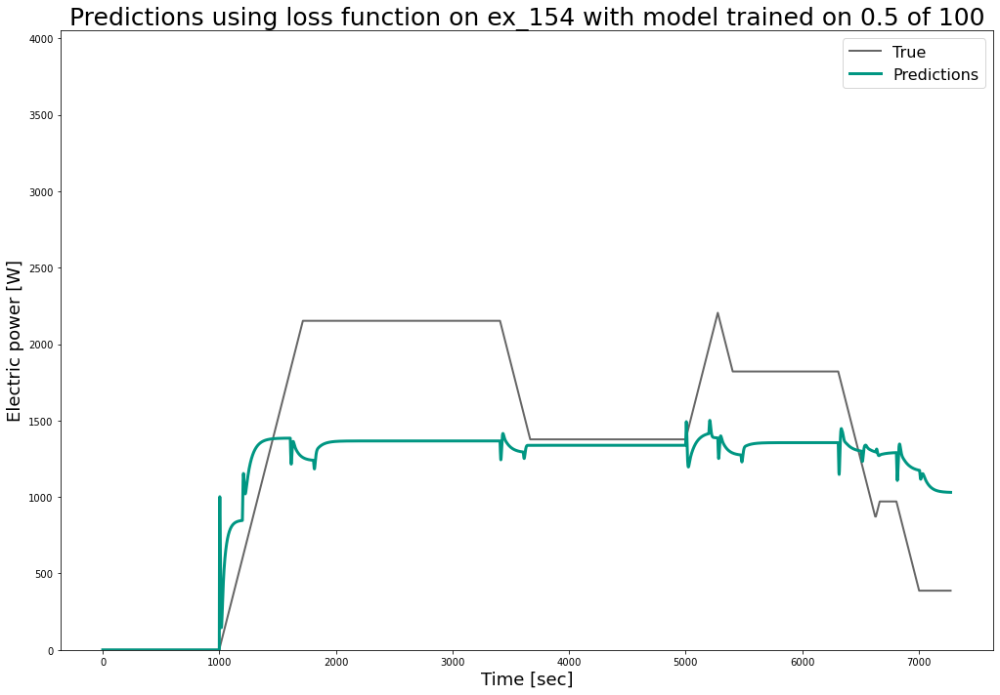

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


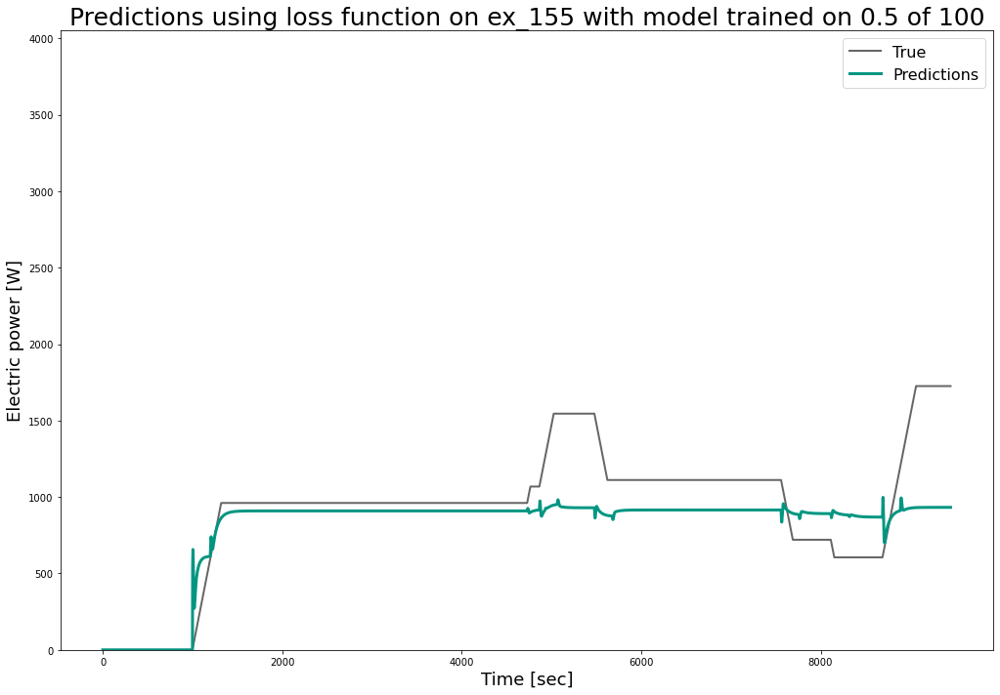

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


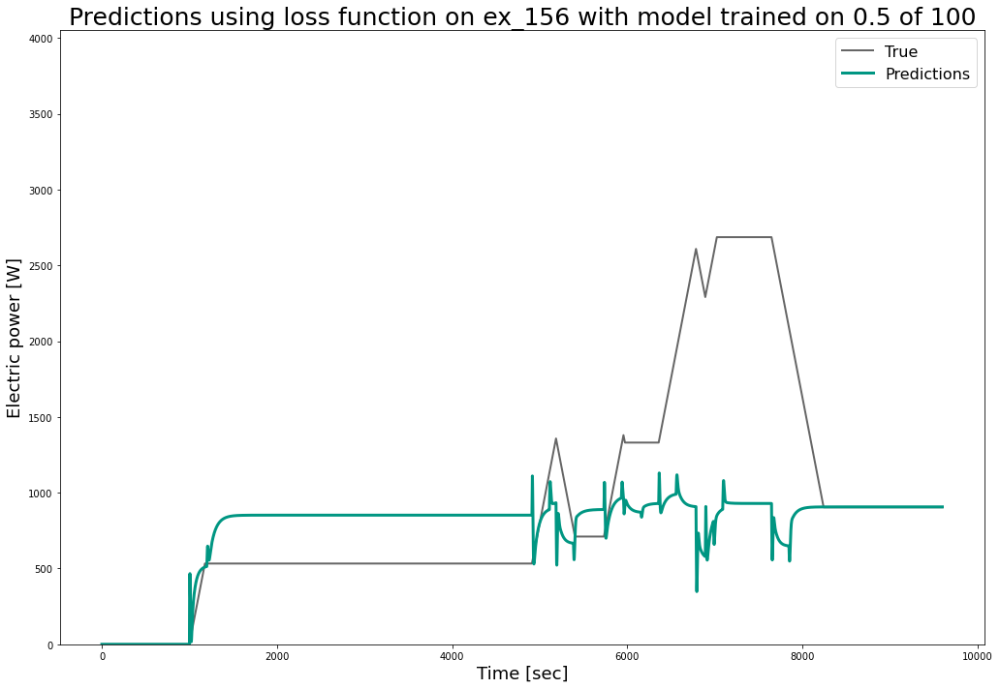

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


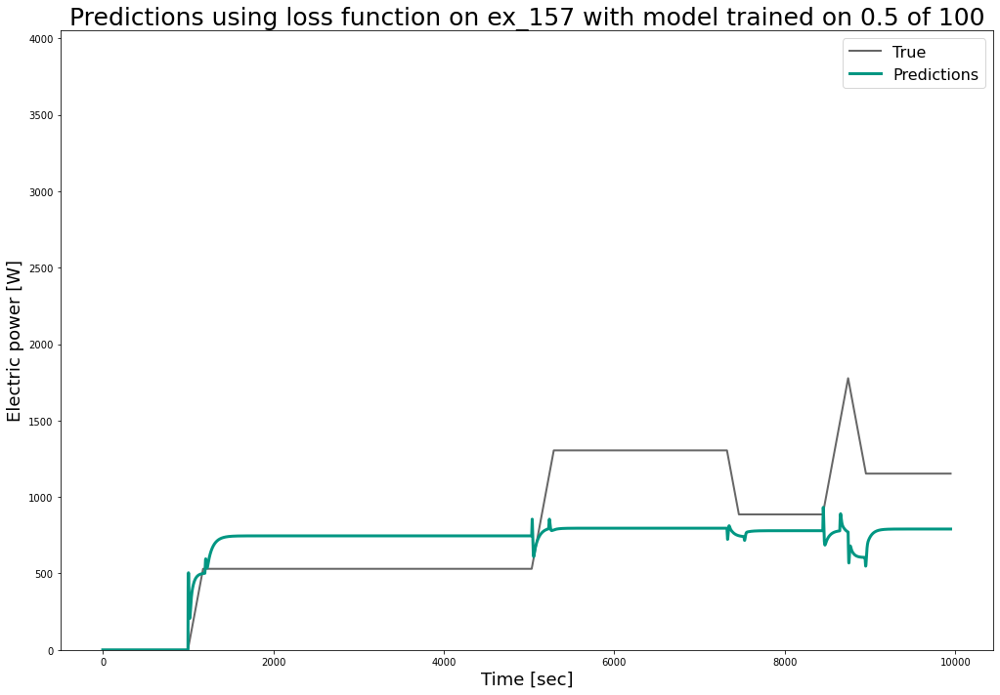

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


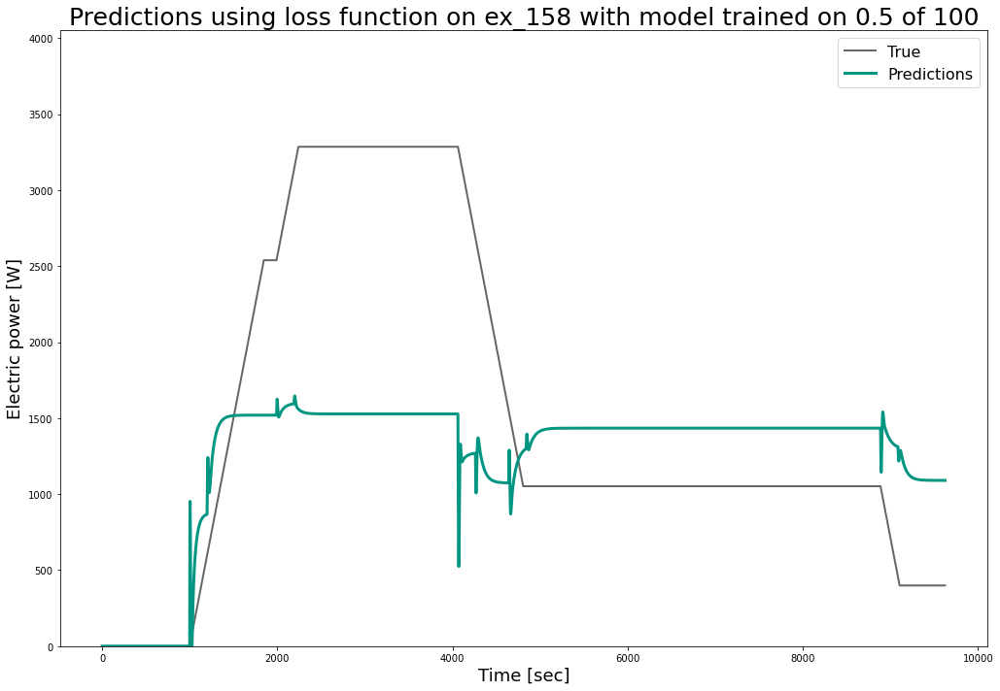

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


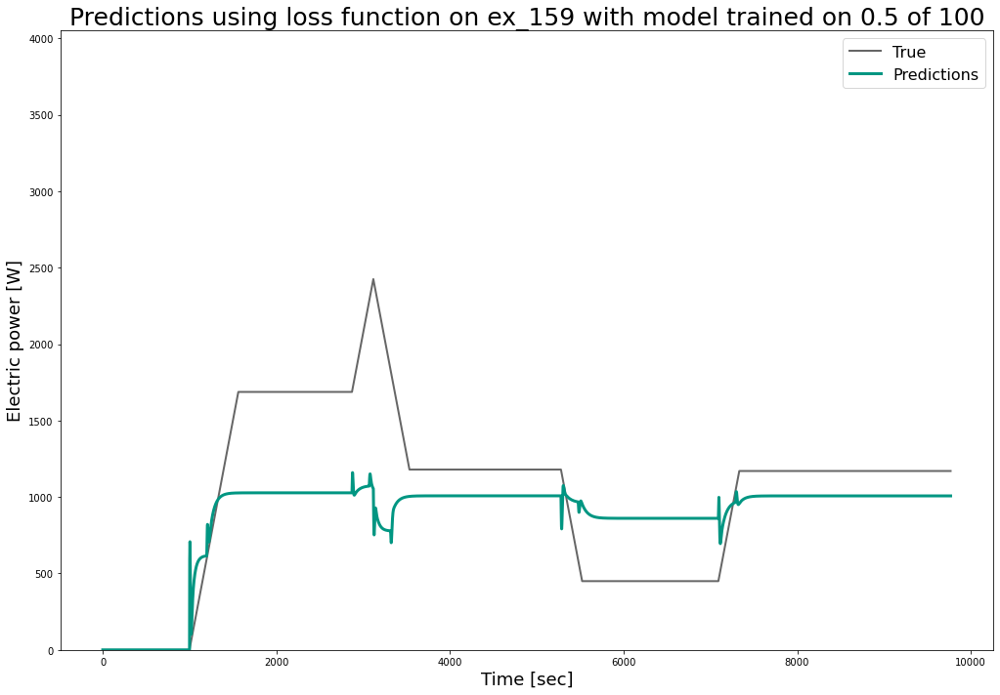

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


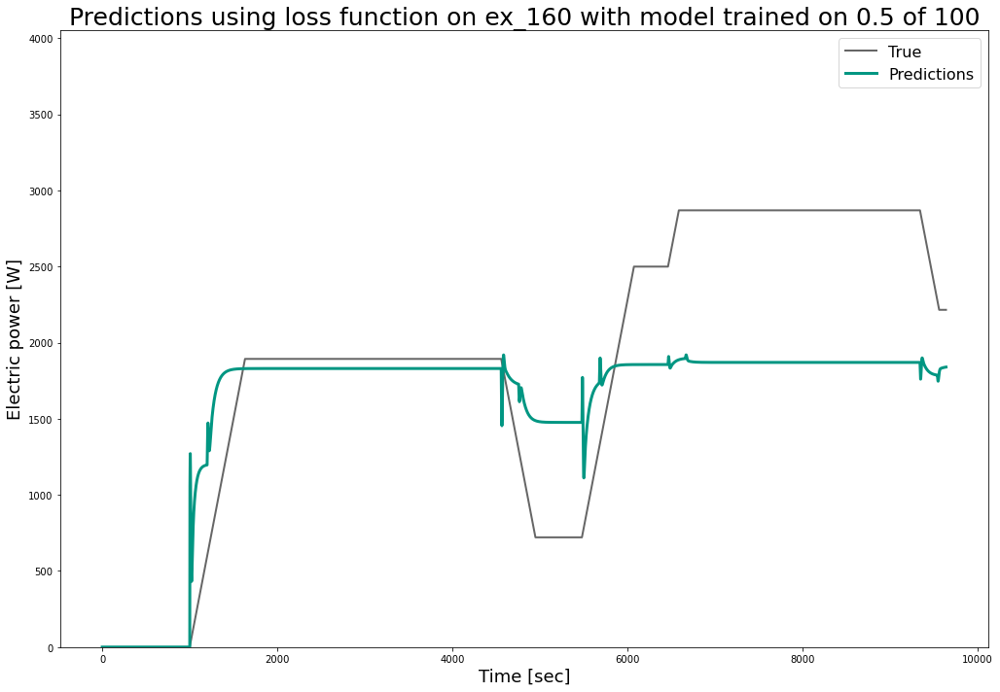

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


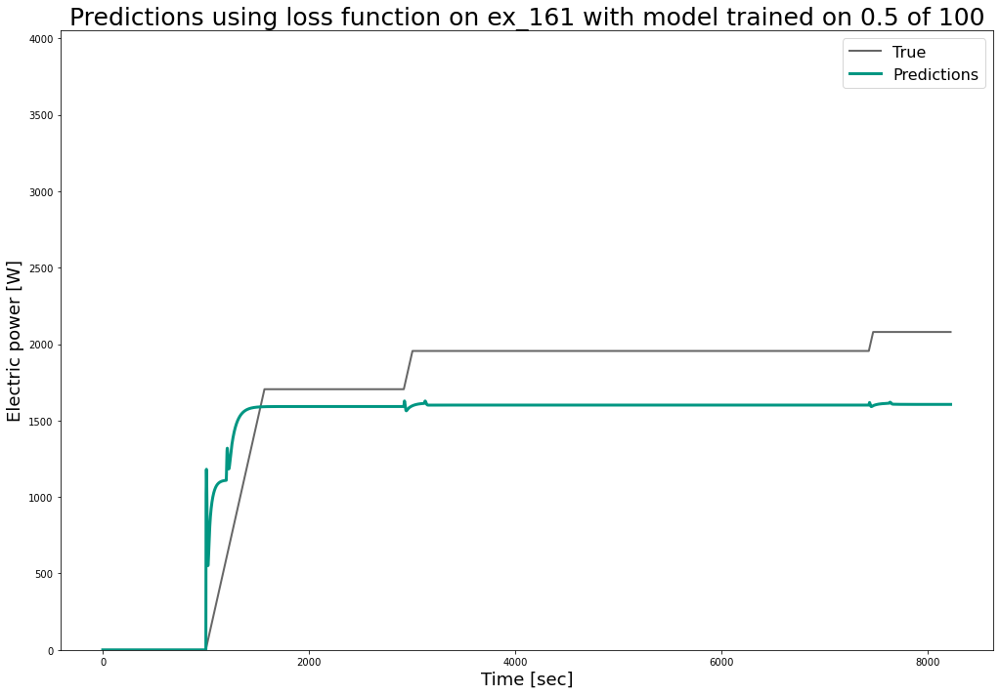

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


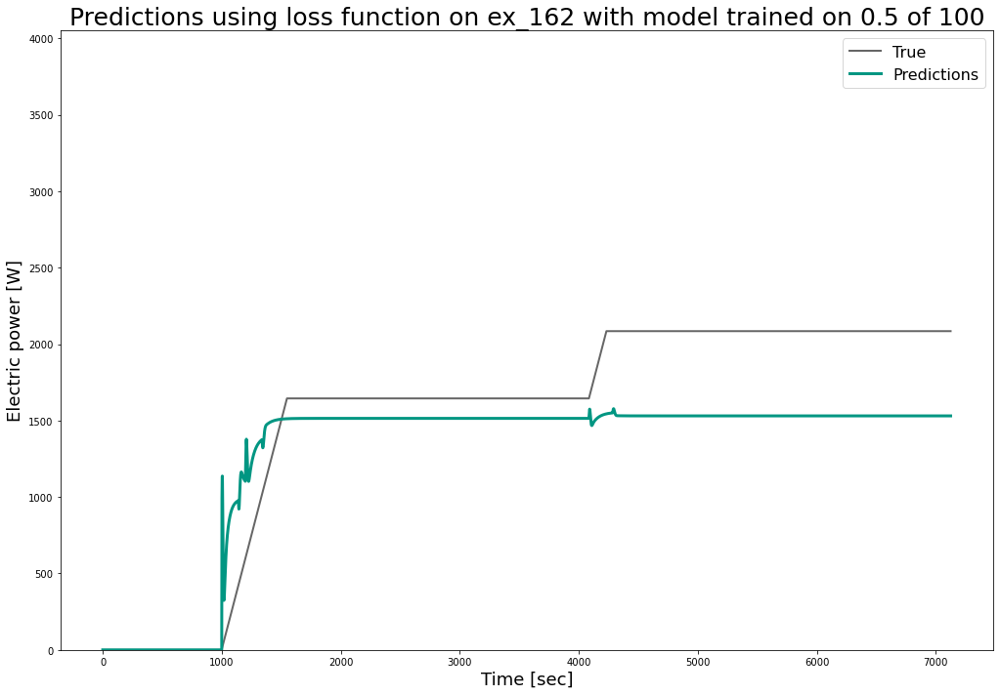

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


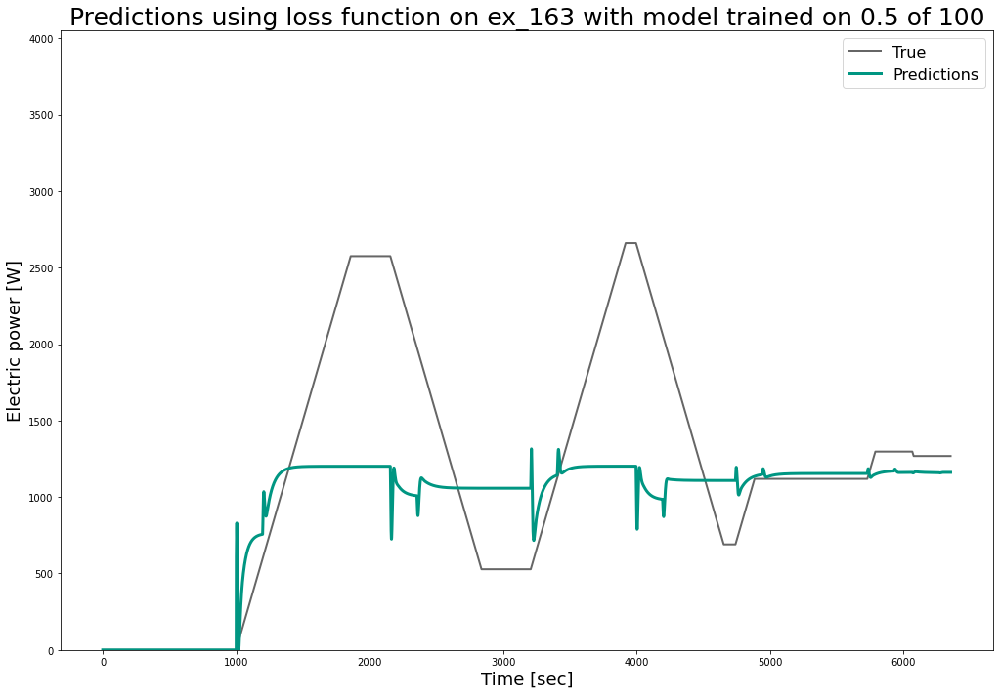

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


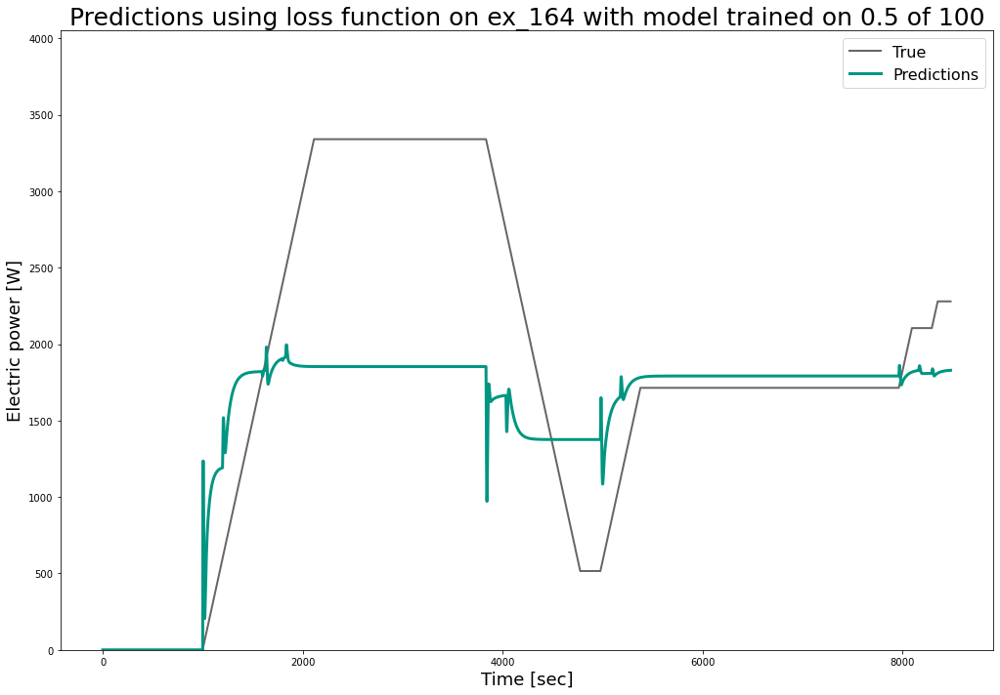

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


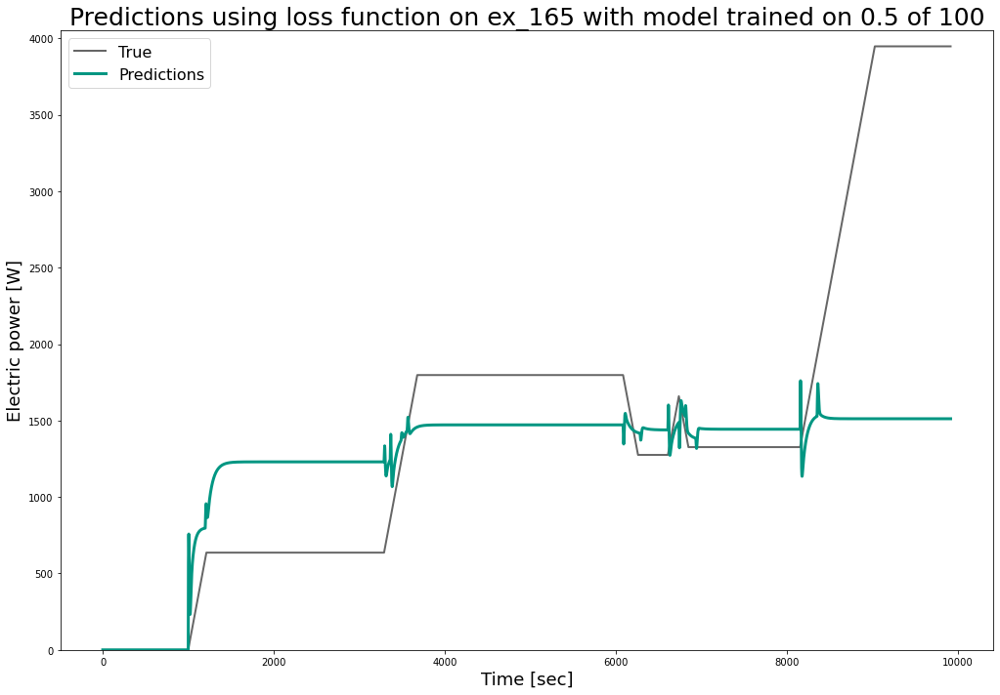

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


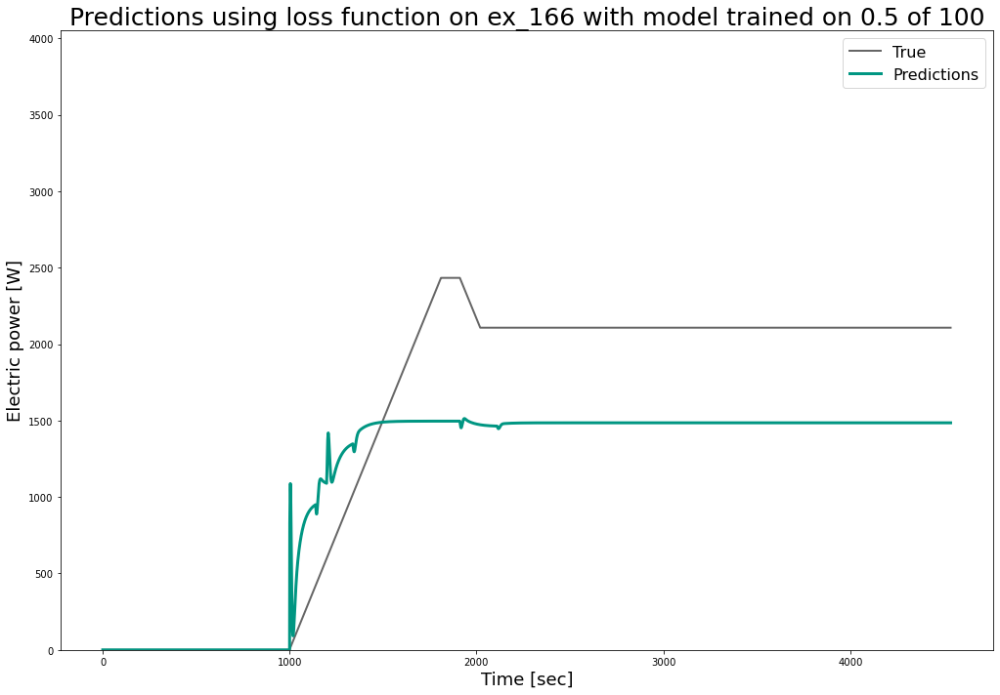

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


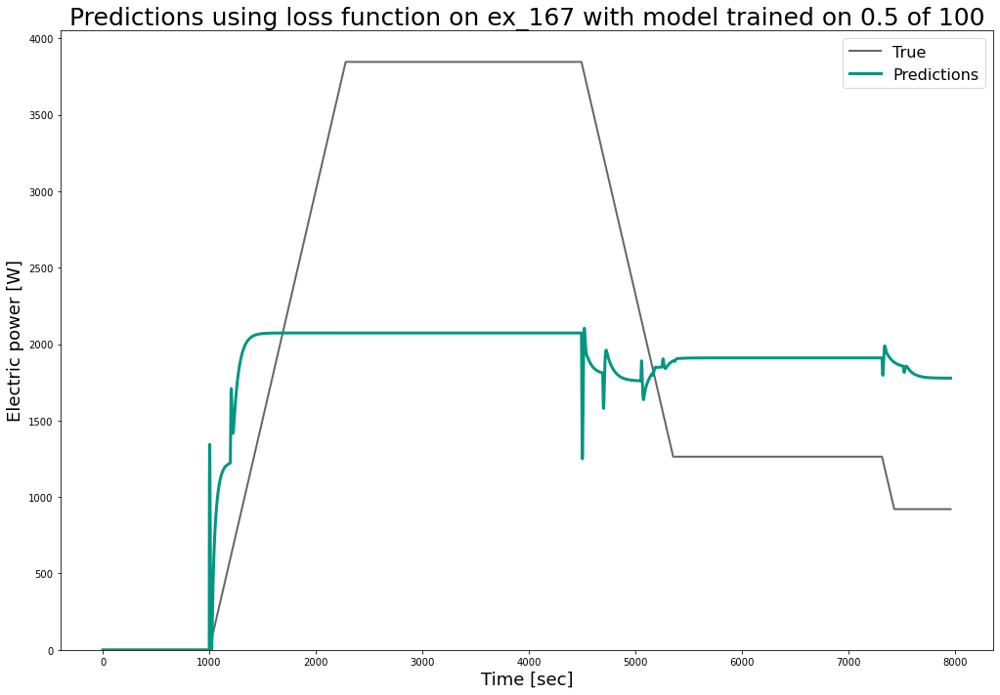

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


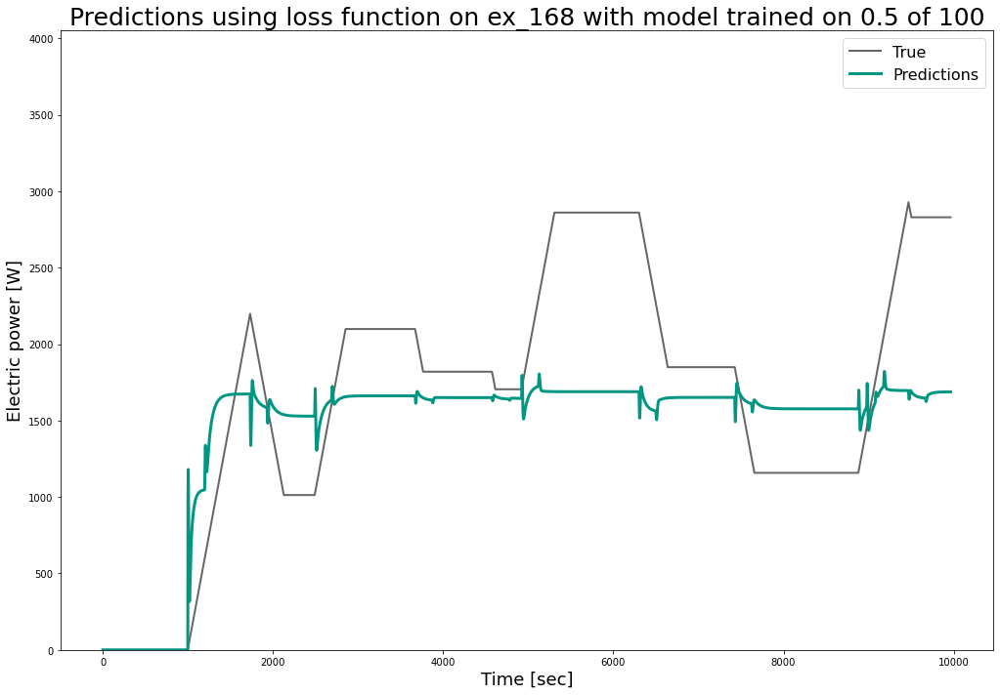

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


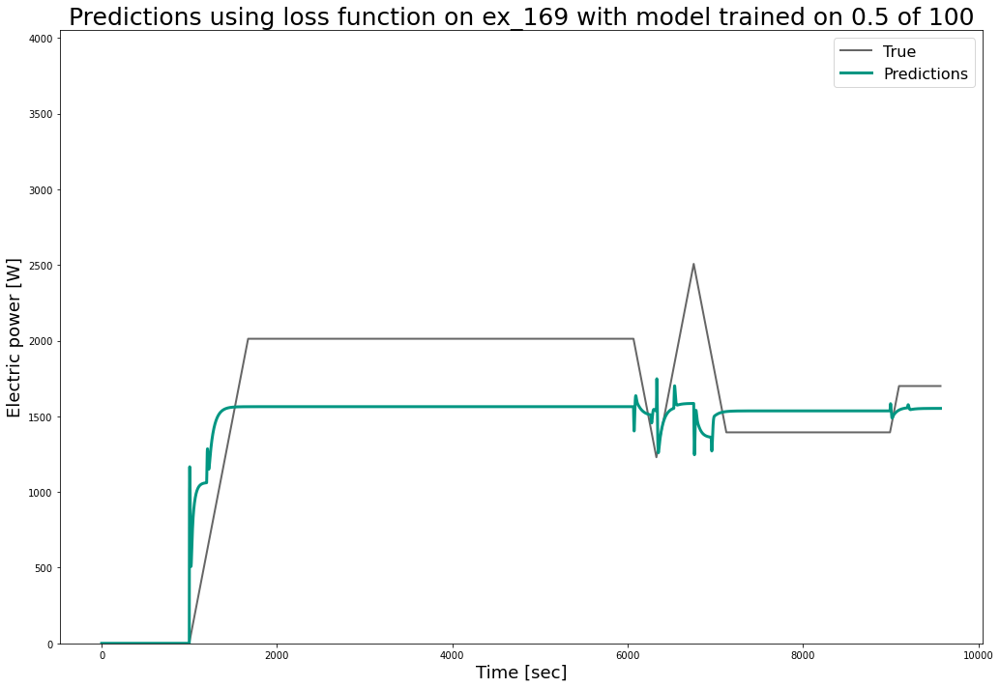

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


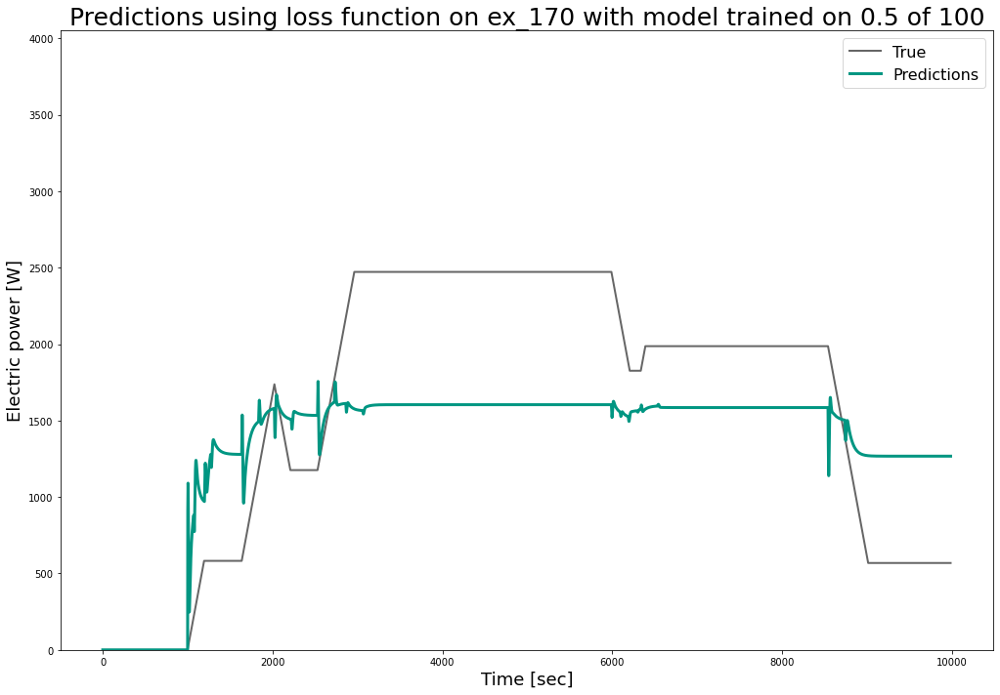

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


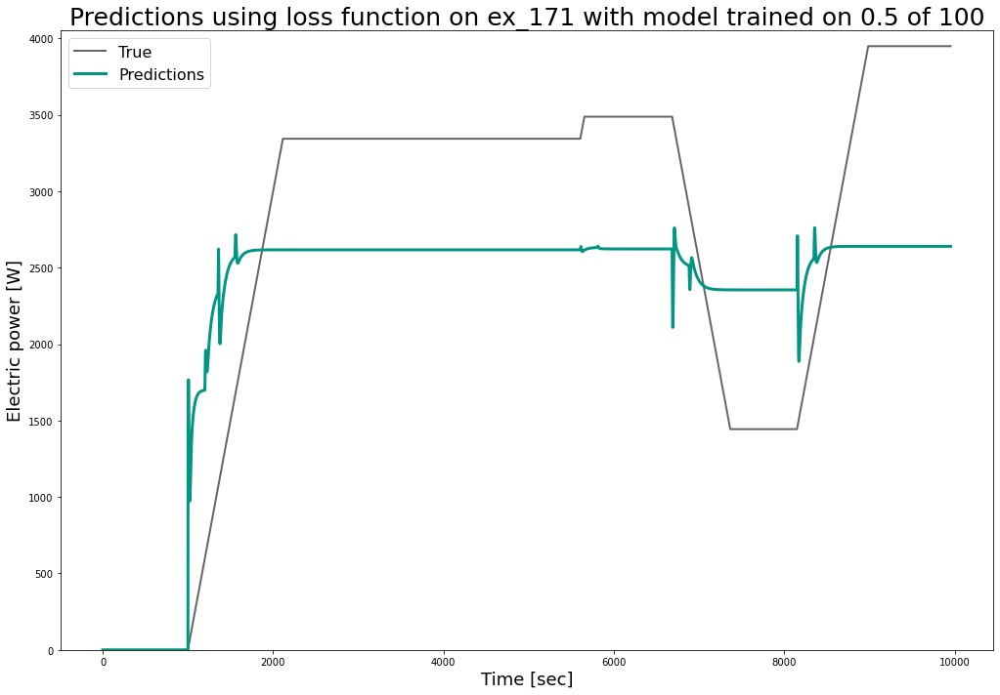

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


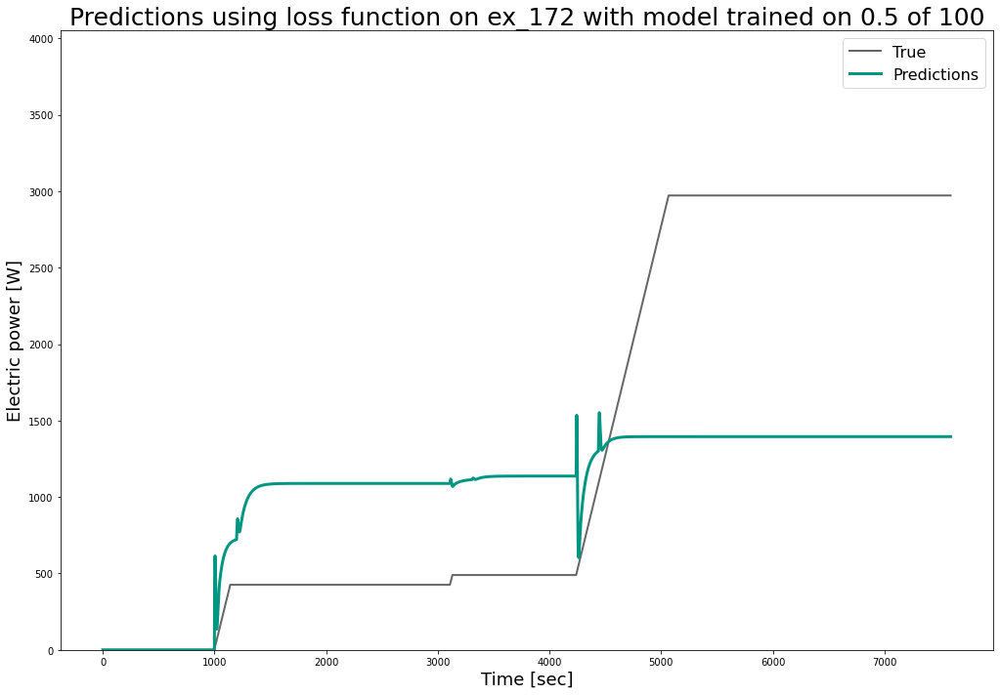

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


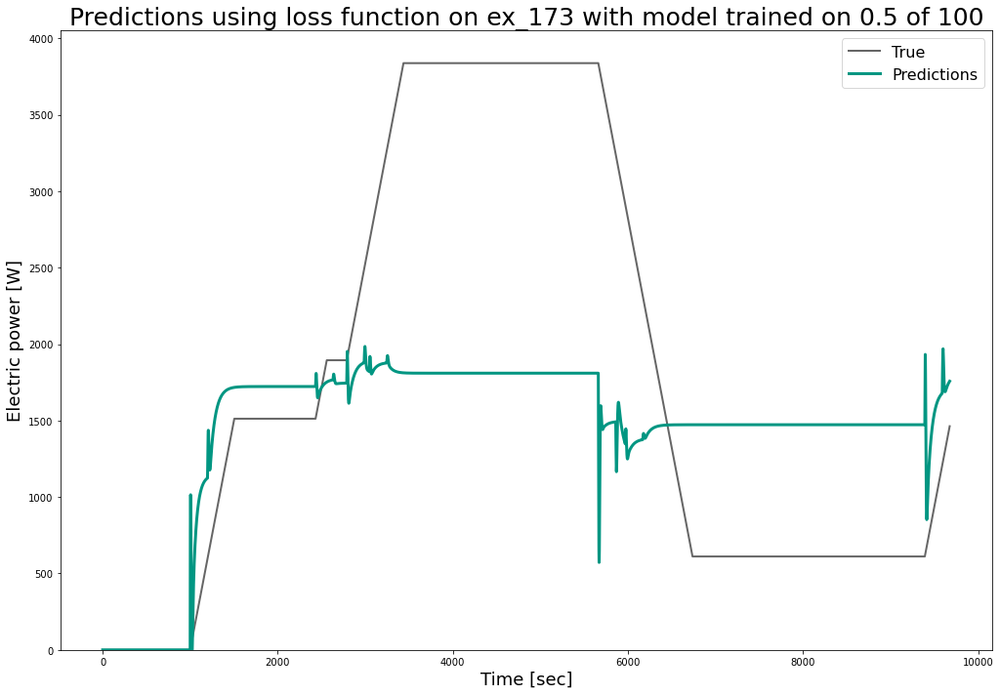

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


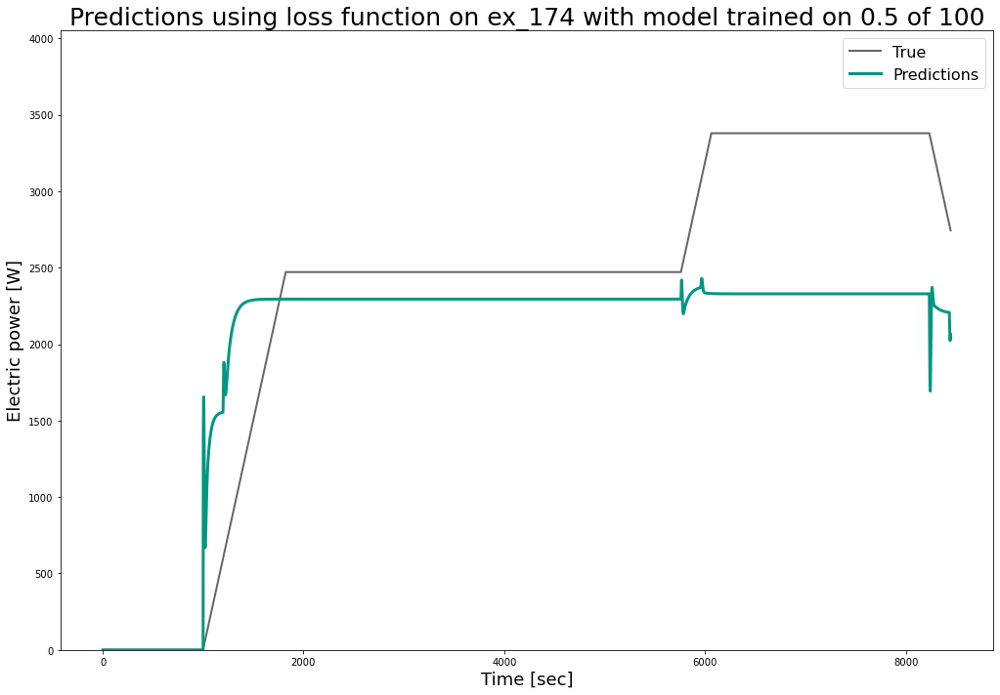

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


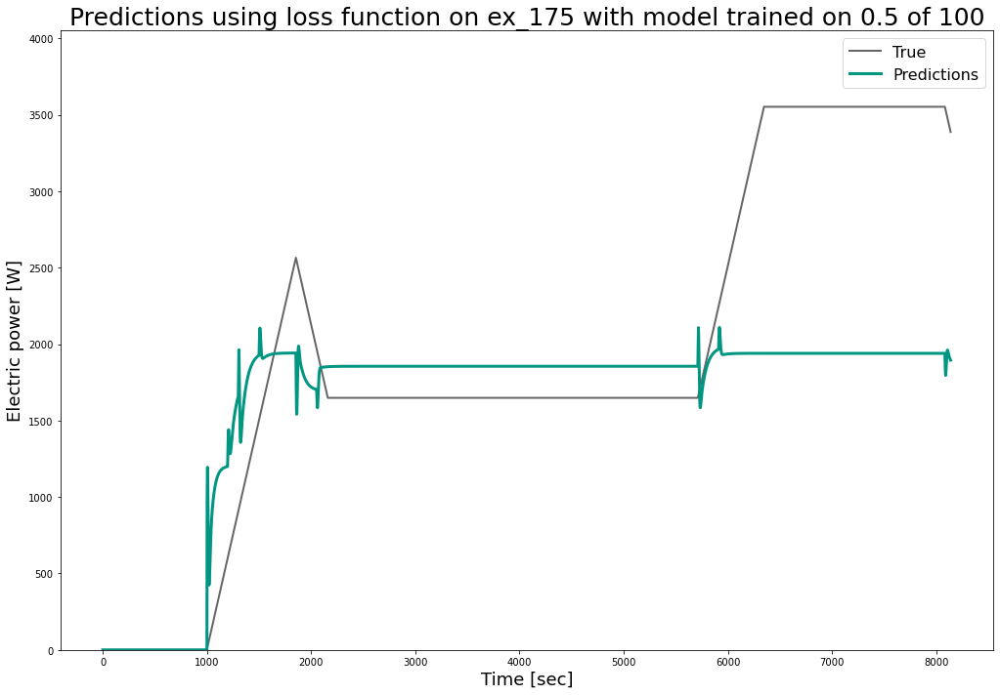

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


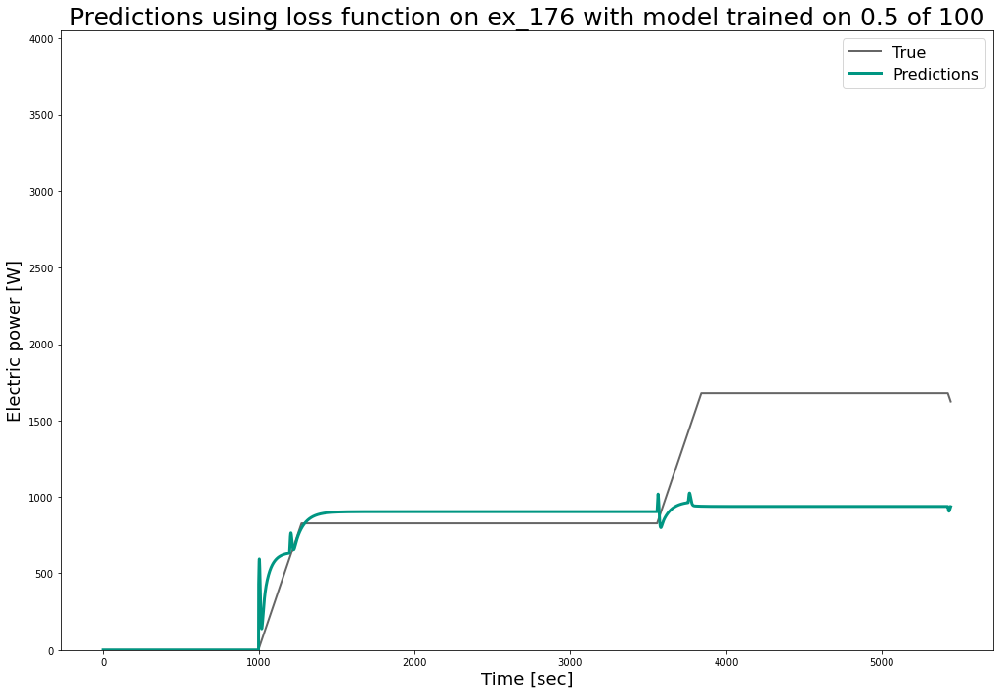

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


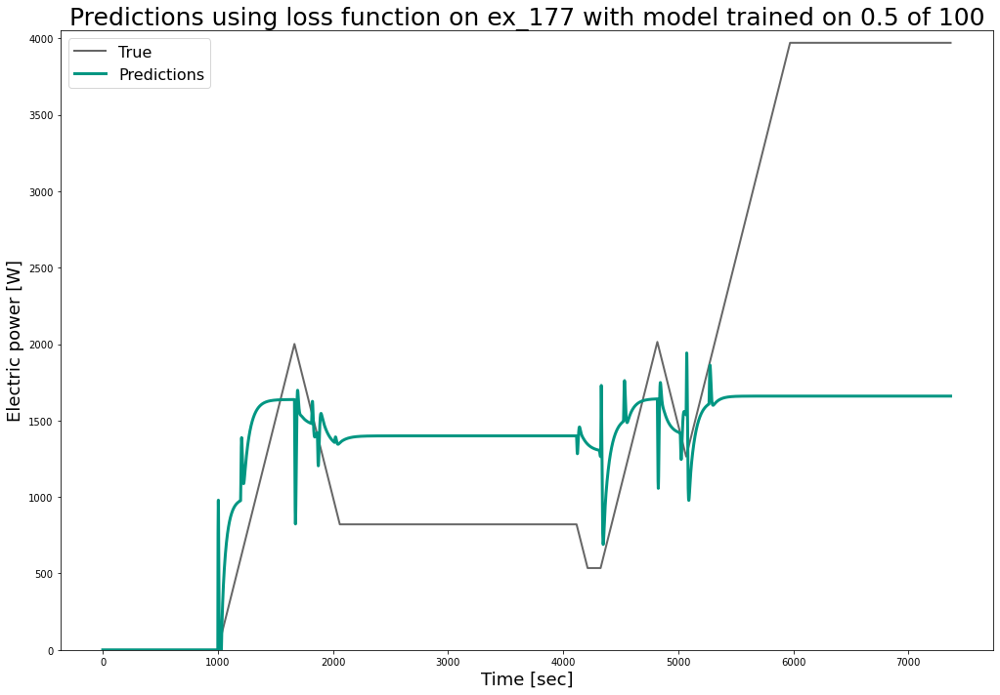

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


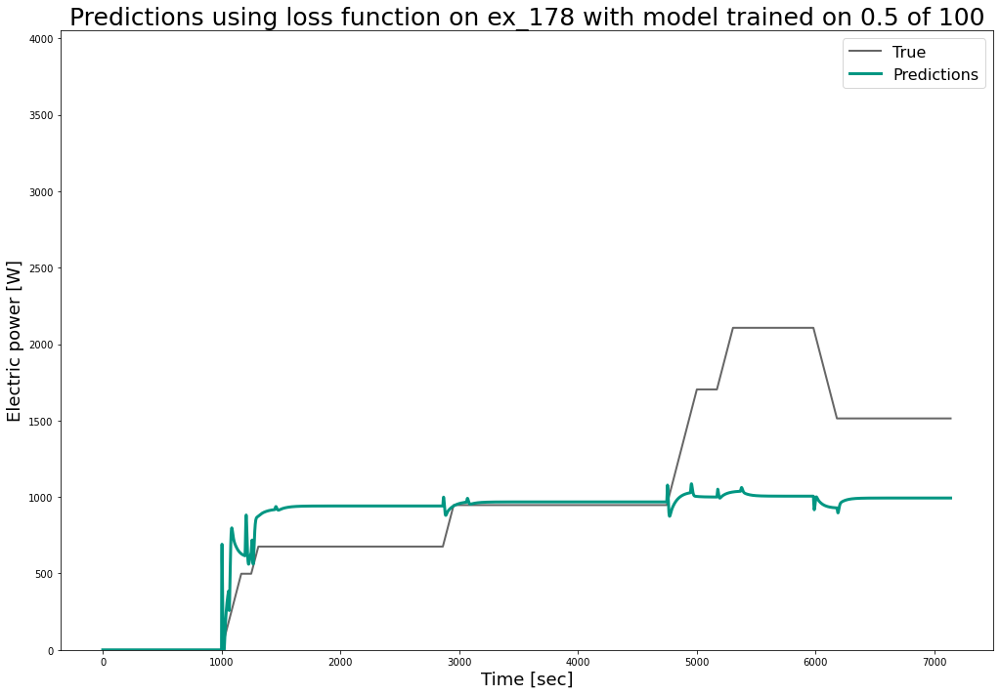

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


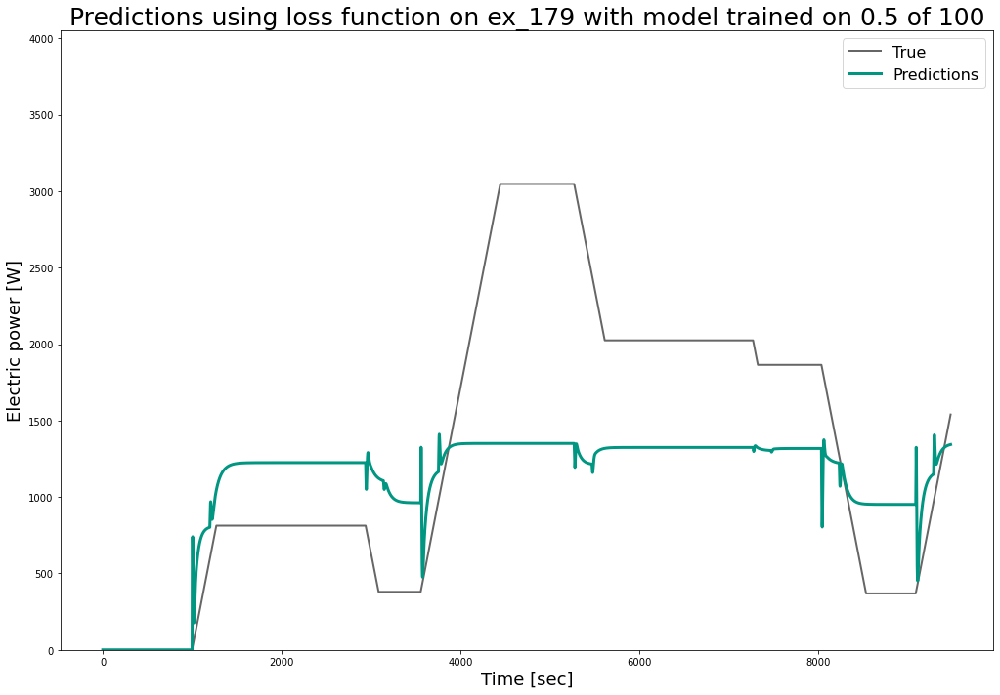

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


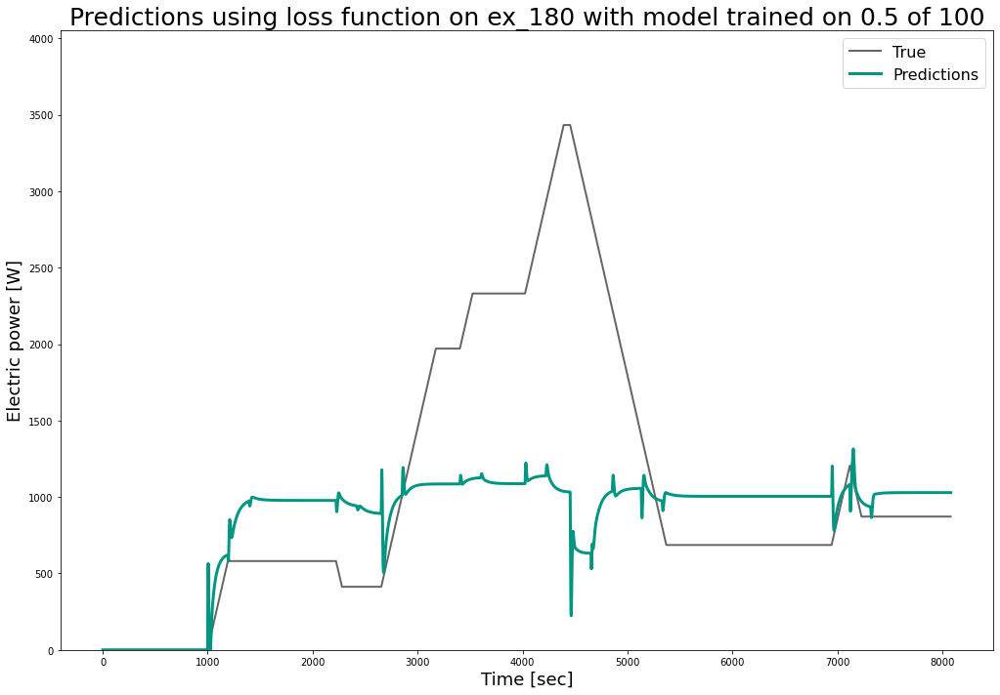

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


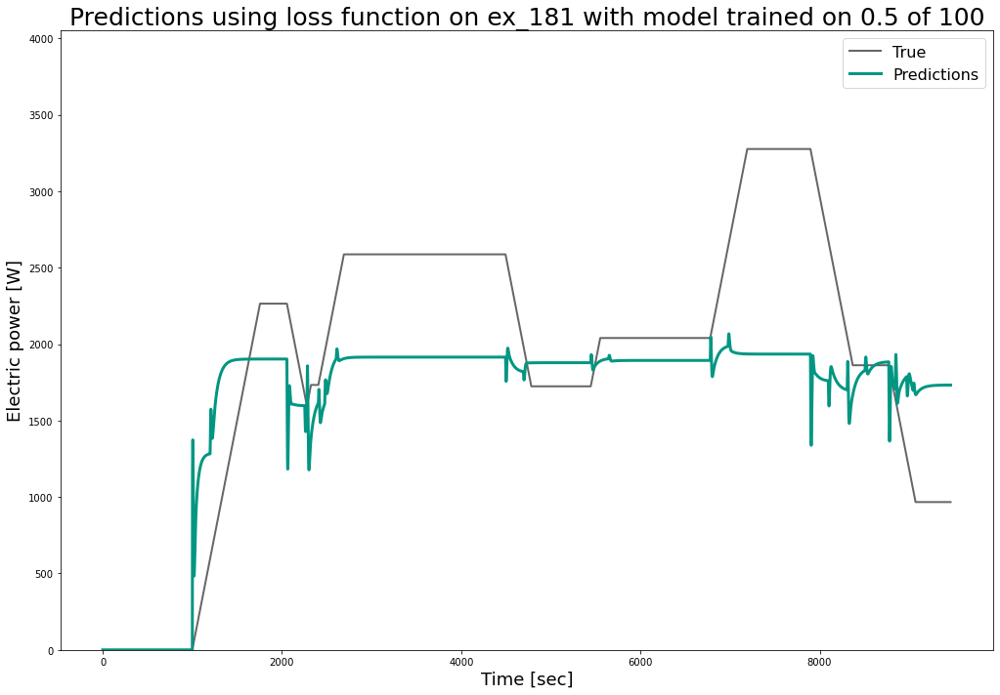

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


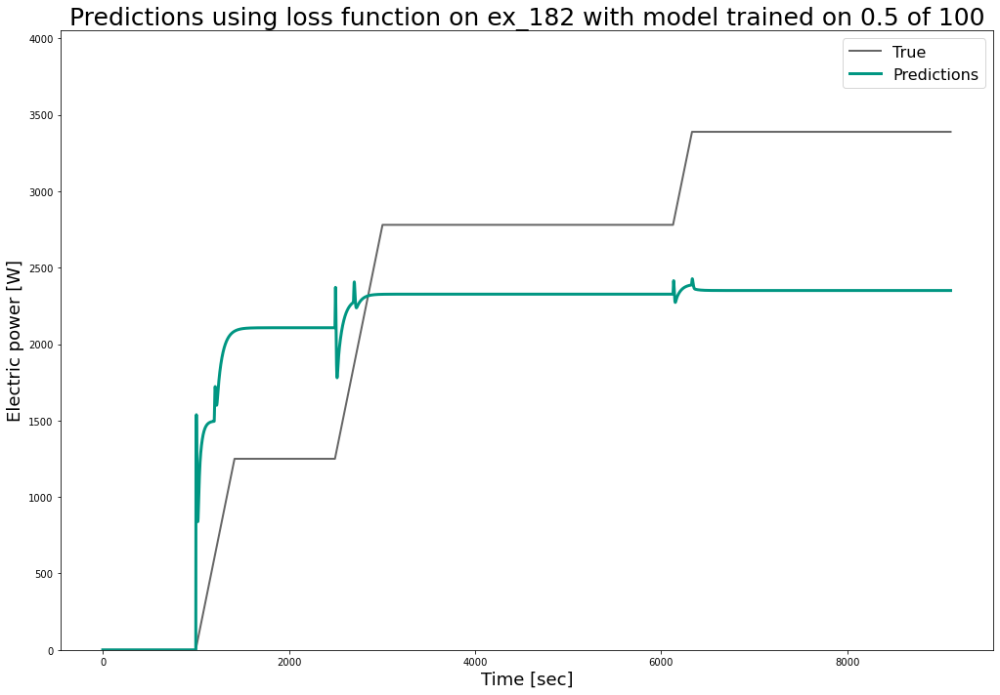

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


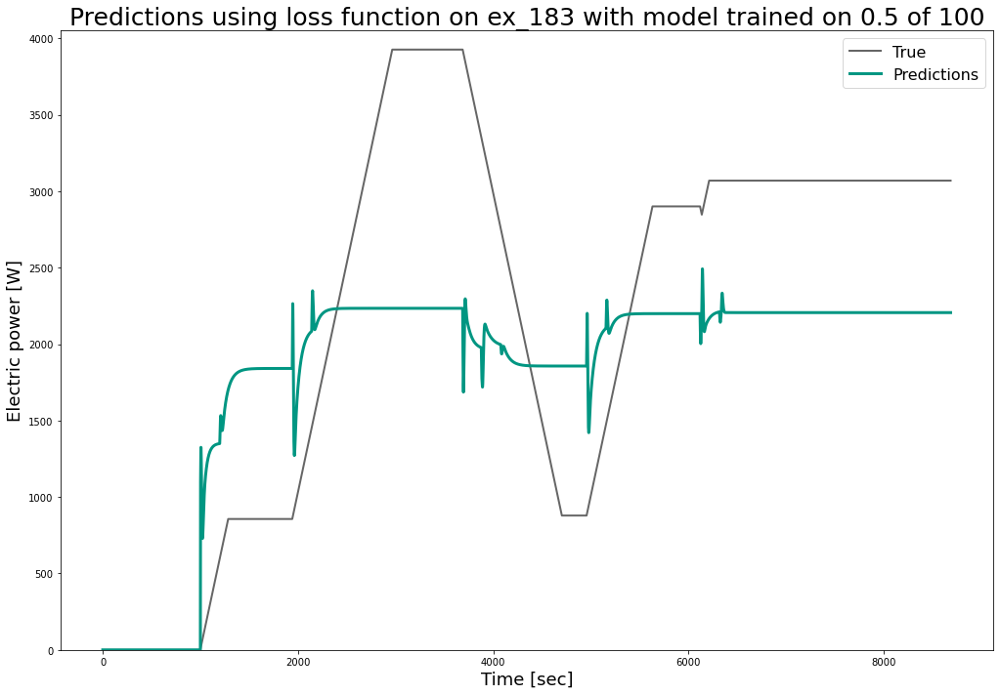

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


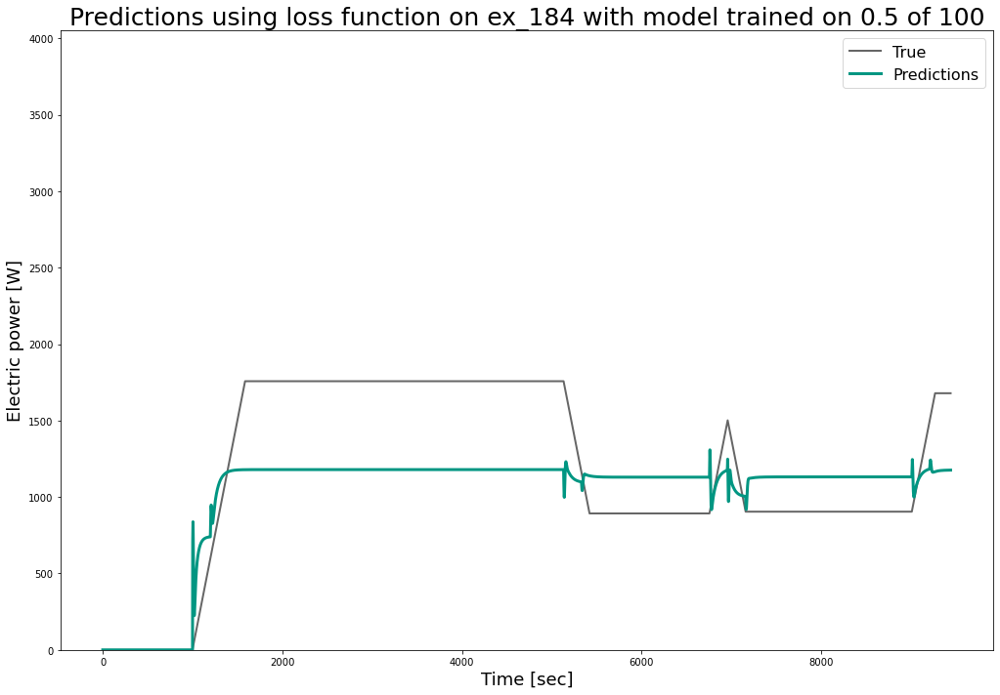

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


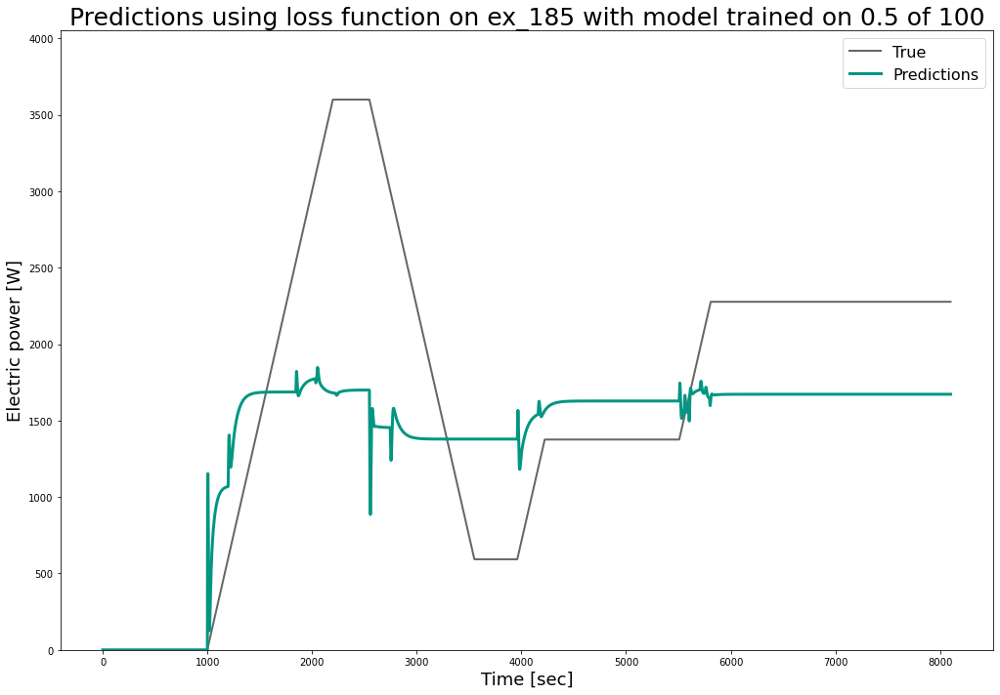

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


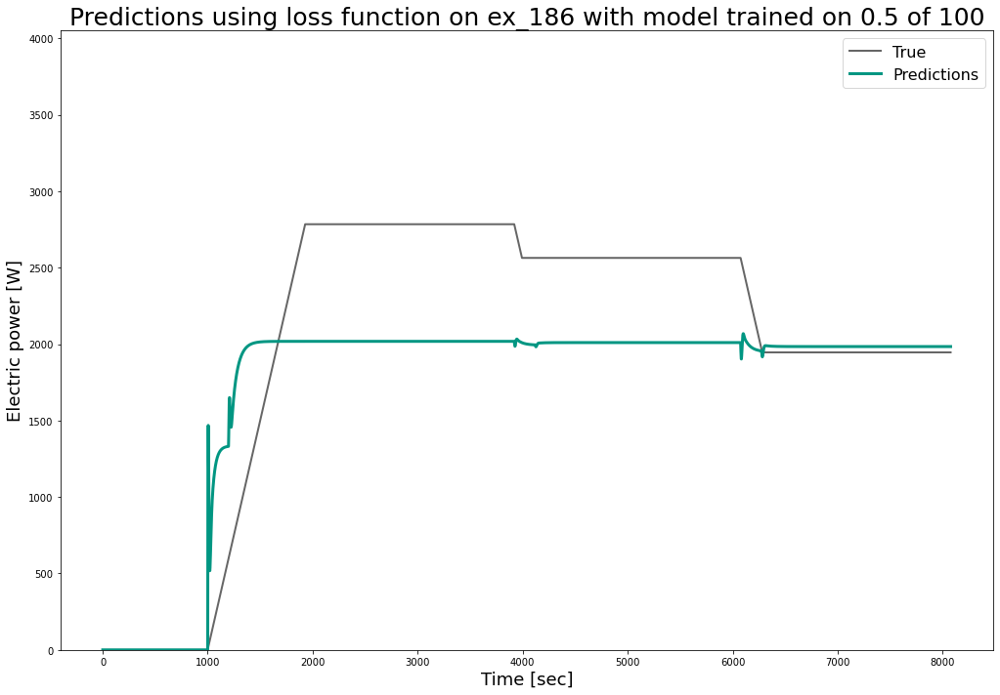

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


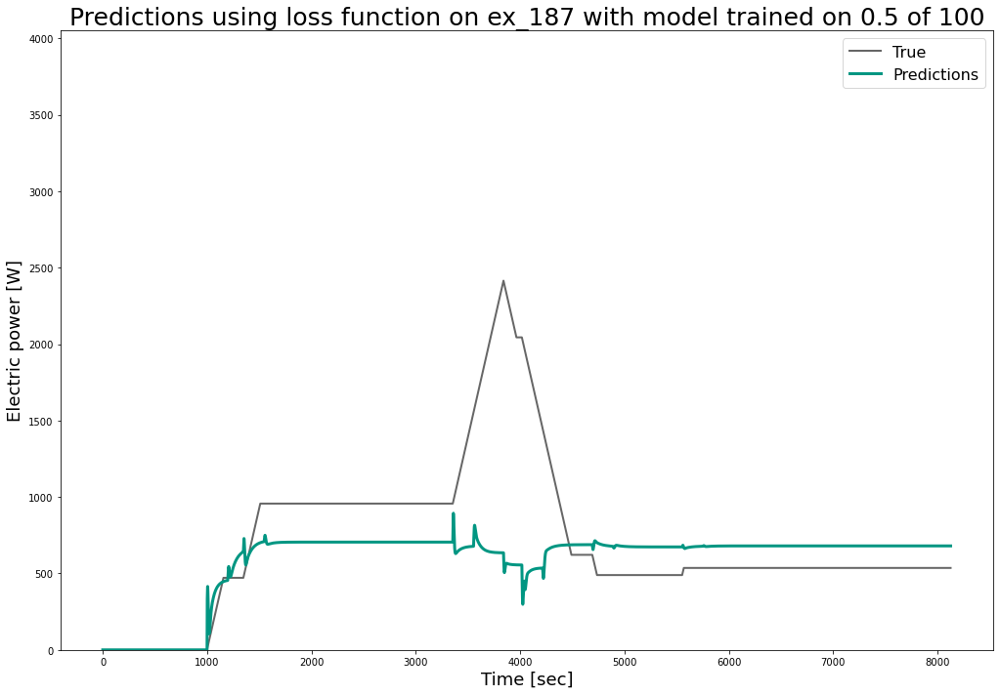

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


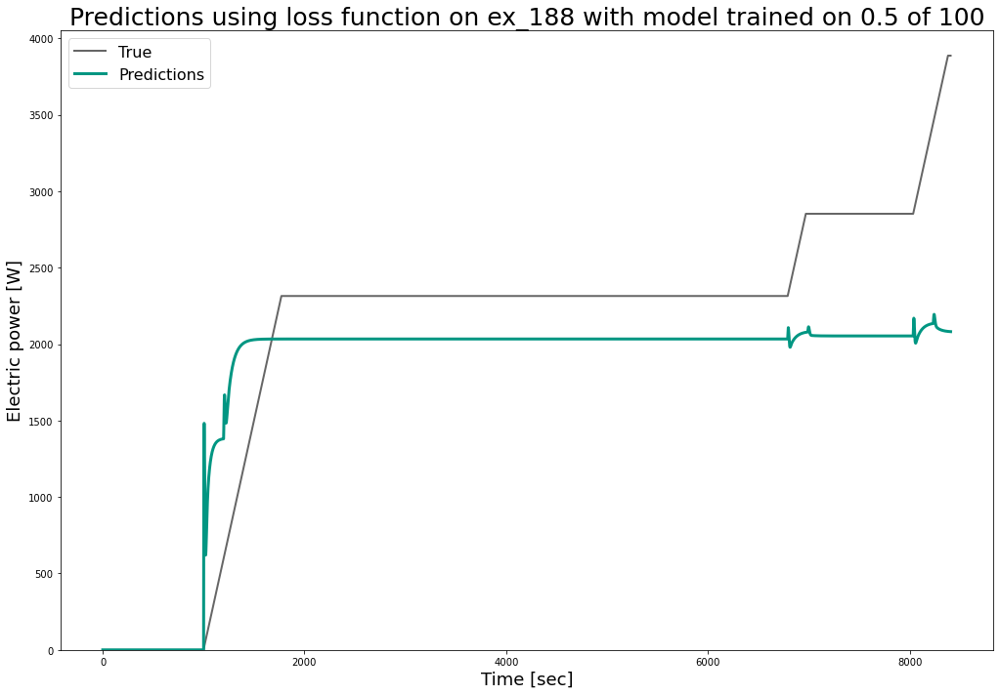

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


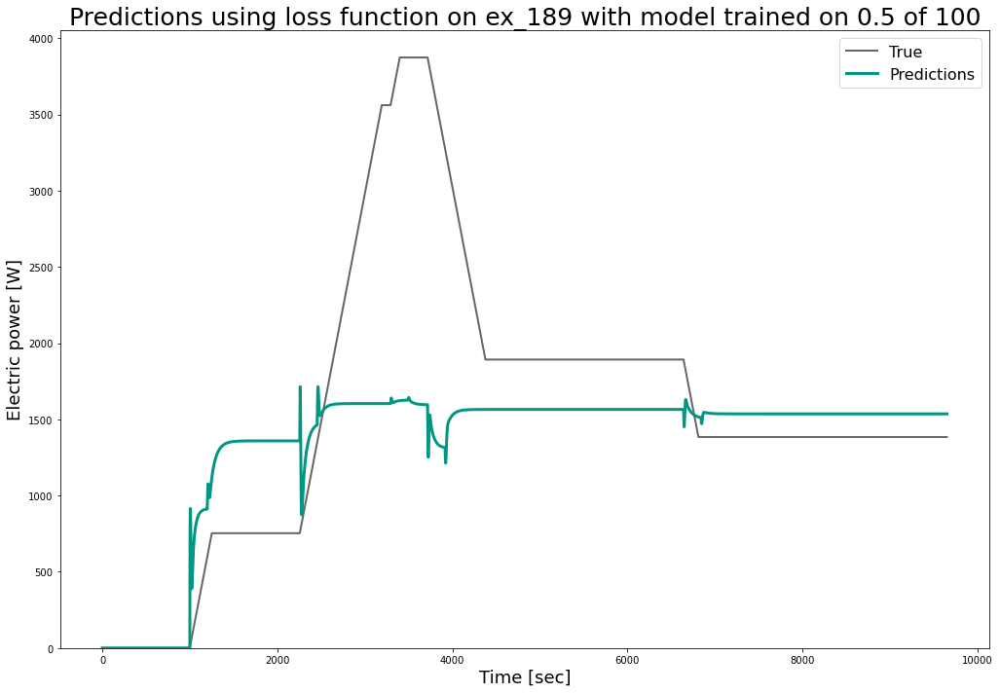

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


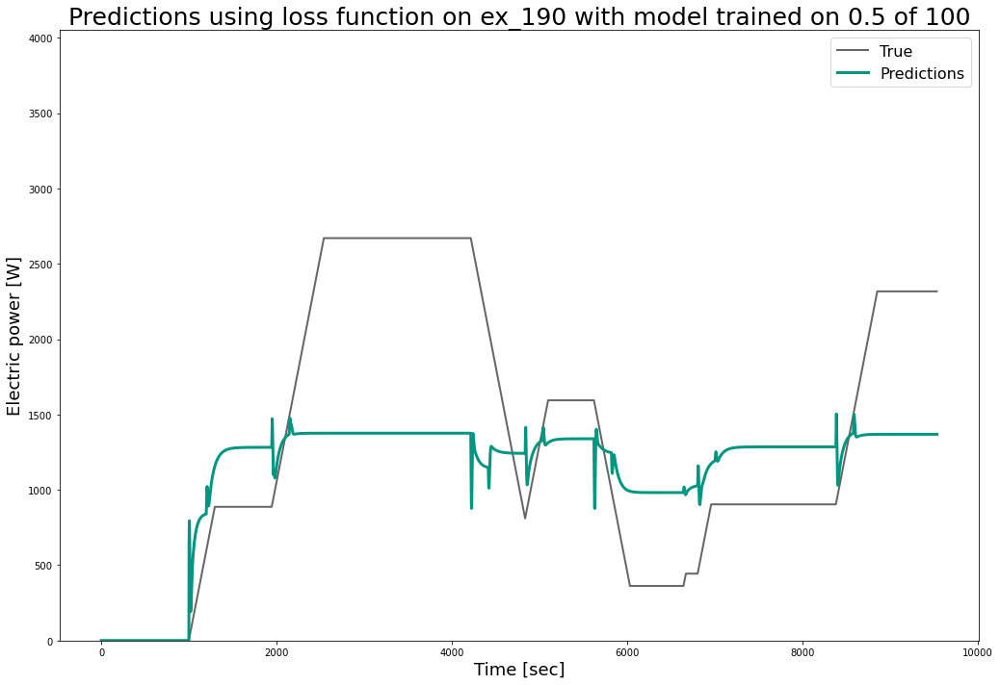

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


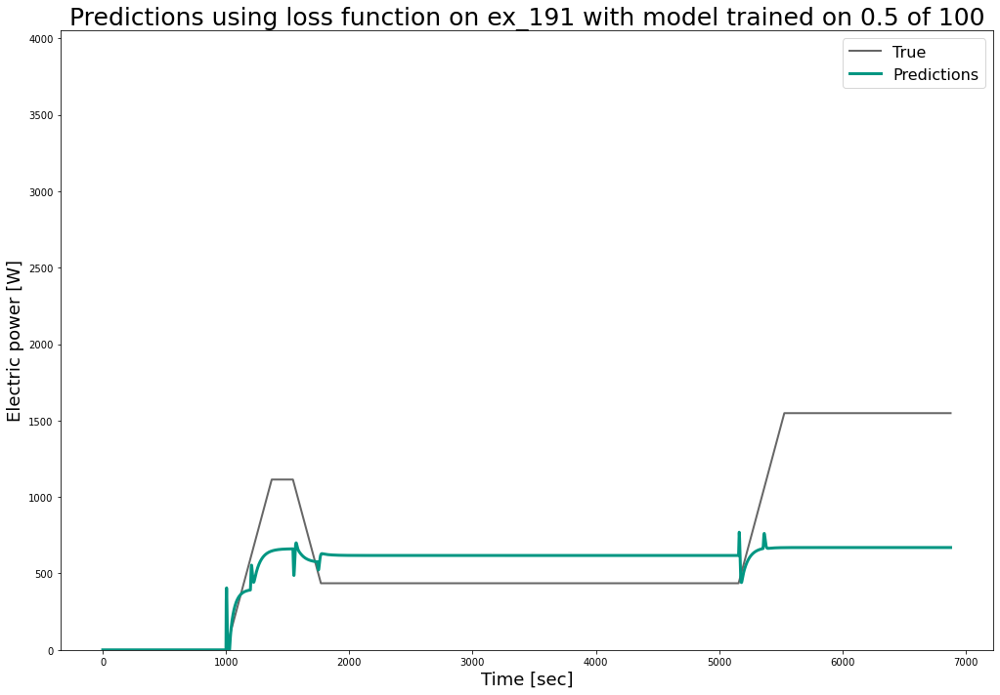

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


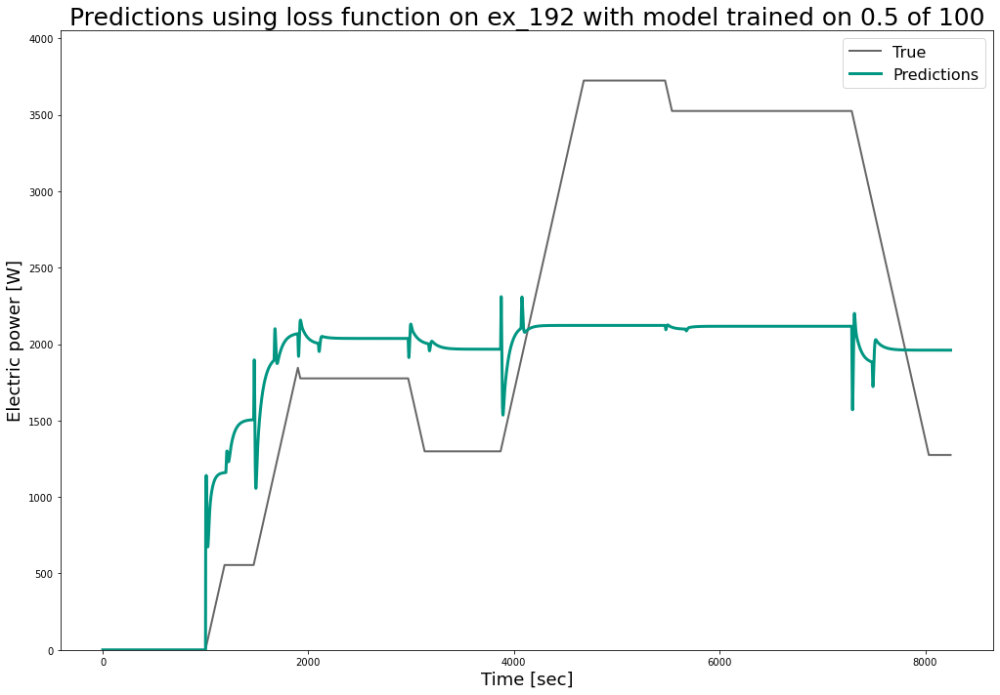

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


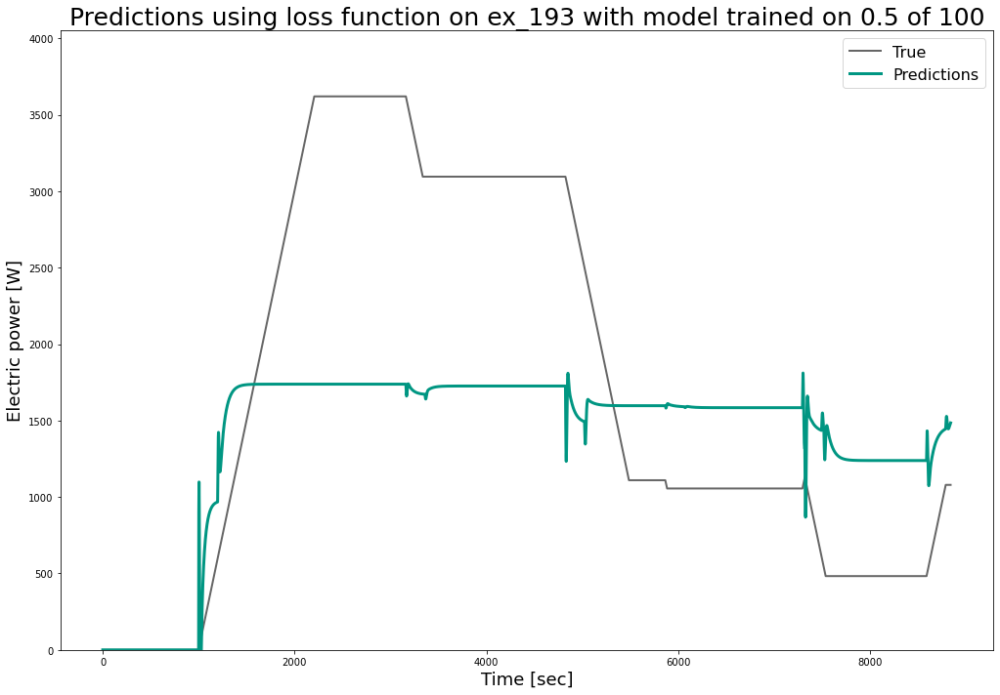

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


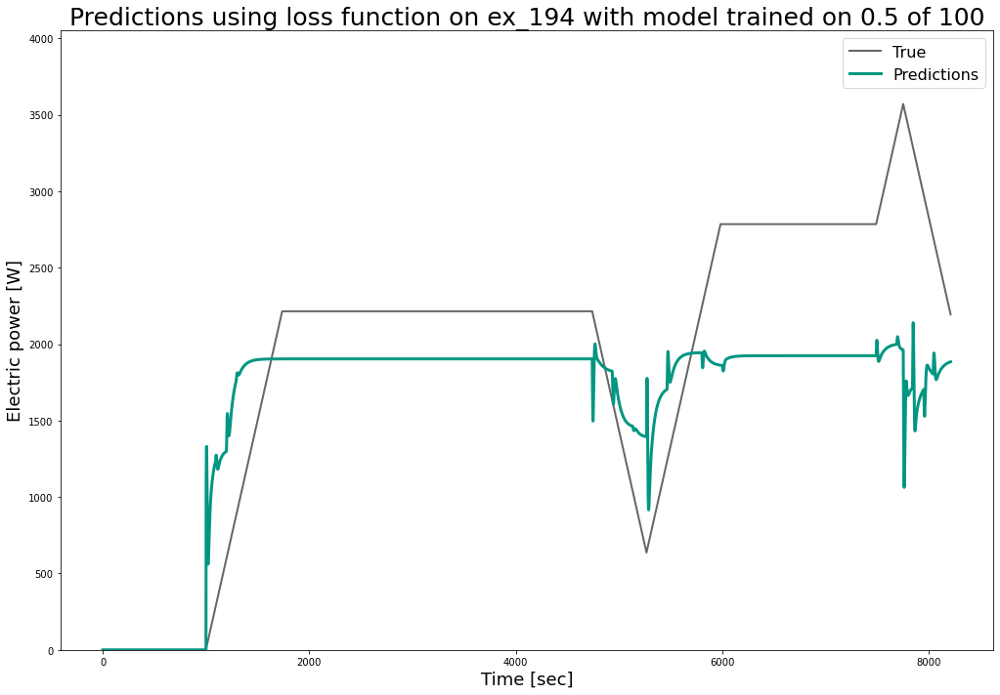

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


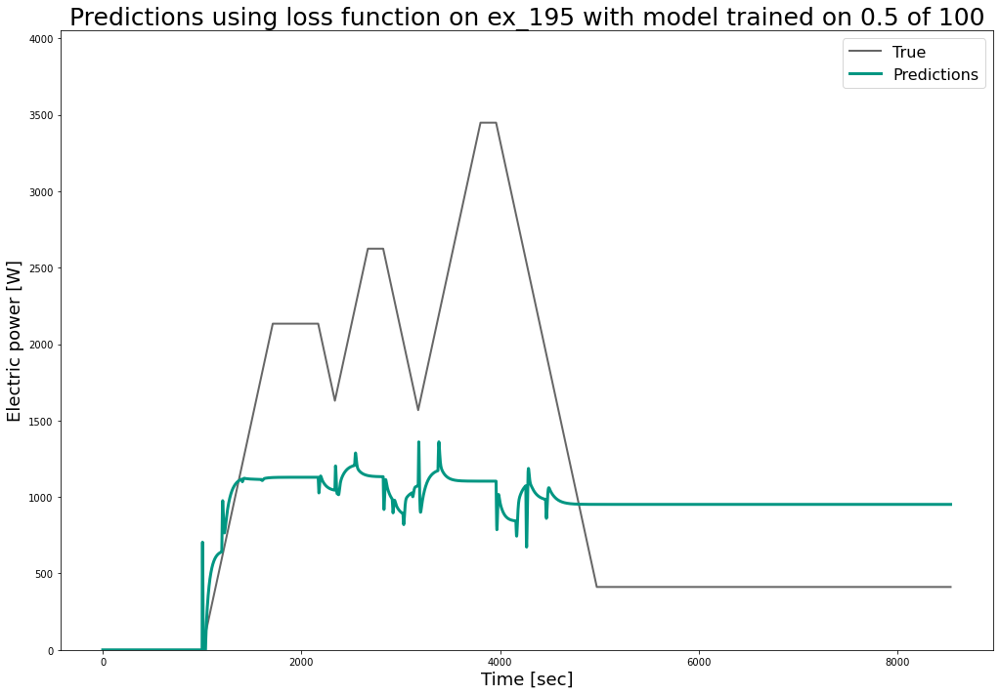

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


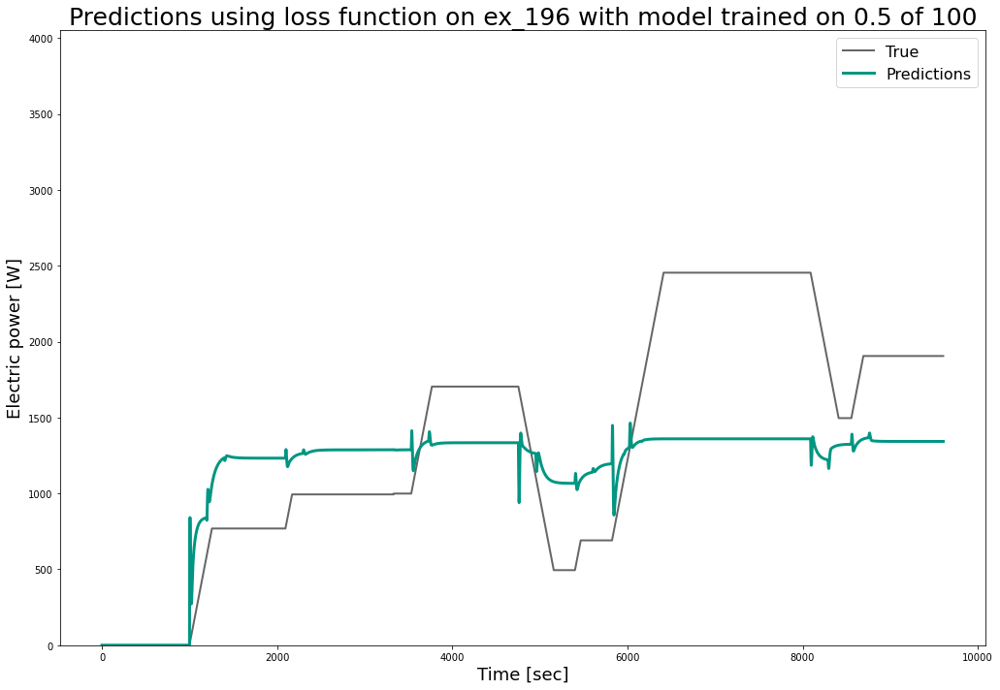

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


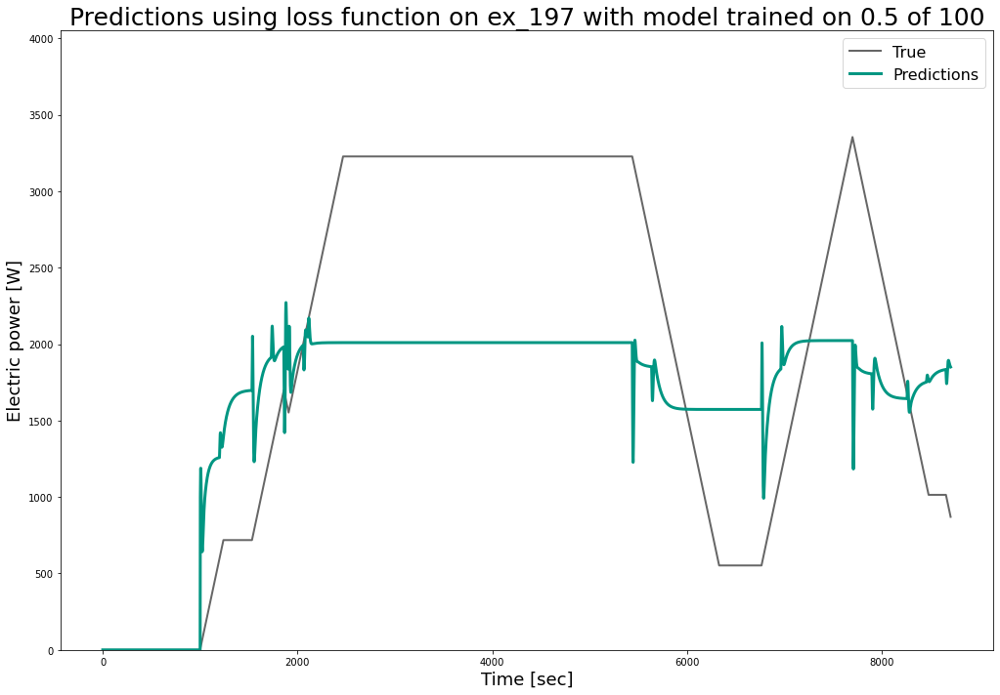

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


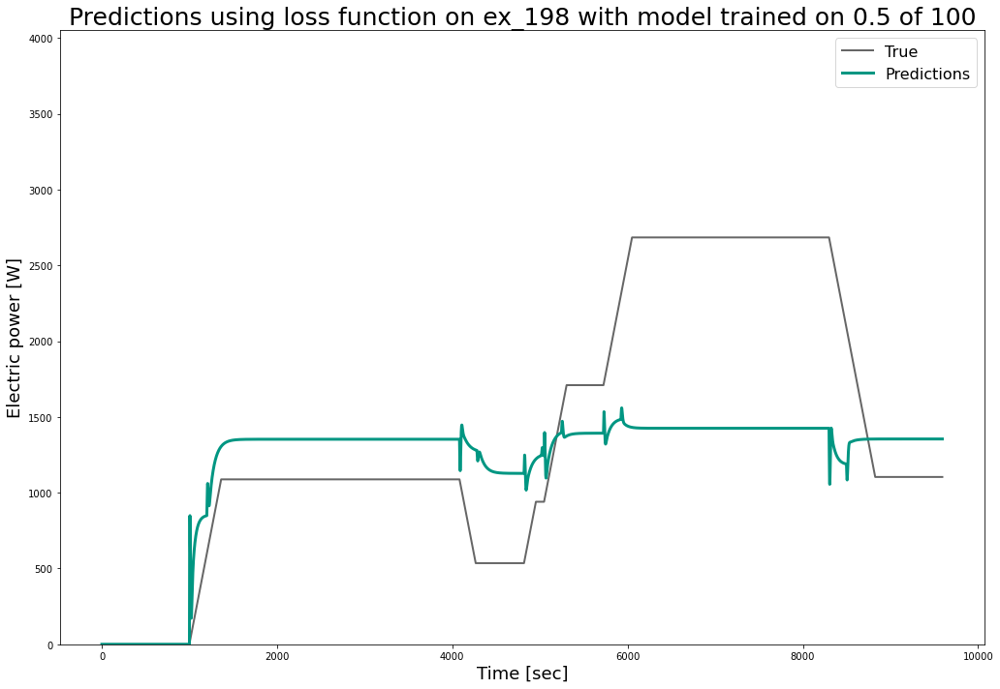

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


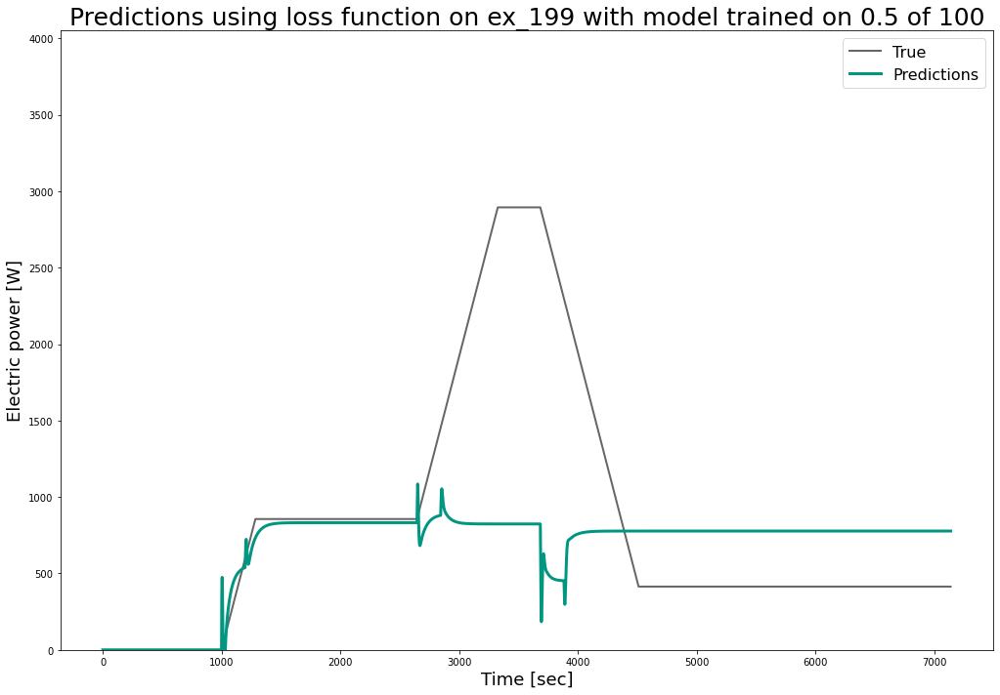

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


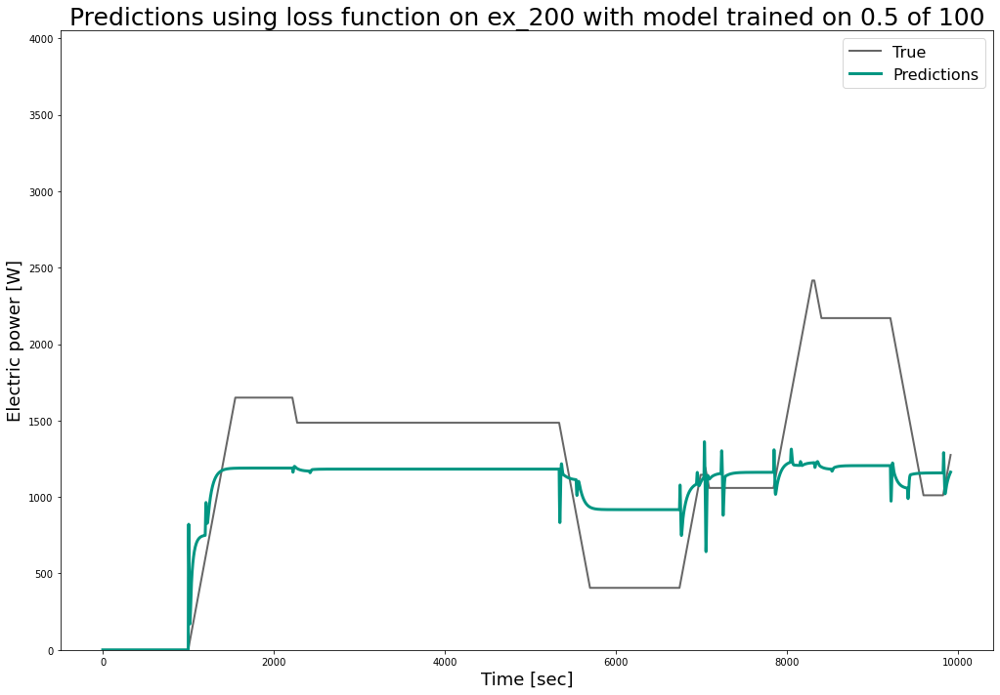

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


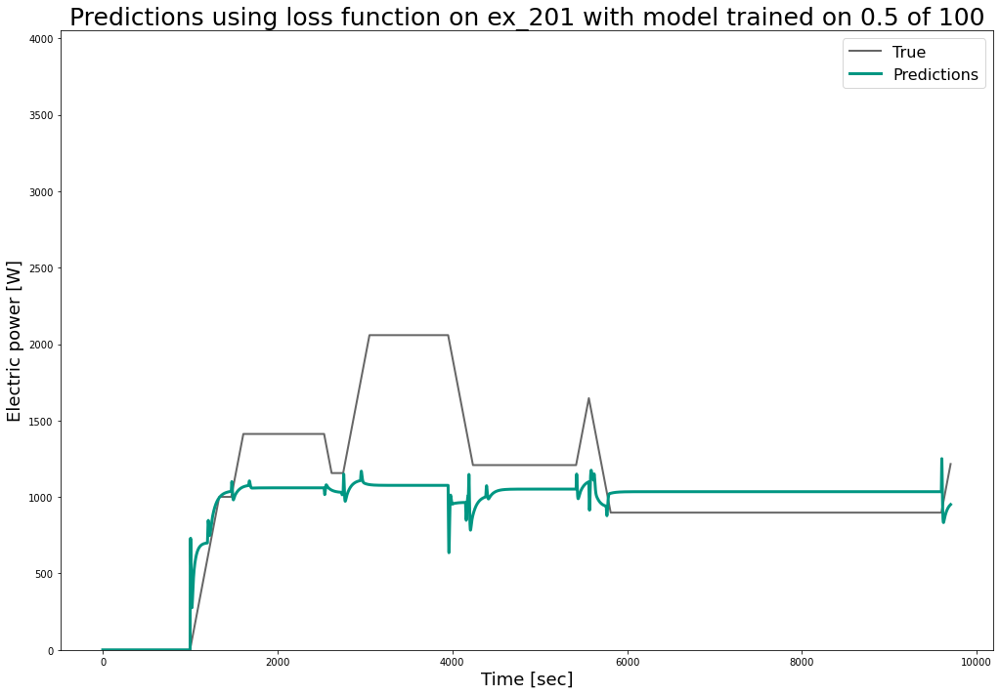

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


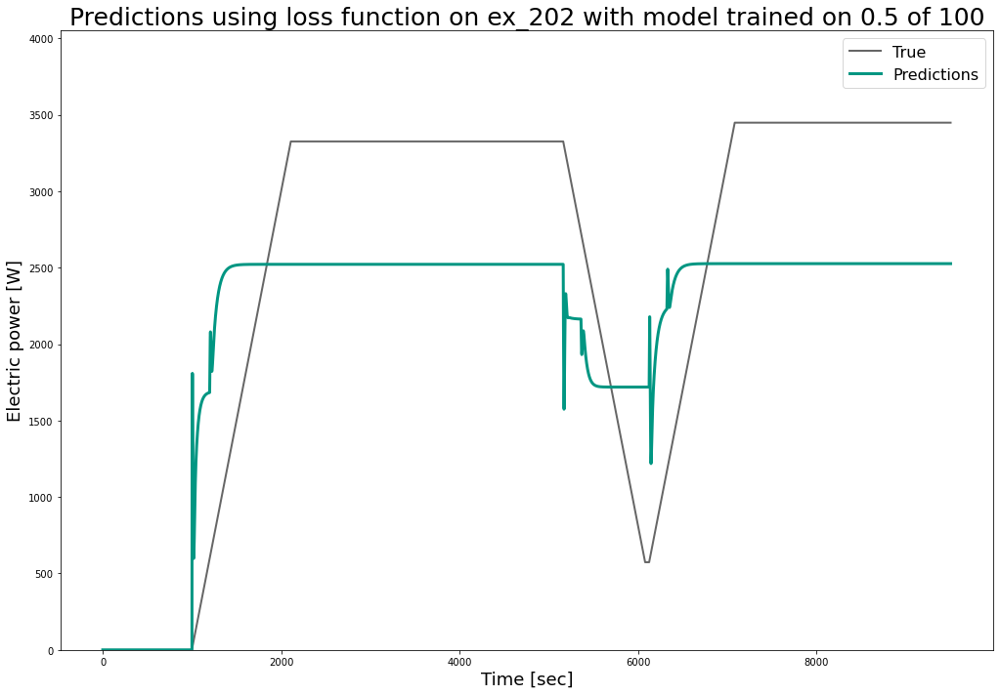

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


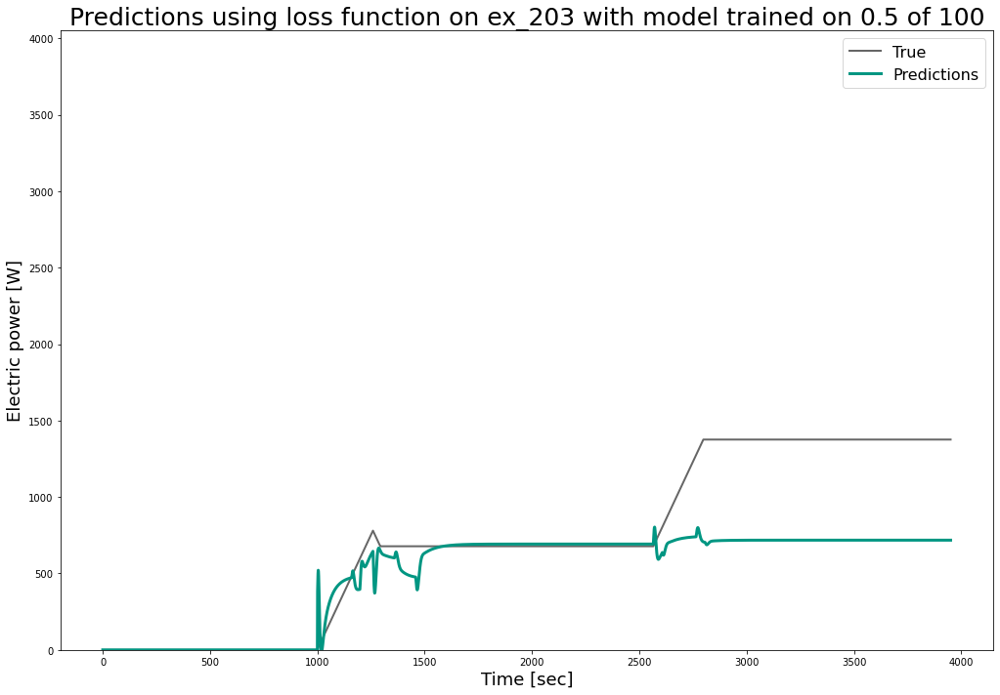

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


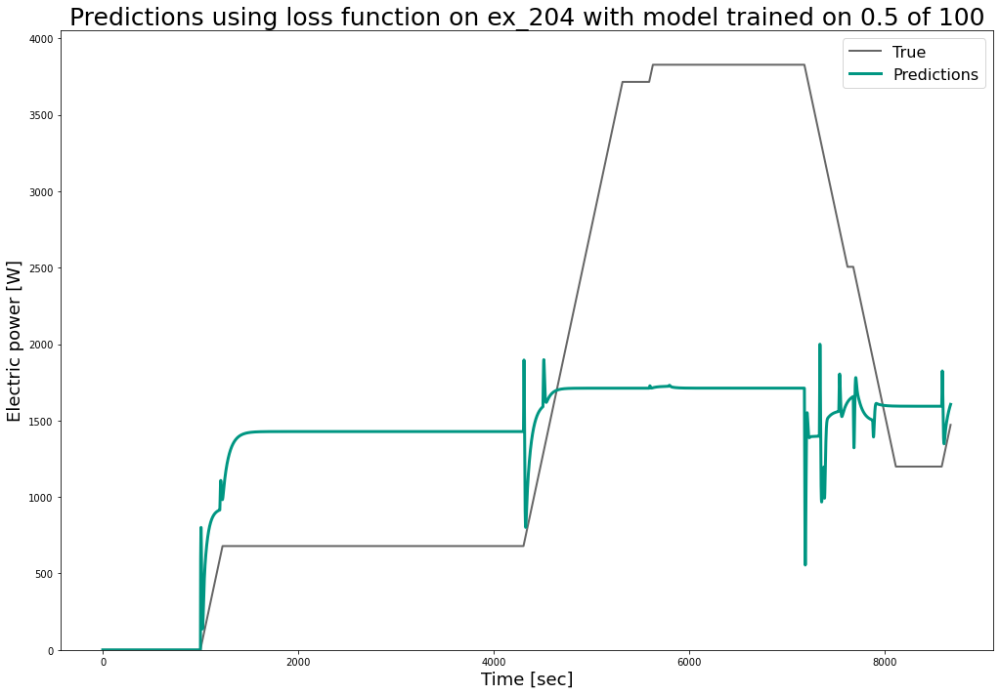

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


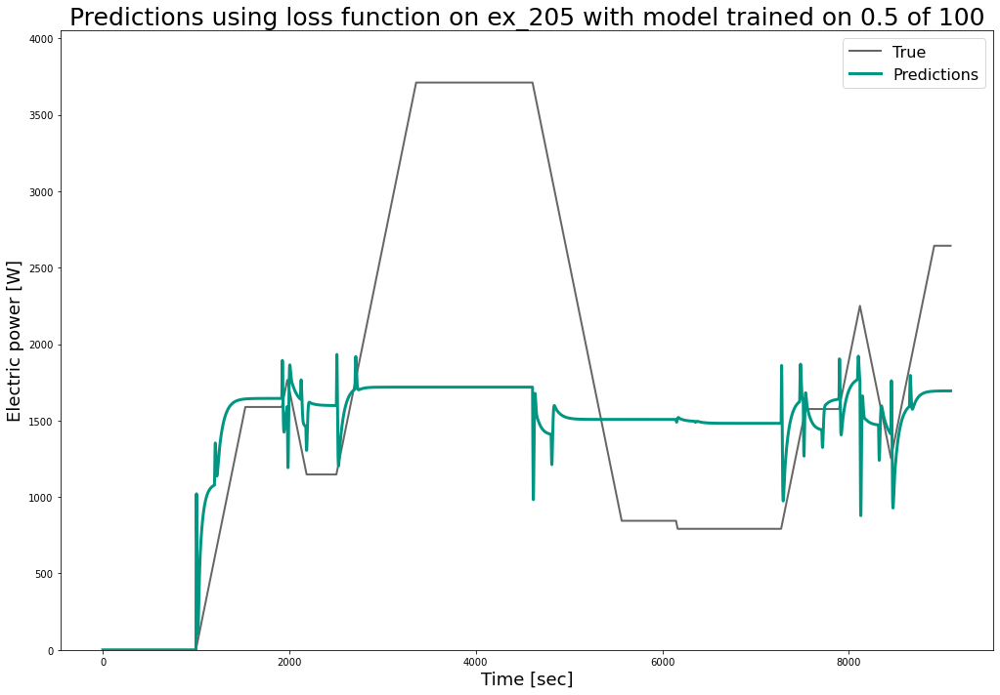

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


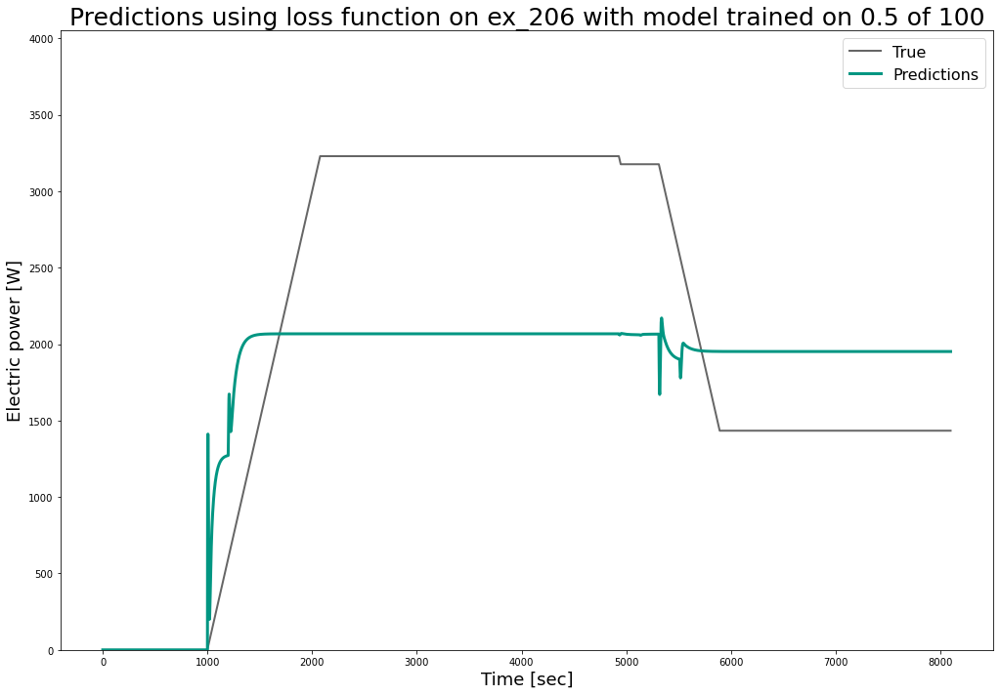

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


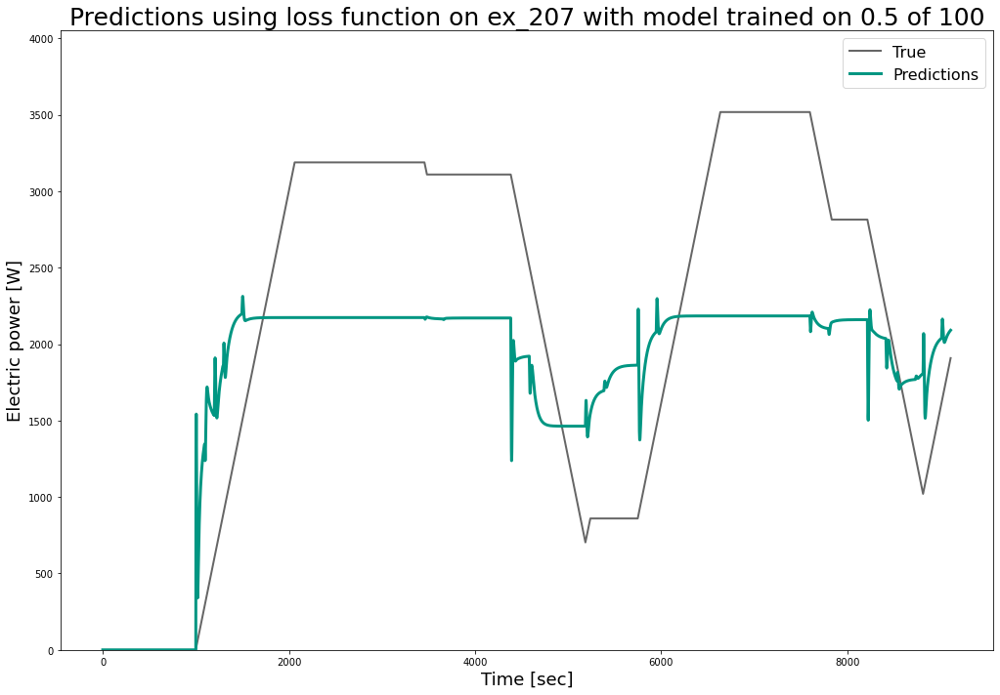

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


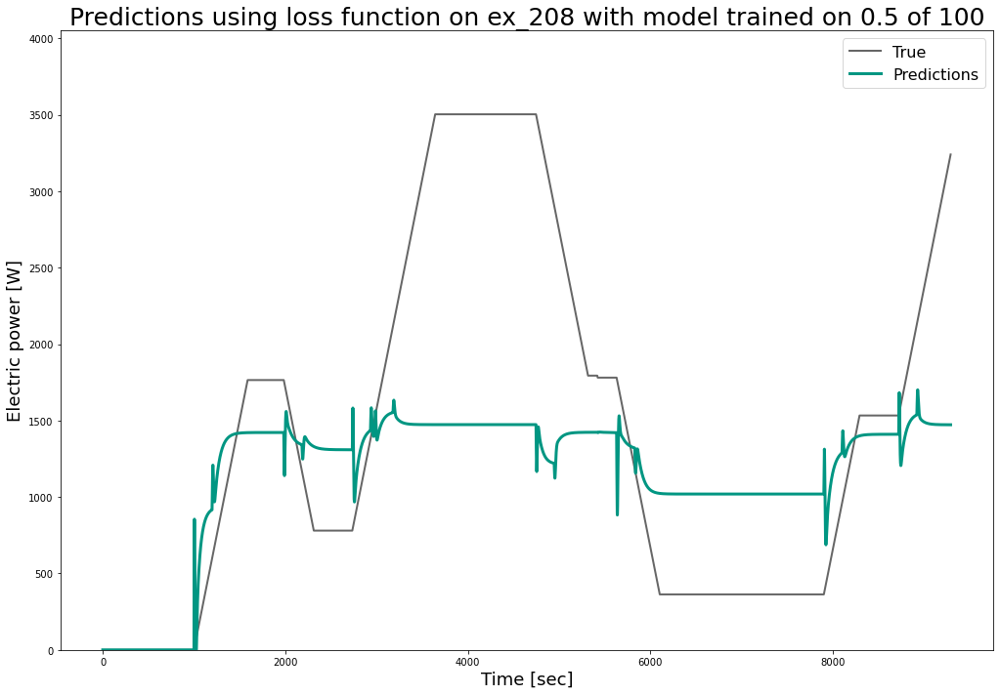

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


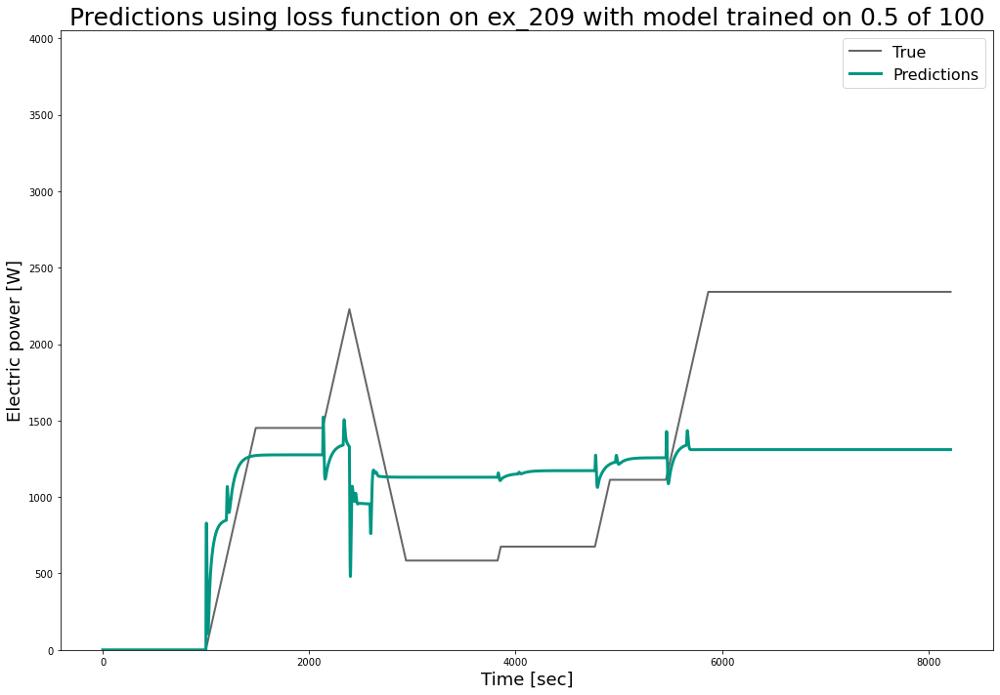

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


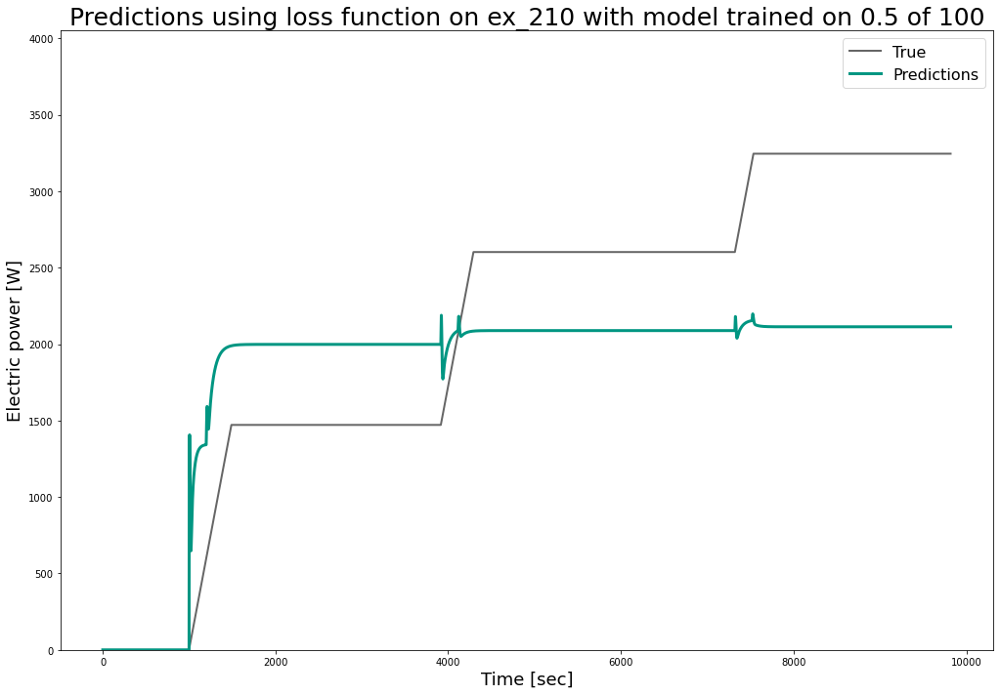

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


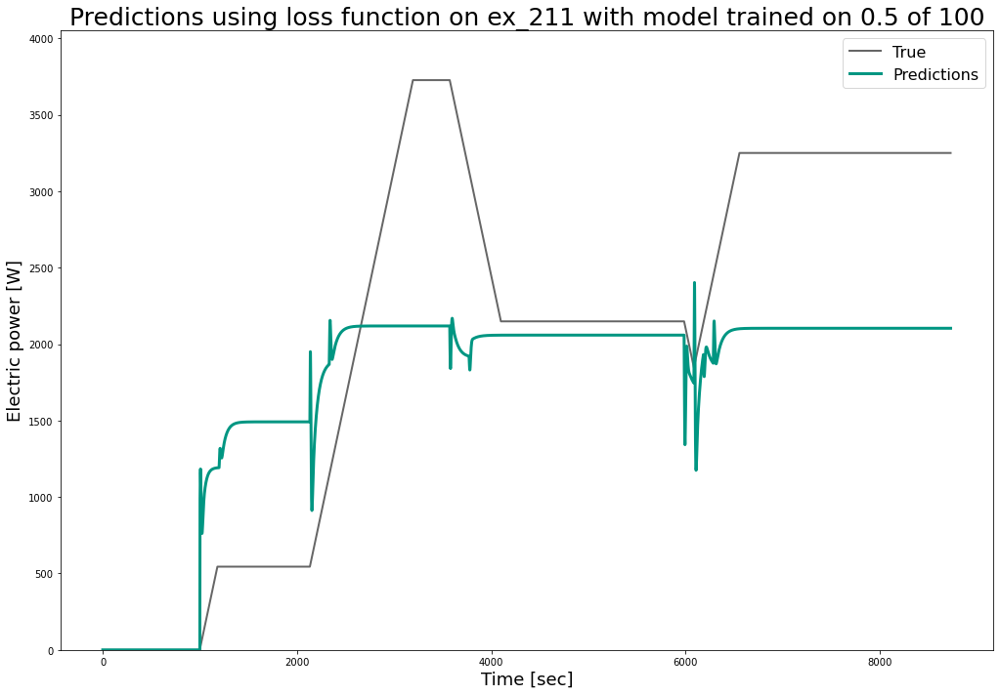

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


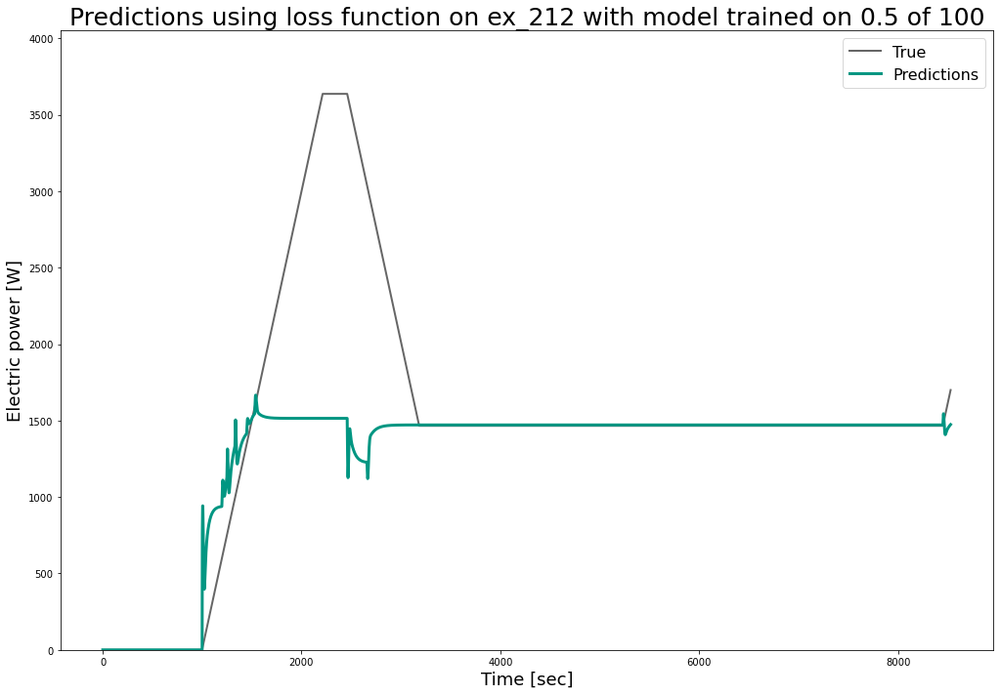

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


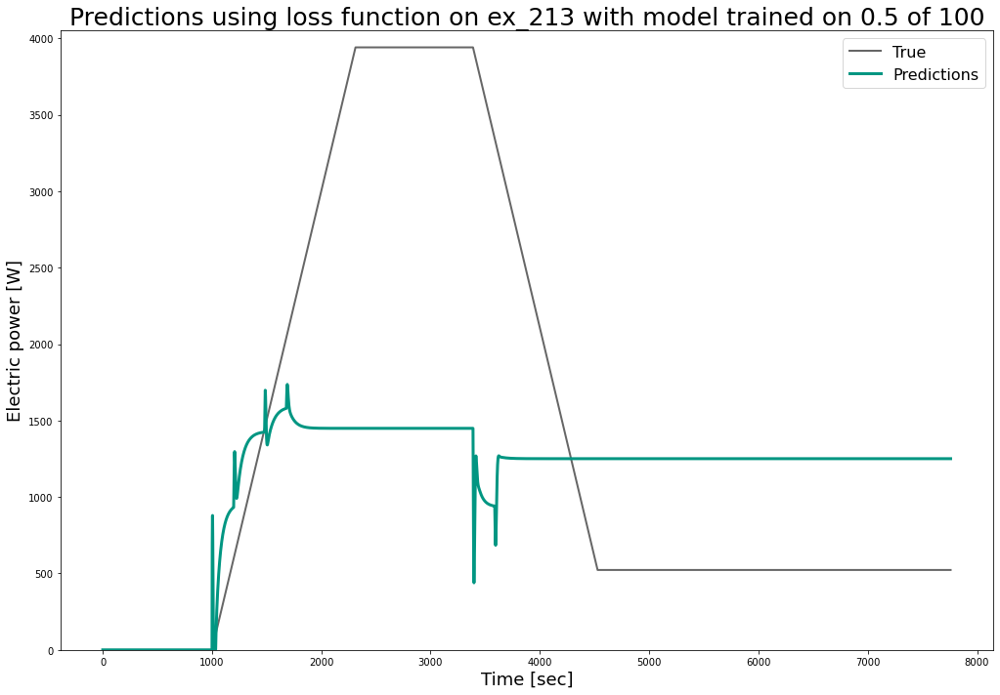

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


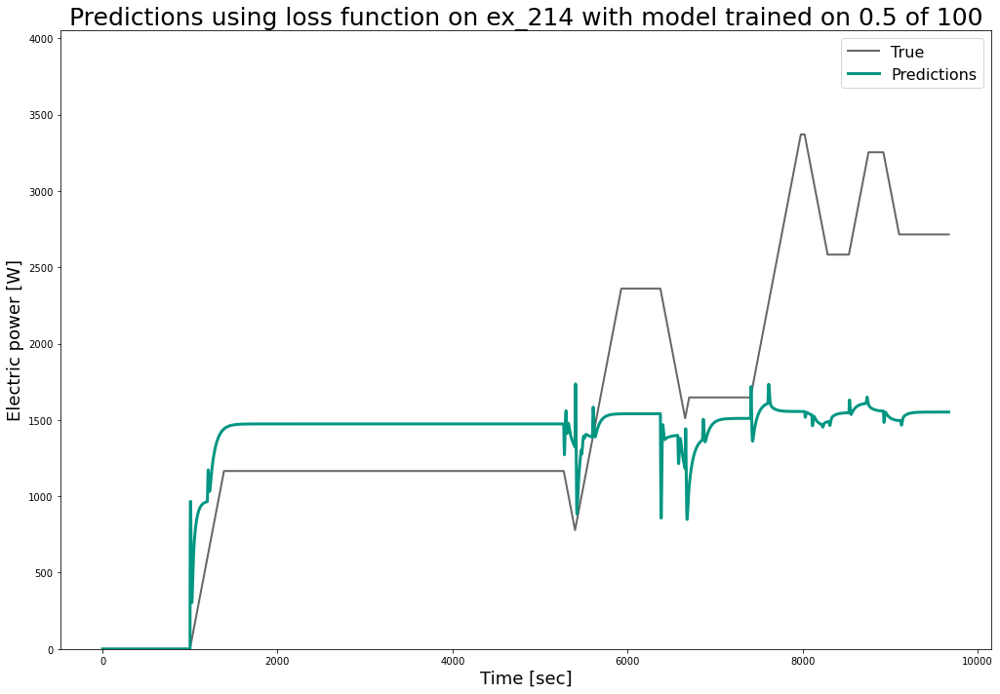

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


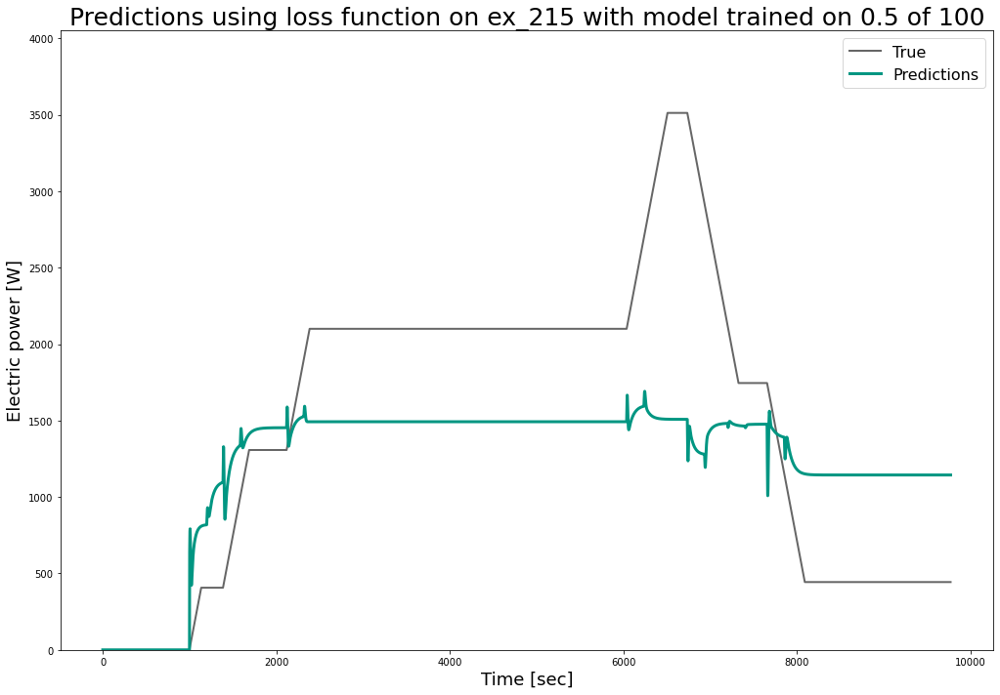

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


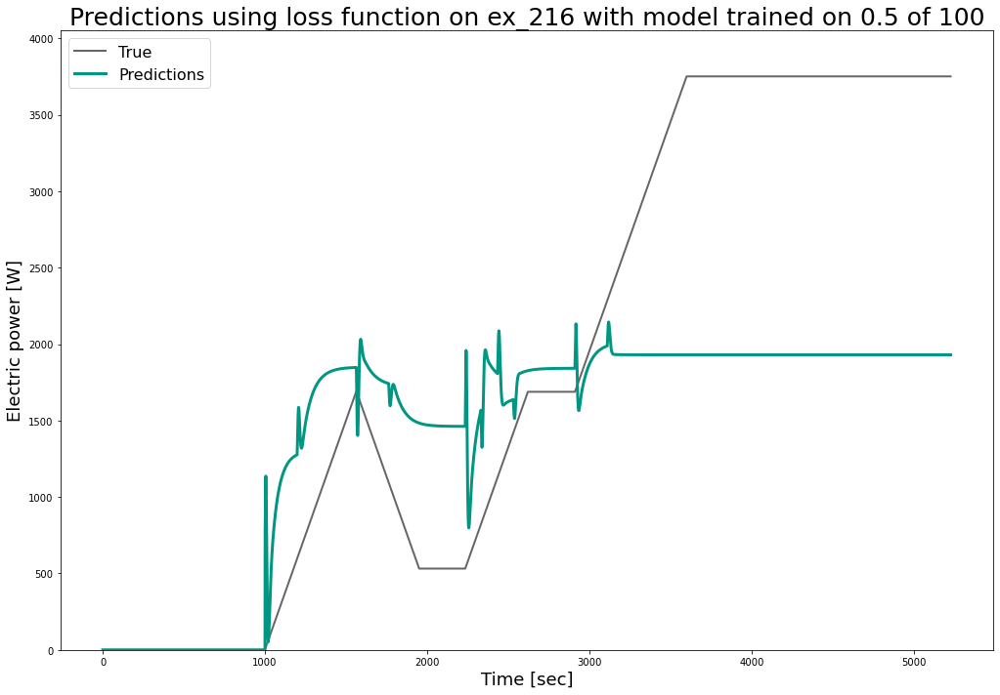

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


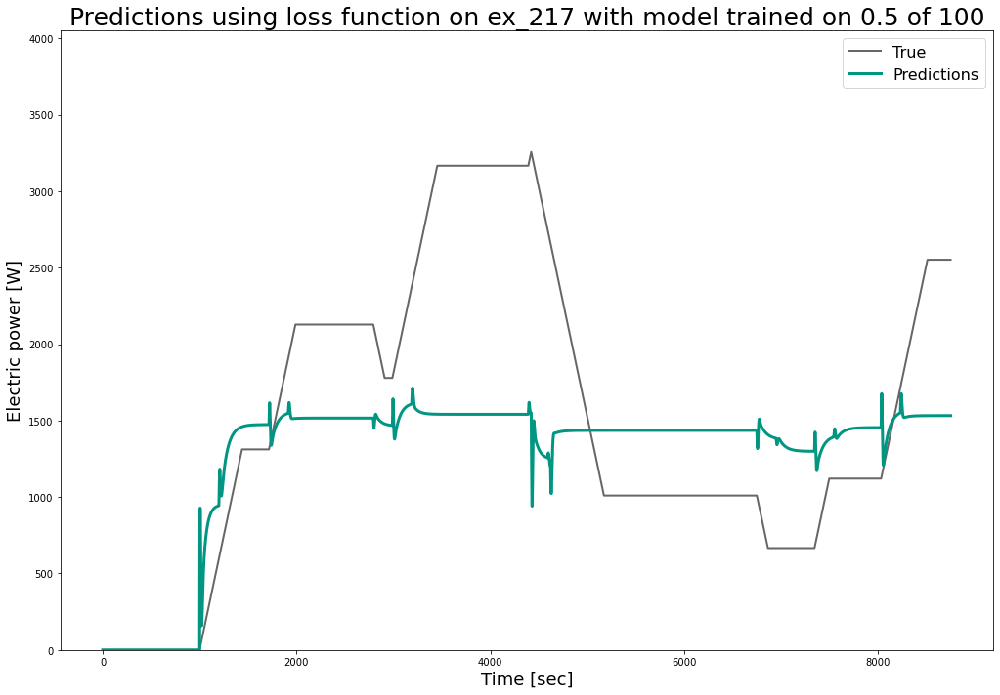

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


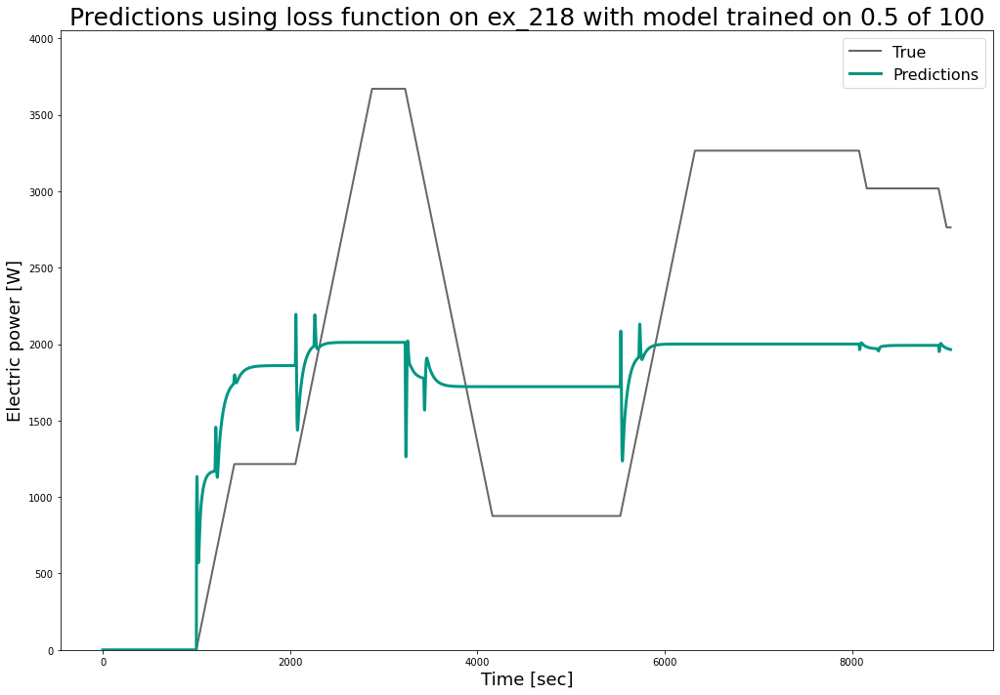

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


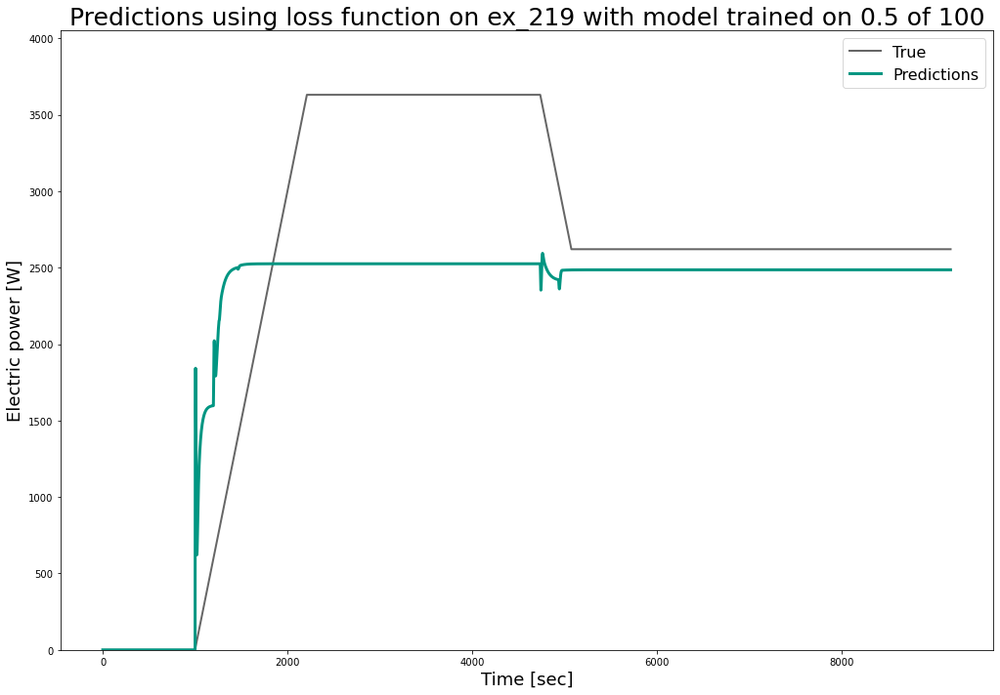

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


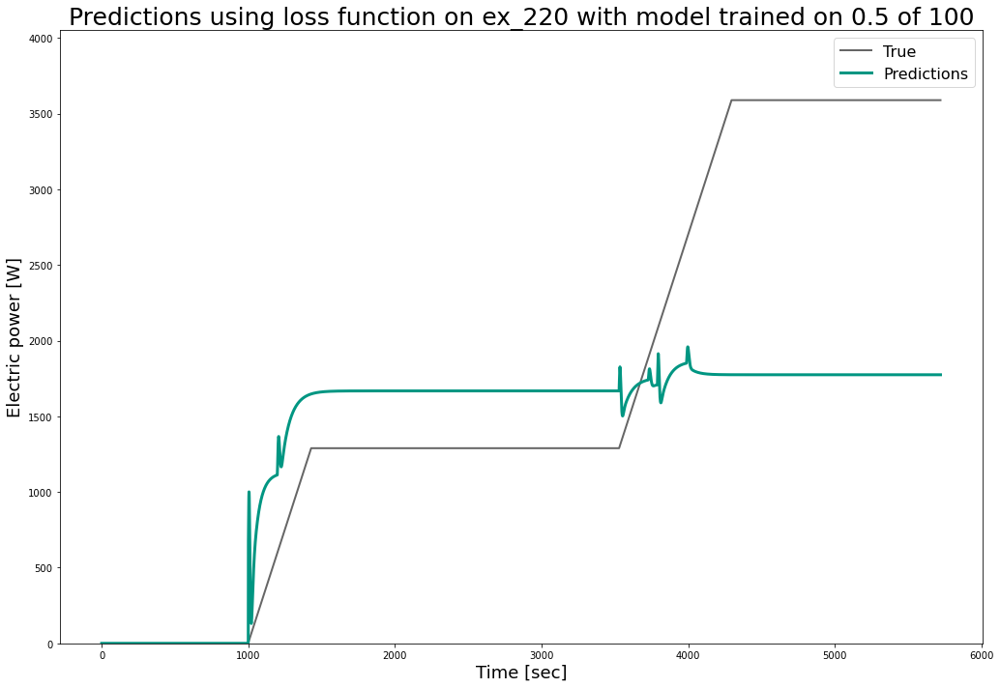

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


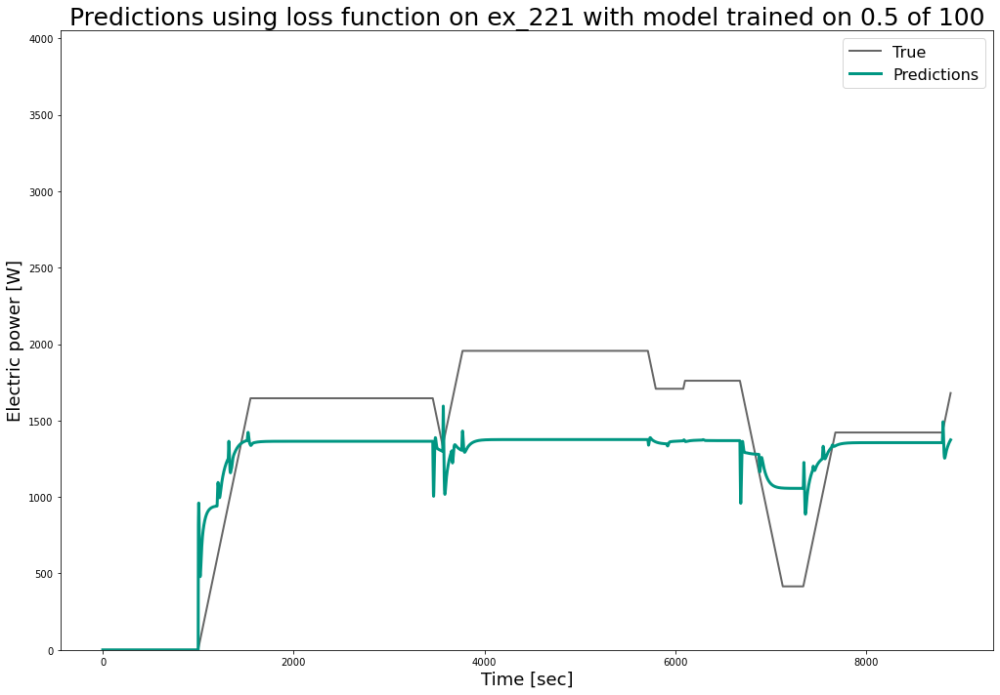

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


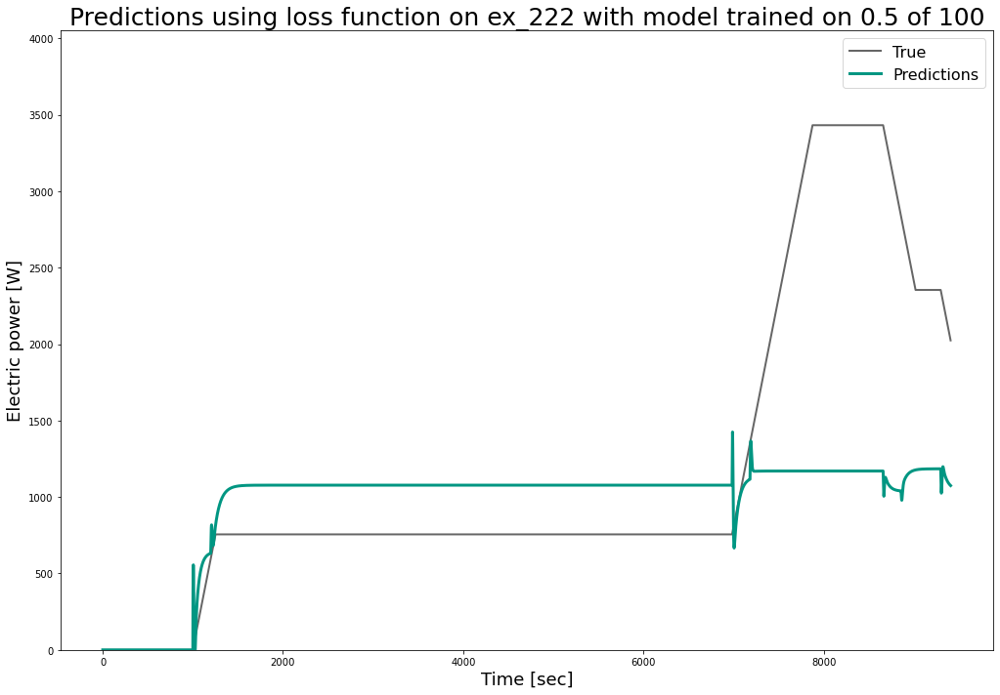

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


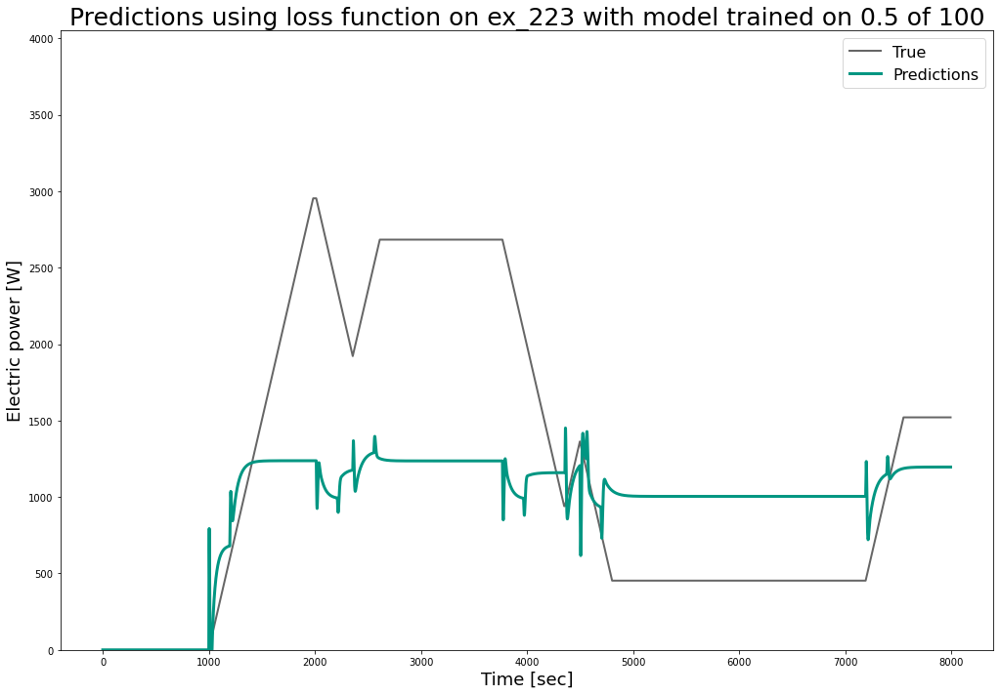

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


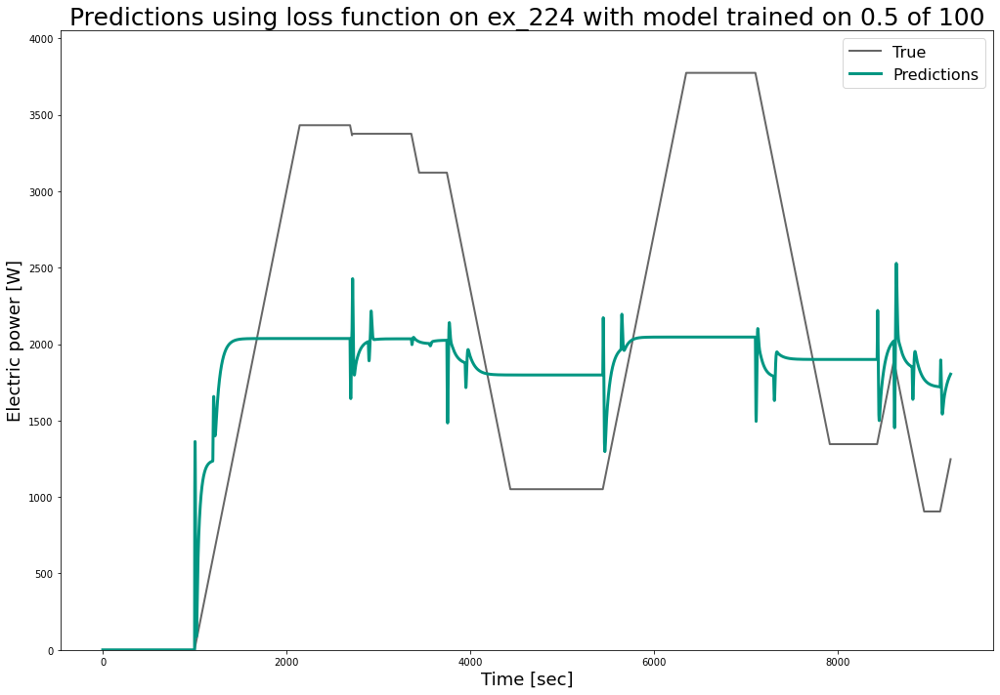

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


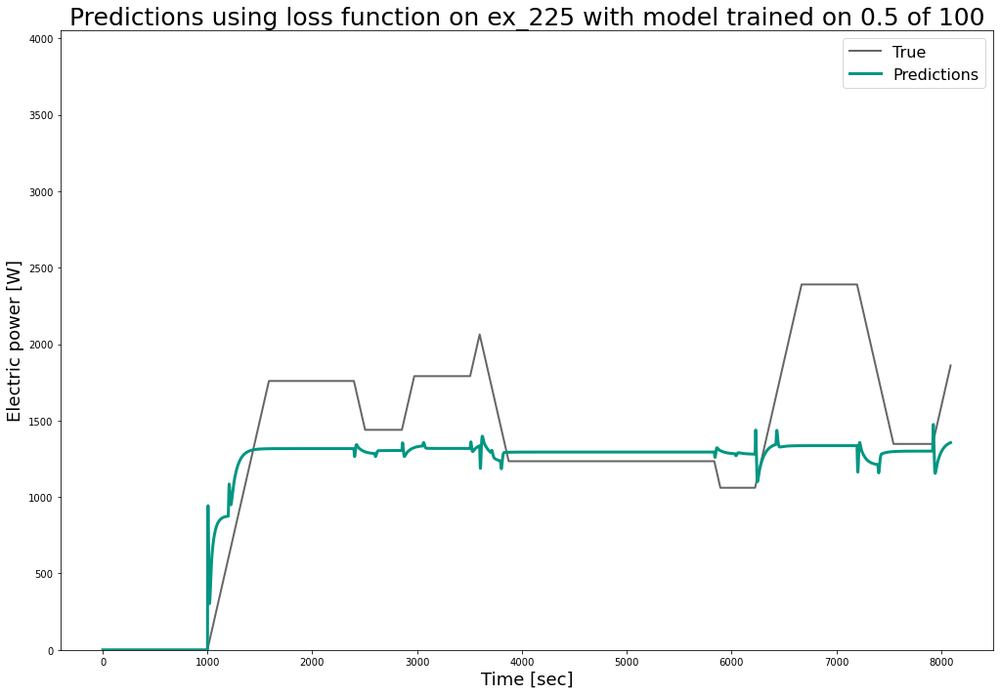

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


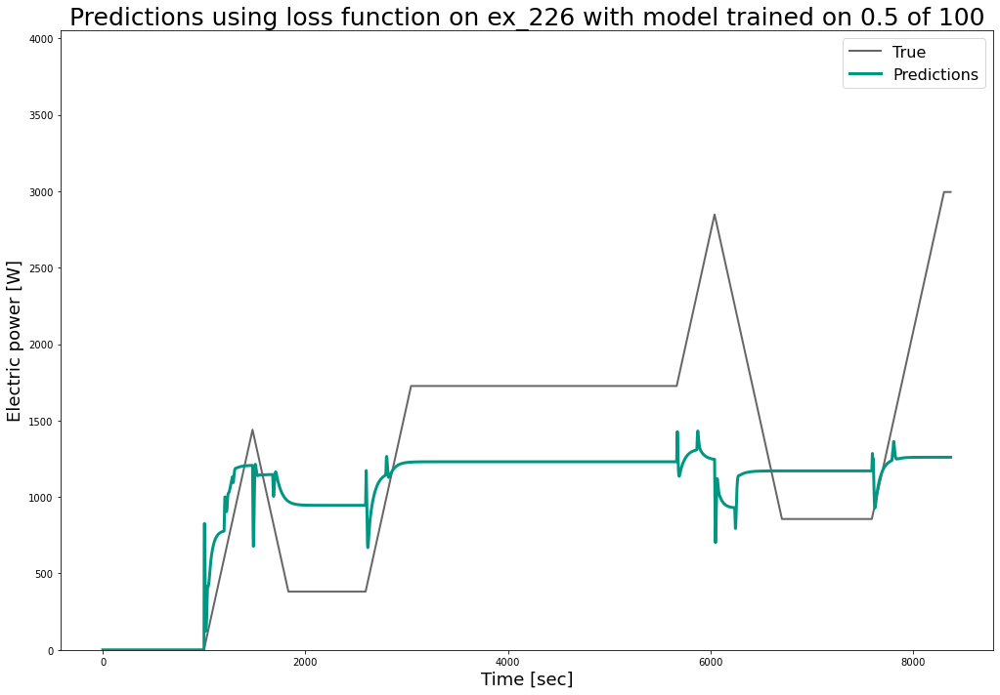

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


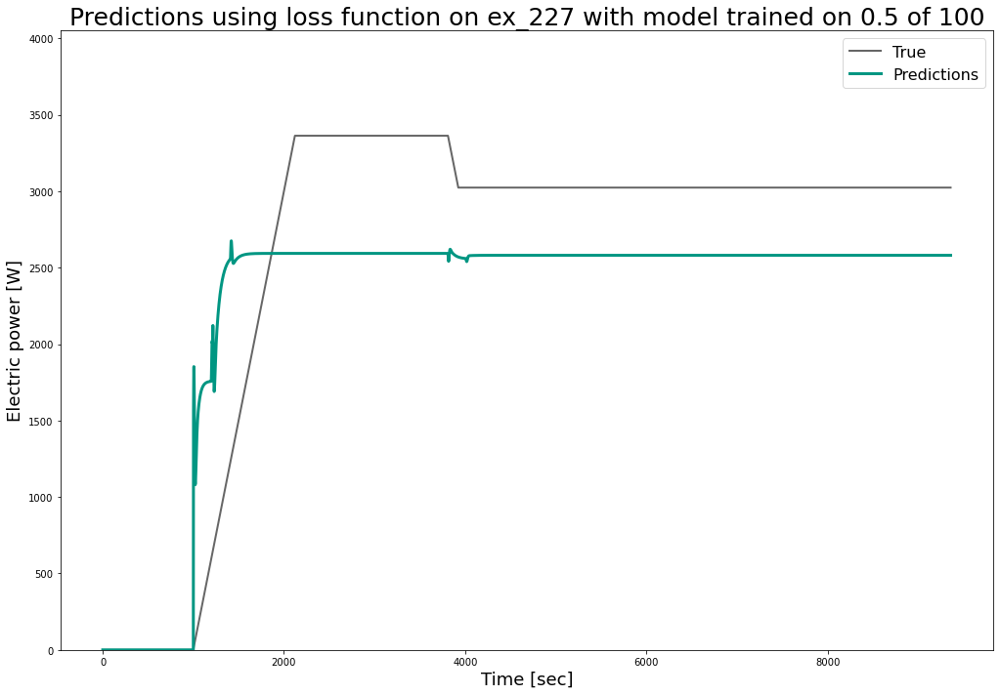

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


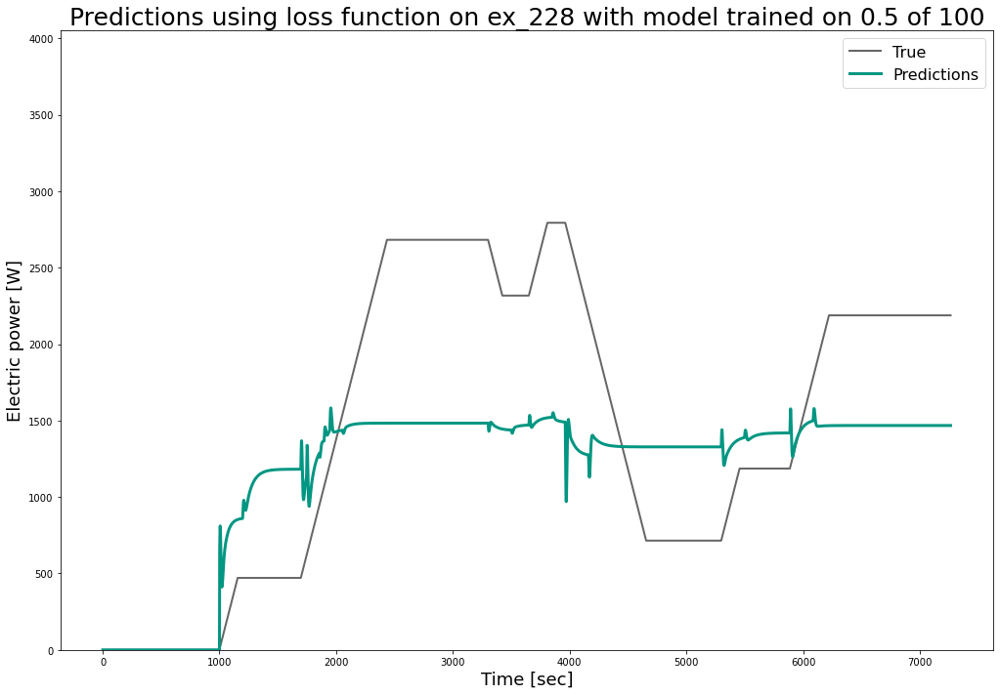

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


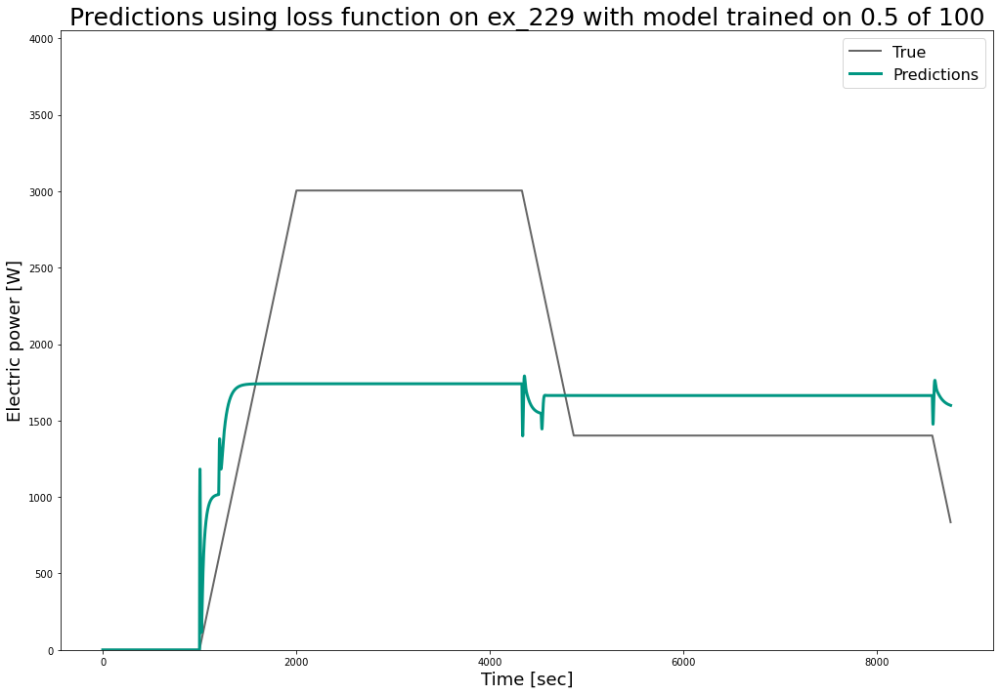

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


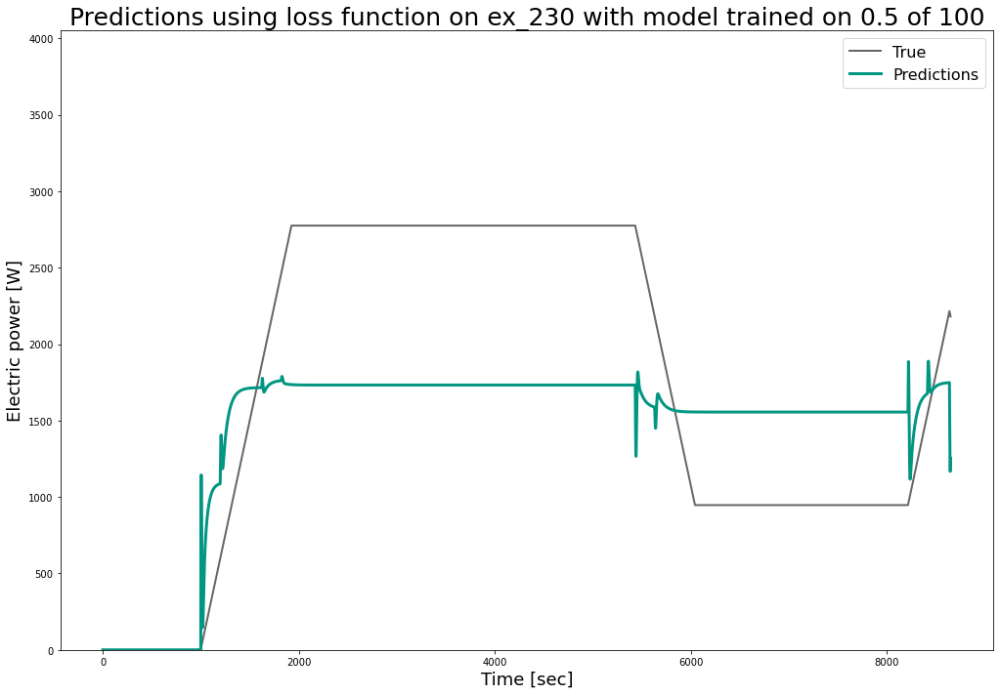

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


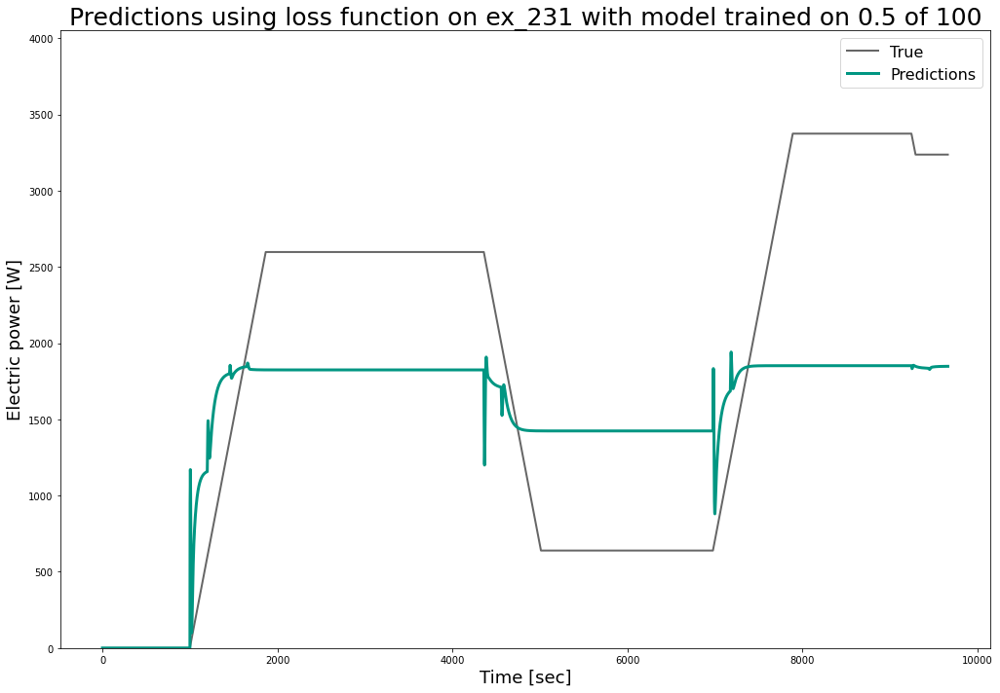

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


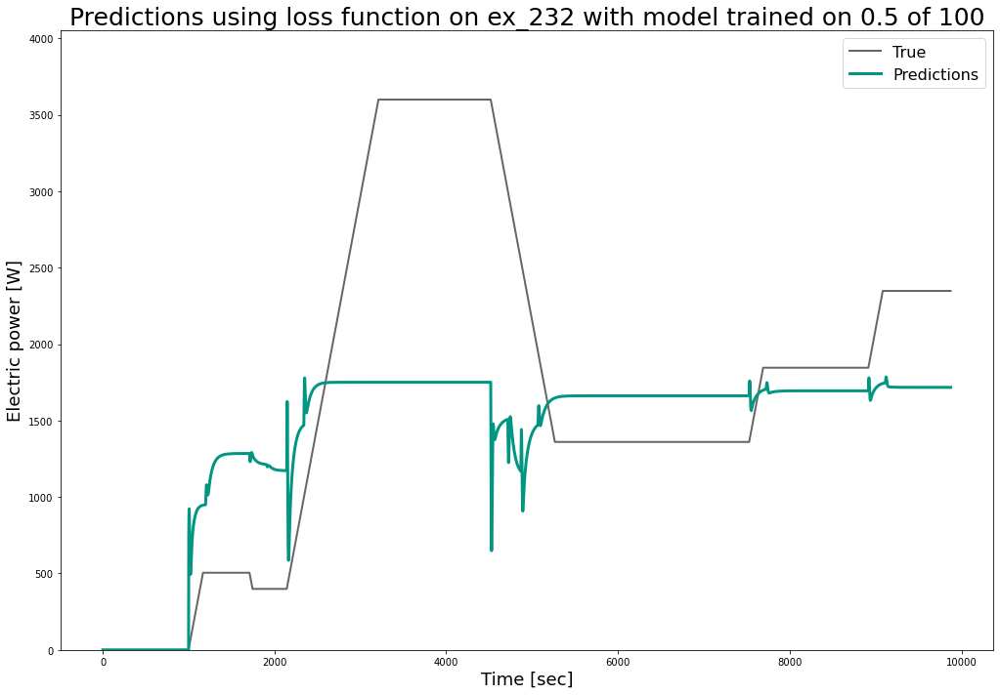

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


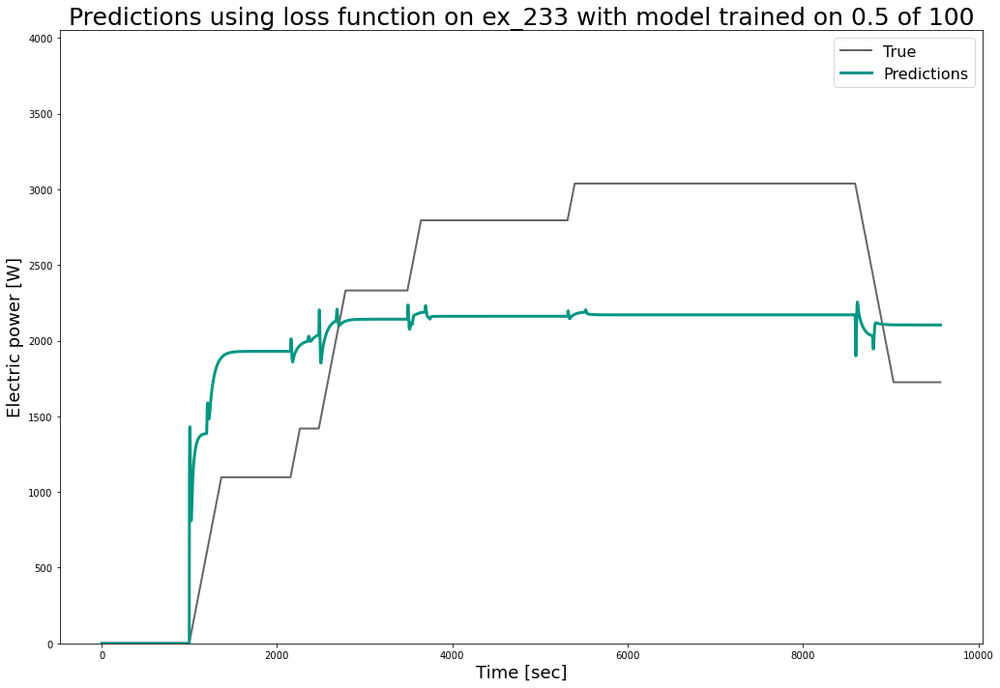

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


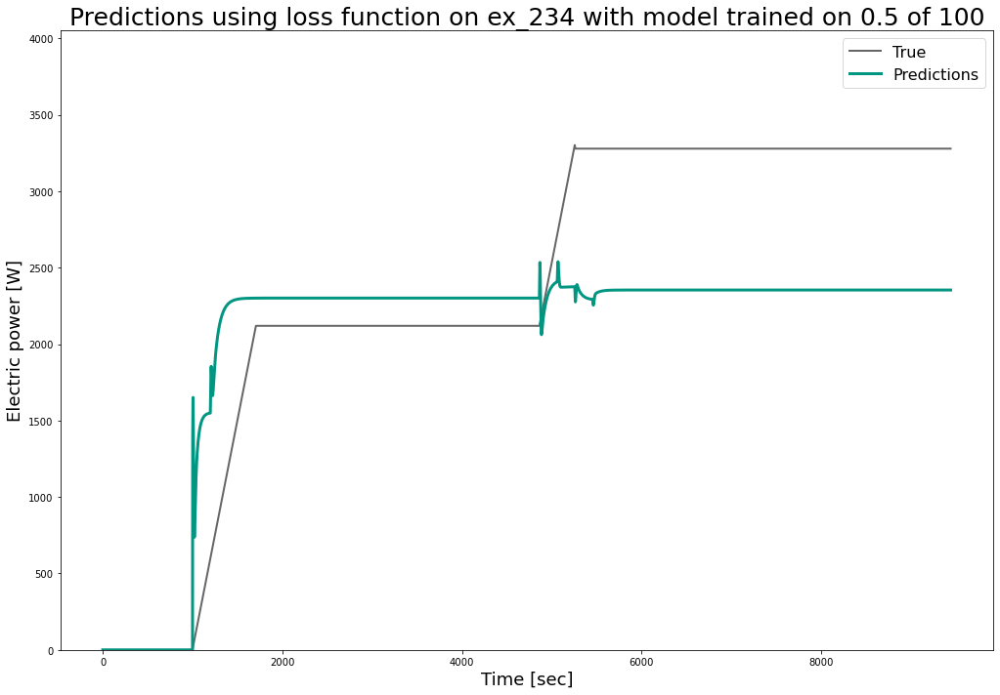

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


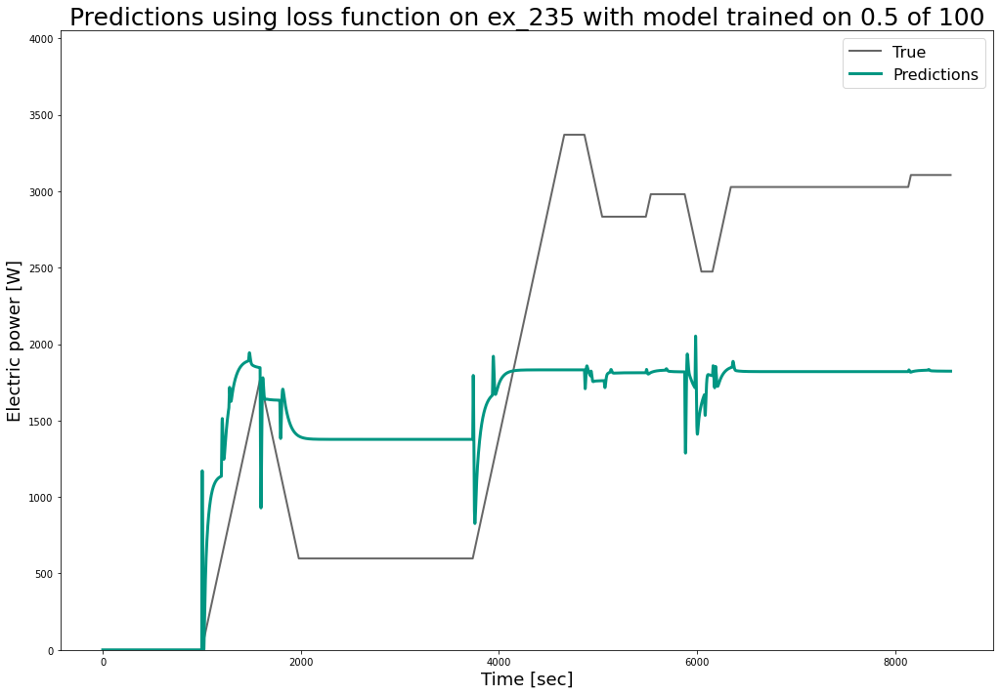

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


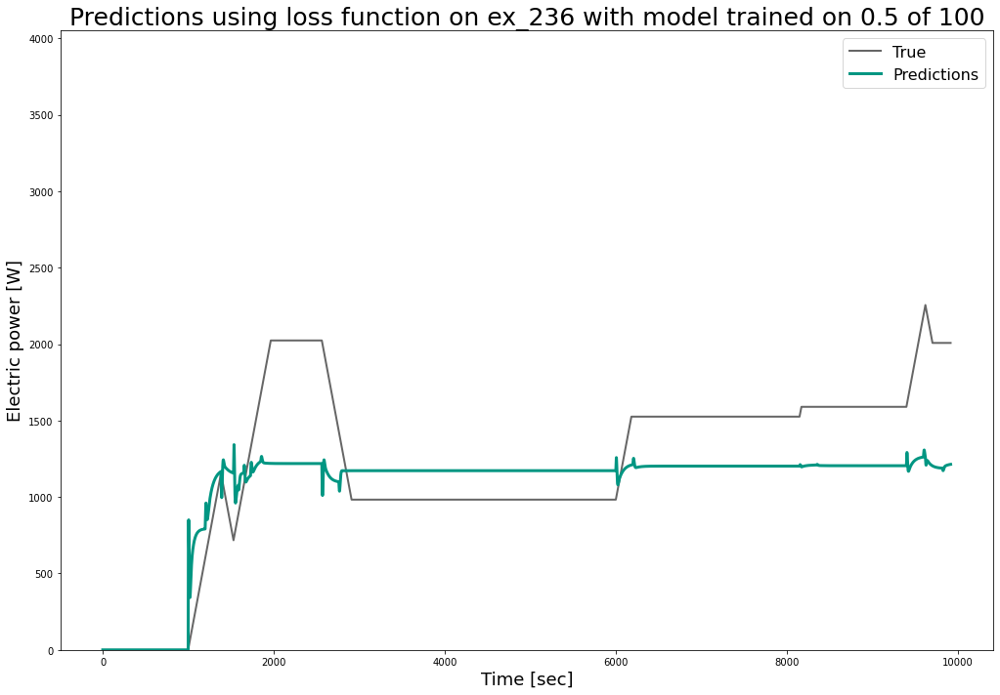

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


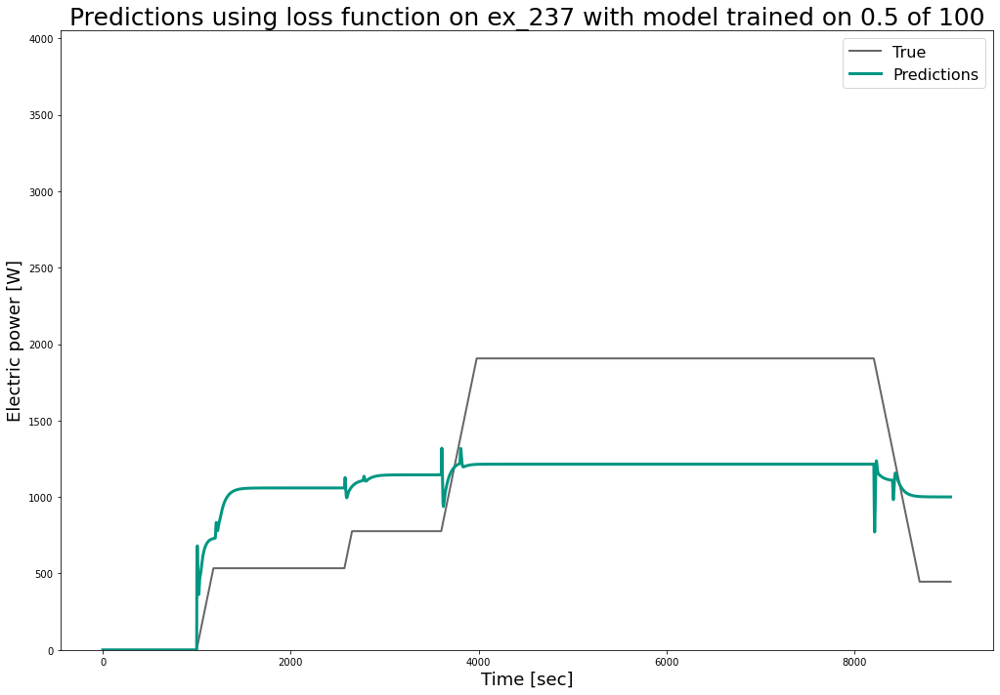

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


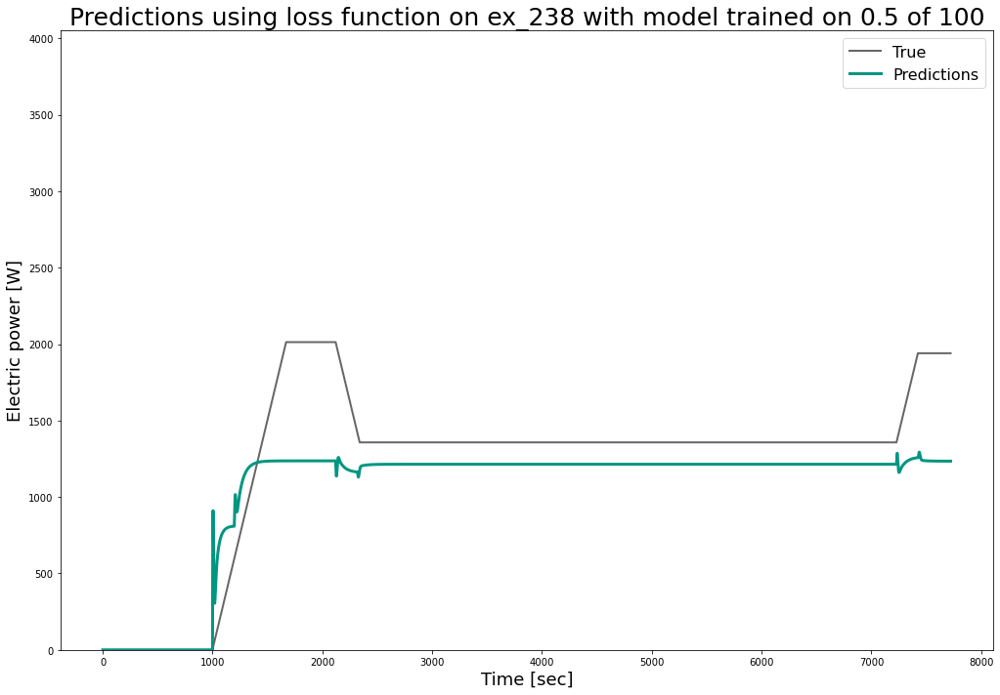

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


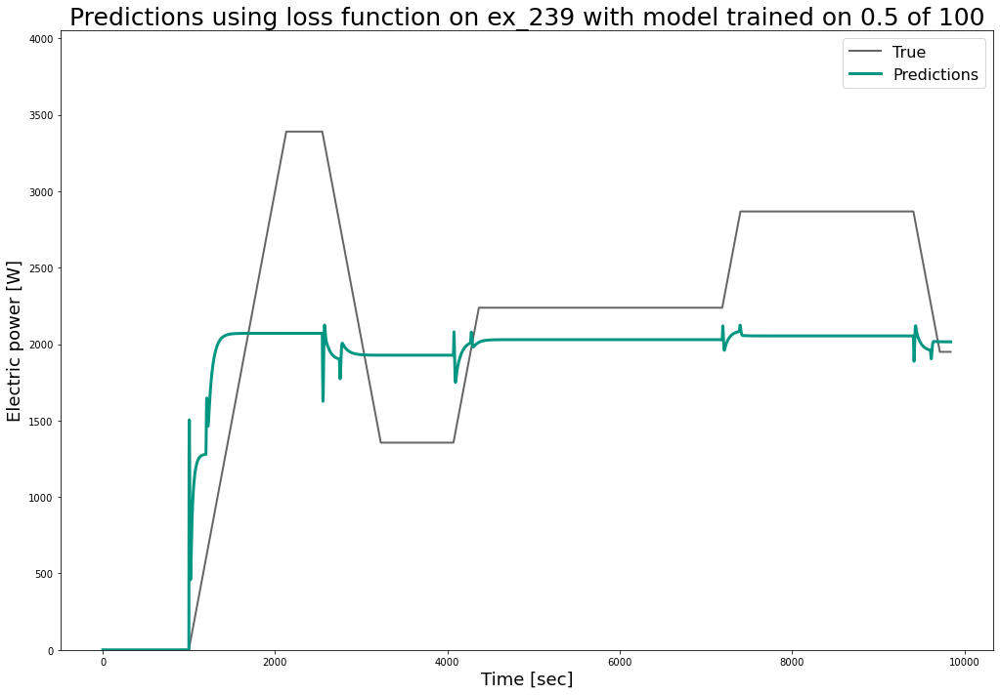

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


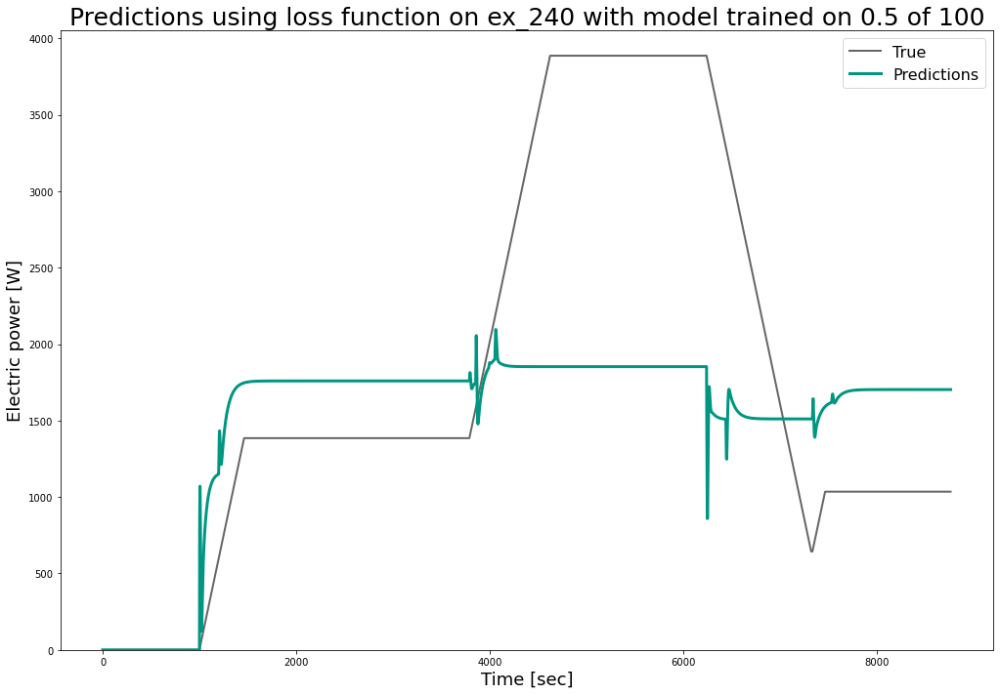

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


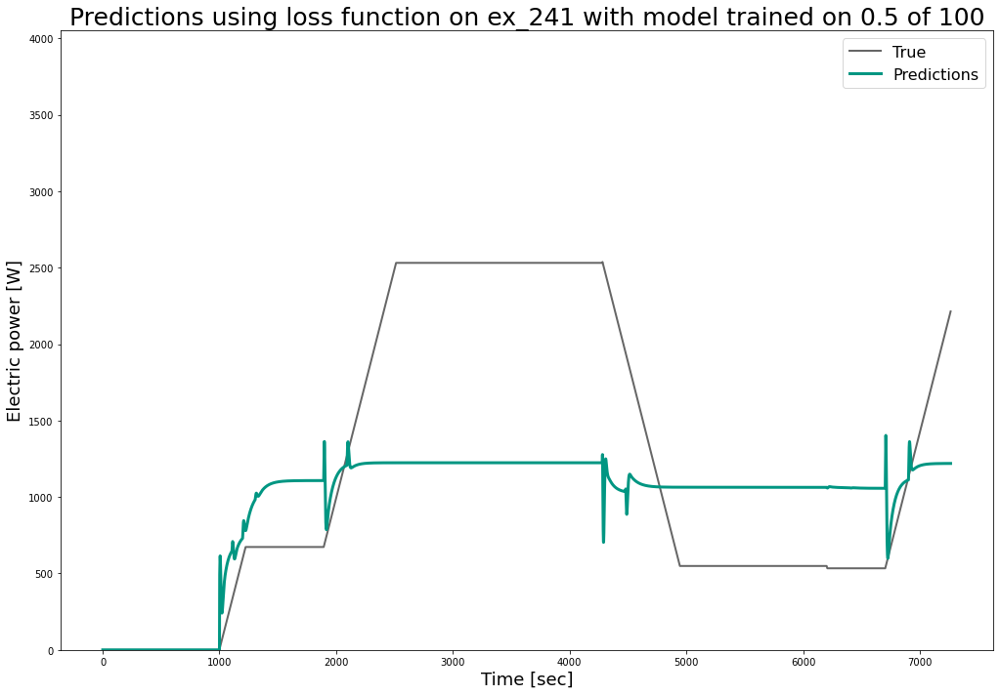

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


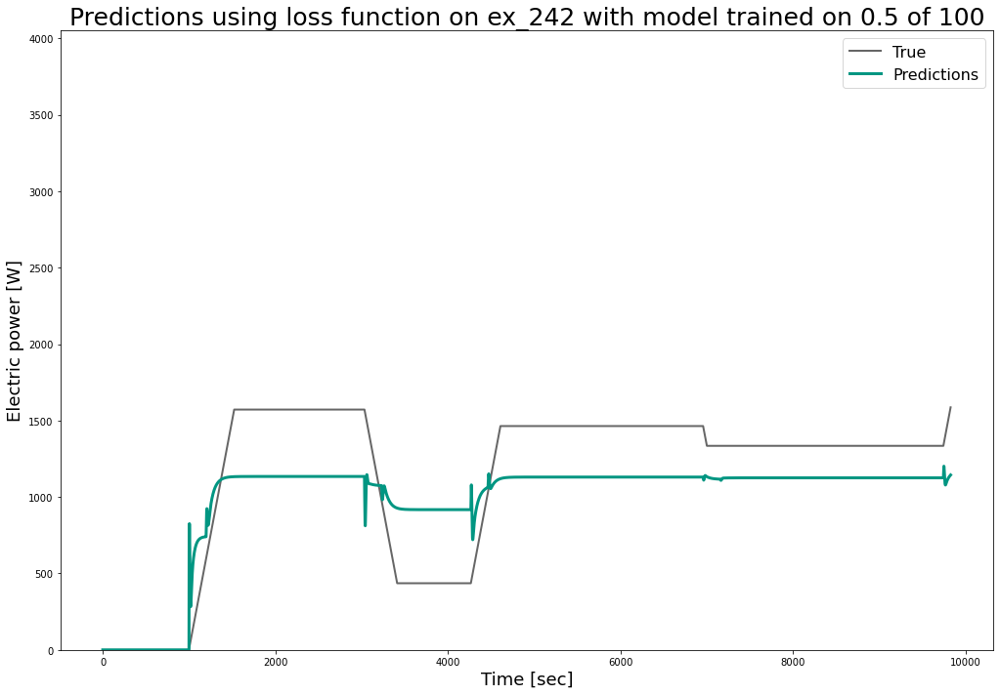

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


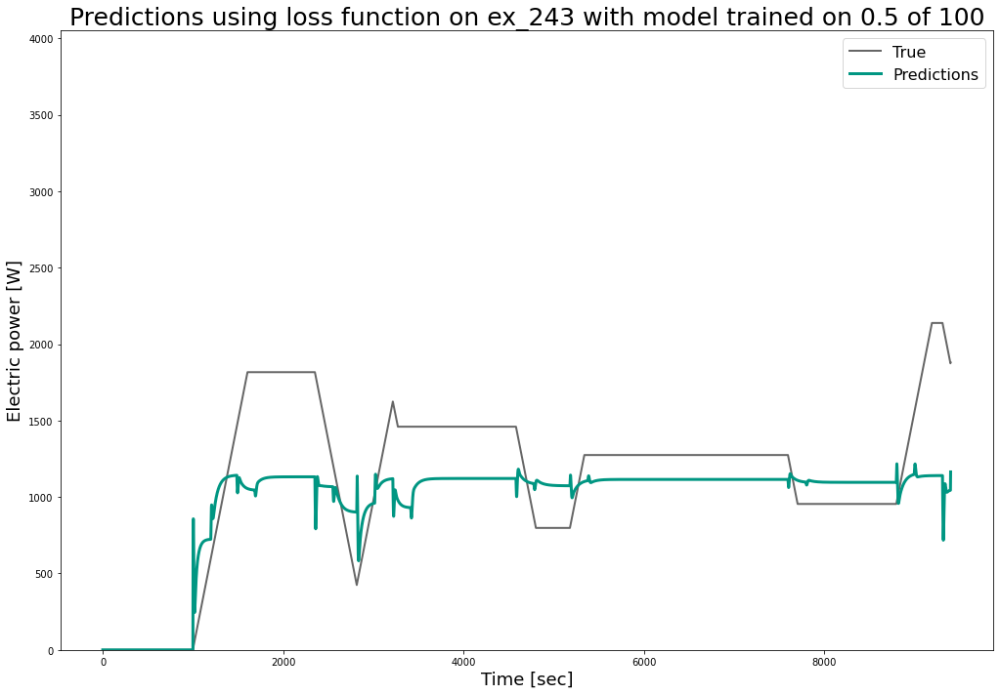

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


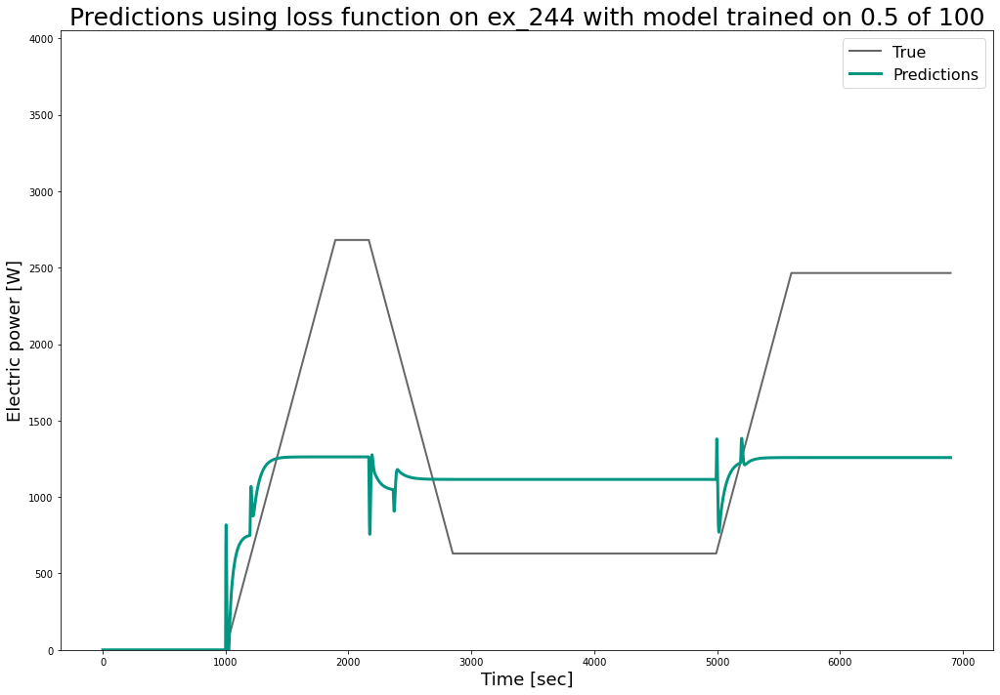

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


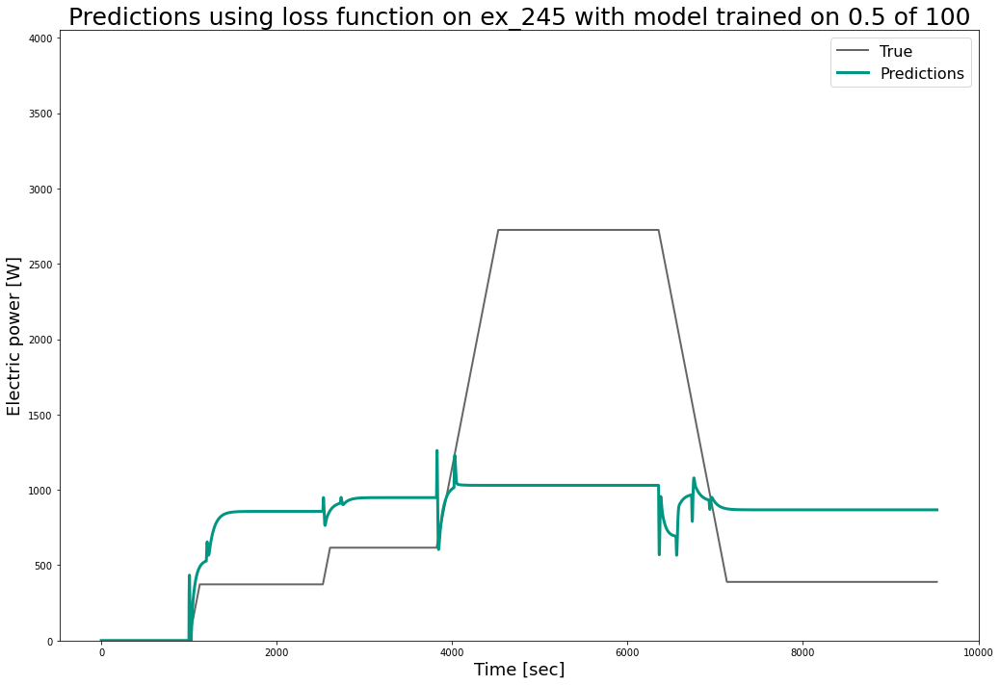

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


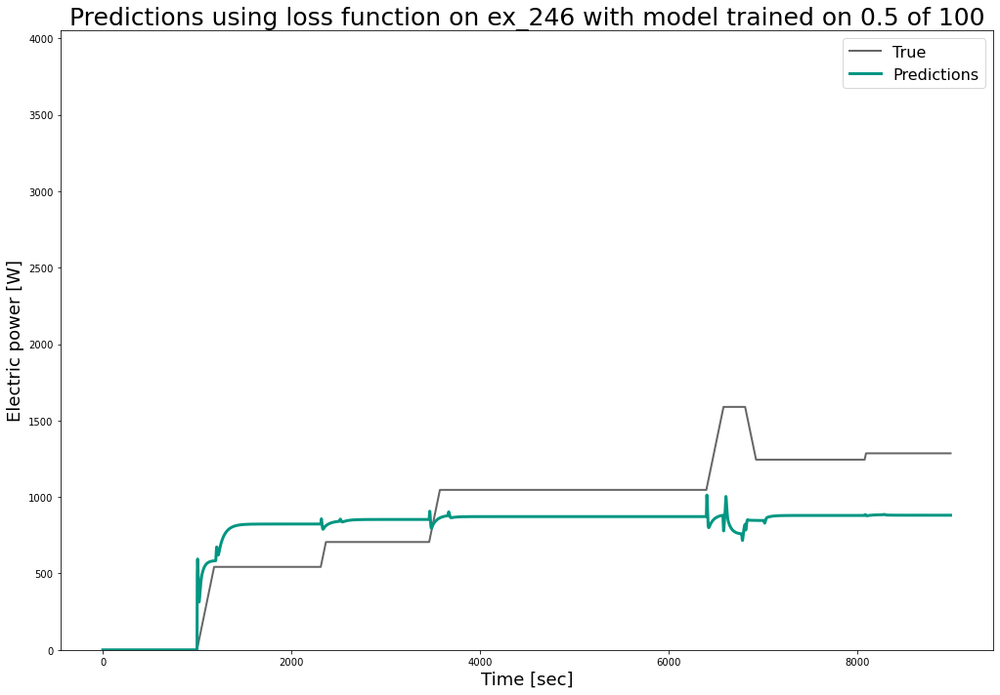

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


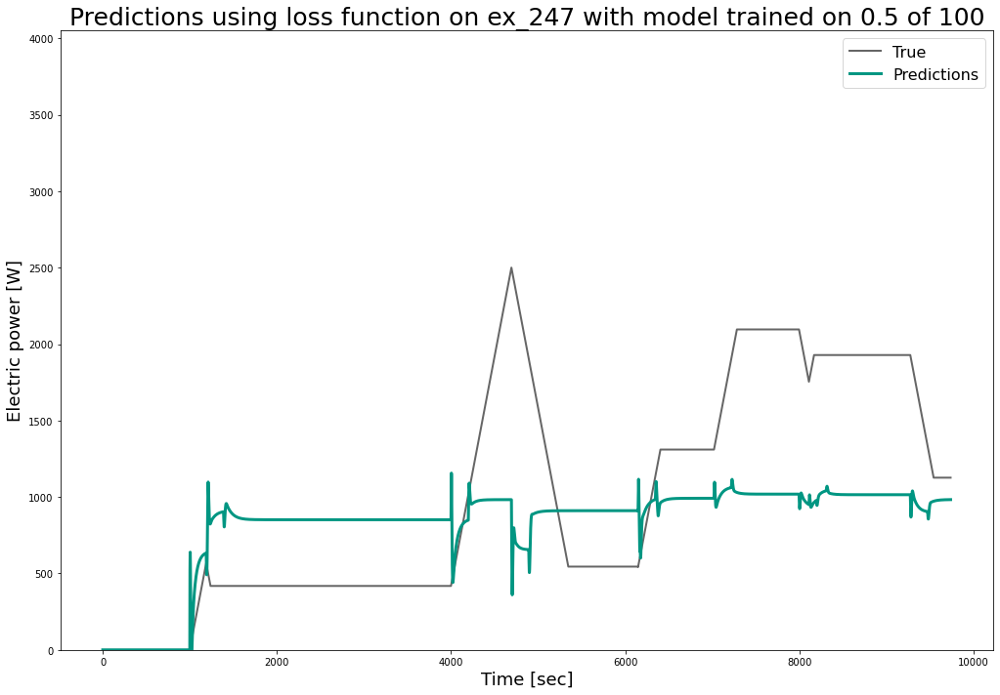

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


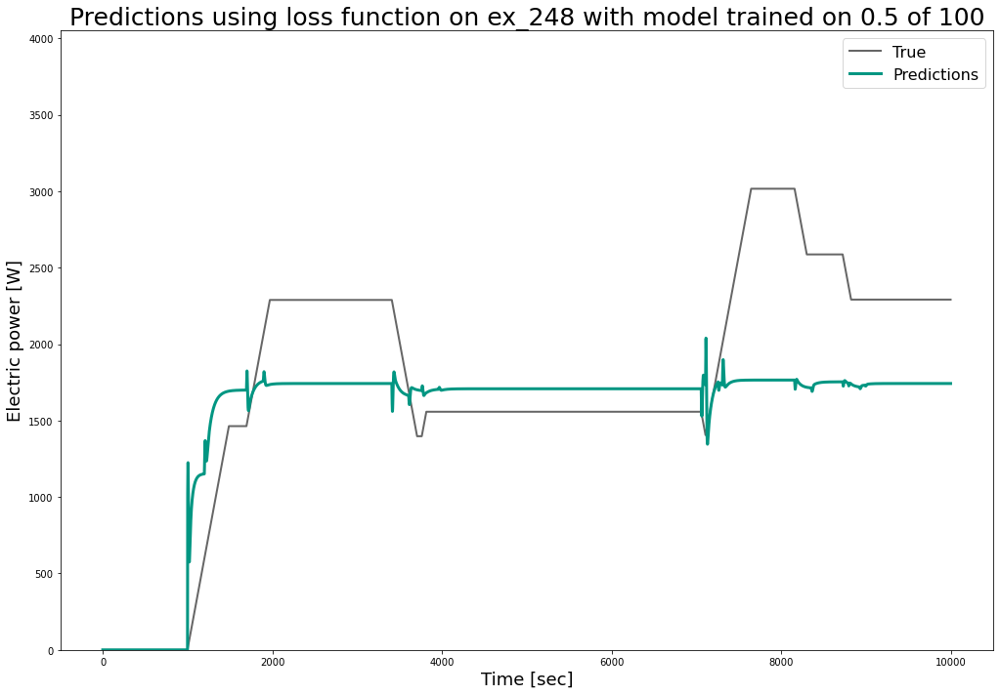

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


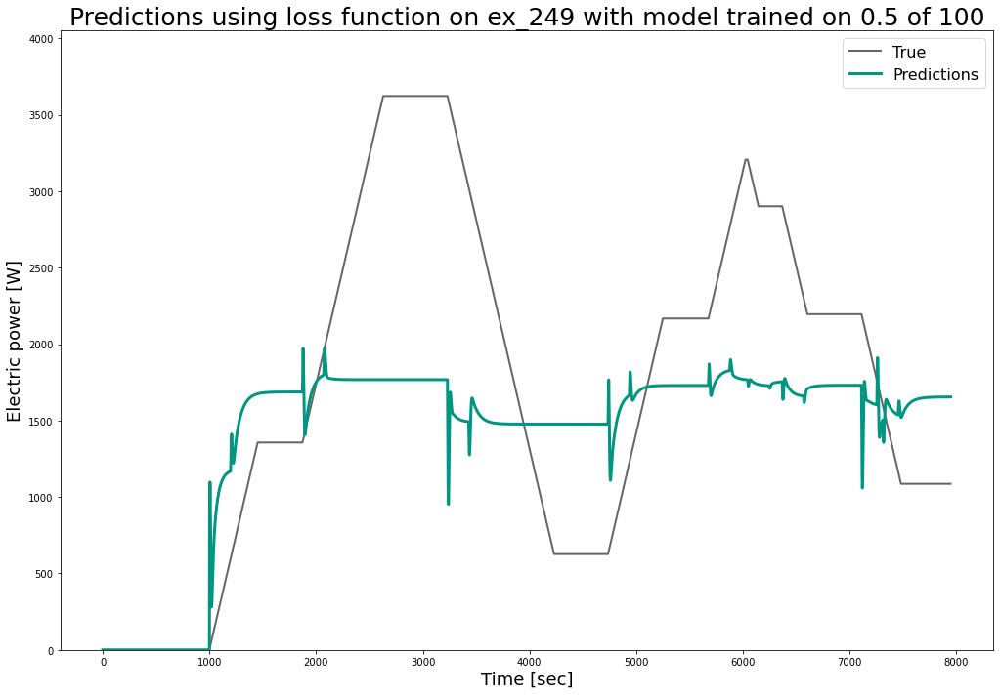

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


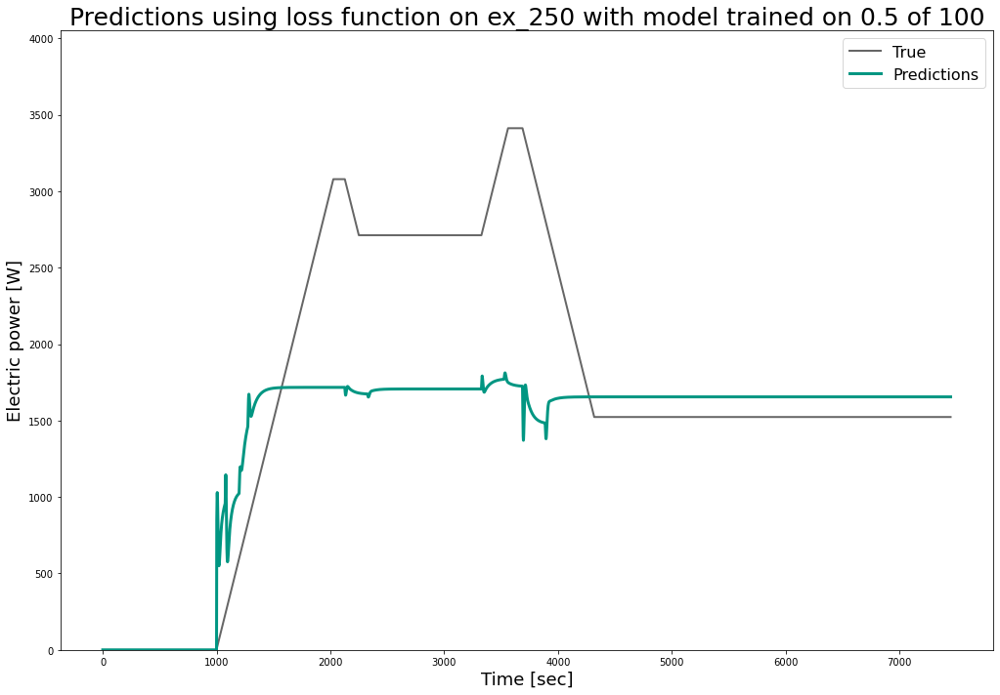

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


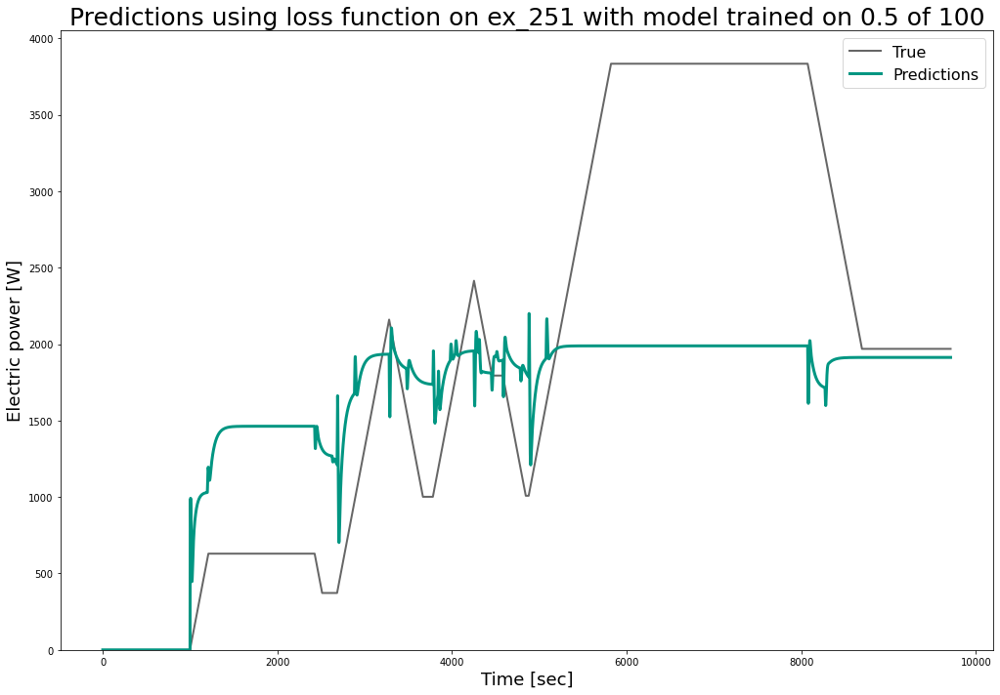

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


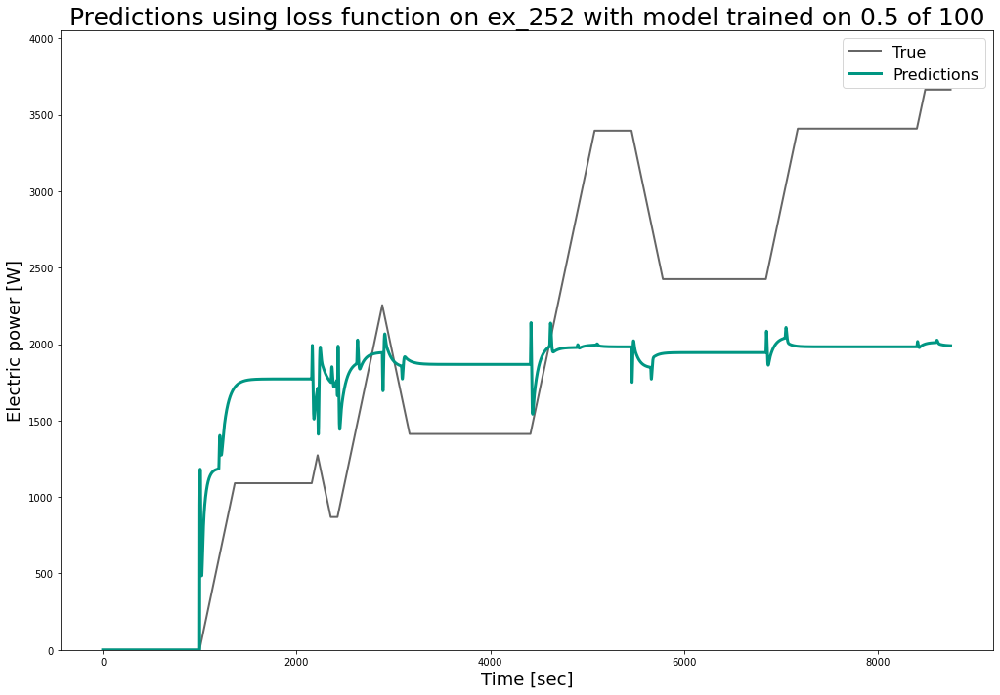

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


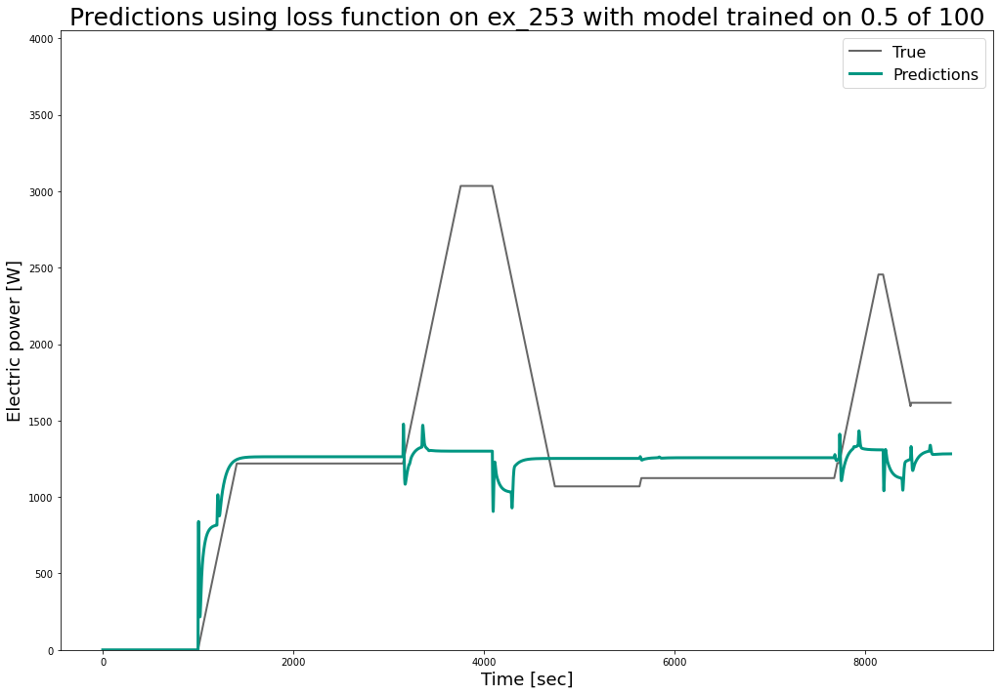

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


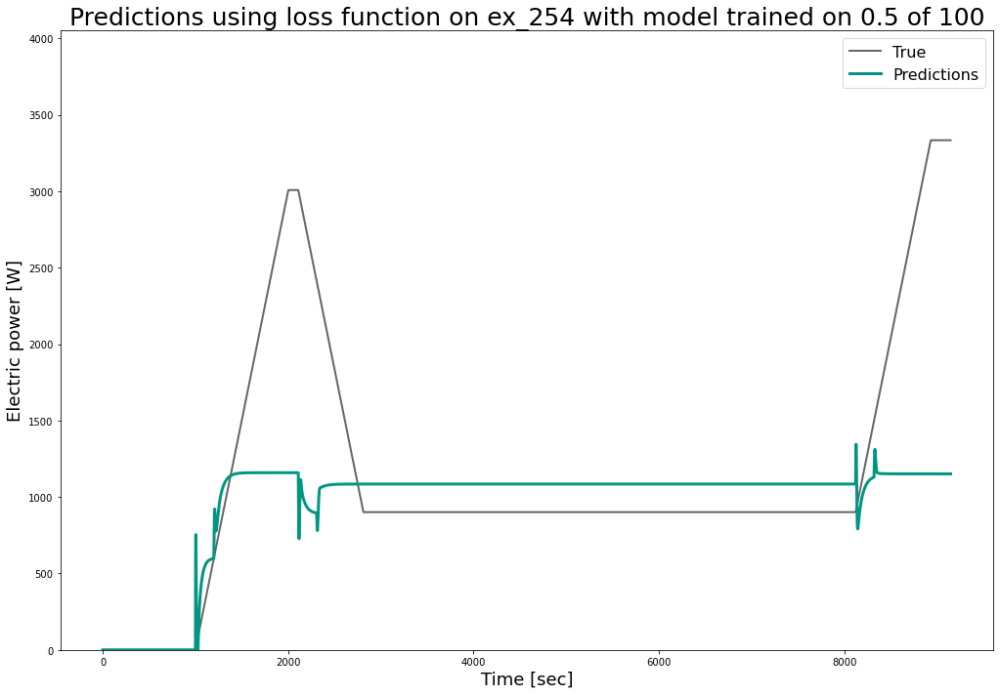

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


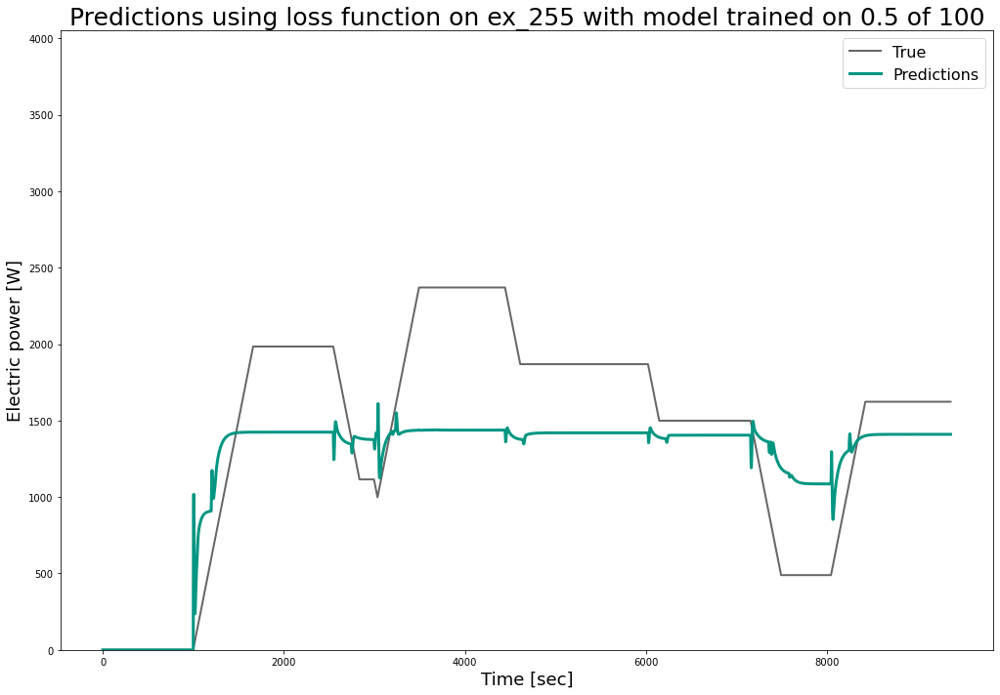

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


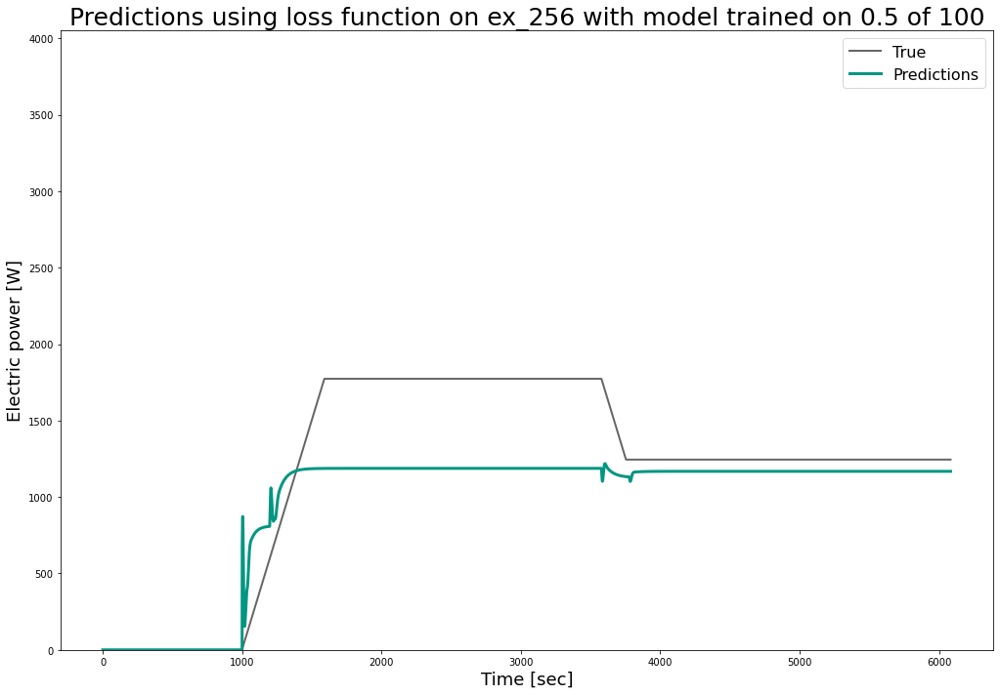

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


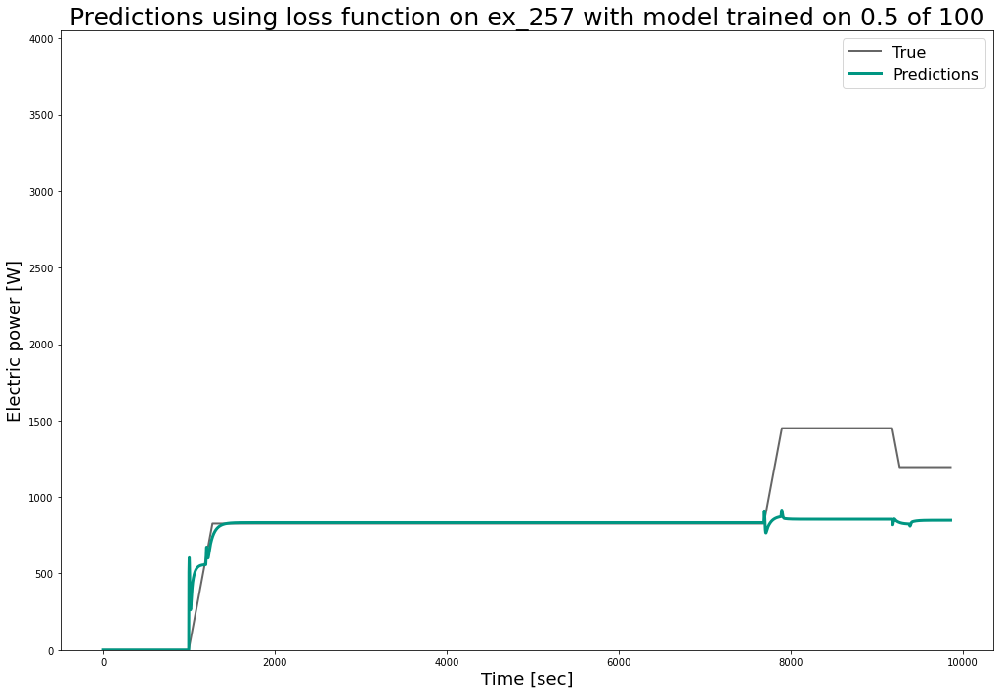

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


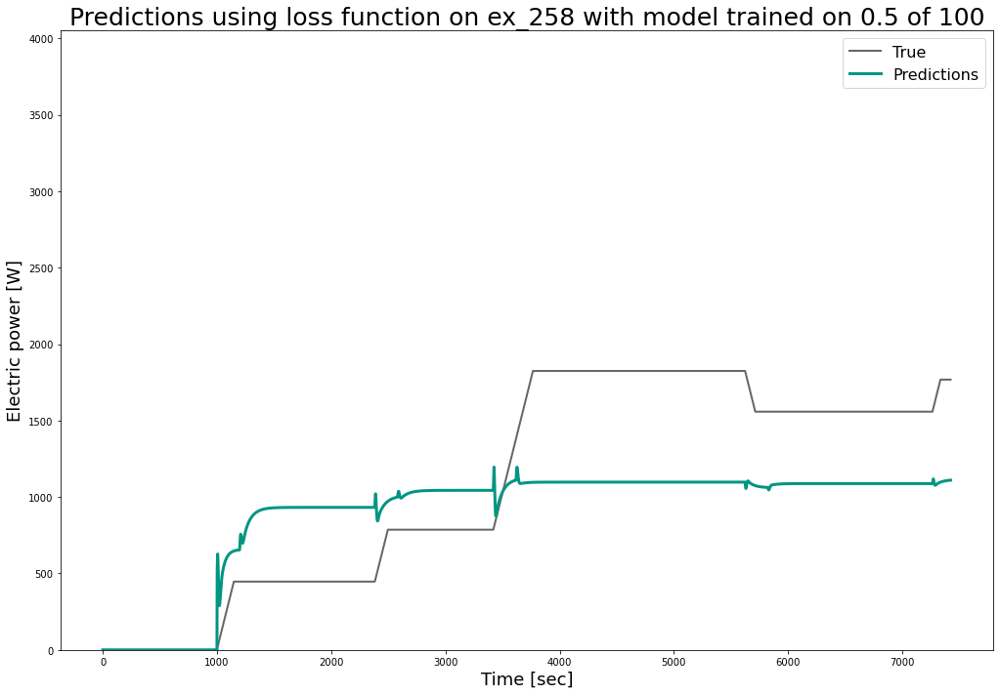

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


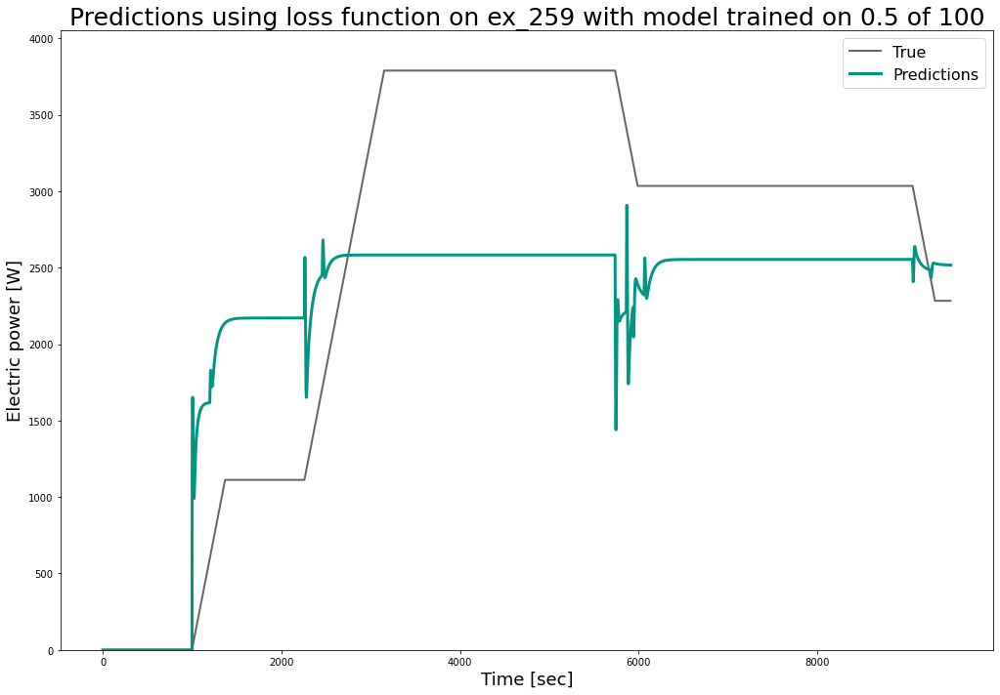

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


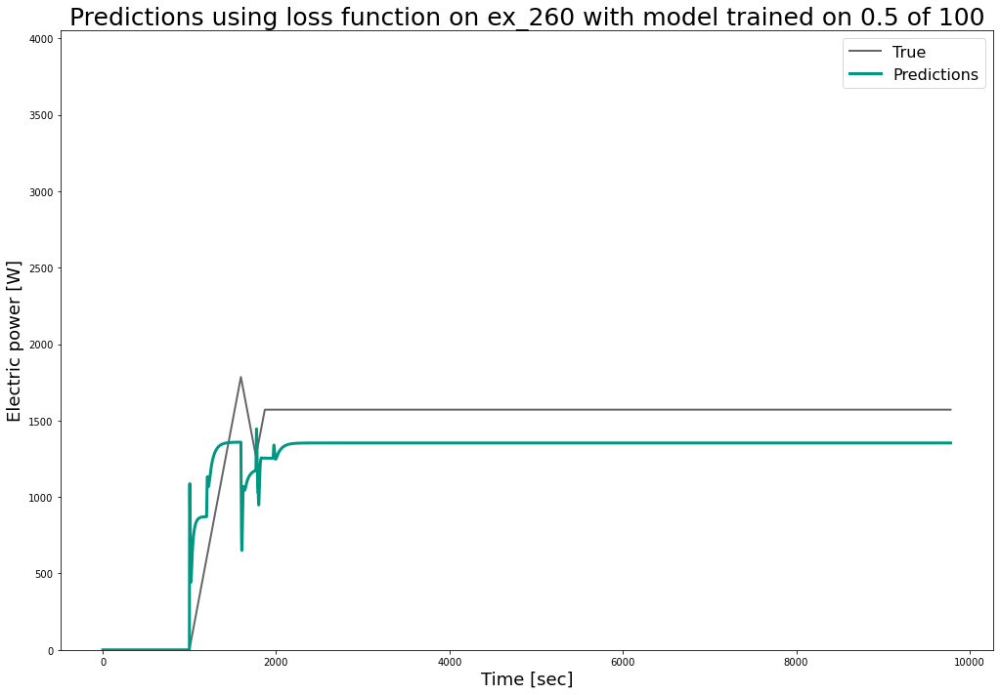

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


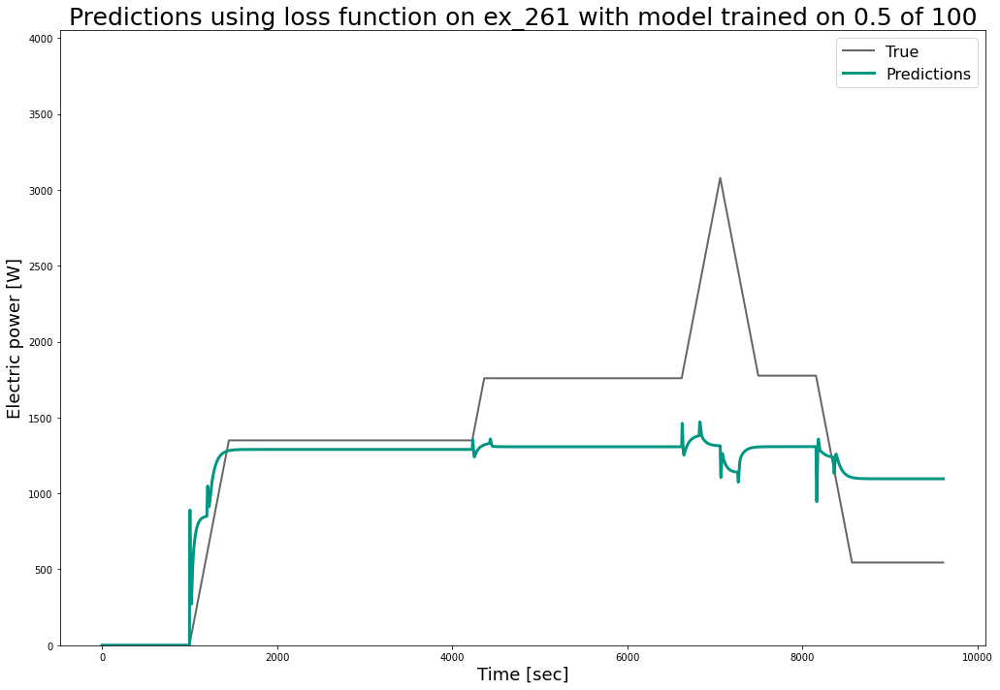

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


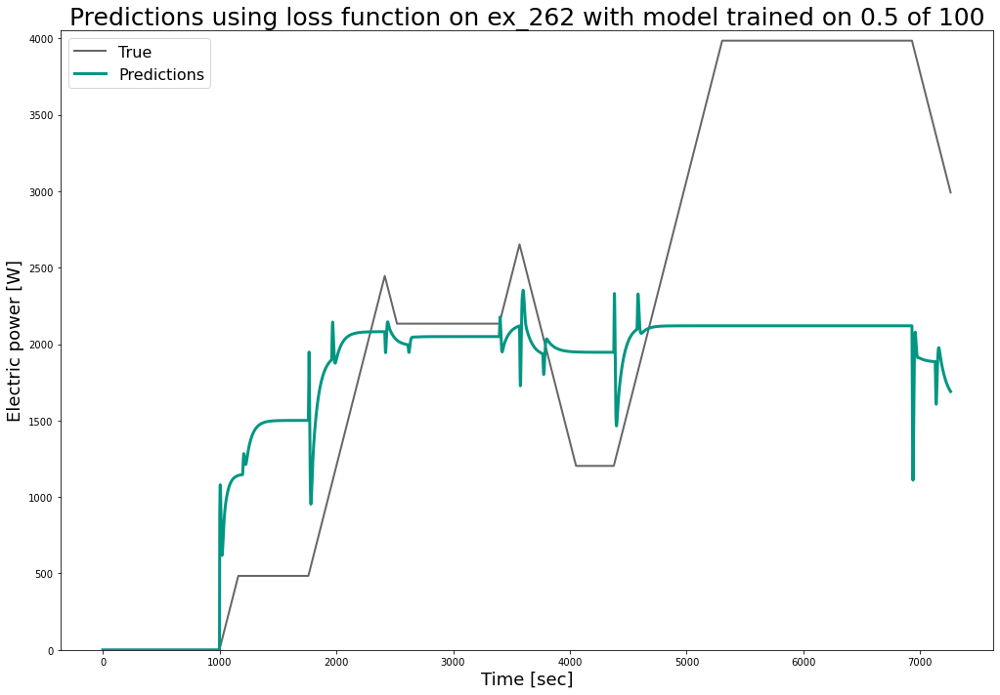

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


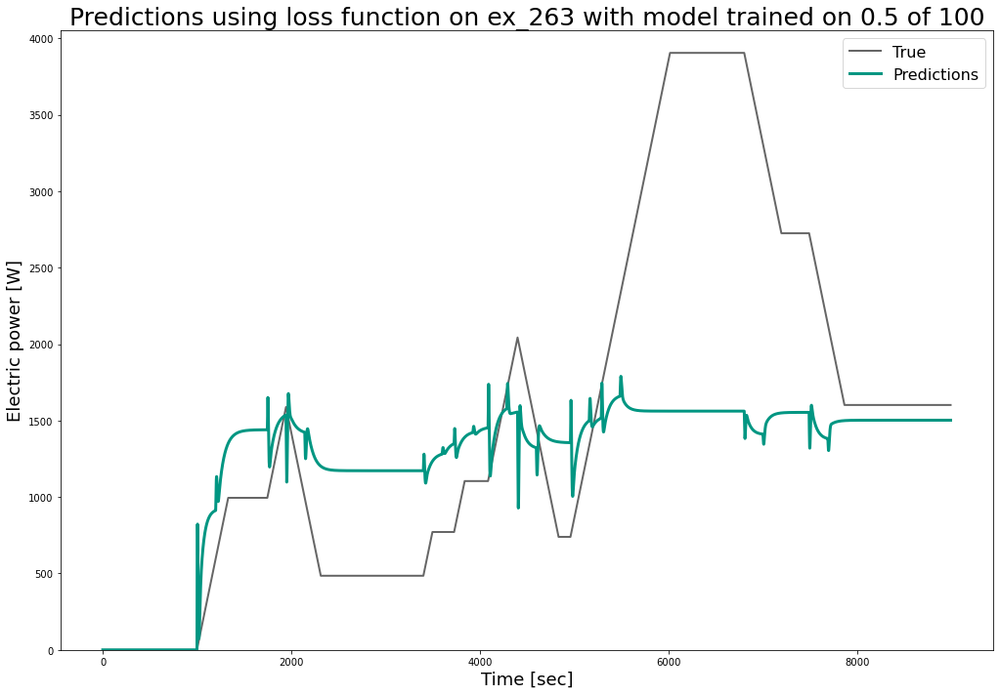

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


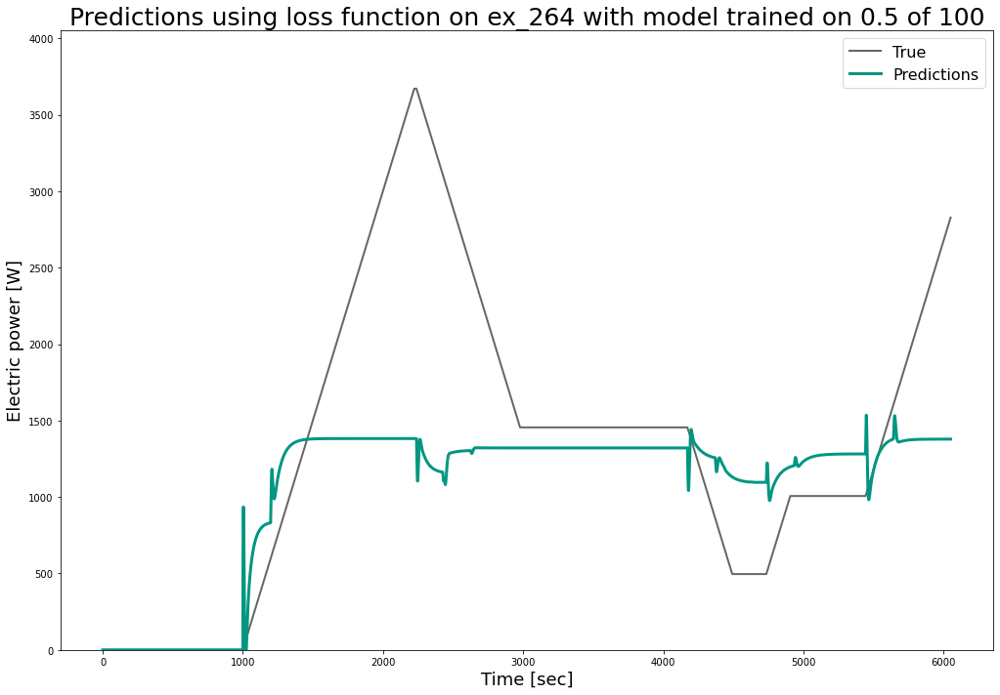

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


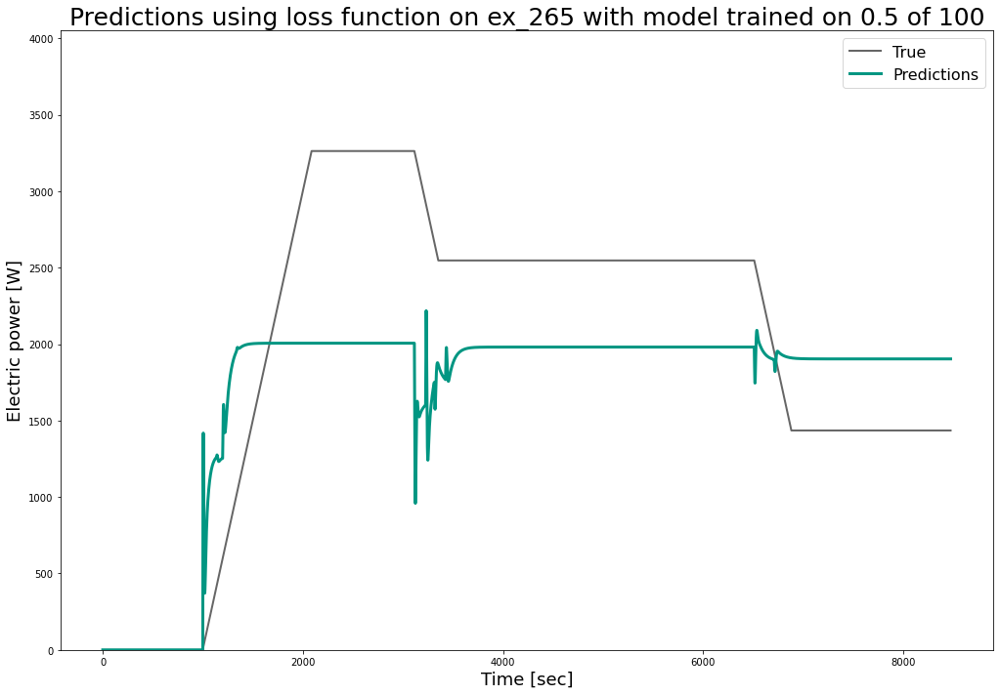

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


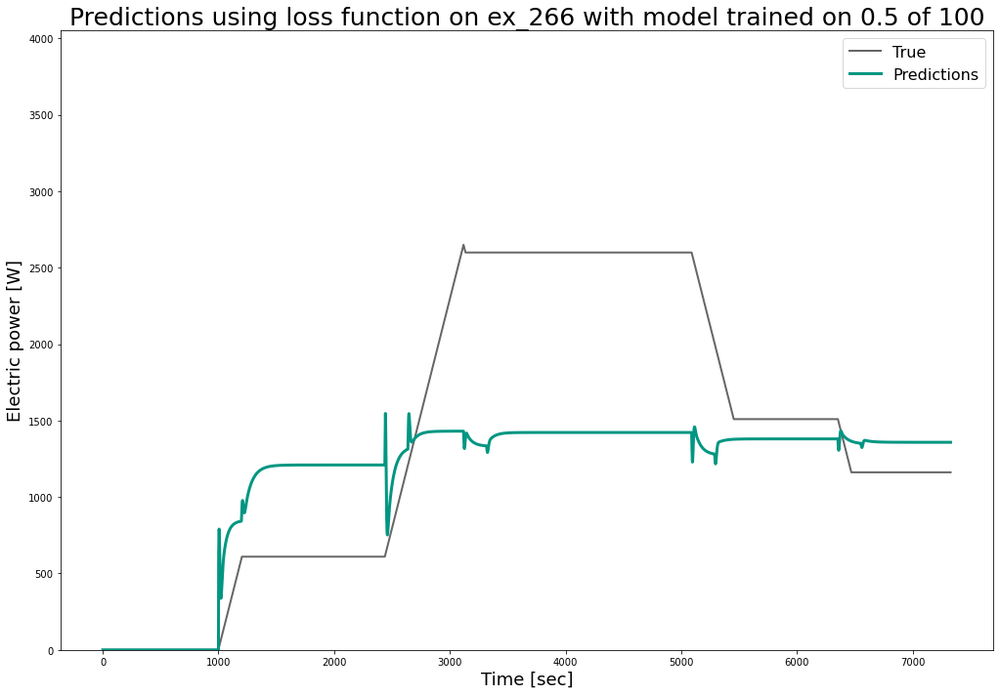

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


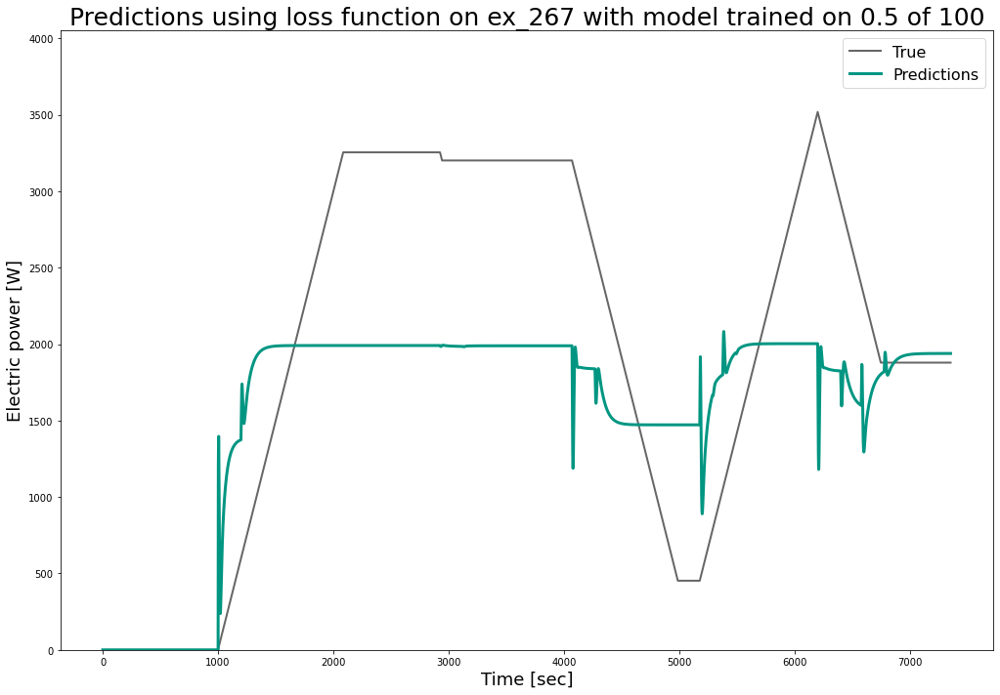

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


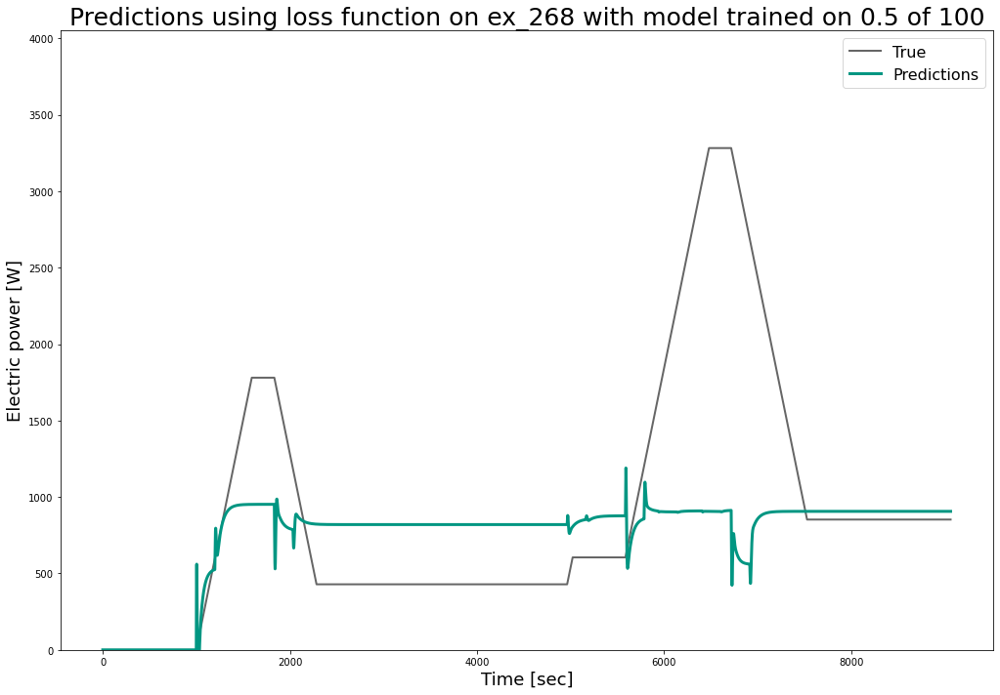

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


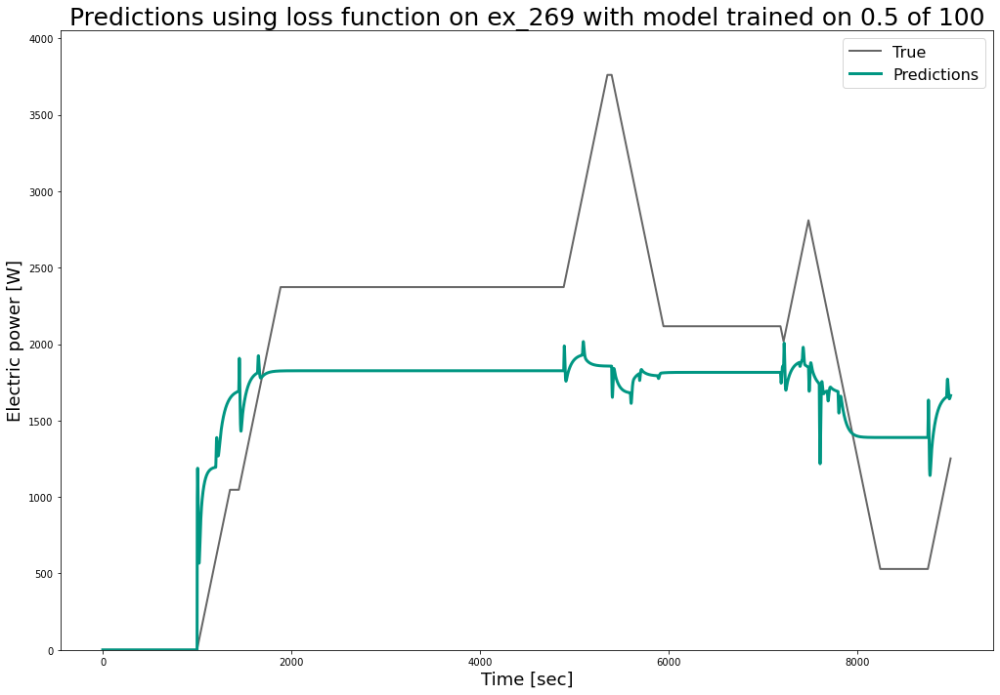

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


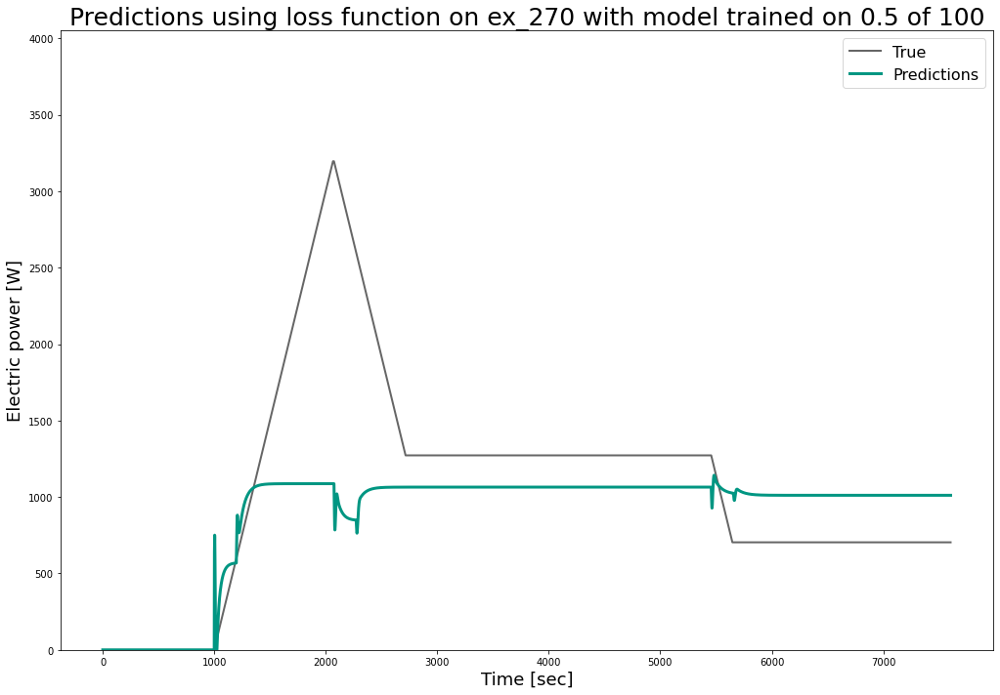

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


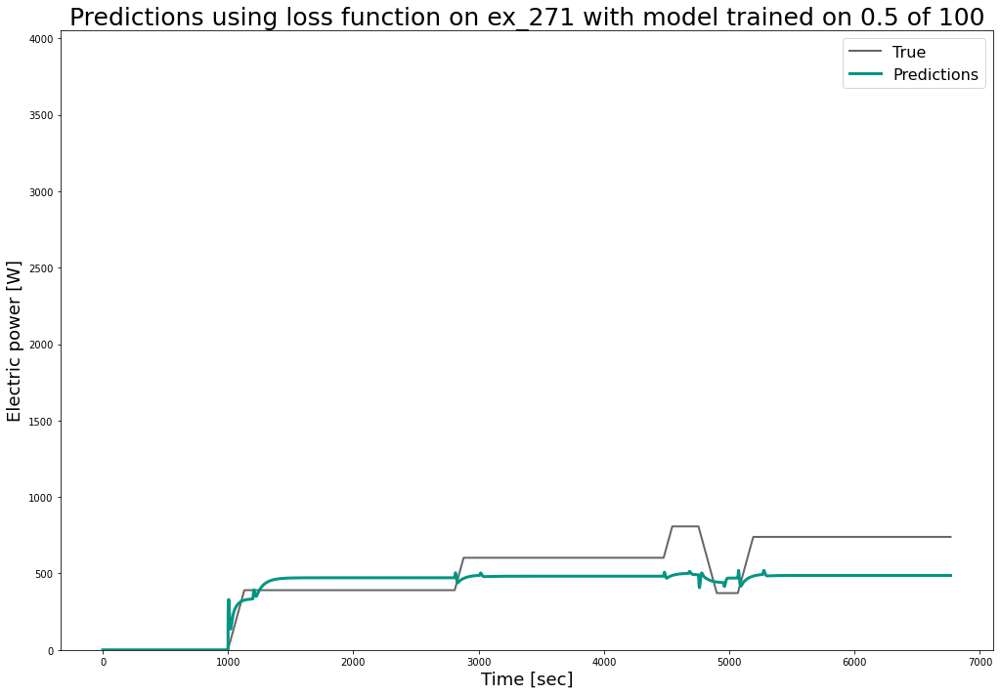

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


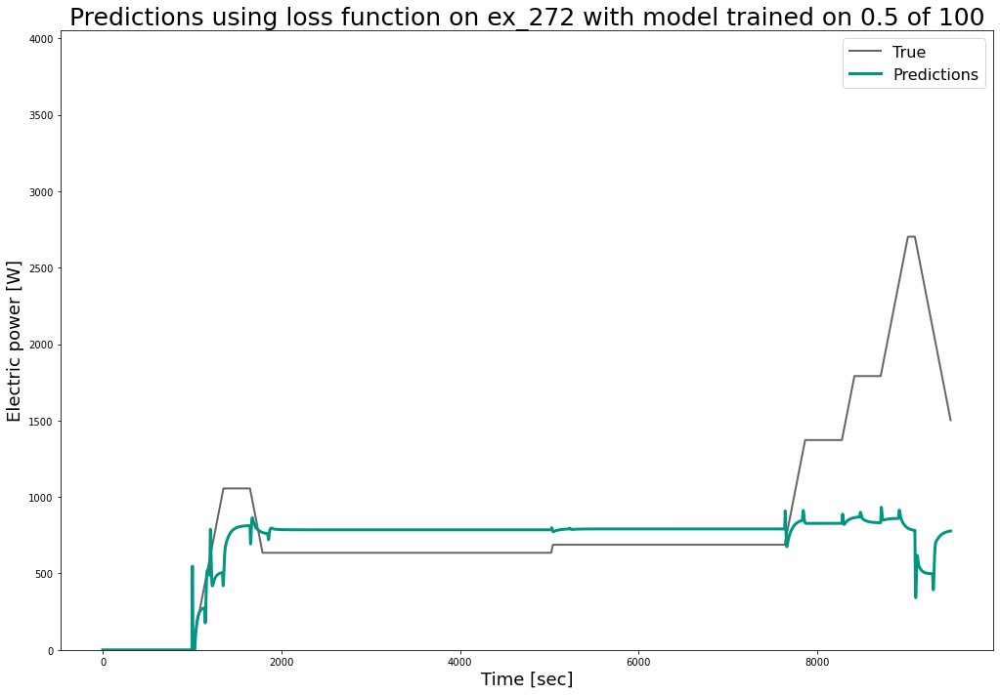

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


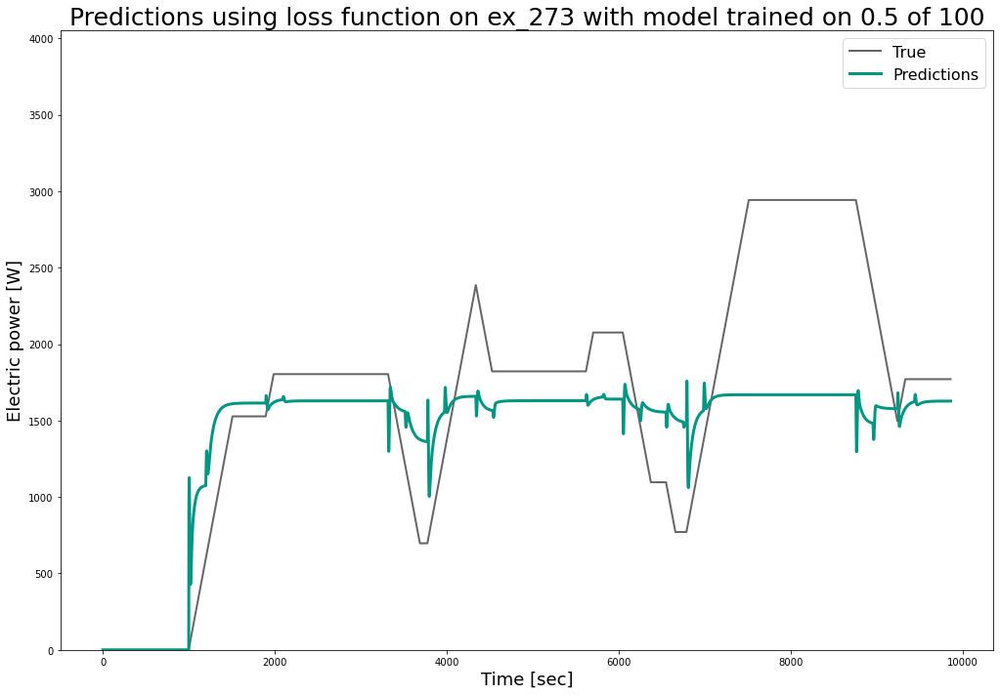

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


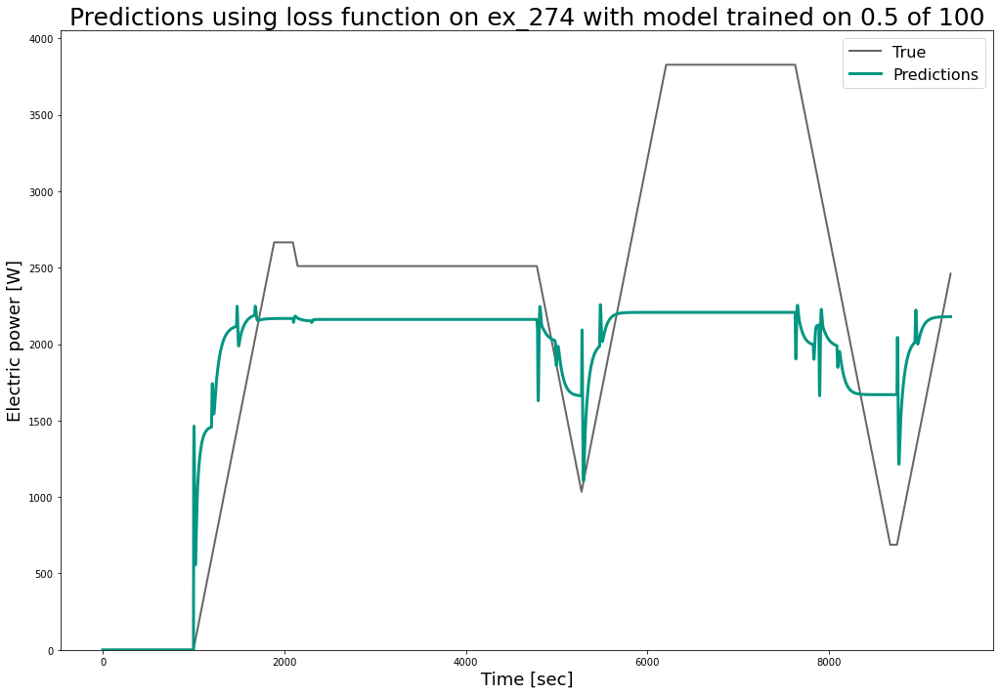

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


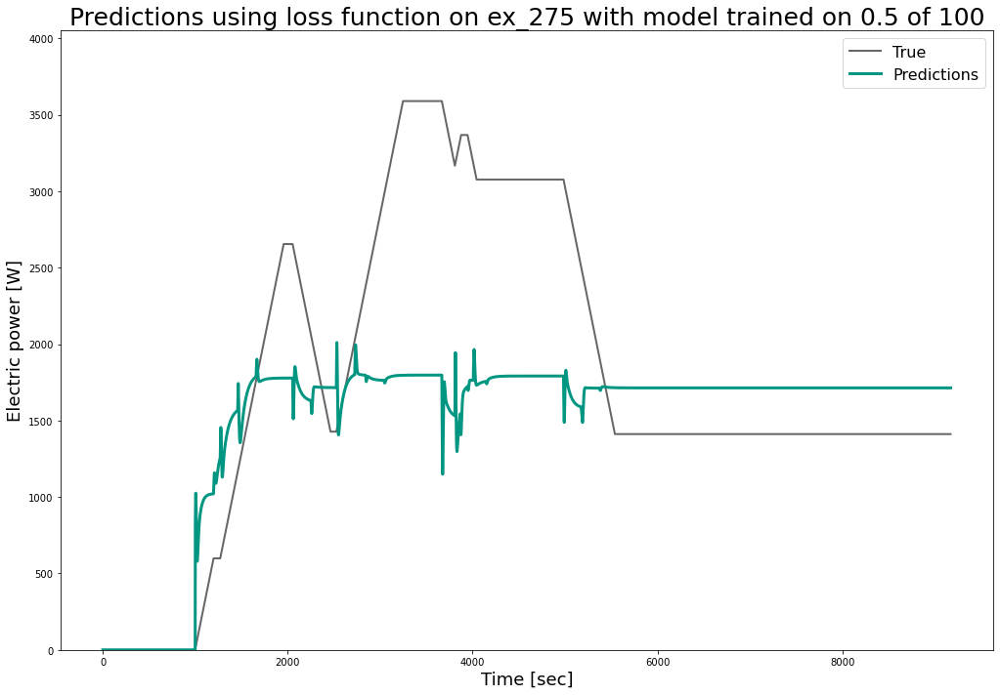

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


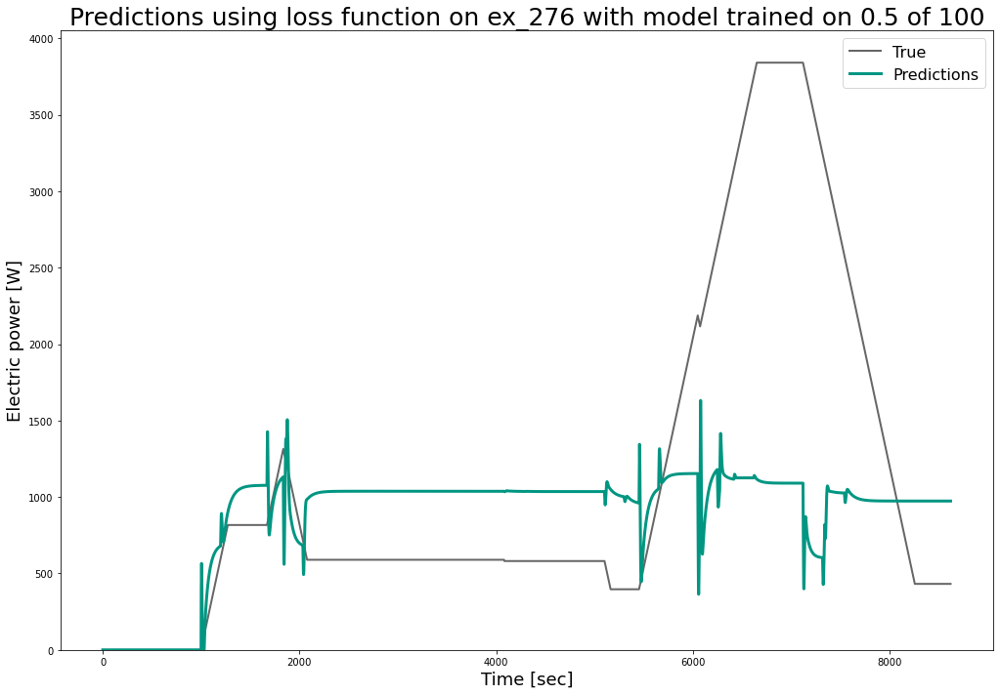

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


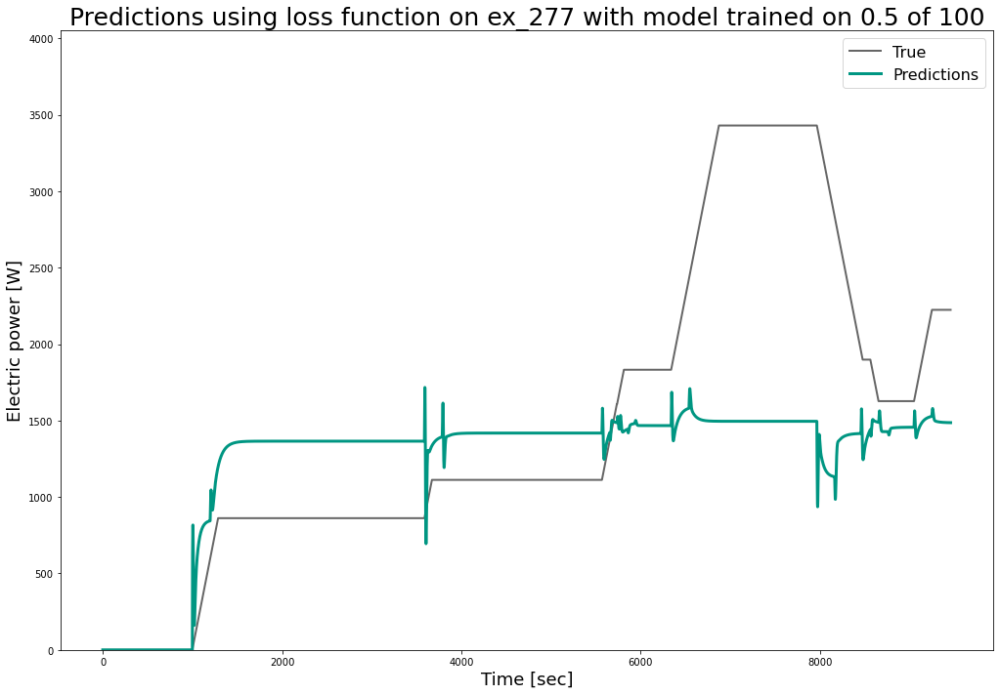

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


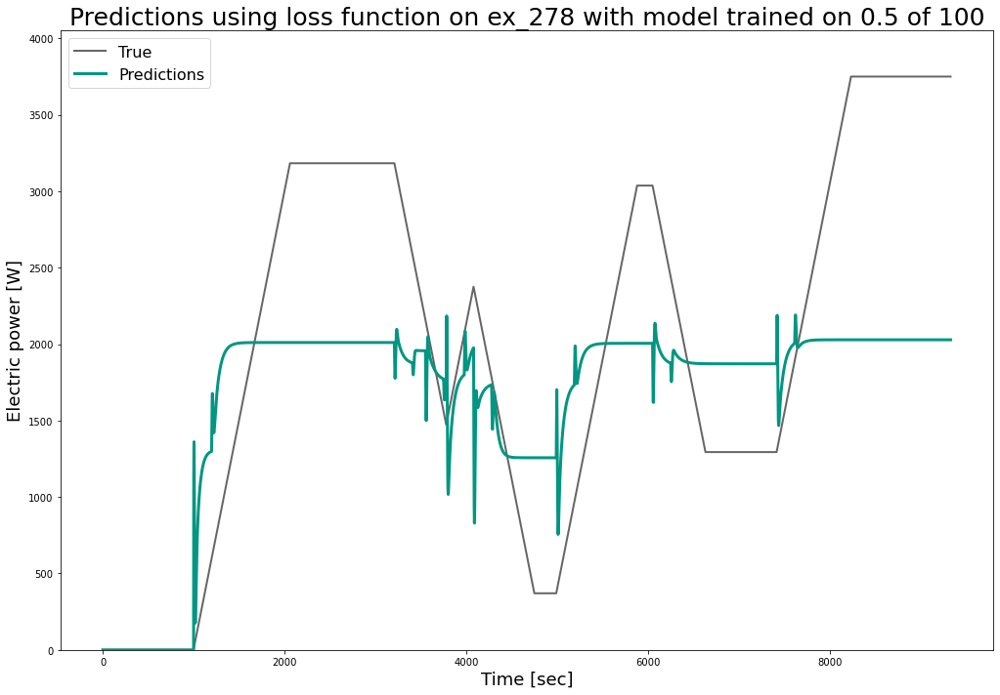

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


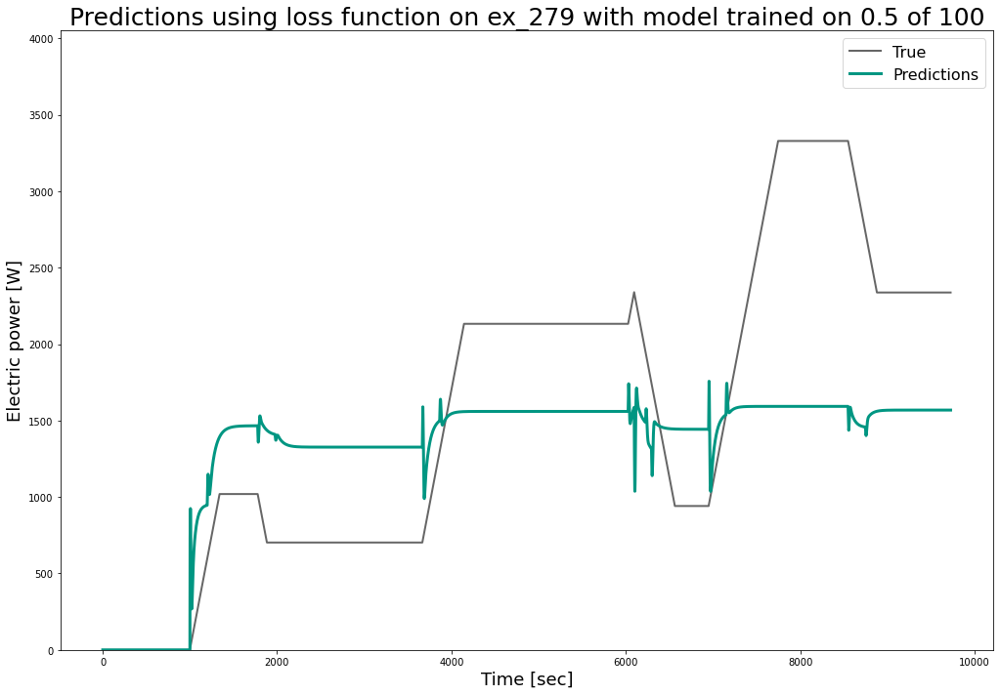

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


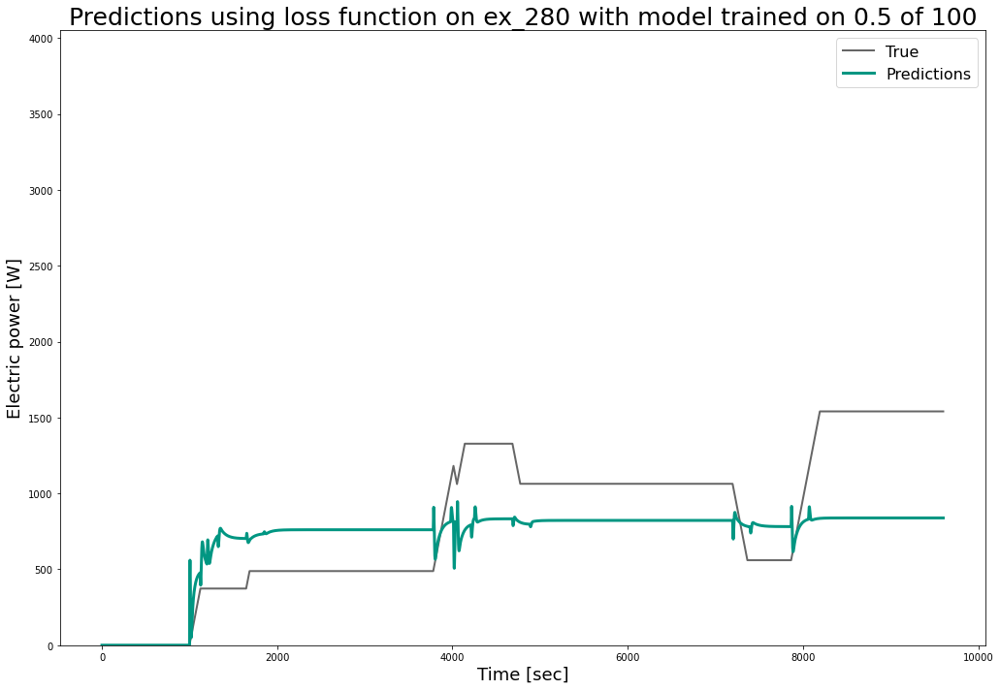

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


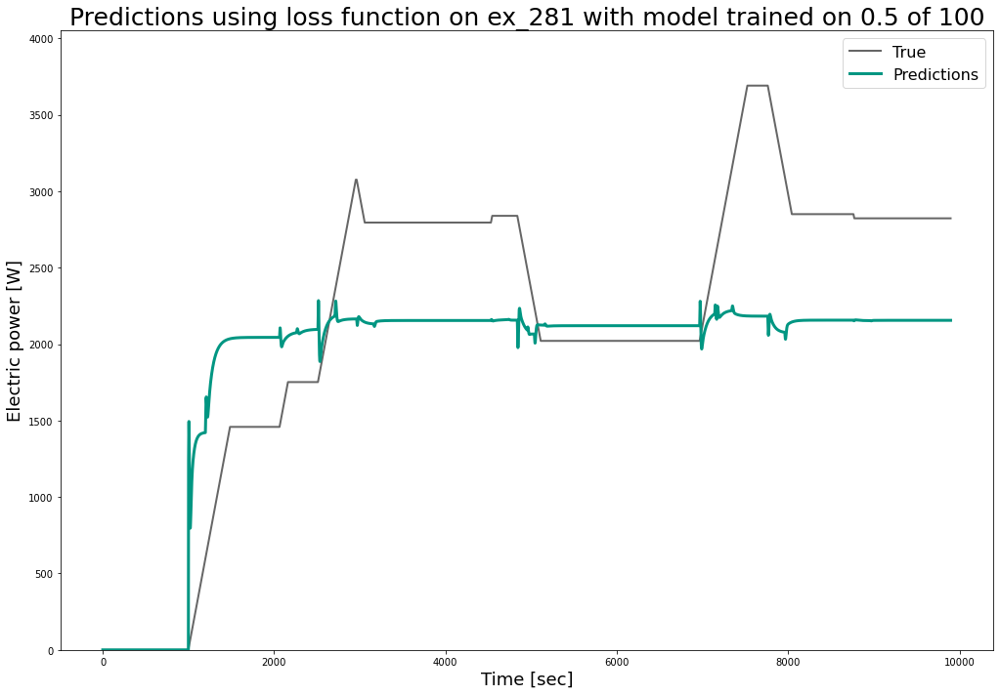

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


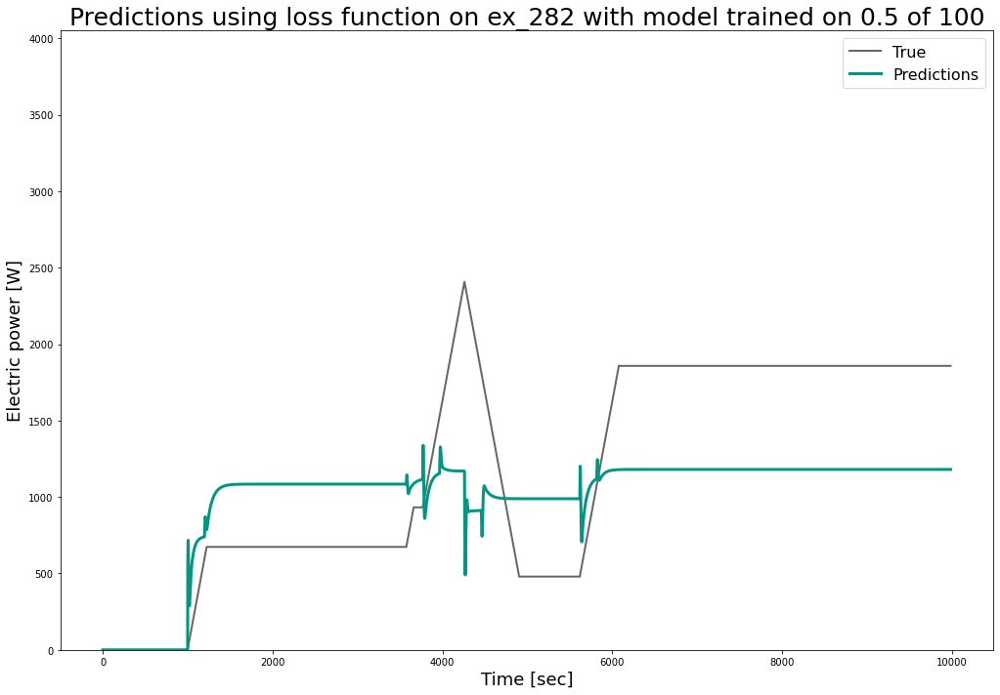

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


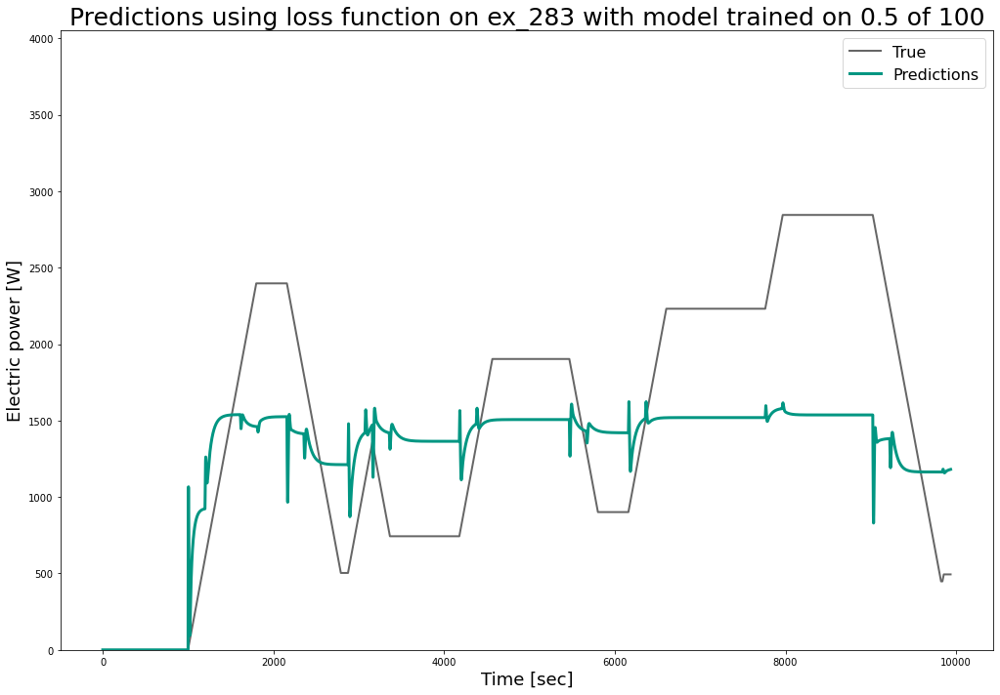

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


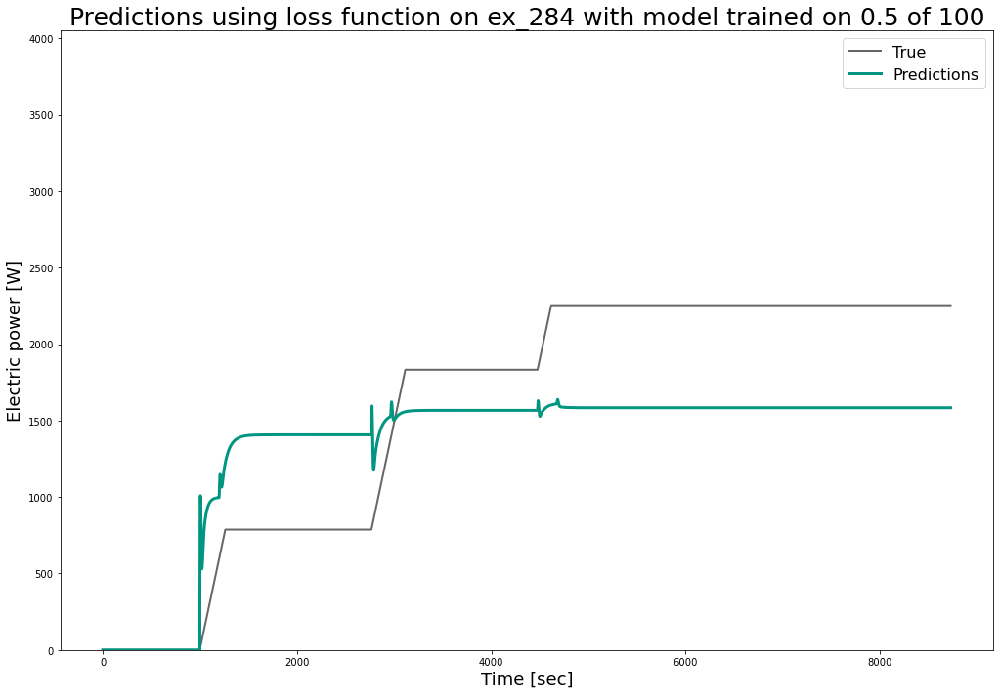

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


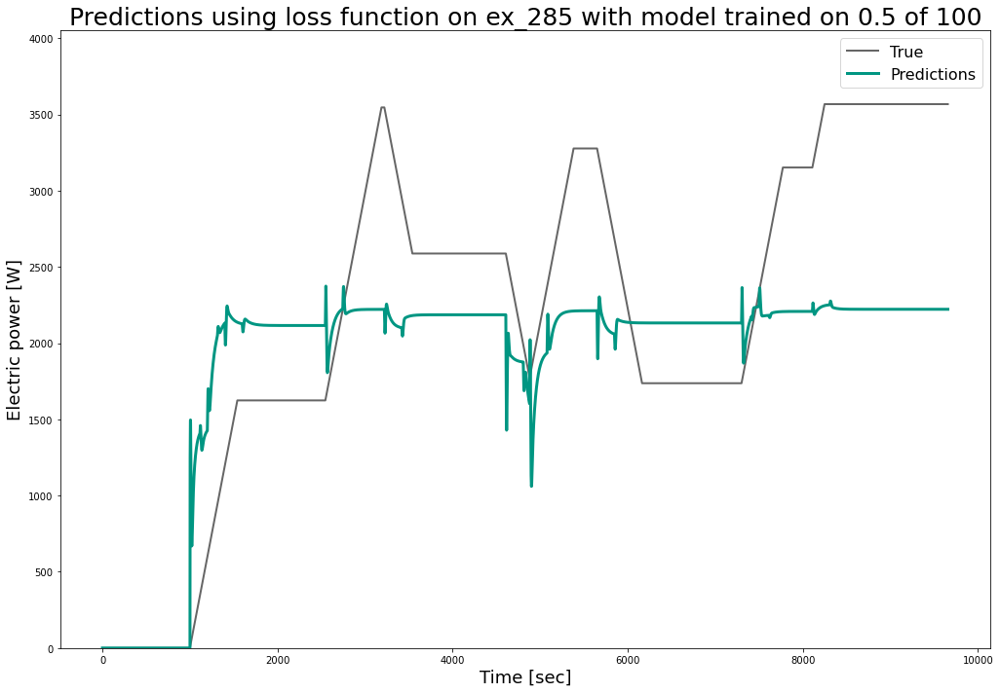

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


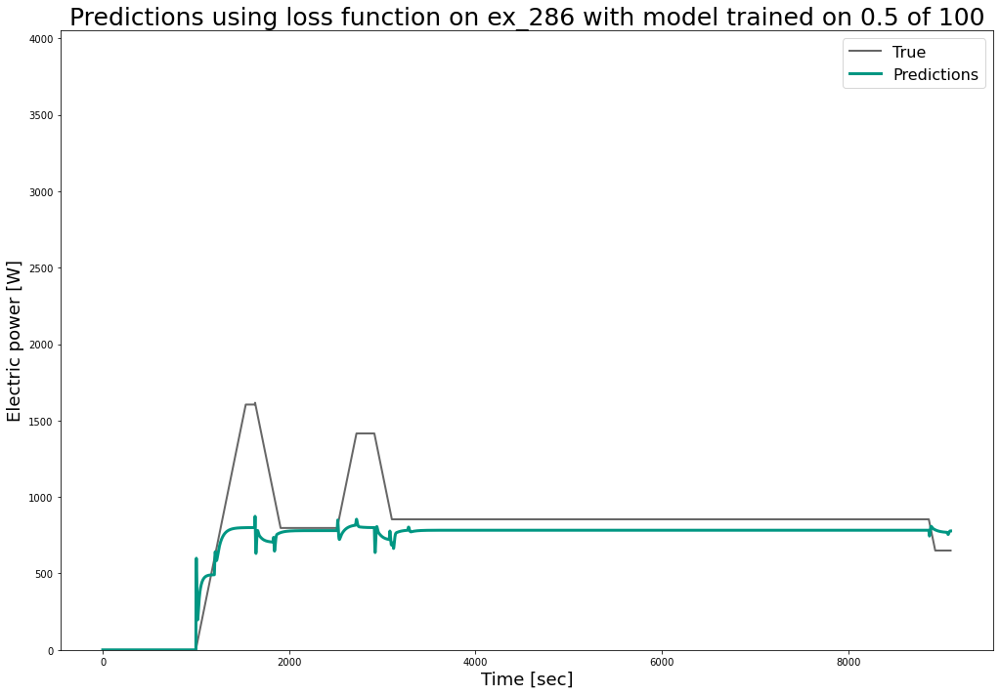

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


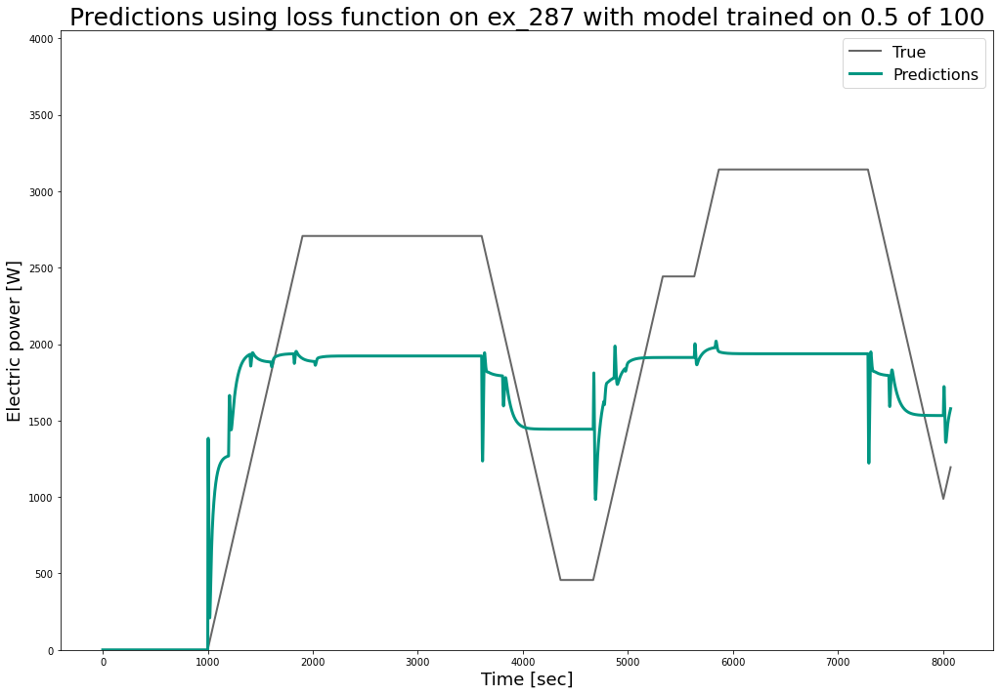

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


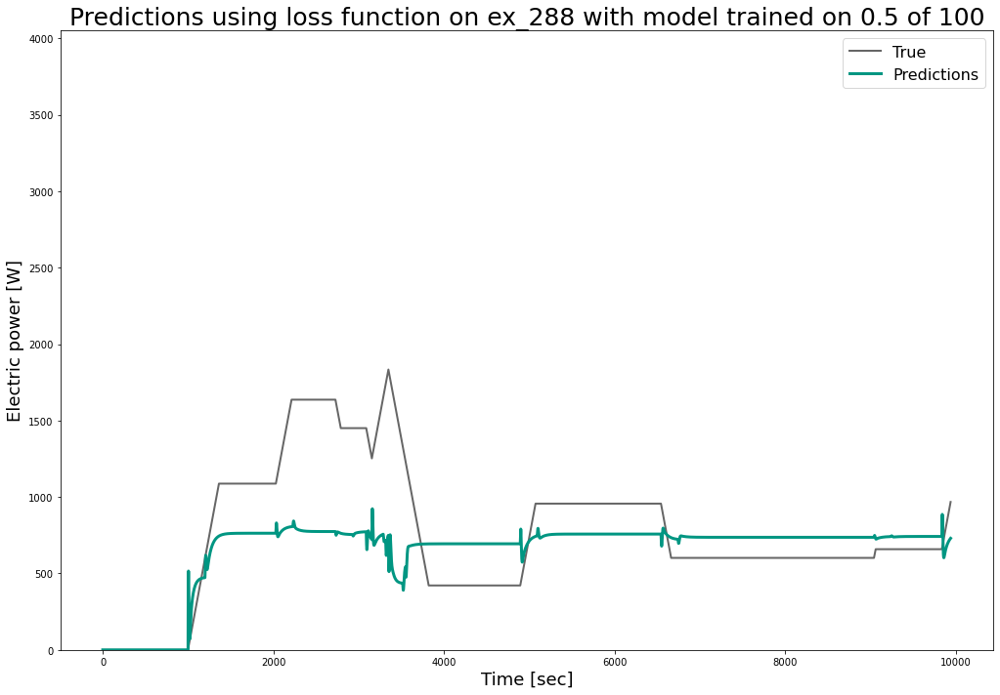

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


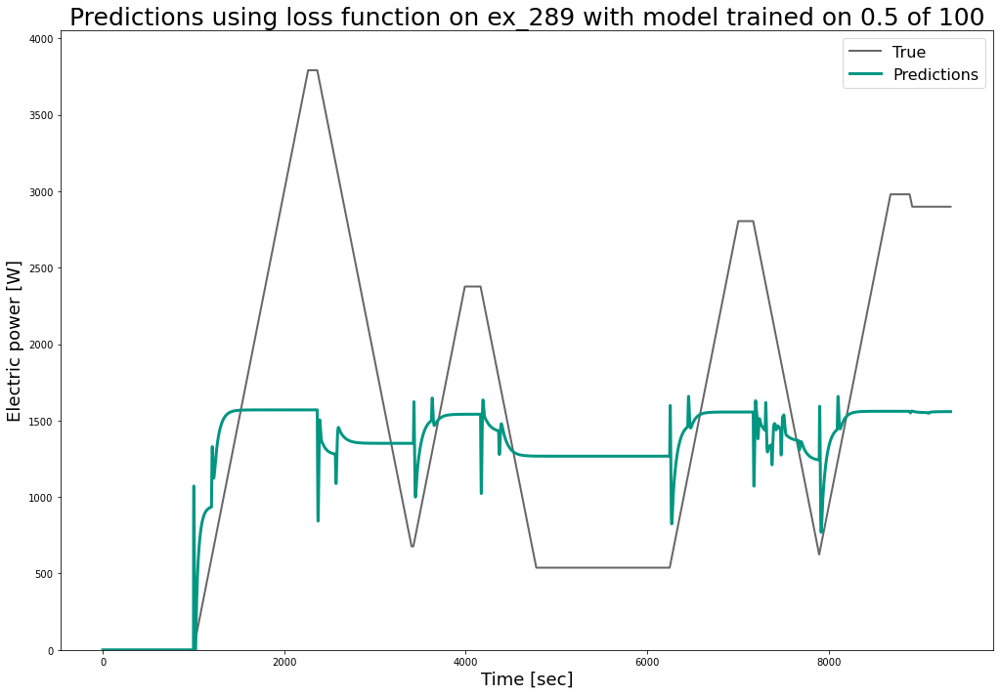

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


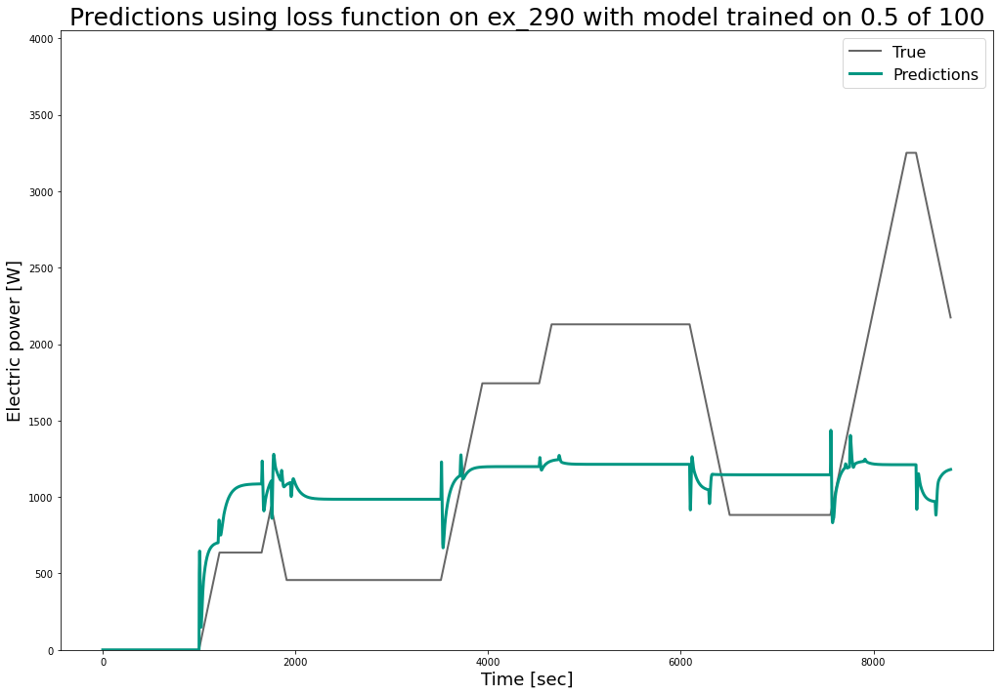

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


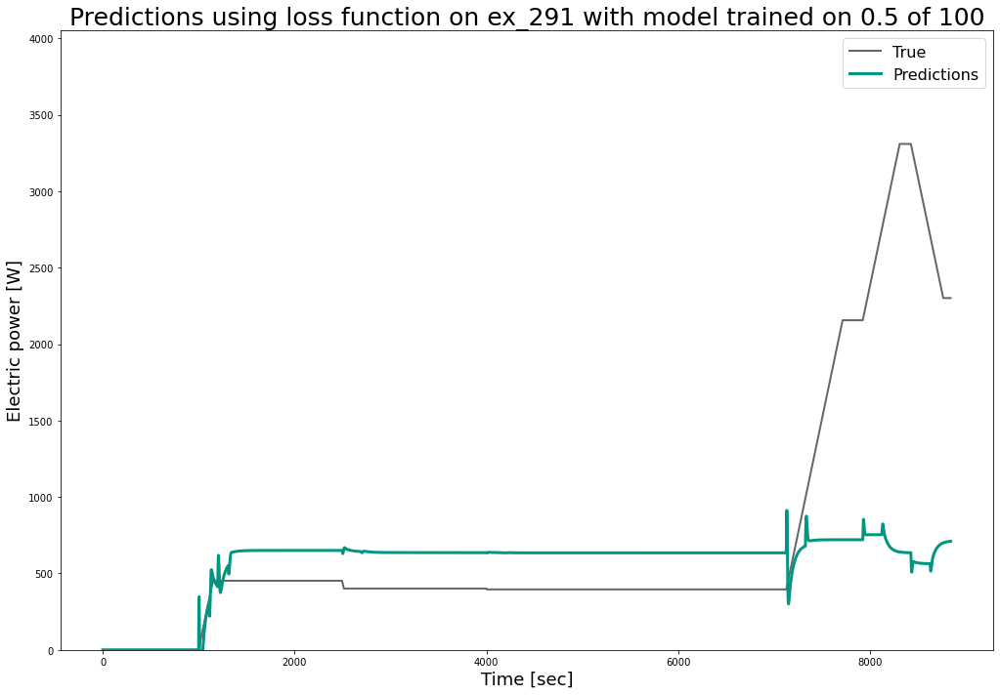

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


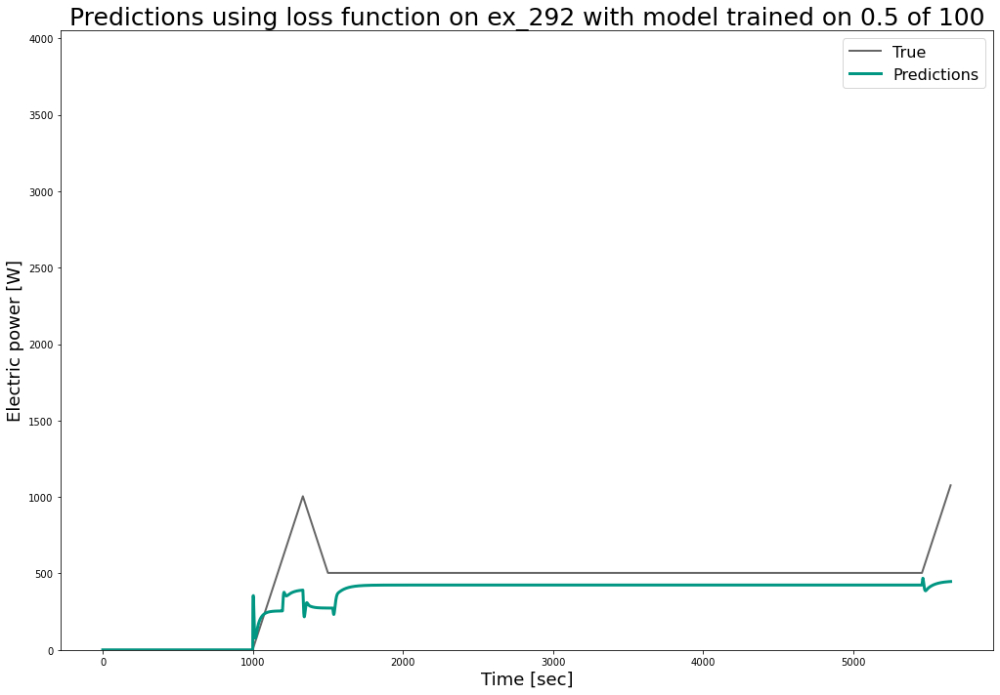

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


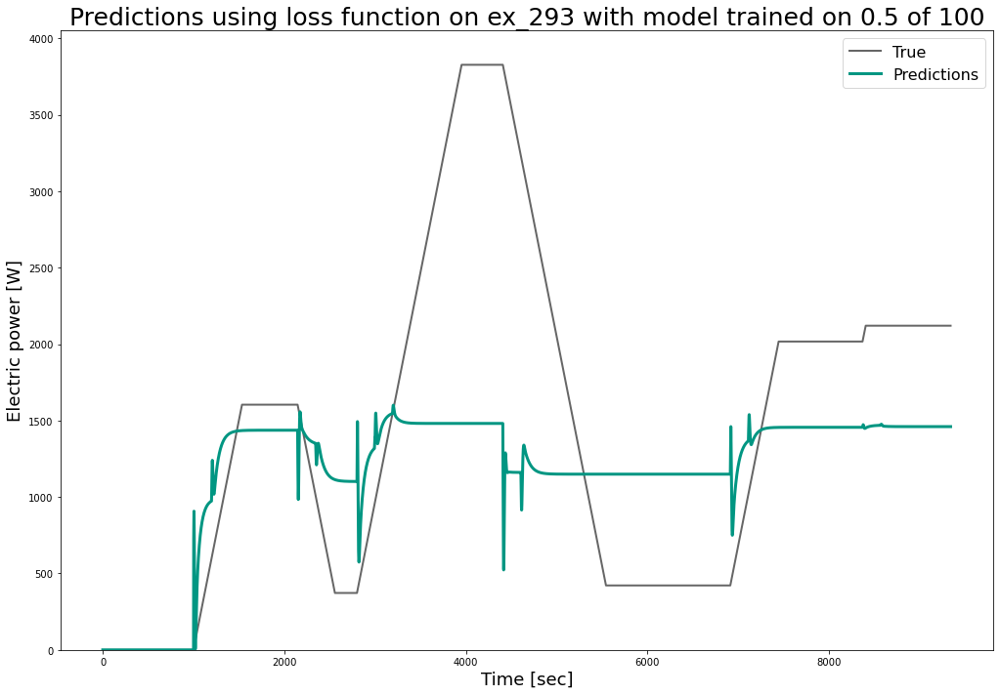

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


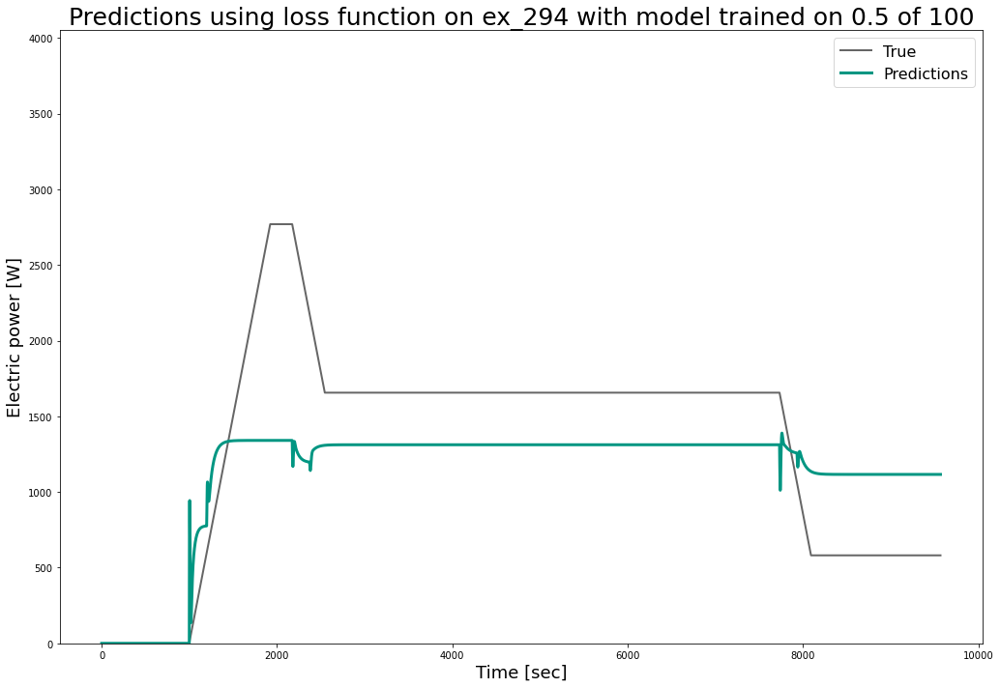

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


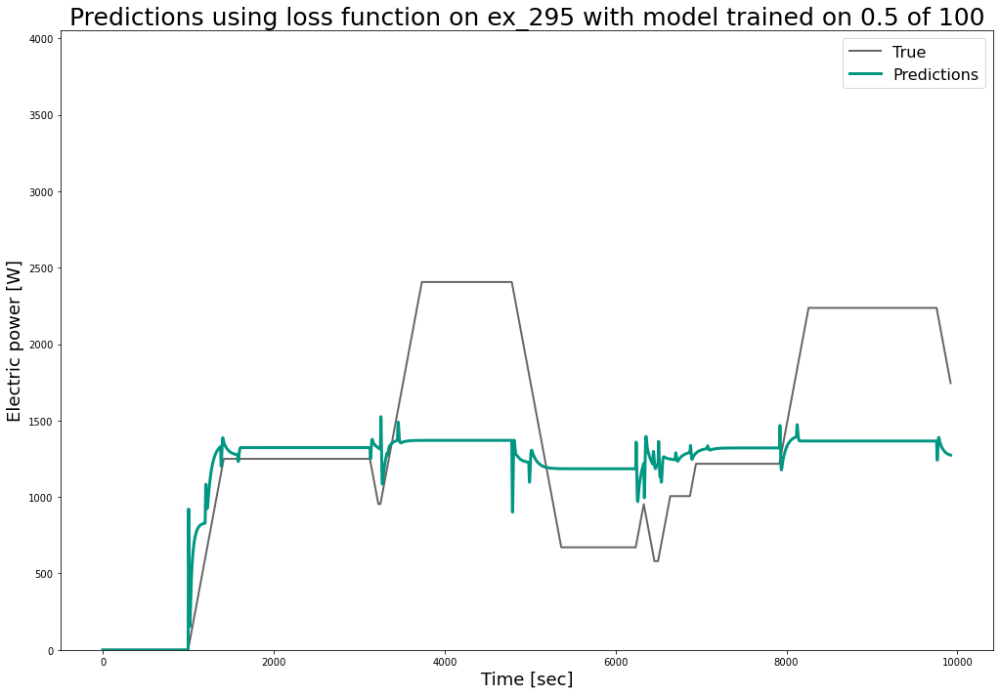

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


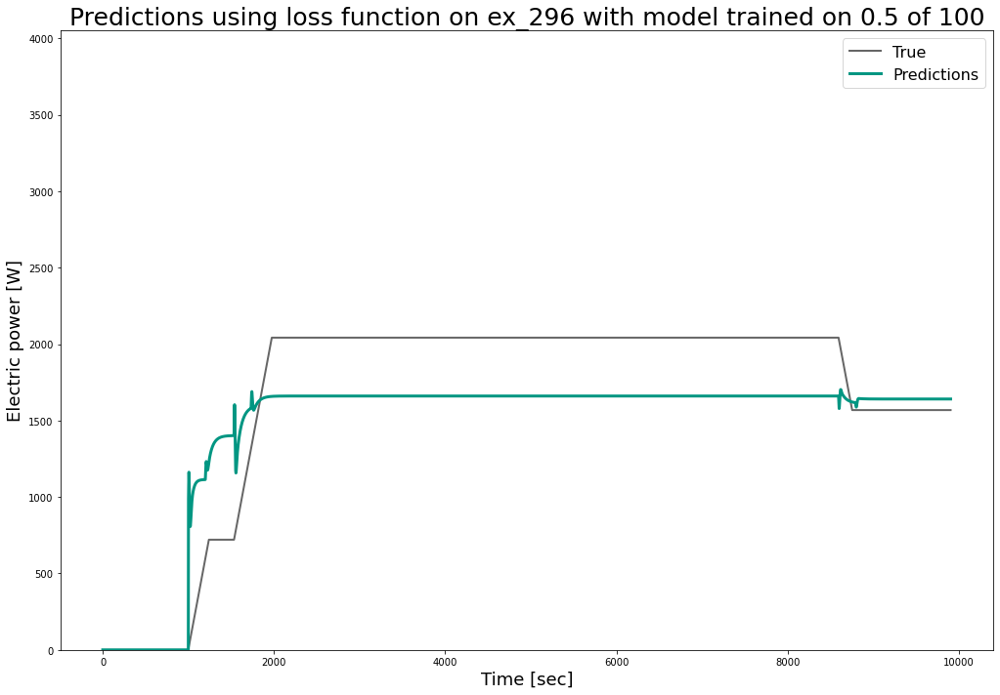

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


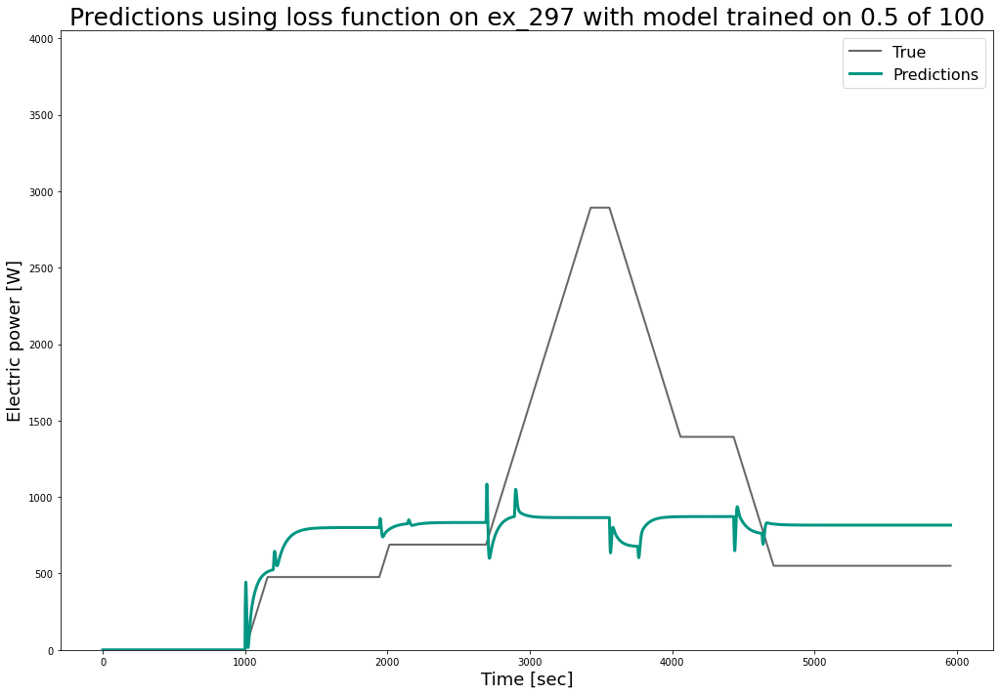

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


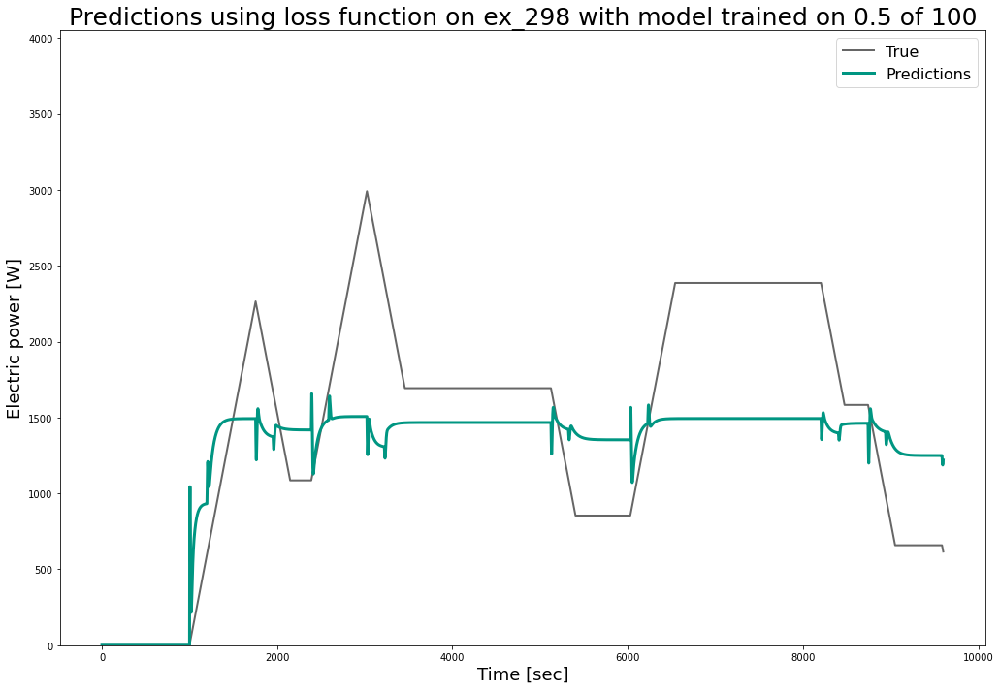

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


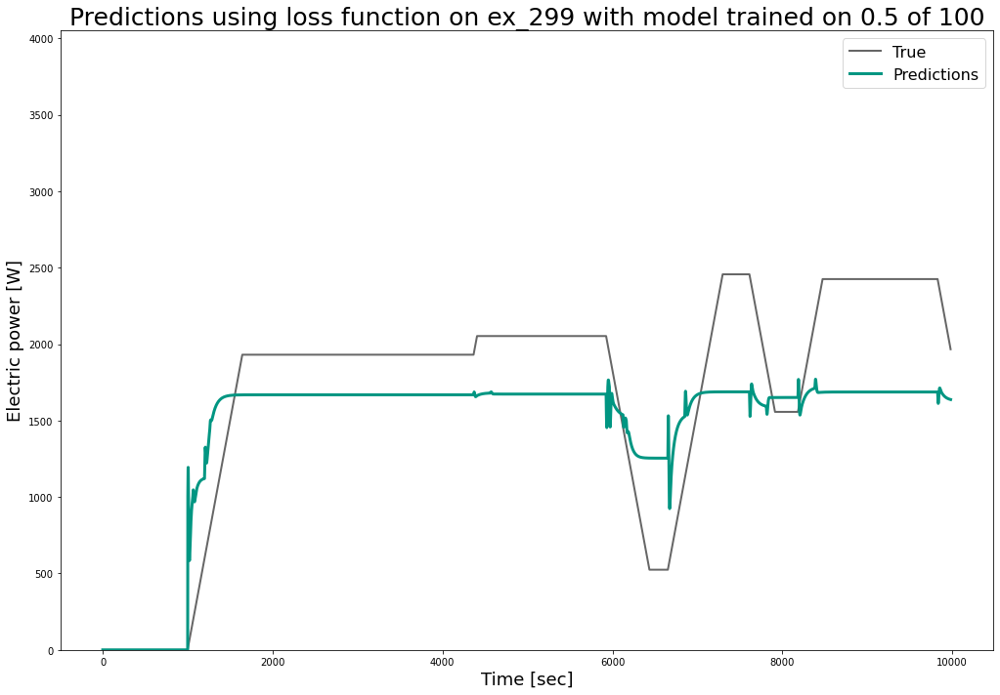

C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Data_Processing.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['diff'] = diffs


Folder already exists.


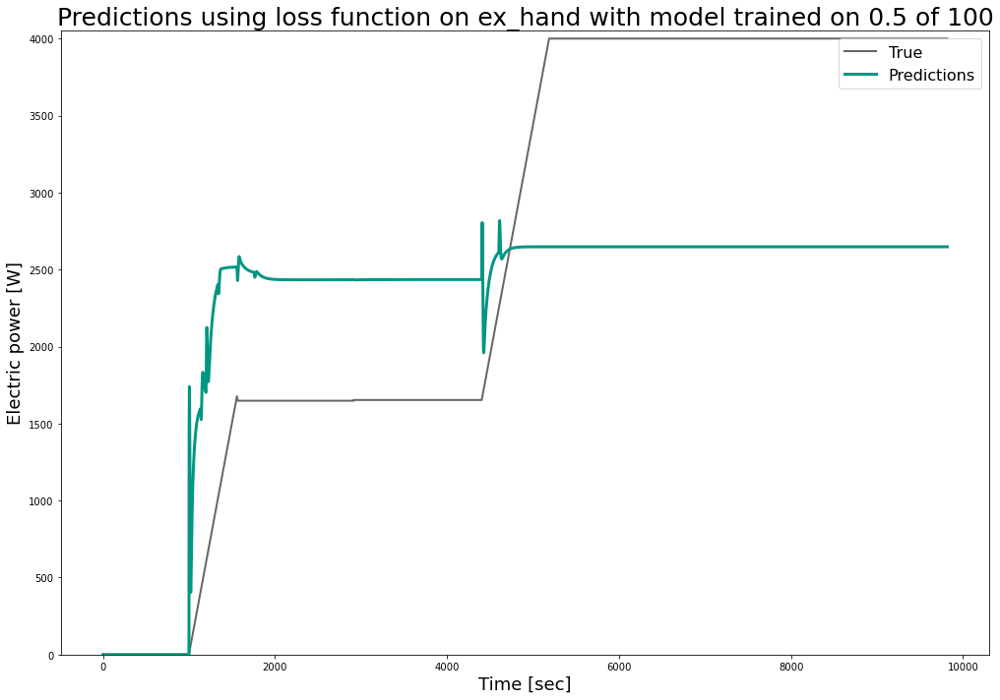

Training time:  45123.015538692474
Prediction time:  1848.1774995326996


,,rmse,r2,mae,maxae,rmse_scaled,r2_scaled,mae_scaled,maxae_scaled
diff,tgds,,,,,,,,
0,1,"[1033.4305404646034, 438.4492467850085, 662.86...","[0.3488692180404629, 0.6115614292719049, 0.482...","[854.4594931059487, 289.8458427826686, 537.180...","[2676.178955078125, 1400.263137674487, 1642.95...","[0.9693653690399925, 0.9582878235177793, 0.959...","[0.06033078130595926, 0.08168444729755753, 0.0...","[0.84608513524575, 0.6825510721637926, 0.83683...","[2.049644918715987, 2.568081291880623, 1.97797..."


In [17]:
IMAGE_folder = image_folder
MODEL_folder = model_folder

train_loss_model(parameters_diff, parameters_tgds, IMAGE_folder)